In [51]:
import numpy as np
from numba import jit,njit
import matplotlib.pyplot as plt
import cv2
import time
from sklearn.preprocessing import normalize
from scipy import signal
from scipy import sparse
import skimage
import tifffile as tiff
import os
import math
import operator
from com import *
from skeleton import *
from tqdm.notebook import tqdm
%config Completer.use_jedi = False

In [52]:
imgspath = r"/media/isis0517/QVO2/0511/01"
#imgspath = "/home/isis0517/Documents/data/imgs"

def getkey(x):
    temp = x.split("_")
    s = int(temp[-1].split(".")[0])
    return (temp[0], s)

flist = os.listdir(imgspath)
flist.sort(key=lambda x: (x[0:2], len(x), x))
print(len(flist))
data_len = len(flist)//2


80000


(400, 1500)


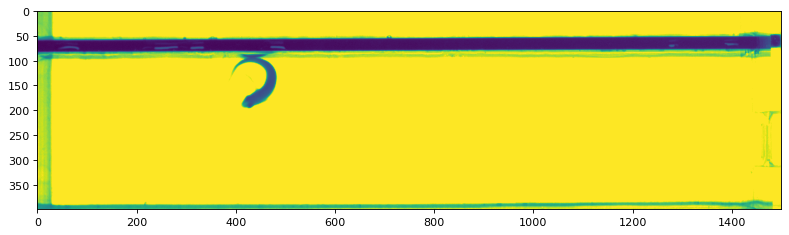

In [79]:
test_frame = np.load(os.path.join(imgspath, flist[25718+data_len]))
plt.figure(figsize=(12, 6), dpi=80)
plt.imshow(test_frame)
print(test_frame.shape)

# 找出ZebraPCA

## 產生背景

In [54]:
tnum = np.random.randint(data_len,size = data_len//10)
a = np.load(os.path.join(imgspath, flist[10+data_len]))
background = np.zeros(a.shape)
for s in tqdm(tnum):
    a = np.load(os.path.join(imgspath, flist[s+data_len]))
    a = cv2.blur(a, ksize=(3, 3))
    background += a
background = background/len(tnum)
background = background.astype('uint8')


  0%|          | 0/4000 [00:00<?, ?it/s]

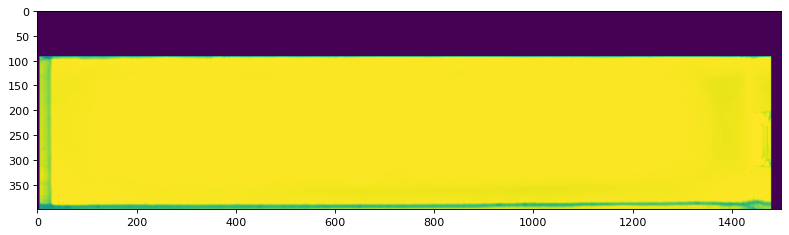

In [81]:
mask = np.full(background.shape, False)
mask[93:400,5:1480]=True
plt.figure(figsize=(12, 6), dpi=80)
plt.imshow(background*mask)

## 轉正圖片 & 儲存

### multi ver

In [171]:


%%time


def get_rot_M(angle):
    a = np.cos(angle)
    b = np.sin(angle)
    return np.array([[a,-b],[b,a]])

from multiprocessing import Pool
from numba import jit, njit
from skimage.measure import label

abs_lim = 90
def multi_rot_imgs(filename, background, mask, abs_lim):
    size = 120
    img = np.load(filename)
    img = cv2.absdiff(img, background)
    img = img*mask
    img = np.where(img>abs_lim, 255, 0).astype('uint8')
    pos = get_pos(img)
    img = cutting_img(img, pos, size)

    labels = label(img, connectivity=2, background=False)
    group = regionprops(labels)

    index = 0
    area = 0
    for com in group:
        if com.area > area:
            index = com.label
            area = com.area
    img = np.where(labels==index, 255, 0).astype('uint8')
    
    try:
        sk = NT_skeleton(img)
    except Exception as e:
        print(s, e)
        return s
        
    v1 = sk[0]-sk[2]
    a = v1/np.linalg.norm(v1, ord=2)
    b = np.array([1, 0])  # y, x
    c = a-b
    angle = 2*np.arcsin(np.linalg.norm(c/2))
    
    err = b-np.dot(get_rot_M(-angle), a) 
    b_len = np.linalg.norm(b)
    while np.linalg.norm(err) > b_len*0.1:
        angle=-angle
        err = b-np.dot(get_rot_M(-angle), a)
        
    if angle != angle:
        print("算錯啦")
        print(sk)
    M = cv2.getRotationMatrix2D((size, size), -angle/(np.pi)*180, 1)
    rotated = cv2.warpAffine(img, M, (2*size+1,2*size+1))
    
    return rotated, angle, pos


with Pool() as pool:
    map_arr = []
    for s in range(data_len):
        path = os.path.join(imgspath, flist[s+data_len])
        map_arr.append((path, background, mask, abs_lim))
    print("pool start")
    result = pool.starmap(multi_rot_imgs, map_arr)

imgs = []
h_ans = []
poses = []
print("stop")
for temp in result:
    imgs.append(temp[0])
    h_ans.append(temp[1])
    poses.append(temp[2])

pool start
stop
CPU times: user 2.78 s, sys: 3.53 s, total: 6.31 s
Wall time: 1min 59s


-77.12499844038753 [179 120]


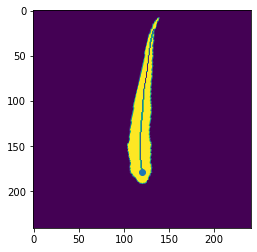

In [172]:
s = 1020   
sk = NT_skeleton(imgs[s], er_num=2, di_num=3)

draw = imgs[s].copy()
for n in range(len(sk)-1):
    cv2.line(draw, (sk[n, 1], sk[n, 0]), (sk[n+1, 1], sk[n+1, 0]), (0), 1)
print(h_ans[s]/(np.pi)*180, sk[0])
plt.imshow(draw)
plt.scatter(sk[0,1], sk[0,0])
#plt.plot(*np.flip(sk, axis=1).T, lw=1.3, color='r')
#plt.axis('off')
#plt.imshow(np.load(os.path.join(imgspath, flist[s+data_len])))

### save as video

In [173]:
%%script false --no-raise-error
video = cv2.VideoWriter("path.avi", cv2.VideoWriter_fourcc(*"MJPG"), 10, (background.shape[1], background.shape[0]))

for s in tqdm(range(data_len)):
    draw = np.load(os.path.join(imgspath, flist[s+data_len]))
    draw = cv2.cvtColor(draw, cv2.COLOR_GRAY2RGB)
    cv2.circle(draw, (poses[s][1], poses[s][0]), 3, (255,0,0), -1)
    video.write(draw)
video.release()

## apply the eigenfish

In [174]:
def an2vec(an, r):
    x = np.cos(an)
    y = np.sin(an)
    return r*np.array([x,y])

def get_rot_M(angle):
    a = np.cos(angle)
    b = np.sin(angle)
    return np.array([[a,-b],[b,a]])

def an2ori(an_sk, vec=np.array([0,1]), intens=1):
    test_sk = [vec]
    for i in range(len(an_sk)):
        vec = np.dot(vec,get_rot_M(an_sk[i]*intens))
        test_sk.append(test_sk[-1]+vec)

    return np.array(test_sk)



han_sks=[]

for s, img in enumerate(tqdm(imgs)):
    
    sk = NT_skeleton(img, er_num=2, di_num=3)
    
    vec_sk = []
    for i in range(len(sk)-1):
        vec_sk.append(sk[i+1]-sk[i])
    if len(sk)<10:
        plt.imshow(imgs[s])
        print("sk error")
        print(s, NT_skeleton(imgs[s]))
        plt.show()
        break
    
    heading = vec_sk[0]
    han_sk=[]
    
    heading = heading/np.linalg.norm(heading)
    for vec in vec_sk[1:]:
        vec = vec/np.linalg.norm(vec)
        a = heading
        b = vec

        #根據和角公式 = sin(a-b) = sina cosb - cosa sinb
        #sin(angle) = a[1]b[0]-a[0]b[1]
        c = a-b
        angle = 2*np.arcsin(np.linalg.norm(c/2))
        if angle != angle:
            print("算錯啦")
            print(s, vec_sk)
            break
            
        err = b-np.dot(a, get_rot_M(angle)) 
        b_len = np.linalg.norm(b)
        while np.linalg.norm(err) > b_len*0.1:
            angle=-angle
            err = b-np.dot(a, get_rot_M(angle))
            
        han_sk.append(angle)
    han_sks.append(han_sk)
print(len(han_sks))    


## 20000張 1:25

  0%|          | 0/40000 [00:00<?, ?it/s]

40000


In [175]:
%%script false --no-raise-error
def NT_skeleton_t(img, **kwargs):
    """

    :param img: the img of the zebrafish, it must be uint8 with 1 channel img
    :kwargs
        er_num: the number of iteration for erode.
        di_num: the number of iteration for dilate.
        sk_num: the number of node in skeleton.
    :return sk: The skeleton of fish
    """

    sk_num = kwargs.setdefault('sk_num', 10)
    ekernel = np.array([[0, 1, 0],
                        [1, 0, 1],
                        [0, 1, 0]], dtype='uint8')
    assert img.dtype == 'uint8' or img.dtype == np.uint8, "it is not uint8"

    img = pre_img(img, **kwargs)
    labels = label(img, connectivity=1, background=0)
    group = regionprops(labels, cache=True)

    n, index = 0, 0
    area = 0
    for com in group:
        if com.area > area:
            index = n
            area = com.area
    com = group[index]

    # the minimums box contain all points of the img
    min_row, min_col, max_row, max_col = com.bbox
    # sub = img[min_row:max_row, min_col:max_col]

    min_row = min_row - 2
    min_col = min_col - 2
    max_row = max_row + 2
    max_col = max_col + 2

    # sub = np.pad(sub,((2,2),(2,2)),'constant',constant_values = (0,0))

    # the minimums box's size
    row, col = (max_row - min_row, max_col - min_col)
    points = com.coords - np.array([min_row, min_col])

    sub = np.zeros((row, col), dtype=np.uint8)
    sub[points[:, 0], points[:, 1]] = 255
    # cut to smallest size
    erosion = cv2.erode(sub, ekernel, iterations=1)
    height = cv2.distanceTransform(erosion, cv2.DIST_L2, 3)[points[:, 0], points[:, 1]]

    not_known = erosion > 100
    is_bound = np.logical_xor(erosion, sub)

    # points

    points_ord = np.argsort(height)

    U, count = find_U(is_bound, points[points_ord], not_known)  # 0.3ms

    result = find_cen(U, count)  # 1ms
    result = result * (erosion > 100)
    
    labels = label(result, connectivity=2, background=False)
    group = regionprops(labels)

    index = 0
    area = 0
    for com in group:
        print(com.area)
        if com.area > area:
            index = com.label
            area = com.area
    result = labels==index
    
    point = np.nonzero(result)
    point = list(zip(point[0], point[1]))

    skeleton = find_ske(result, point, sub, sim_num=sk_num) + np.array([min_row, min_col])

    return skeleton


In [176]:
%%script false --no-raise-error
s = 17560   
img = pre_img(imgs[s])
sk = NT_skeleton_t(imgs[s], er_num=2, di_num=3)
print(sk)
draw = img.copy()
for n in range(len(sk)-1):
    cv2.line(draw, (sk[n, 1], sk[n, 0]), (sk[n+1, 1], sk[n+1, 0]), (0), 1)
plt.imshow(draw)
#plt.plot(*np.flip(sk, axis=1).T, lw=1.3, color='r')
#plt.axis('off')
#plt.imshow(np.load(os.path.join(imgspath, flist[s+data_len])))

## find the pca

[0.89441487 0.08875588 0.00887803] 0.9920487819259509


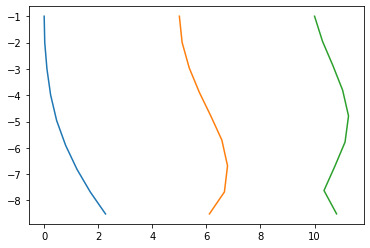

In [177]:

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(han_sks)
pc1 = pca.components_[0]
u = np.array([0,-1])
n=0
for pcs in pca.components_:
    sk = [u]
    pcs = pcs*1
    for an in pcs:
        M = get_rot_M(an).T
        sk.append(sk[-1]+np.dot(M,u))
    sk = np.array(sk)
    plt.plot(sk[:,0]+n*5,sk[:,1])
    n+=1
print(pca.explained_variance_ratio_, np.sum(pca.explained_variance_ratio_))

pca_sks = pca.transform(han_sks)

# Kmeans

In [178]:
from sklearn.cluster import KMeans

n_clusters = 25
pos_kmeans = KMeans(n_clusters=n_clusters, algorithm="elkan", init="k-means++", tol=1e-11, n_init=40)
pos_kmeans.fit(pca_sks)
labels = pos_kmeans.predict(pca_sks)
centers = pos_kmeans.cluster_centers_

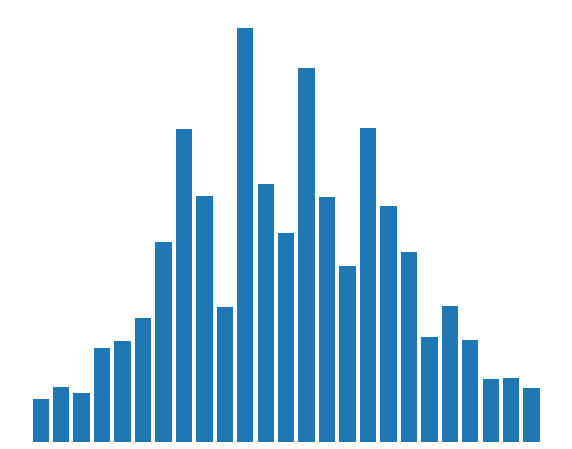

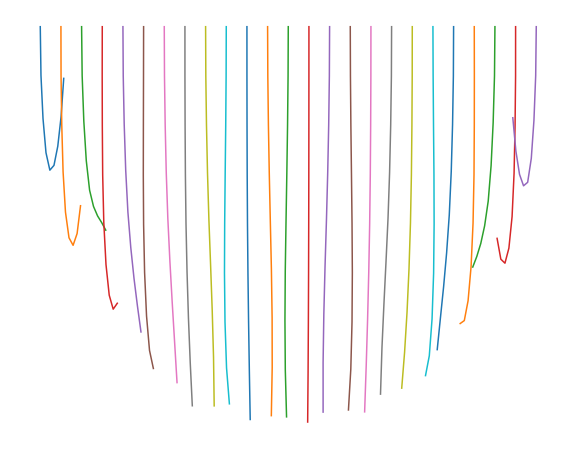

457


In [198]:
nums, bins = np.histogram(labels, bins=np.arange(n_clusters+1)-0.5)
ords = np.argsort(centers[:, 0])[::-1]
u = np.array([0,-1])

plt.figure(figsize=(10,8))

plt.bar(bins[:-1], nums[ords])
plt.axis('off')
plt.show()
plt.figure(figsize=(10,8))

for s, pcas in enumerate(centers[ords]):
    sks = np.dot(pcas, pca.components_)
    sk=[np.array([0,-1])]
    for an in sks:
        M = get_rot_M(an).T
        sk.append(sk[-1]+np.dot(M,u))
    sk = np.array(sk)
    plt.plot(sk[:,0]+s*5,sk[:,1])
    n+=1
plt.axis('off')
plt.xlim([-8, n_clusters*5+2])
plt.show()

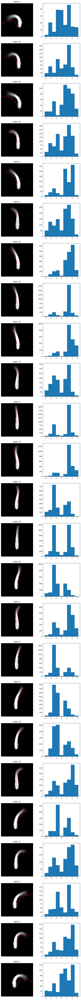

In [186]:
fig, axs = plt.subplots(pos_kmeans.n_clusters, 2, figsize=(10,5*pos_kmeans.n_clusters), dpi= 200)
ans = [list() for _ in range(pos_kmeans.n_clusters)]
cen_imgs = np.zeros((n_clusters, imgs[0].shape[0], imgs[0].shape[1]), dtype='int')

bins = np.linspace(-np.pi, np.pi, num=10)

for s, label in enumerate(labels):
    cen_imgs[label] += imgs[s]
    ans[label].append(h_ans[s])

for num, s in enumerate(ords):
    img = cen_imgs[s]
    cen_imgs[s] = (img/nums[s]).astype('uint8')
    #cv2.imwrite(os.path.join(savepath,f"centers_{s}.png"), img*255)
    
    sks = np.dot(centers[s], pca.components_)
    sk = [np.array([0,2])]
    for an in sks:
        M = get_rot_M(an).T
        sk.append(sk[-1]+np.dot(M,sk[0]))
    sk = np.array(sk)
    
    axs[num, 0].imshow(cen_imgs[s], plt.cm.gray, extent=[-12, 12, -5, 20]) 
    axs[num, 0].title.set_text(f"label: {s}")
    axs[num, 0].plot(sk[:,0], sk[:,1], c='red')
    axs[num, 0].axis('Off')
    
    axs[num, 1].hist(ans[s], bins=bins)

# for s, _ in np.ndenumerate(axs):
#     axs[s].axis('Off')

1


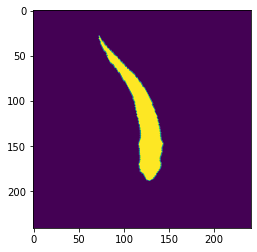

2


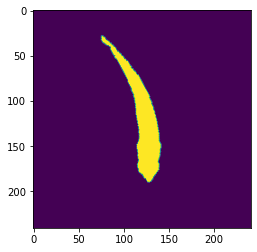

22


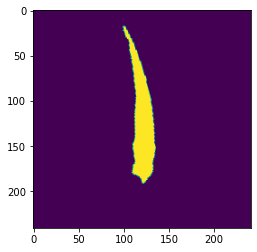

28


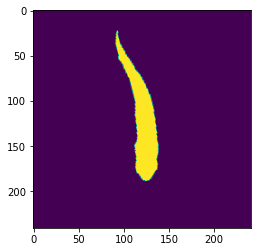

77


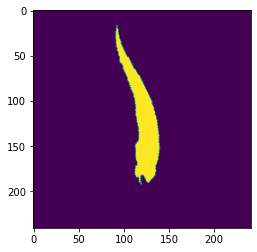

81


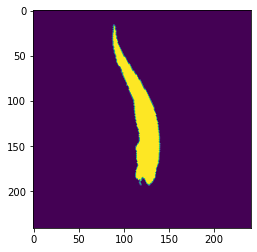

86


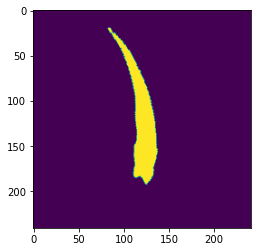

213


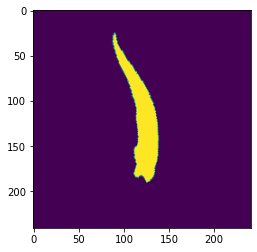

235


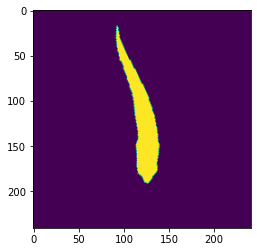

246


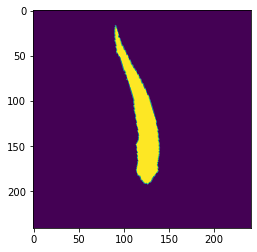

247


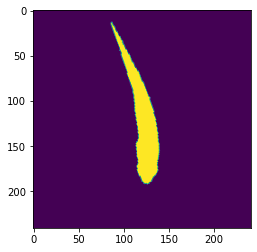

251


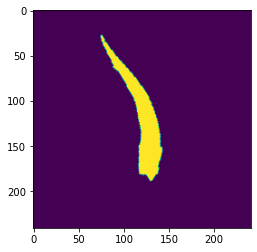

261


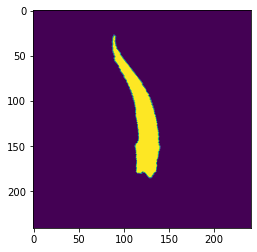

273


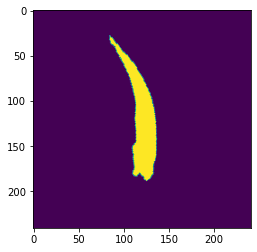

289


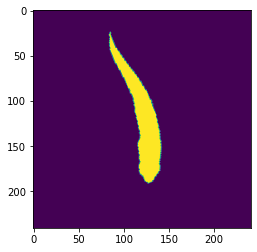

290


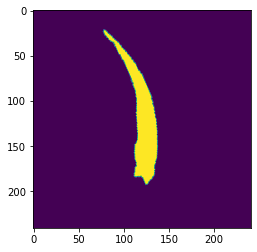

297


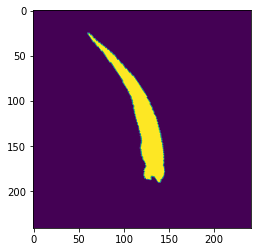

301


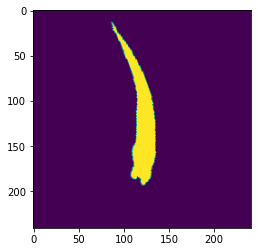

306


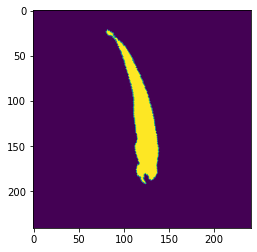

311


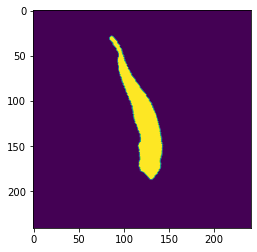

435


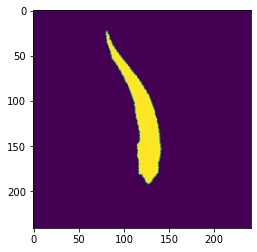

447


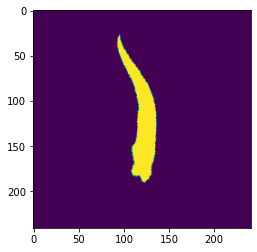

457


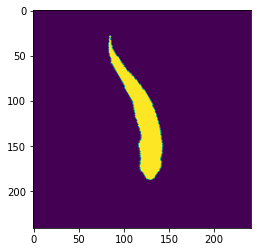

458


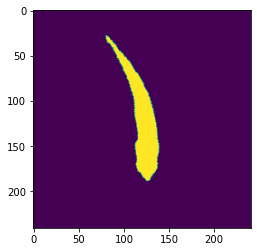

461


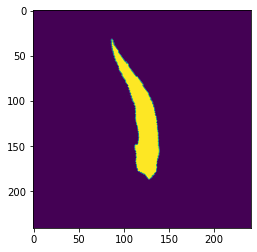

481


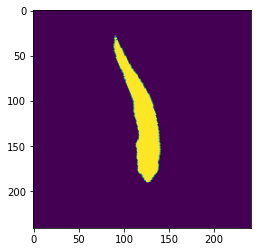

485


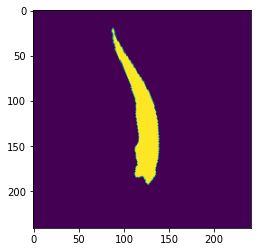

496


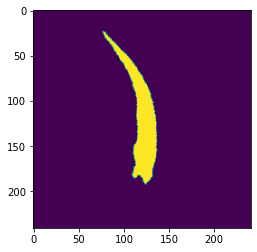

504


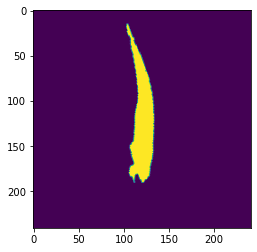

507


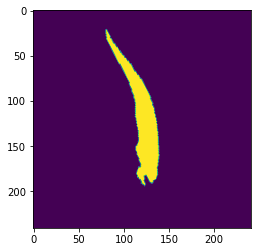

514


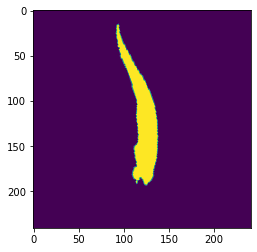

666


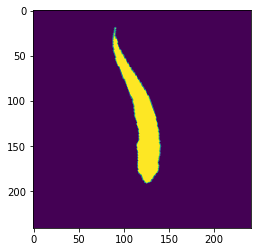

678


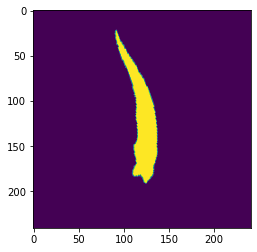

681


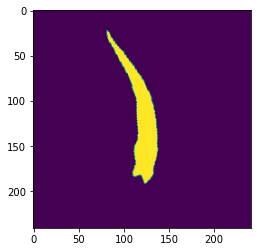

686


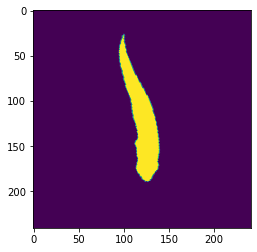

687


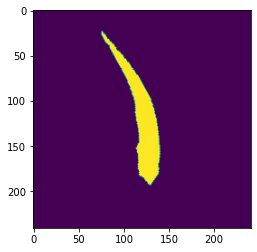

697


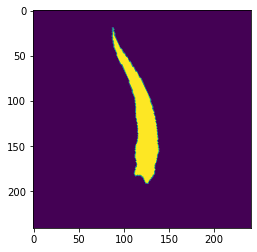

708


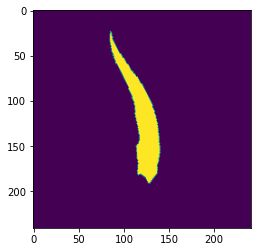

718


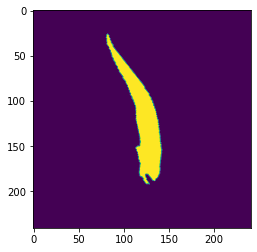

850


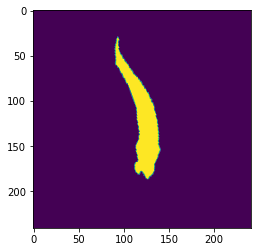

853


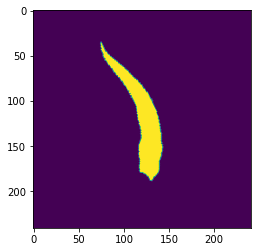

865


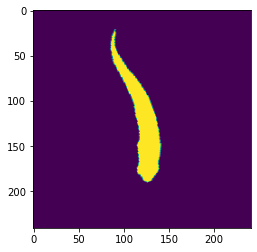

866


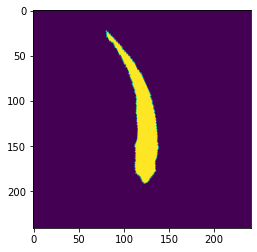

901


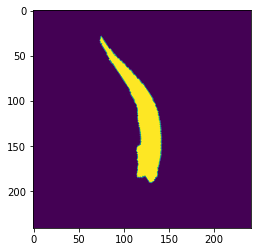

908


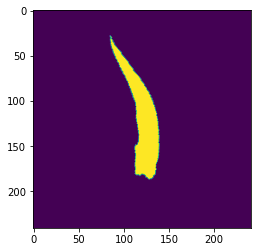

909


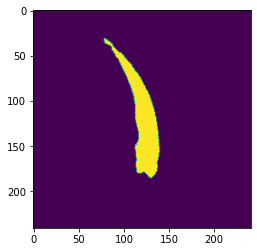

989


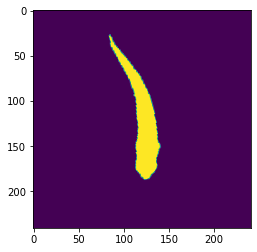

992


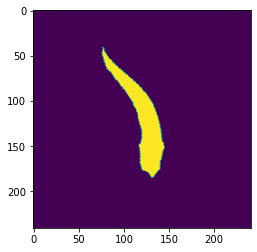

1100


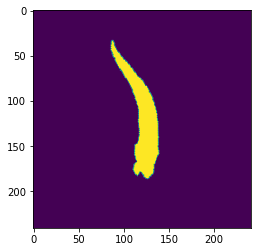

1134


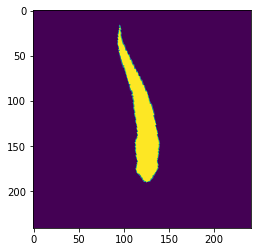

1151


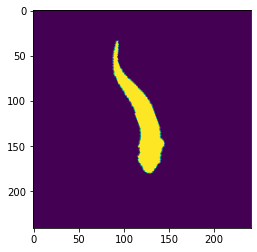

1163


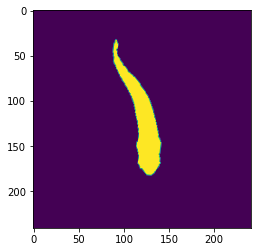

1269


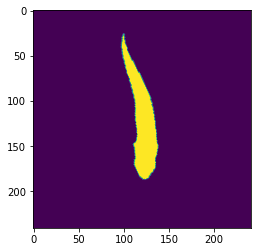

1273


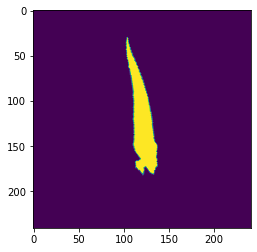

1290


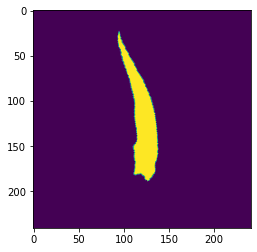

1297


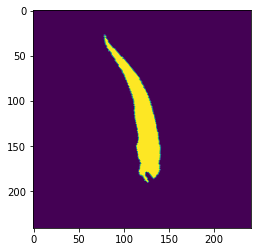

1319


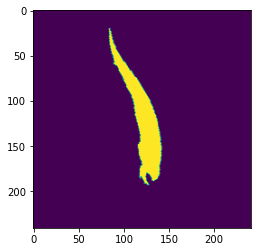

1409


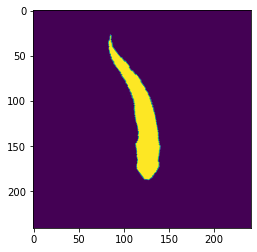

1414


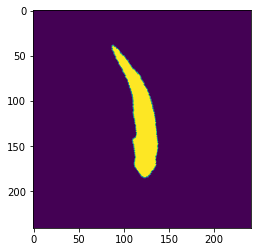

1416


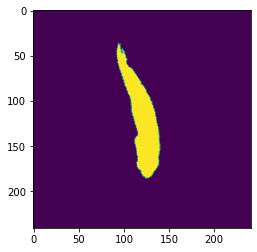

1417


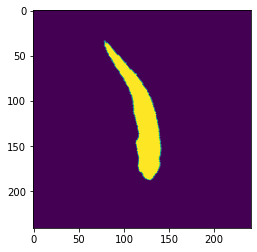

1420


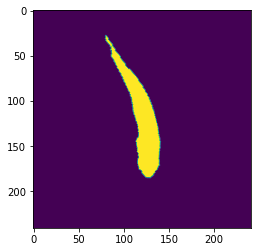

1421


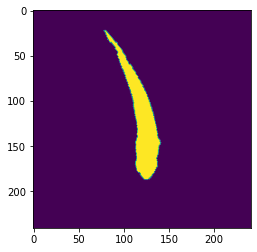

1422


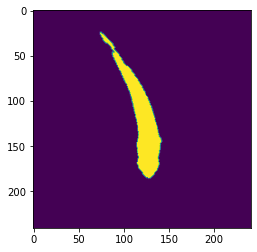

1473


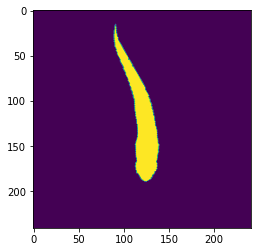

1476


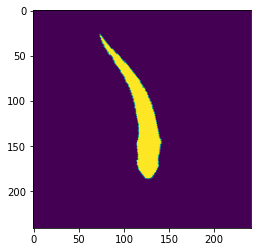

1477


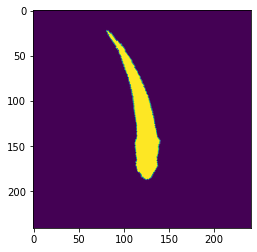

1513


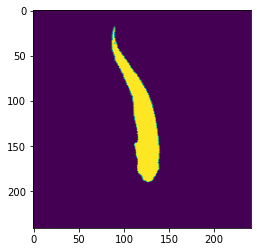

1515


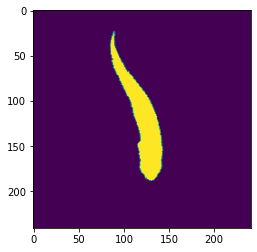

1516


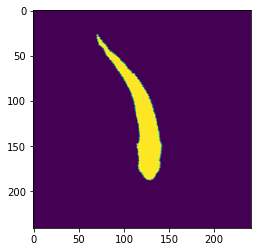

1518


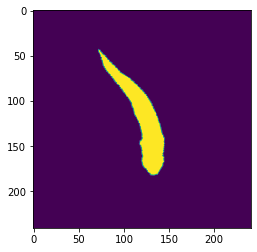

1519


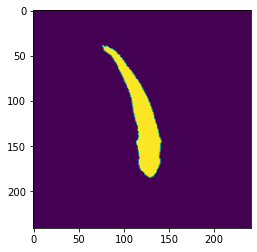

1520


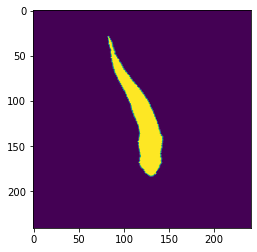

1624


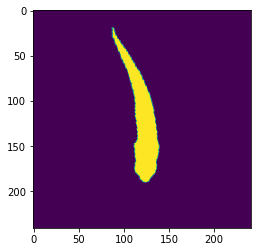

1632


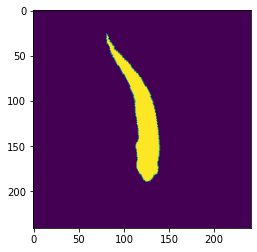

1648


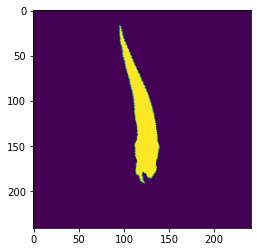

1649


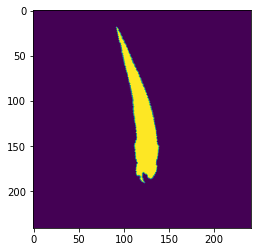

1651


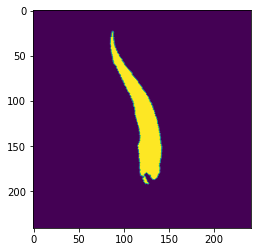

1654


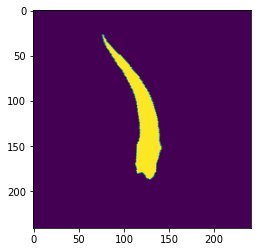

1655


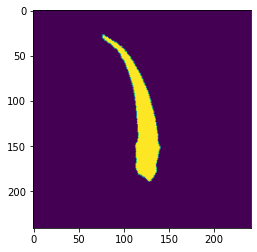

1659


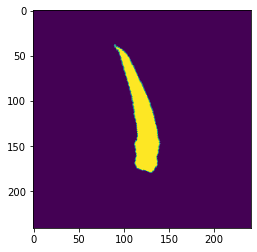

1798


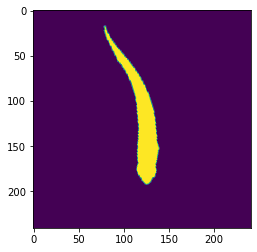

1826


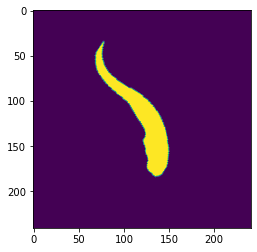

1830


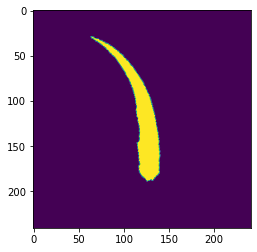

1836


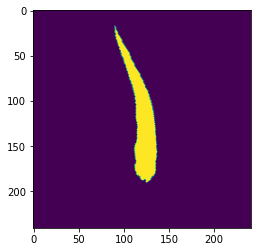

1840


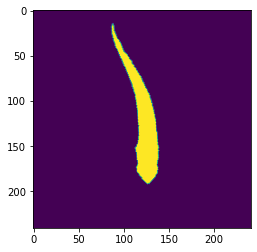

1850


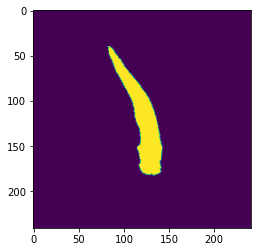

1959


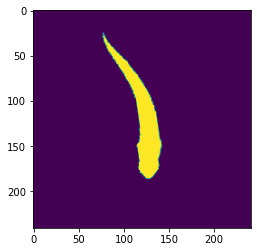

1999


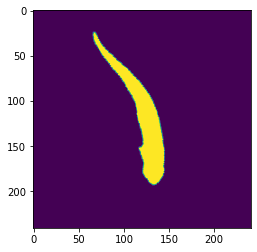

2001


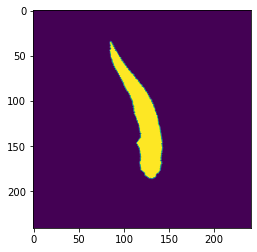

2002


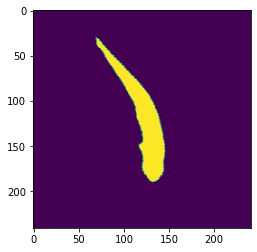

2035


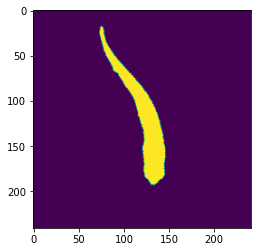

2036


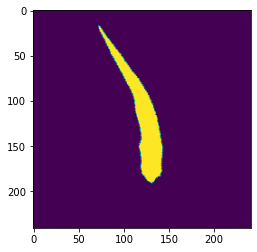

2070


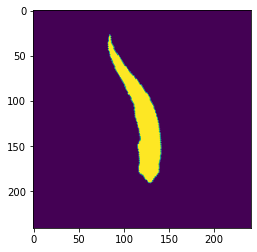

2071


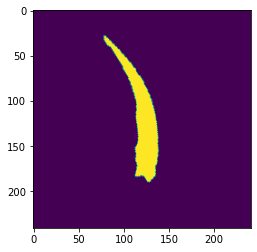

2077


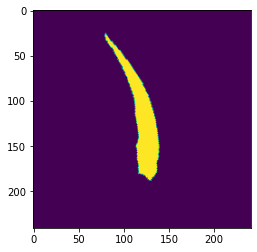

2079


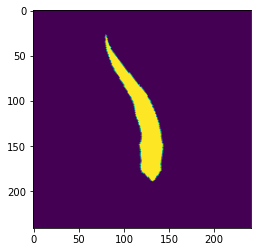

2080


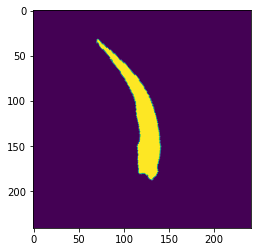

2081


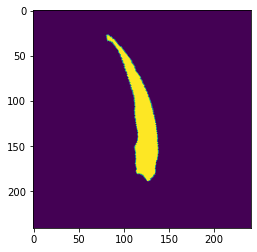

2083


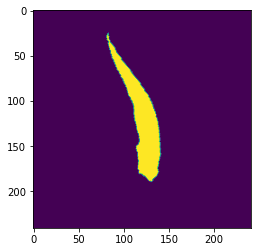

2084


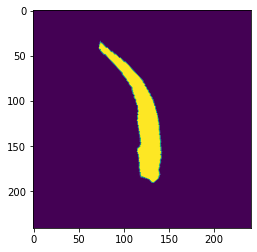

2086


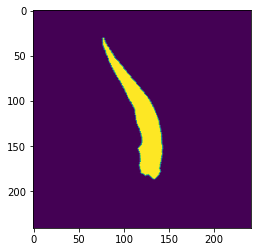

2094


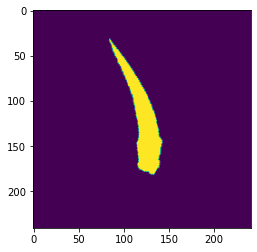

2095


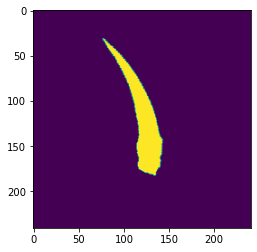

2096


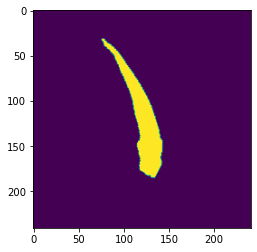

2143


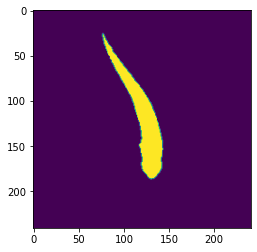

2179


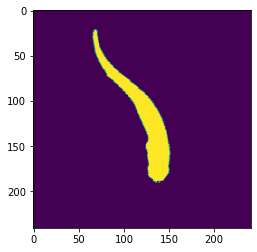

2185


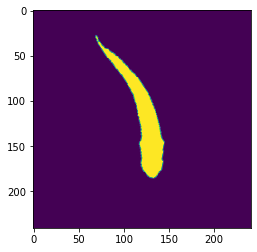

2187


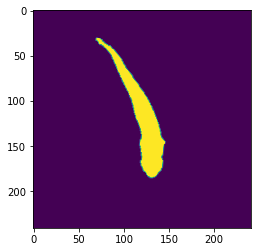

2245


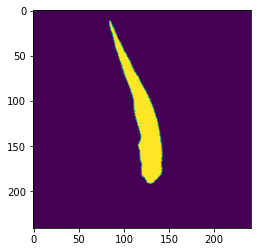

2246


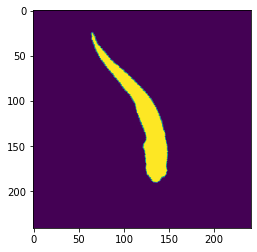

2309


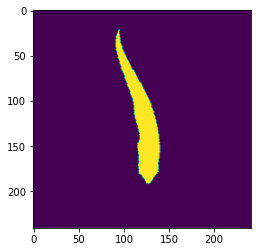

2328


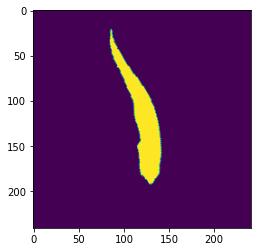

2332


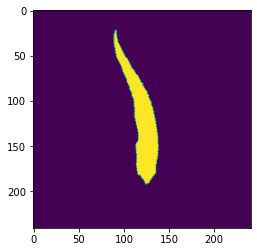

2340


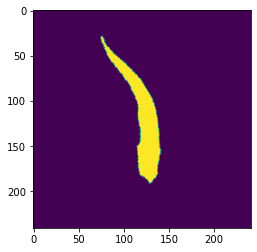

2356


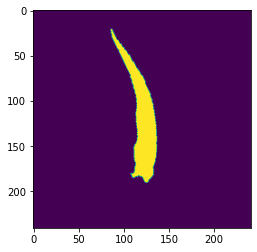

2363


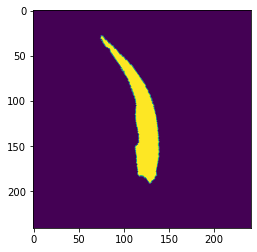

2364


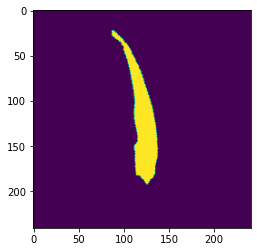

2479


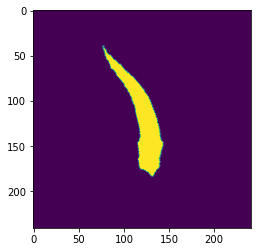

2486


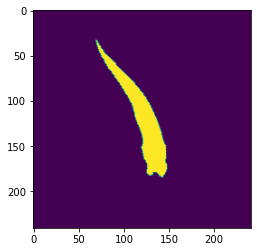

2491


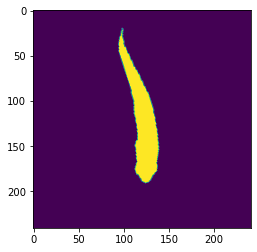

2510


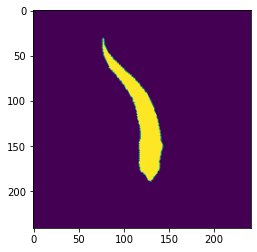

2527


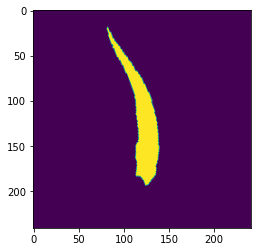

2528


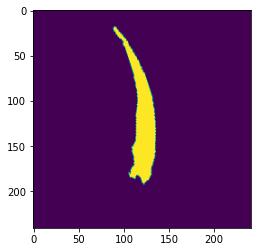

2532


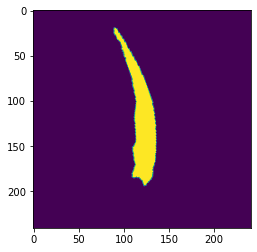

2549


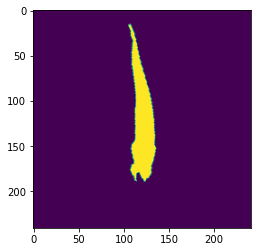

2550


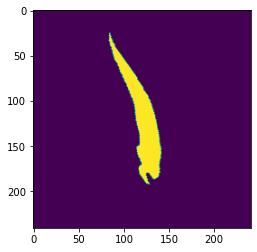

2553


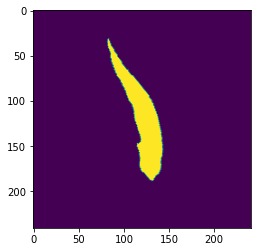

2556


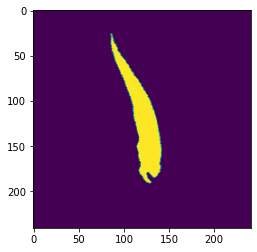

2562


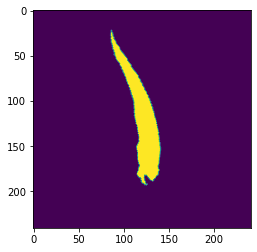

2568


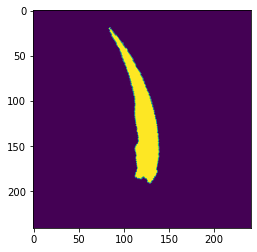

2576


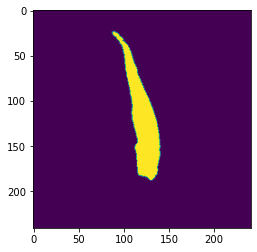

2711


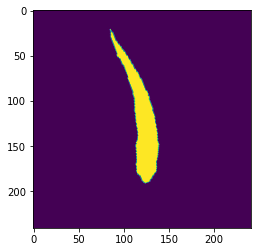

2729


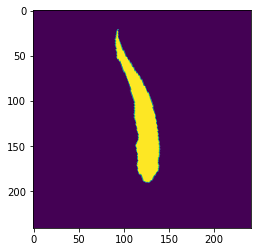

2733


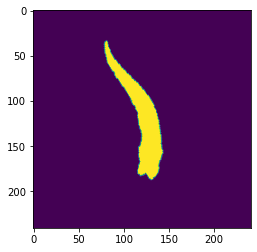

2734


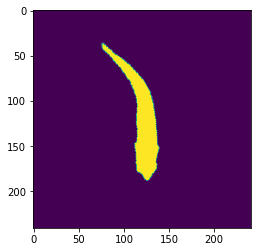

2737


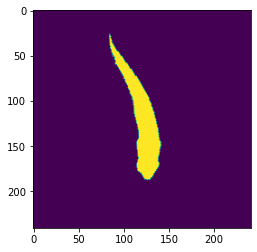

2738


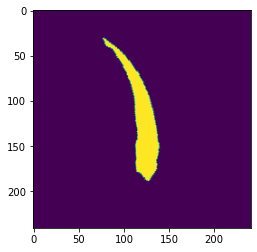

2759


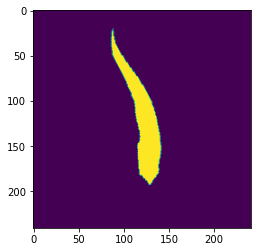

2767


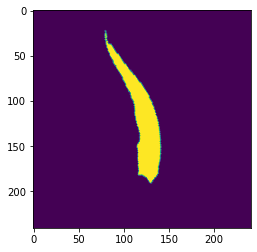

2770


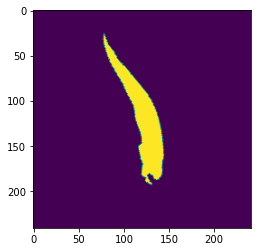

2791


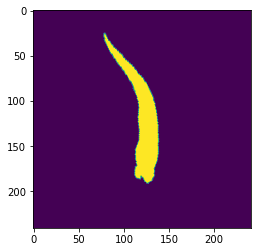

2794


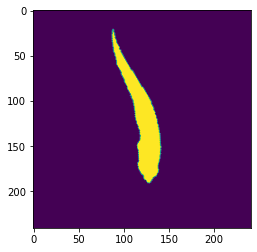

2921


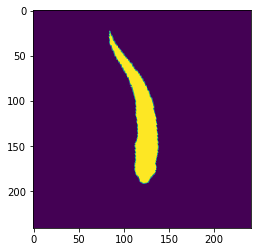

2953


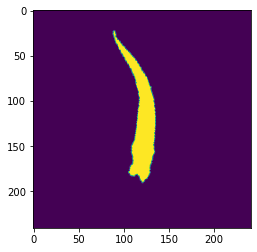

2961


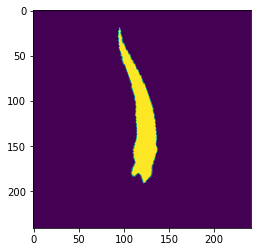

2973


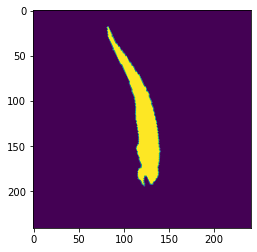

2976


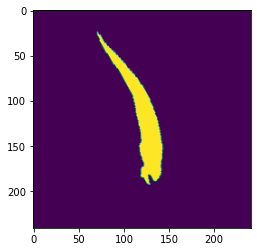

2978


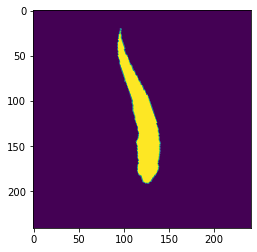

2979


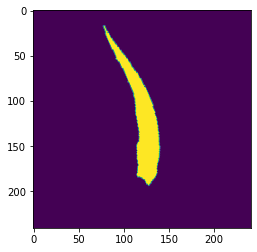

2980


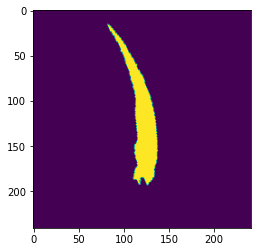

2986


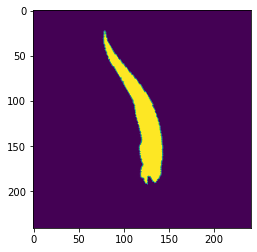

2993


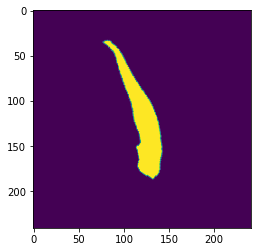

3082


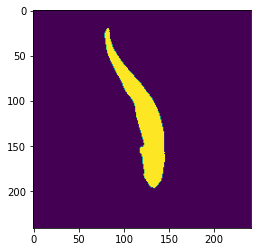

3104


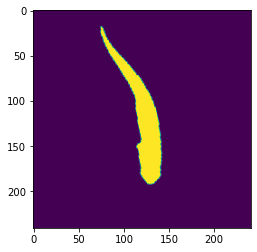

3109


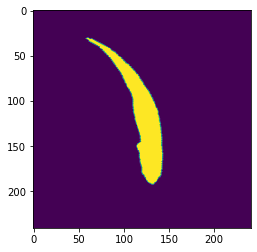

3113


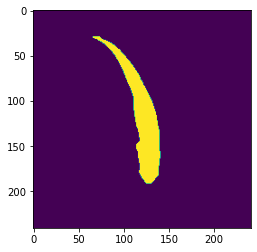

3118


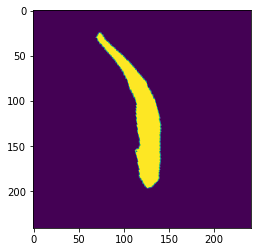

3133


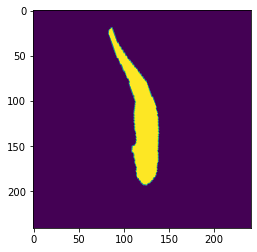

3137


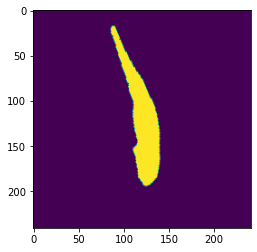

3138


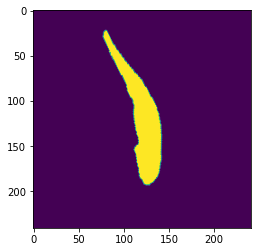

3157


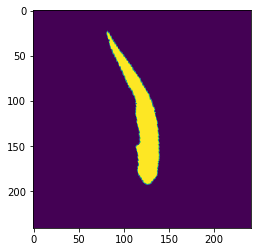

3177


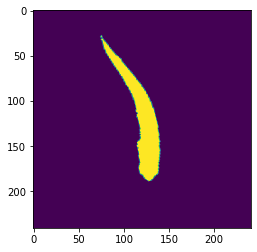

3287


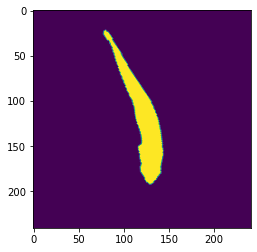

3309


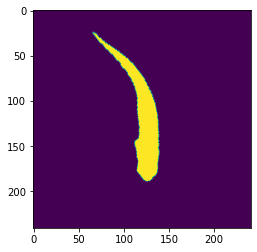

3355


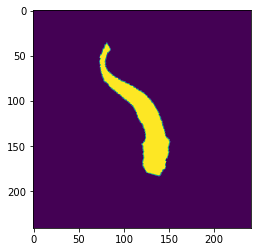

3356


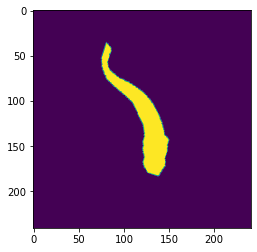

3402


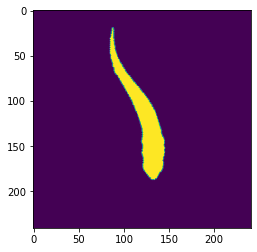

3403


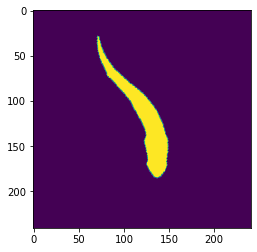

3410


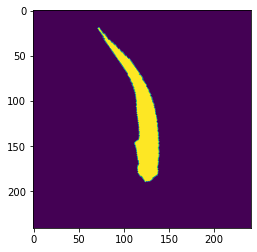

3415


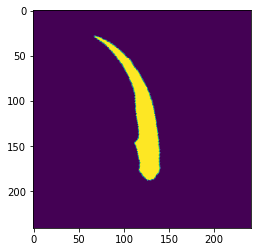

3425


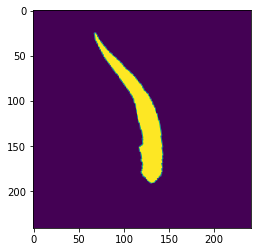

3438


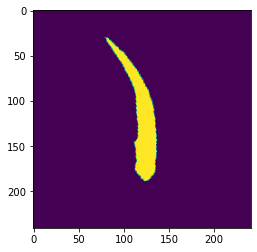

3441


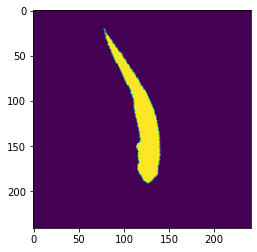

3649


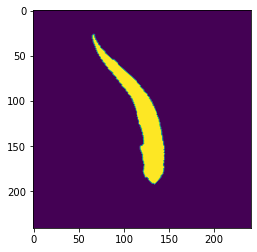

3663


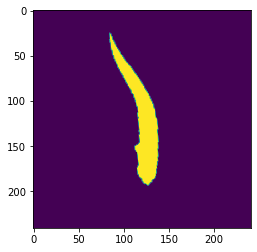

3670


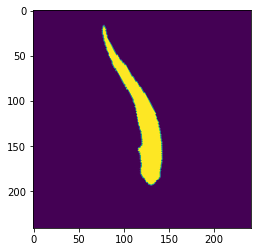

3778


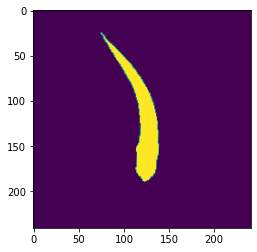

3836


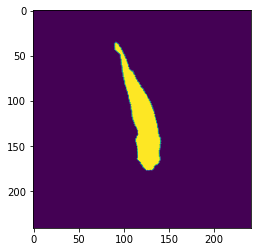

3863


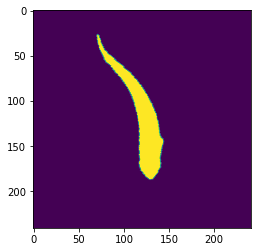

3864


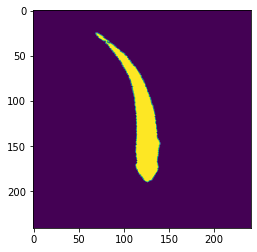

3905


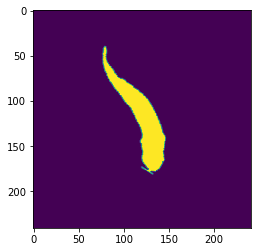

3932


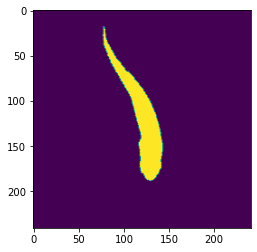

3933


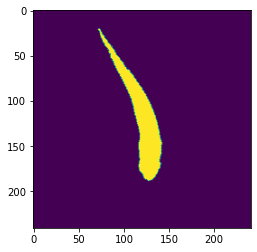

3934


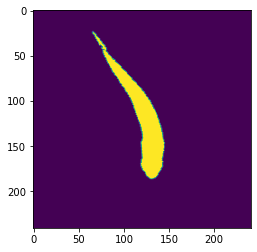

4010


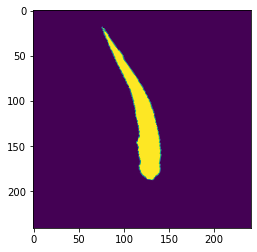

4042


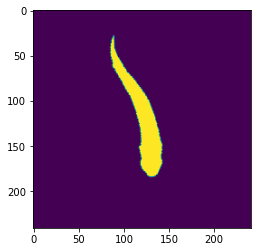

4044


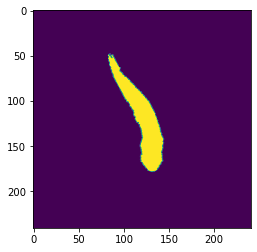

4078


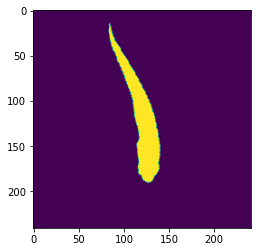

4081


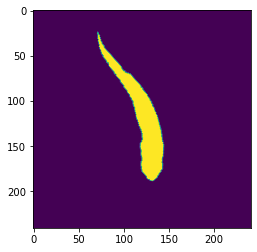

4082


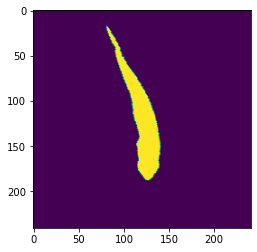

4083


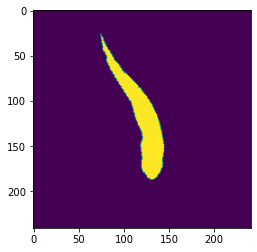

4117


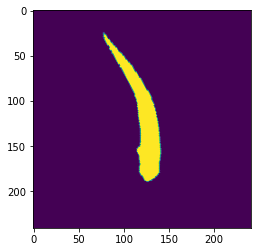

4317


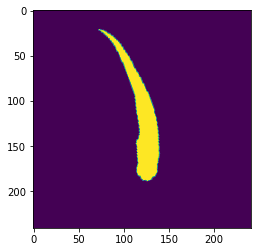

4318


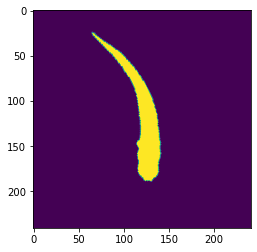

4322


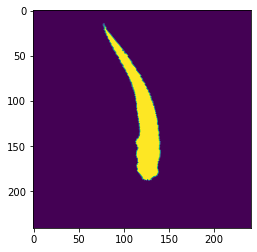

4331


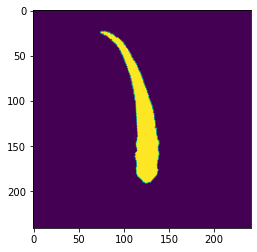

4352


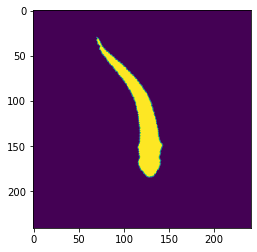

4405


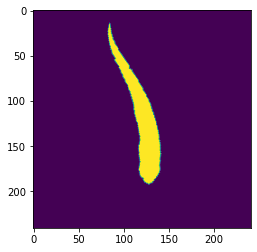

4408


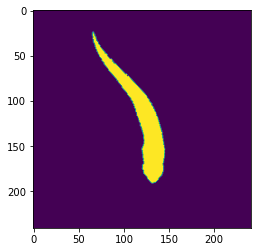

4409


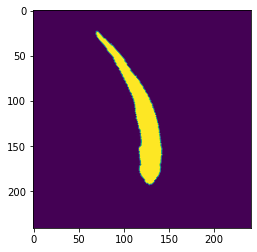

4410


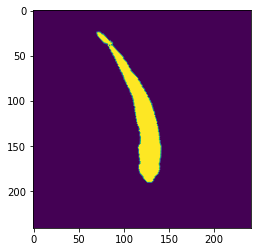

4413


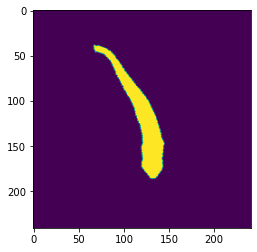

4431


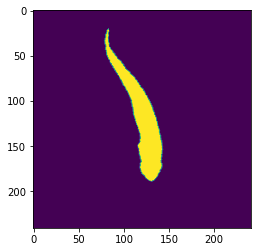

4432


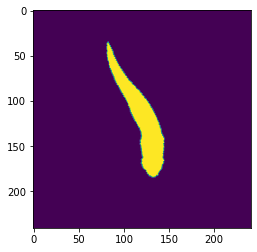

4455


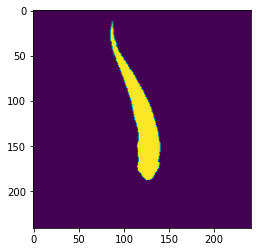

4458


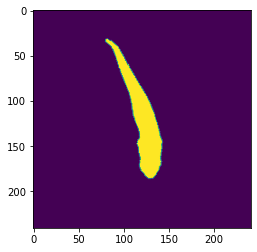

4484


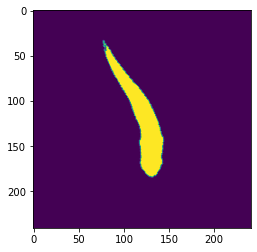

4486


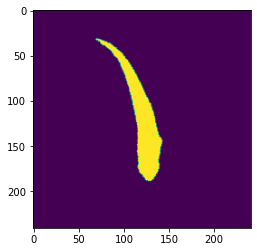

4487


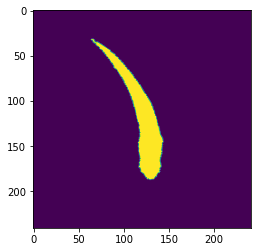

4511


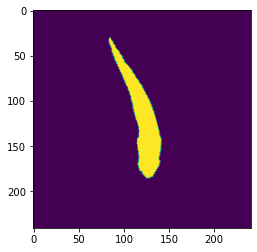

4512


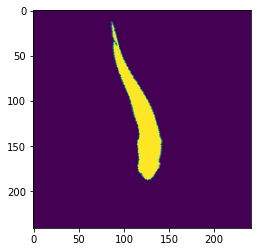

4537


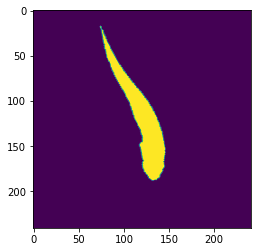

4562


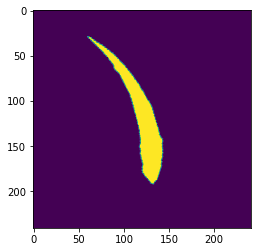

4596


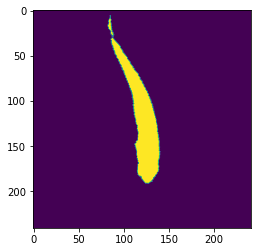

4598


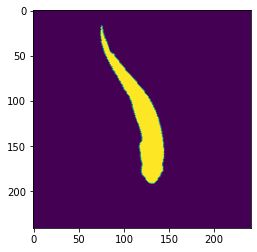

4599


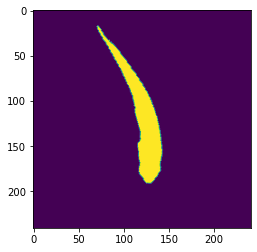

4600


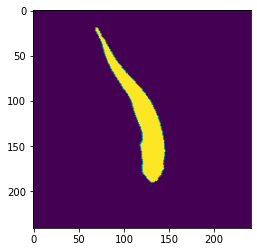

4602


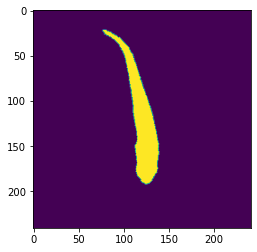

4603


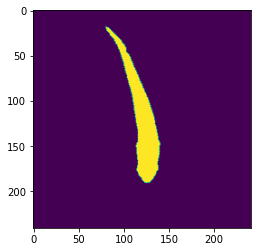

4604


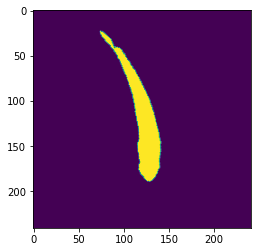

4673


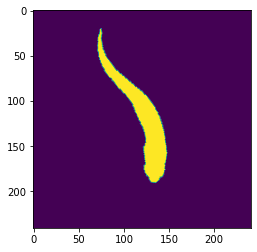

4700


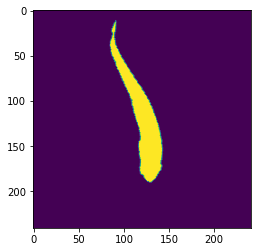

4701


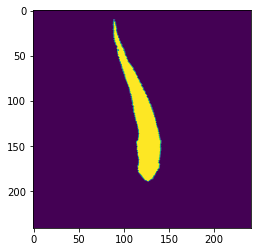

4702


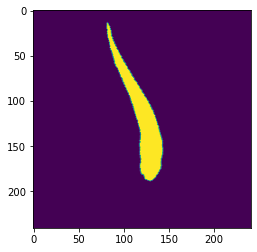

4703


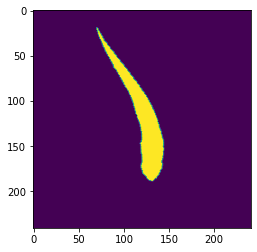

4704


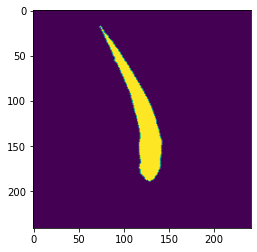

4787


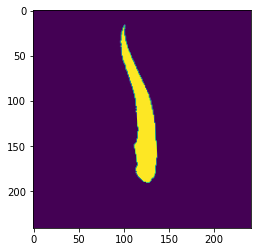

4821


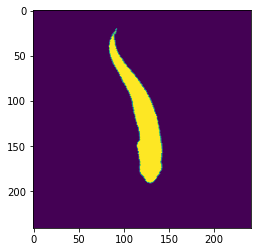

4827


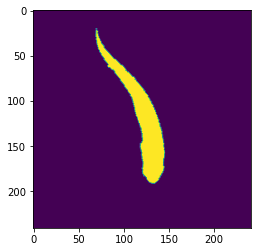

4829


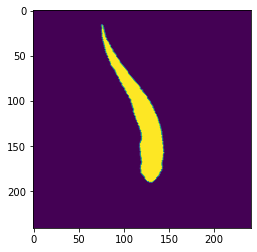

4830


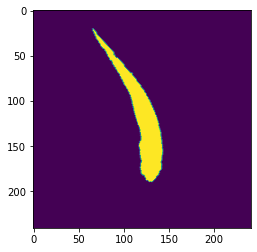

4831


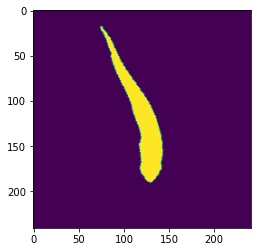

4862


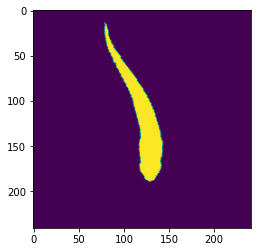

4863


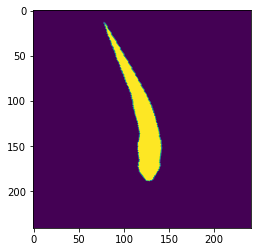

4864


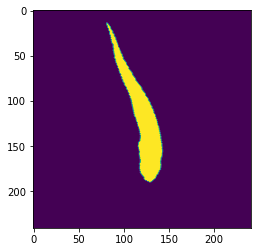

4901


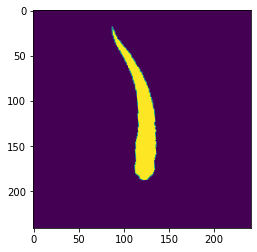

5108


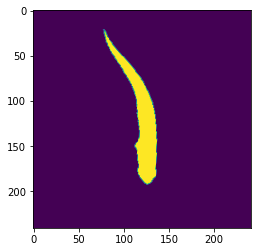

5180


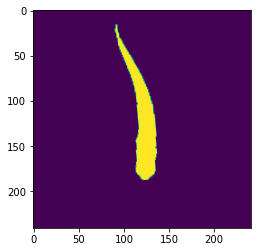

5303


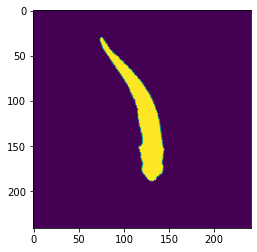

5342


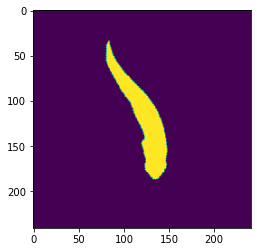

5343


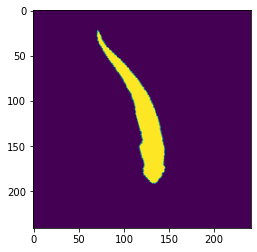

5345


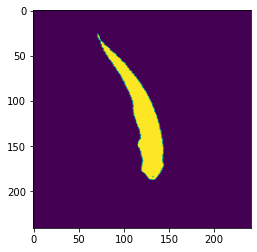

5348


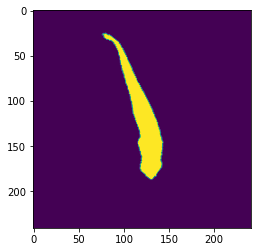

5413


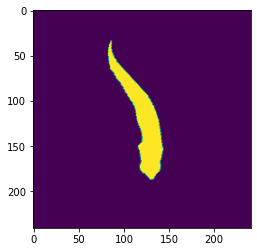

5419


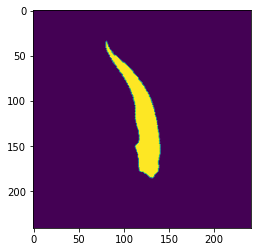

5425


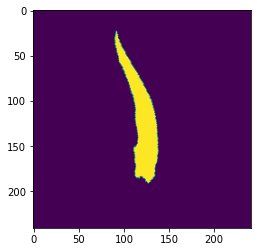

5428


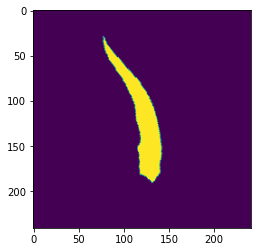

5429


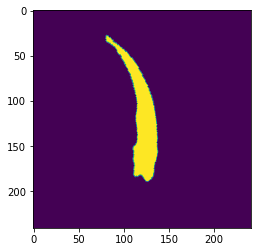

5434


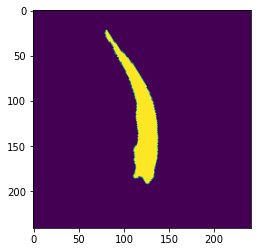

5439


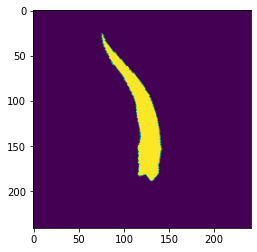

5444


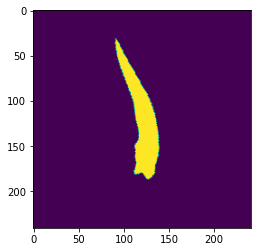

5455


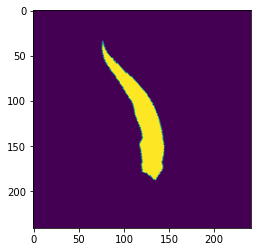

5459


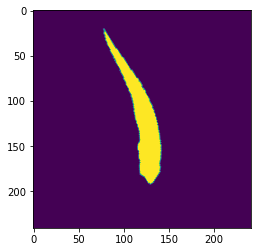

5460


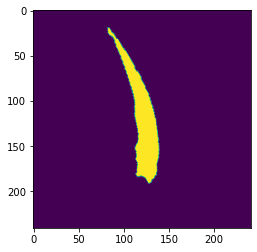

5486


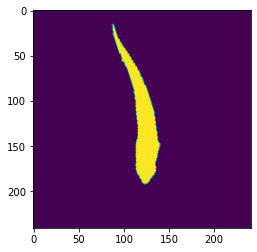

5496


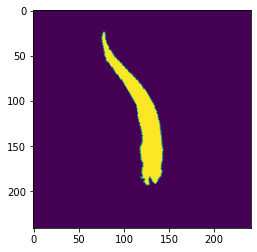

5498


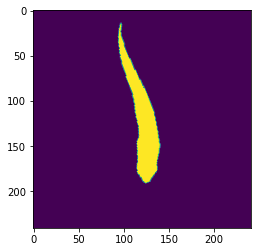

5511


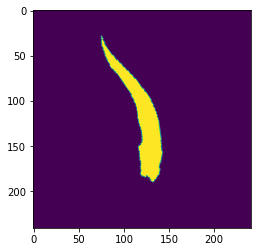

5639


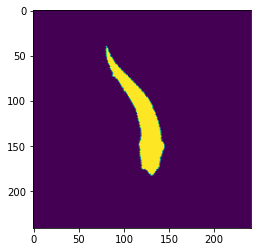

5687


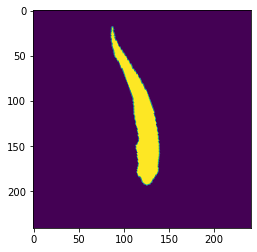

5690


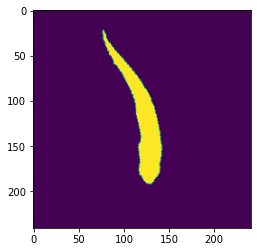

5694


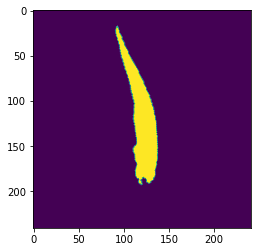

5706


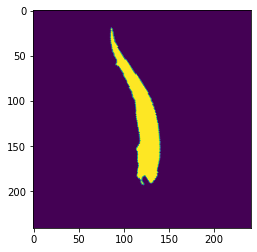

5709


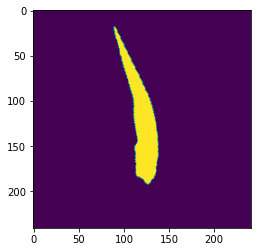

5710


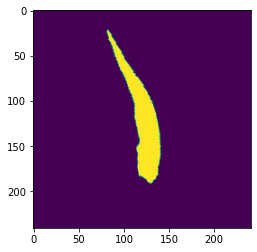

5713


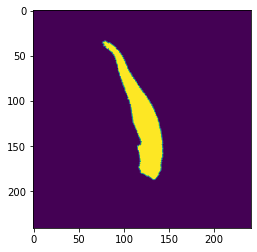

5861


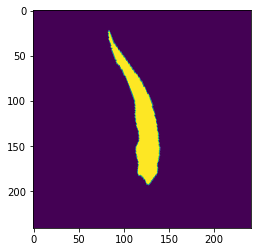

5885


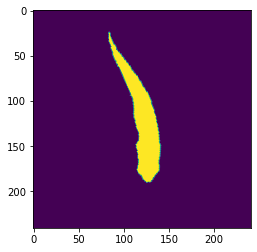

5886


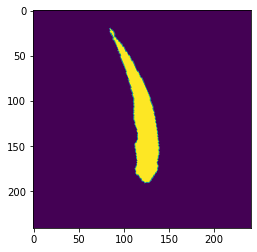

5904


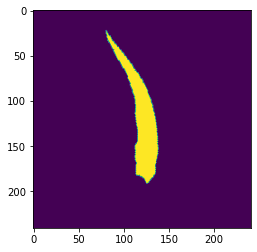

5918


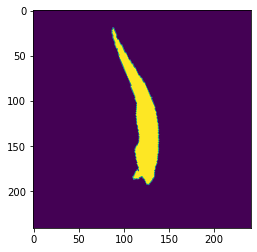

5921


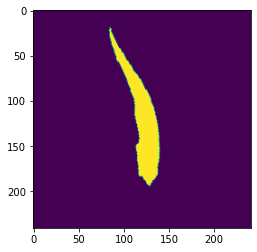

5943


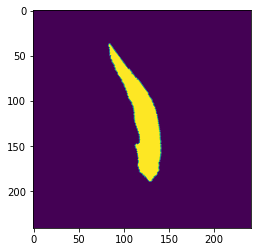

5946


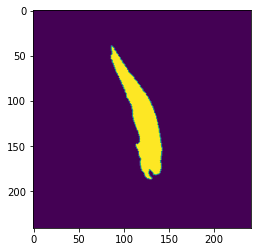

5949


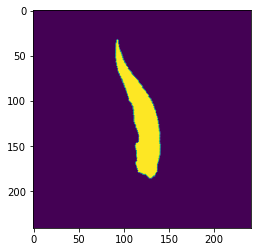

6070


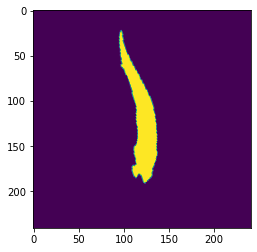

6082


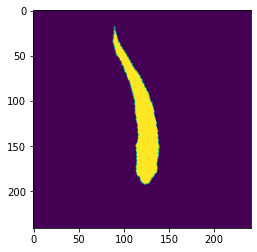

6090


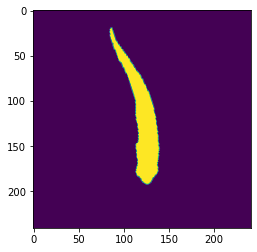

6094


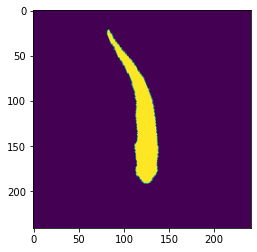

6103


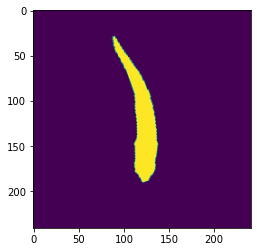

6124


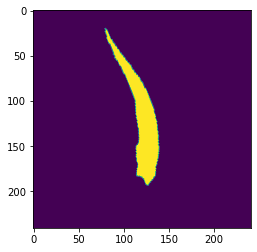

6125


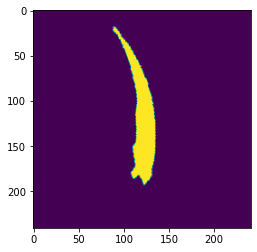

6135


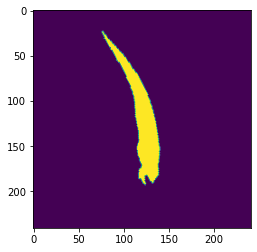

6138


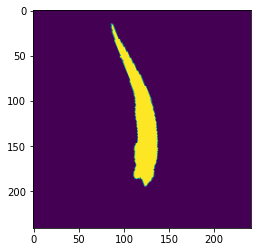

6142


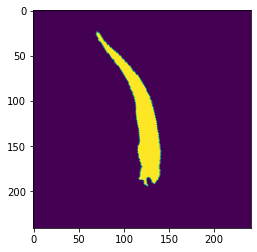

6145


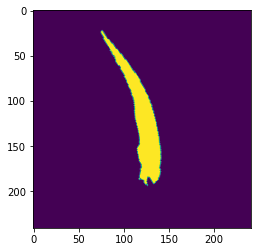

6148


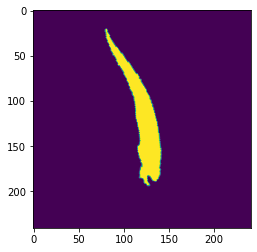

6152


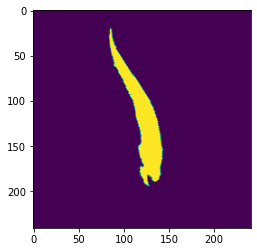

6154


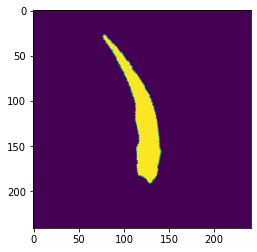

6255


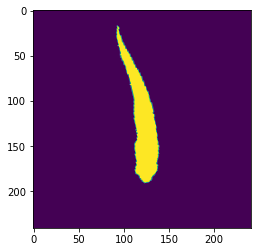

6259


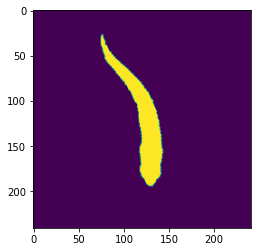

6275


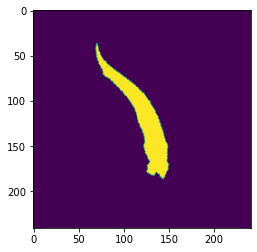

6278


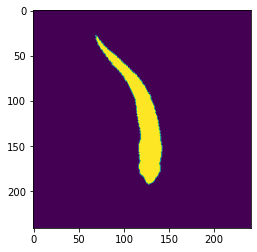

6292


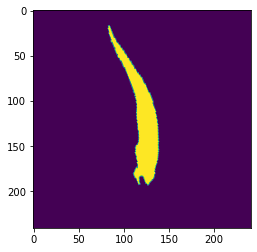

6311


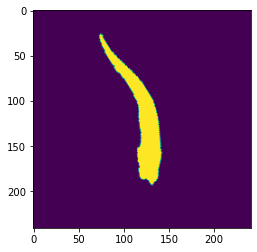

6449


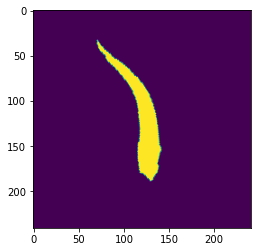

6452


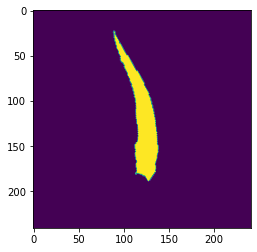

6463


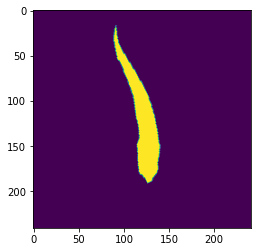

6466


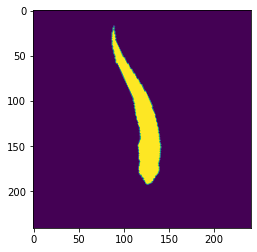

6484


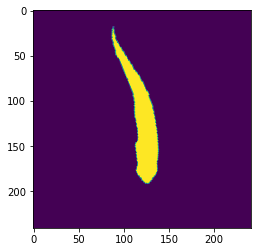

6494


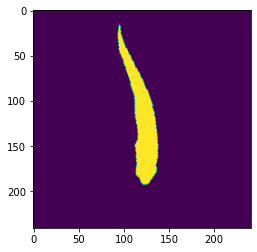

6512


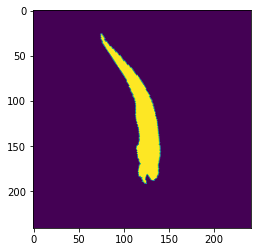

6517


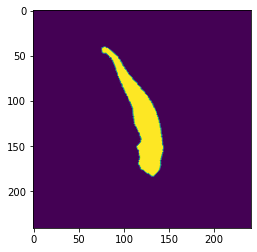

6618


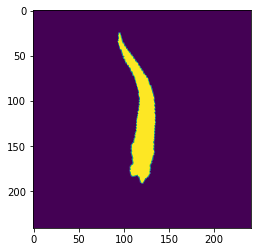

6621


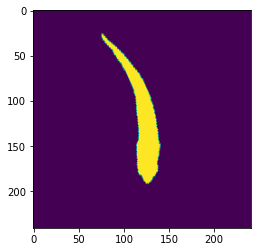

6625


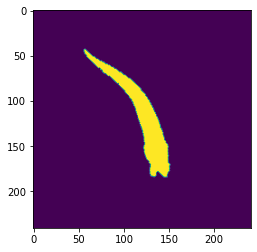

6632


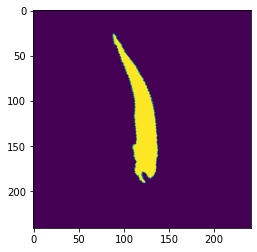

6640


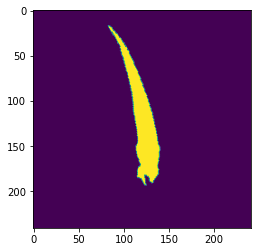

6646


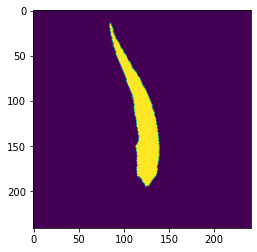

6650


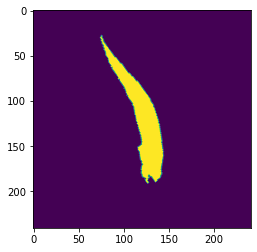

6660


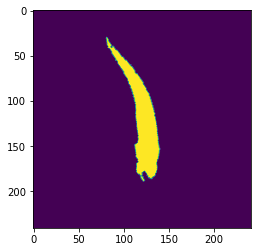

6663


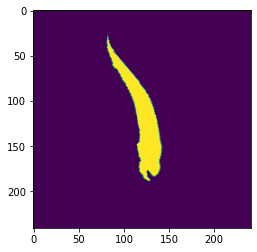

6793


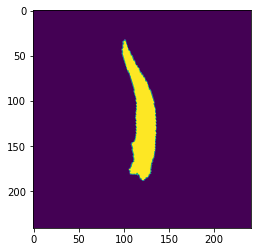

6796


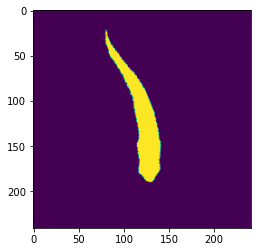

6881


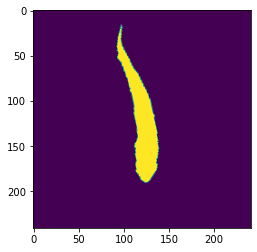

6891


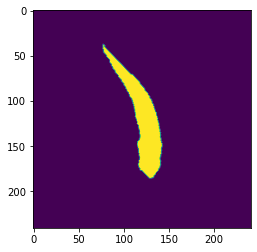

6908


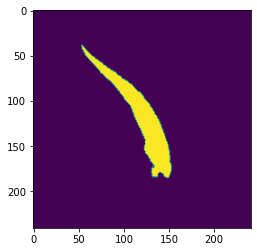

6915


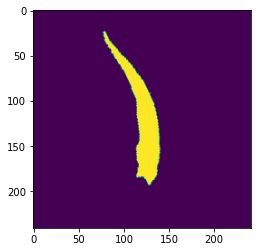

6925


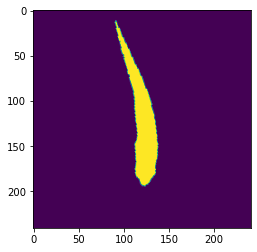

6933


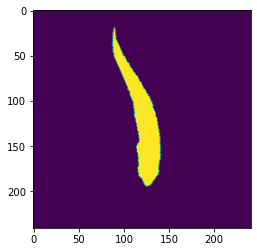

6934


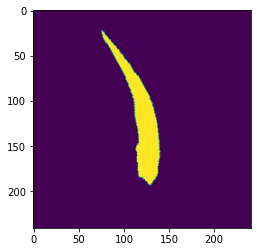

6937


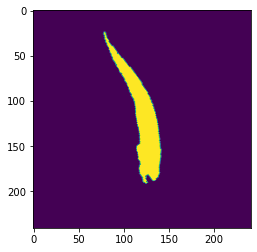

6942


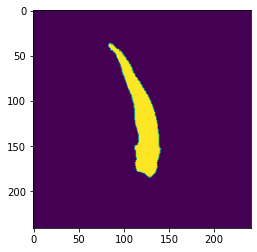

6953


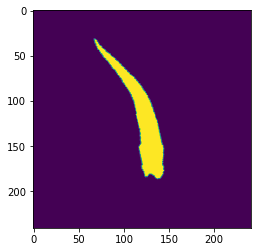

6956


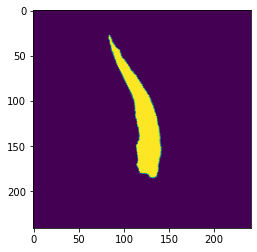

7081


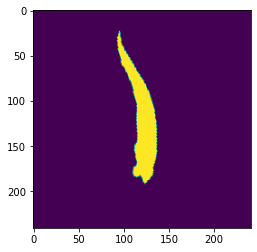

7084


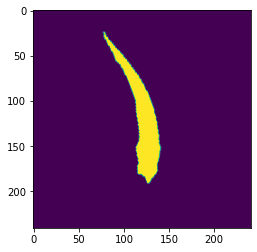

7102


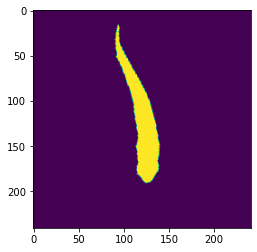

7119


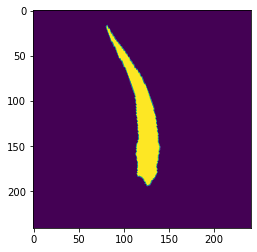

7123


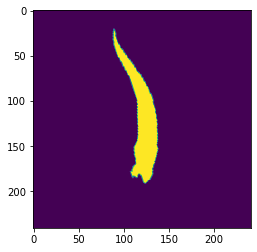

7126


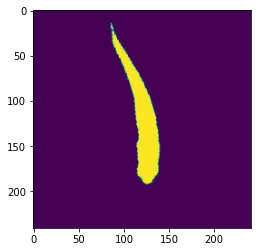

7135


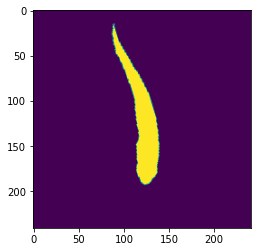

7138


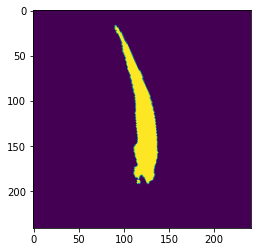

7141


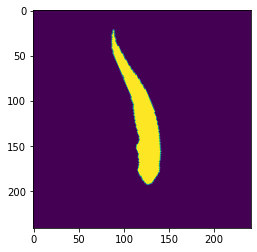

7148


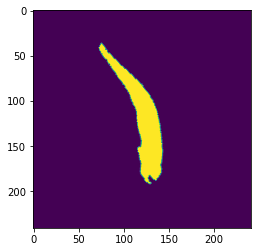

7162


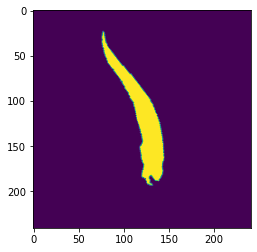

7167


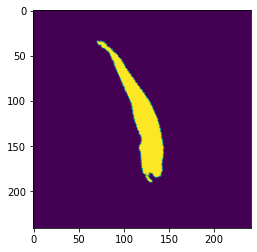

7269


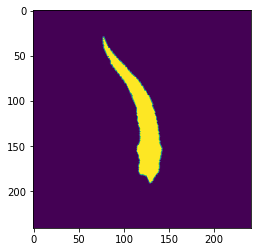

7275


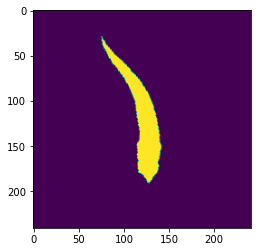

7293


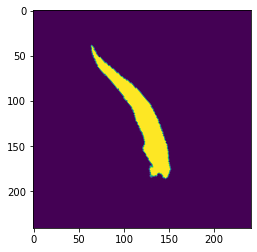

7307


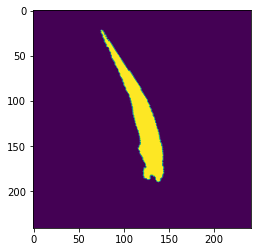

7310


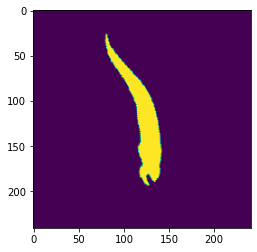

7313


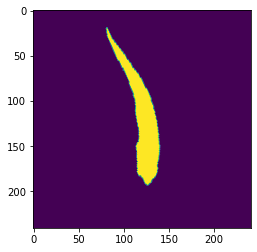

7316


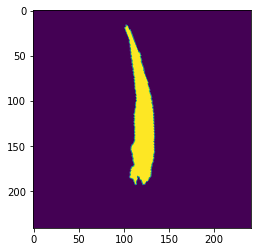

7318


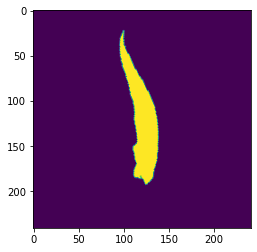

7321


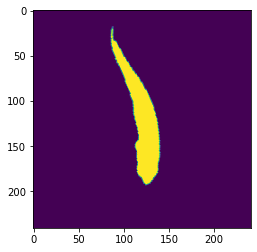

7322


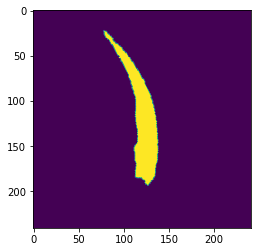

7323


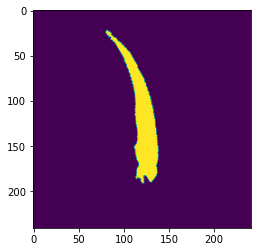

7334


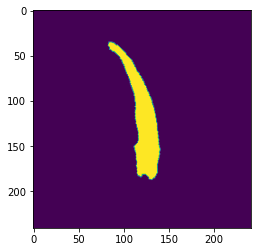

7335


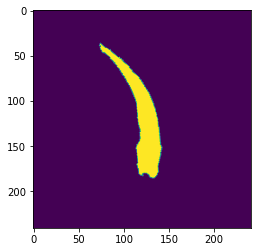

7478


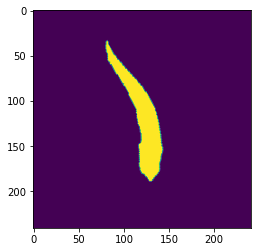

7489


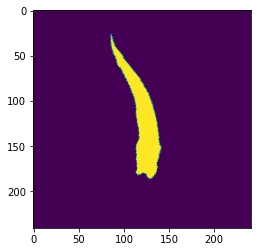

7494


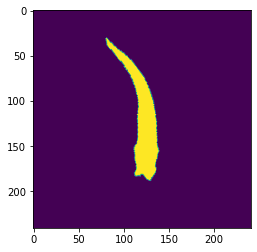

7497


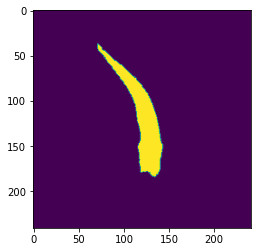

7518


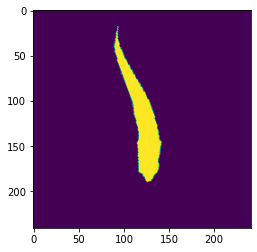

7519


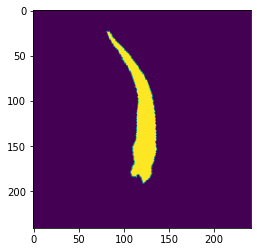

7522


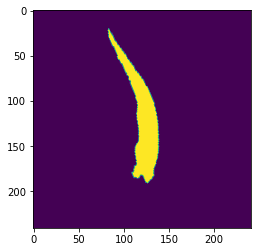

7533


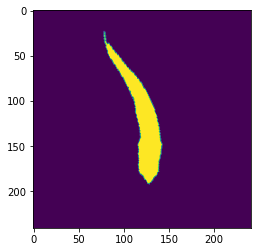

7552


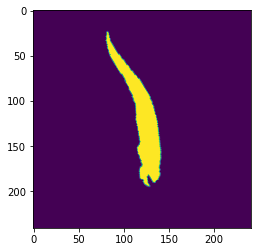

7557


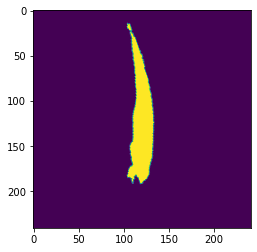

7559


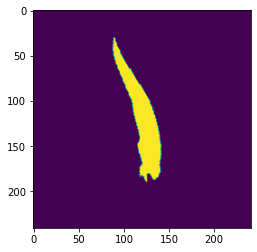

7564


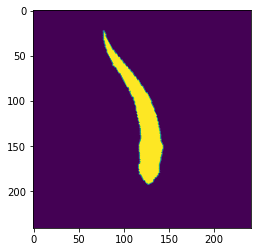

7566


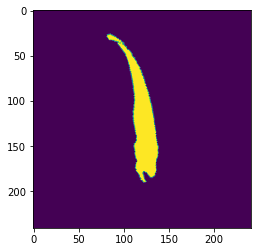

7567


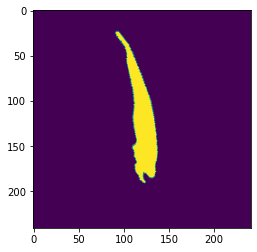

7711


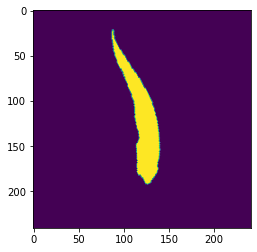

7715


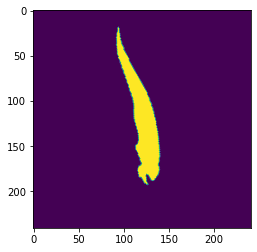

7721


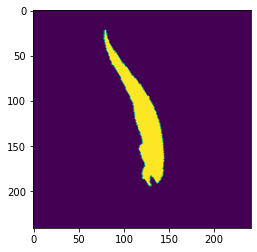

7724


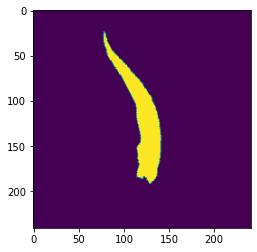

7859


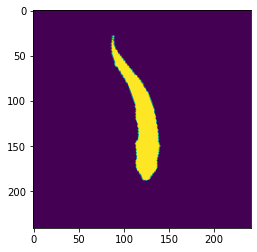

7872


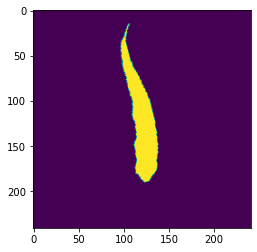

7893


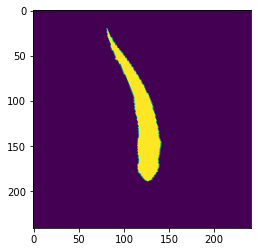

7894


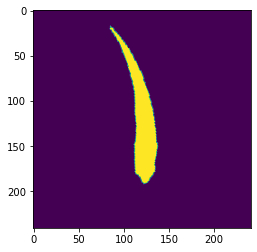

7917


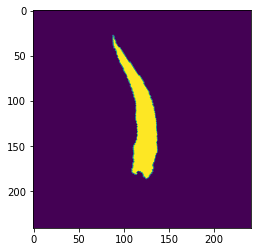

7924


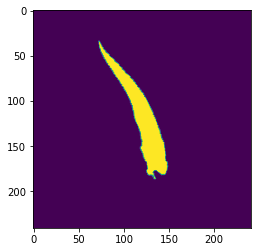

7996


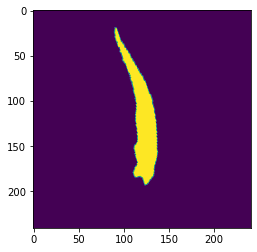

8010


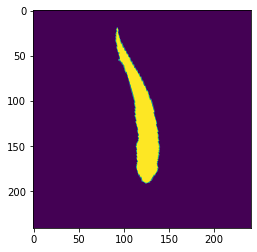

8016


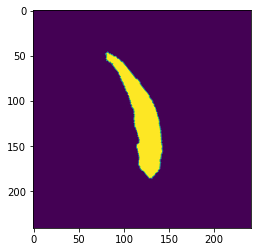

8124


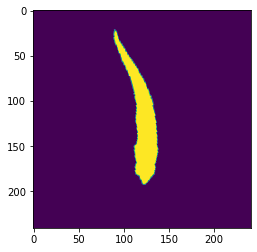

8130


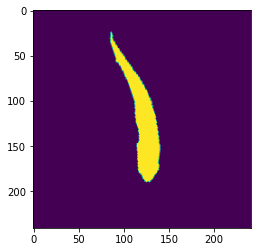

8141


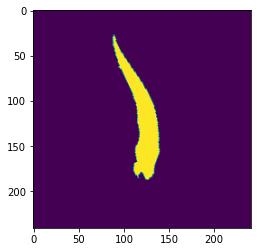

8149


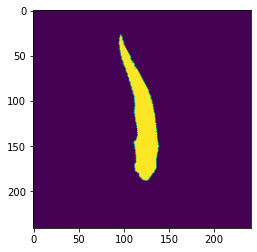

8156


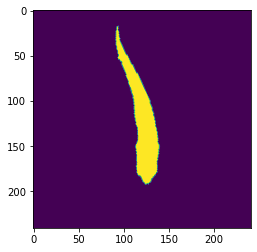

8161


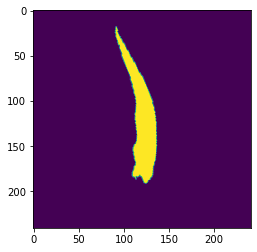

8164


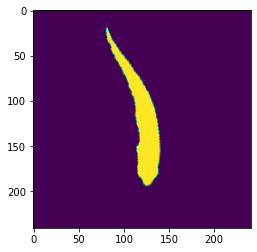

8169


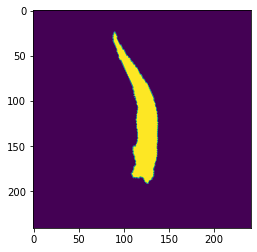

8188


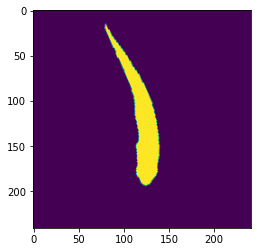

8193


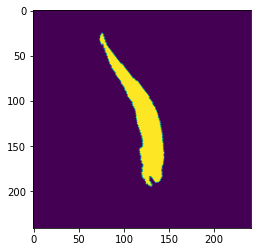

8196


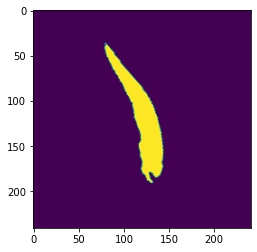

8199


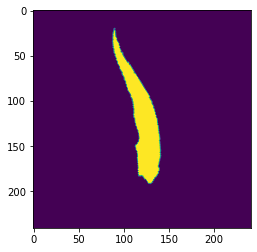

8201


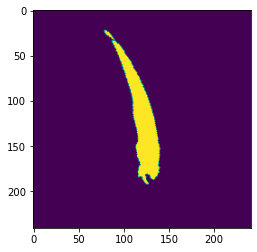

8204


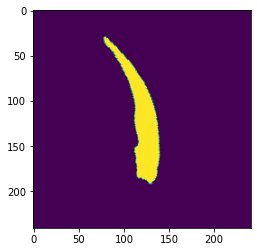

8205


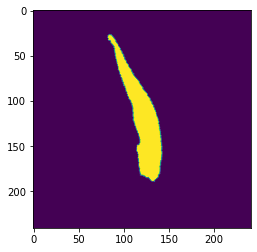

8299


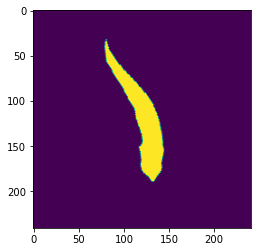

8318


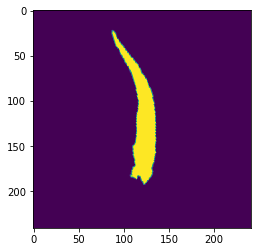

8320


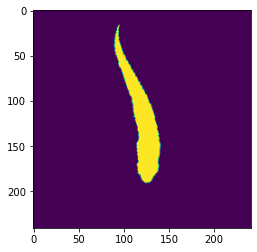

8341


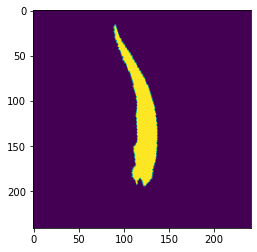

8345


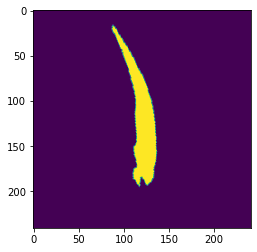

8349


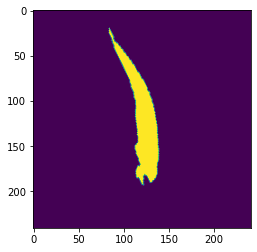

8353


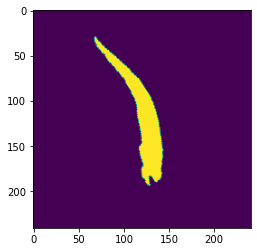

8522


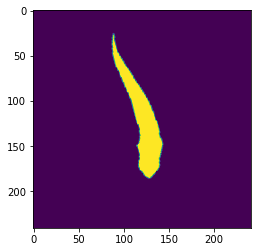

8646


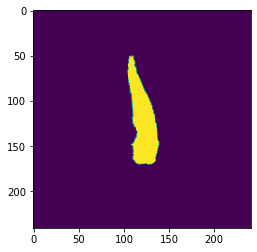

8648


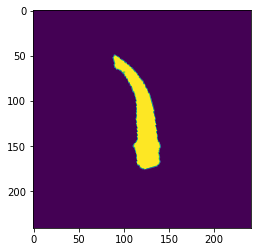

8676


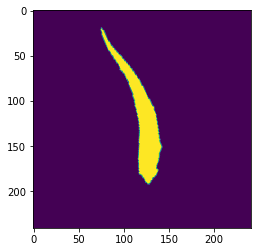

8759


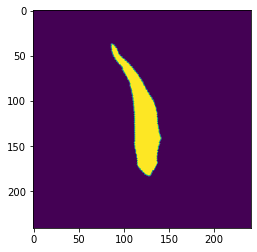

8886


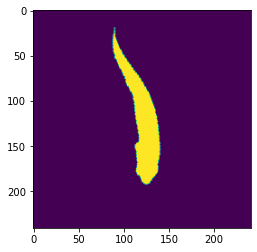

8887


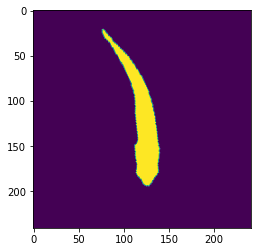

8890


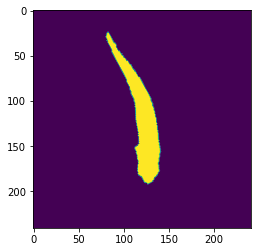

8917


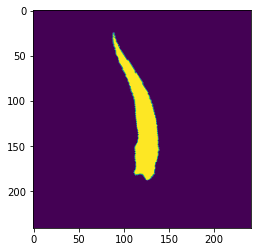

8920


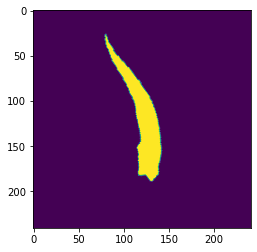

8921


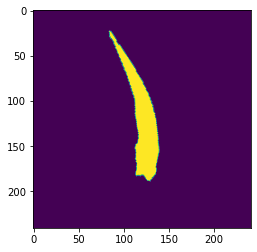

8923


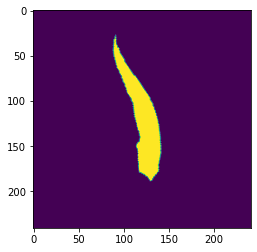

8924


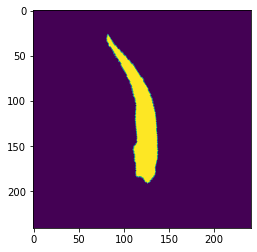

8927


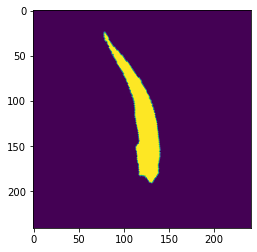

8948


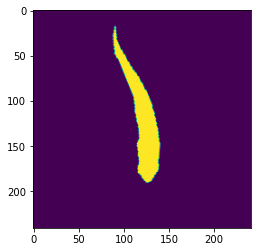

9010


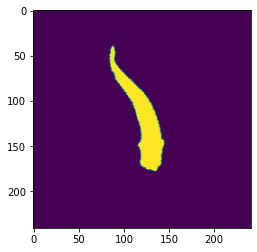

9098


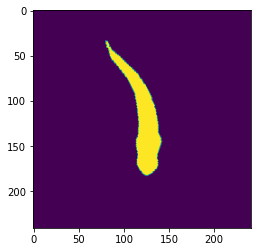

9129


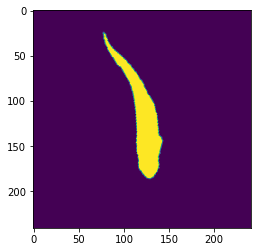

9213


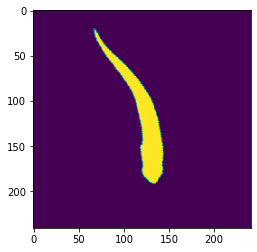

9221


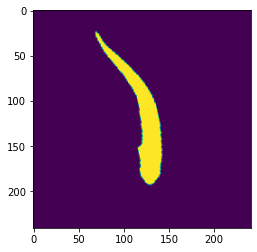

9241


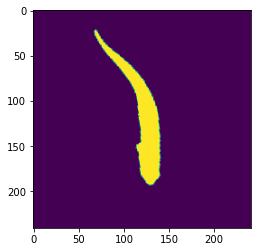

9301


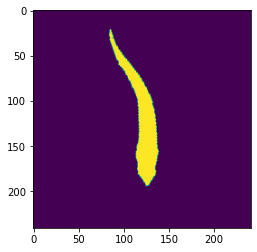

9304


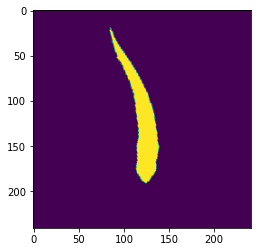

9322


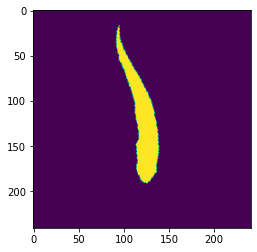

9467


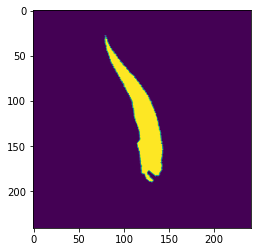

9475


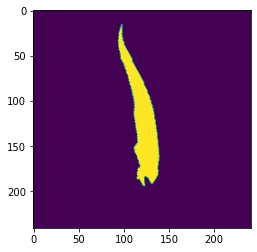

9478


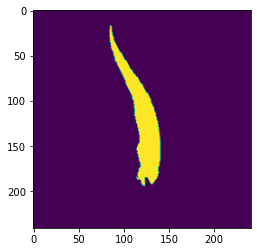

9482


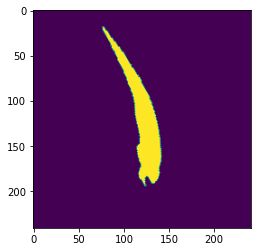

9483


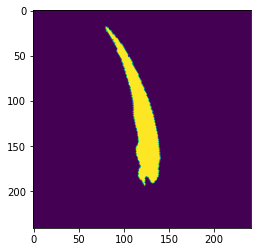

9485


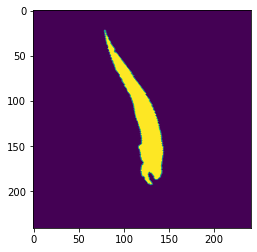

9619


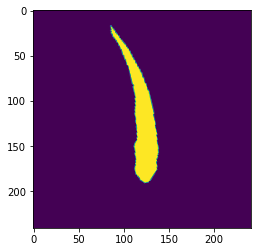

9627


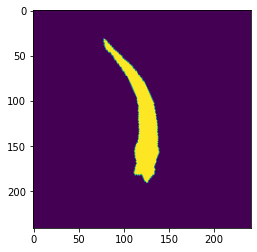

9664


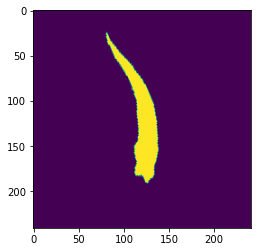

9667


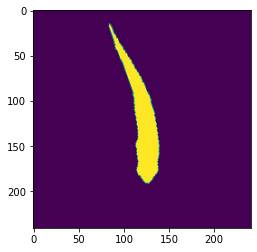

9668


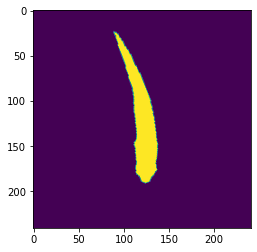

9696


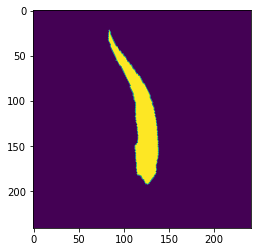

9702


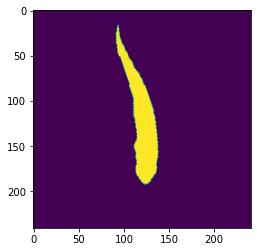

9716


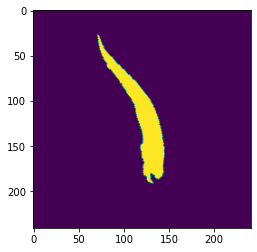

9840


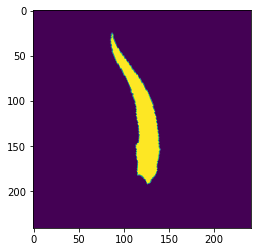

9847


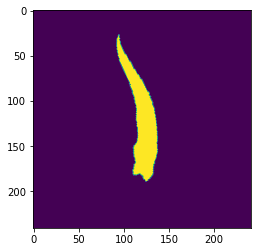

9854


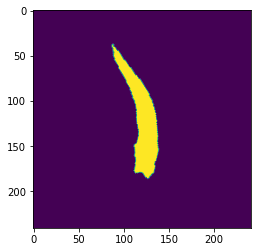

9857


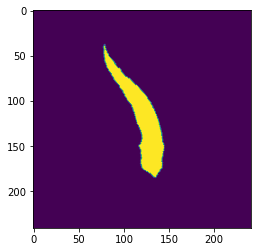

9935


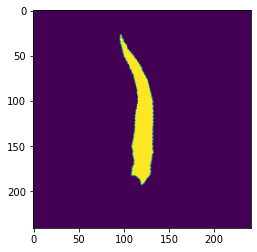

9942


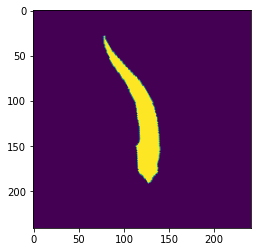

9945


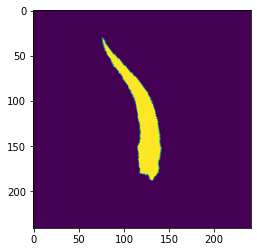

9948


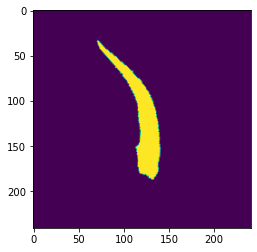

9972


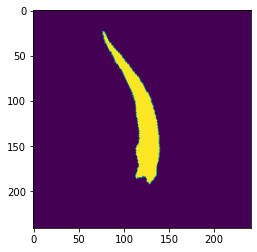

9975


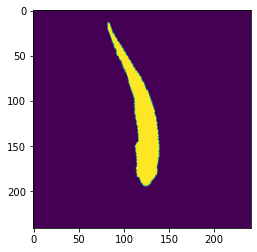

9981


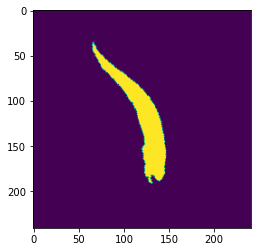

9984


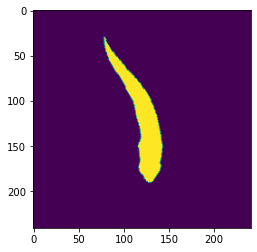

9995


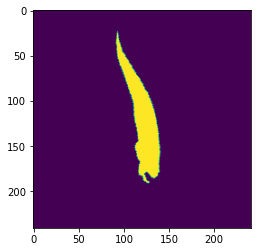

9998


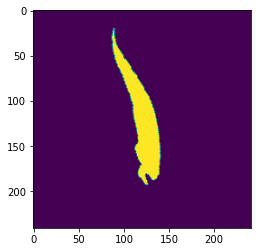

10003


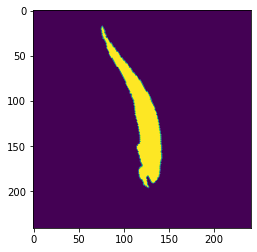

10006


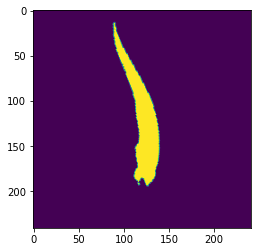

10007


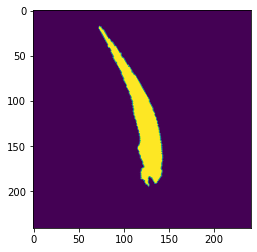

10010


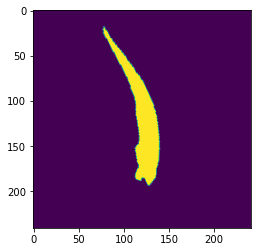

10012


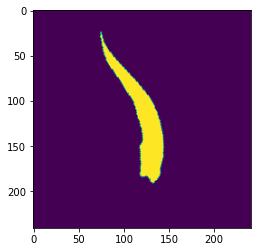

10015


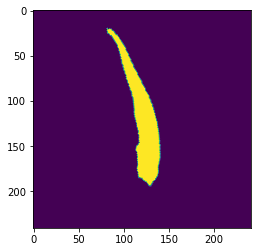

10124


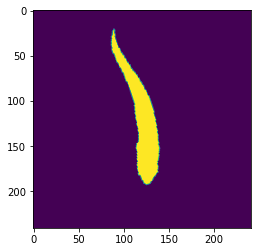

10143


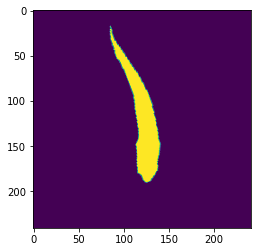

10148


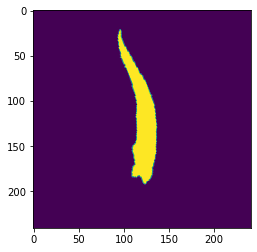

10151


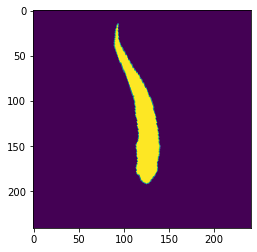

10174


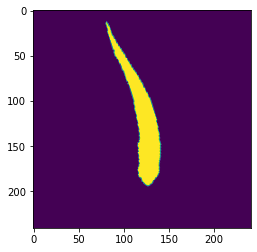

10175


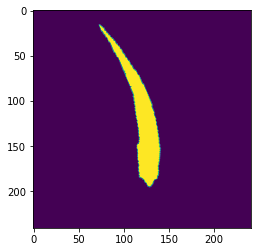

10183


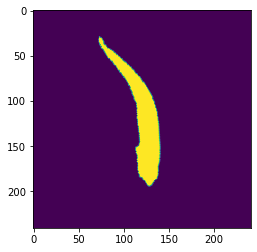

10186


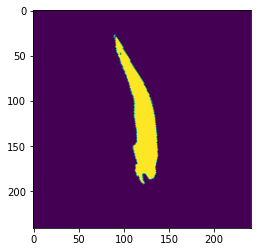

10198


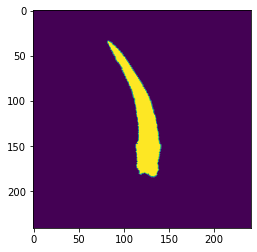

10293


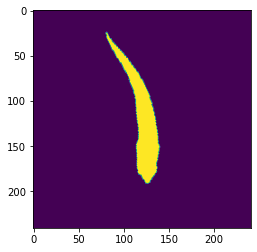

10312


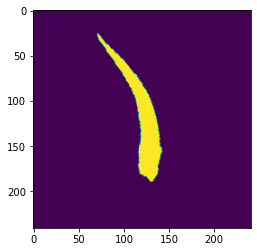

10381


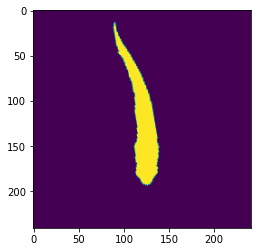

10385


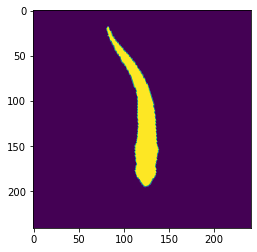

10395


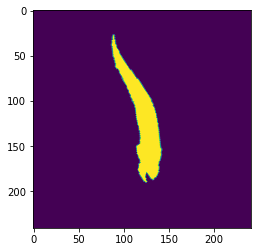

10402


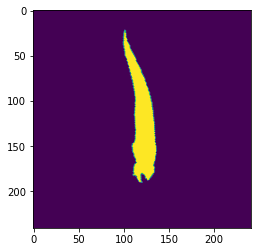

10409


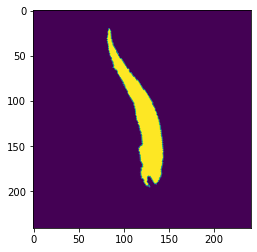

10412


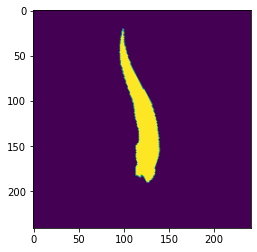

10557


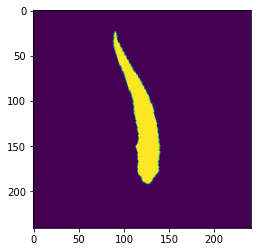

10565


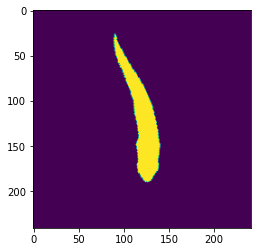

10586


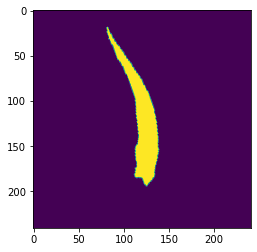

10589


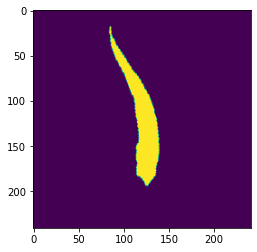

10596


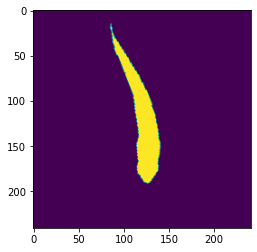

10602


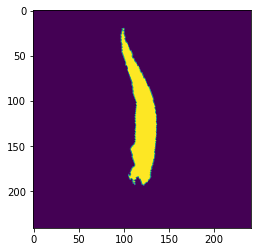

10616


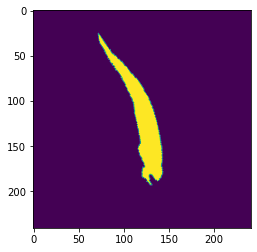

10619


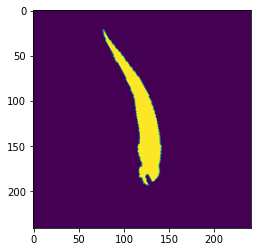

10622


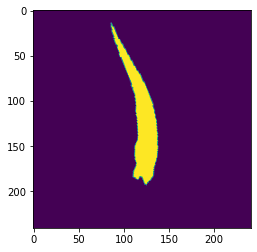

10634


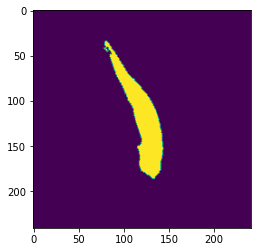

10717


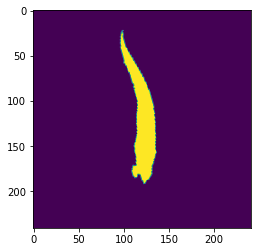

10720


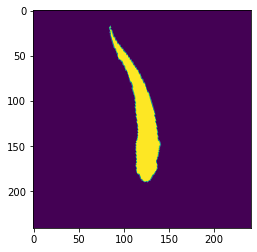

10727


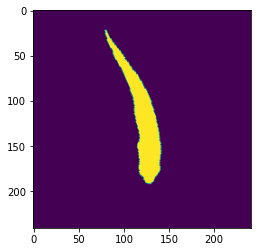

10733


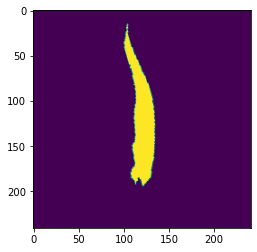

10872


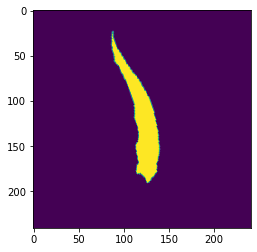

10876


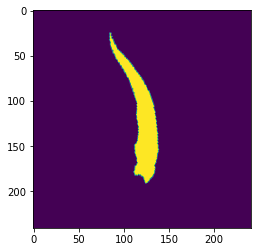

10883


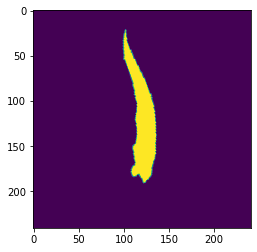

10897


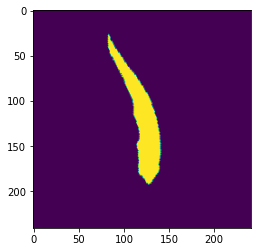

10904


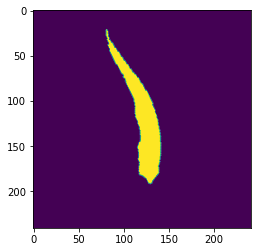

10911


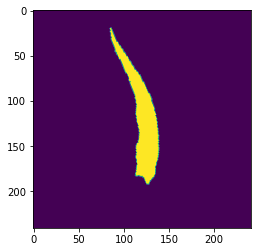

11079


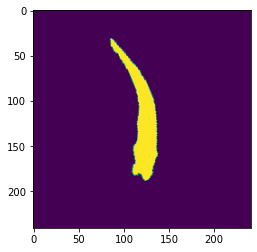

11096


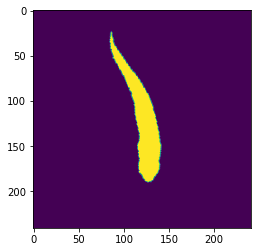

11114


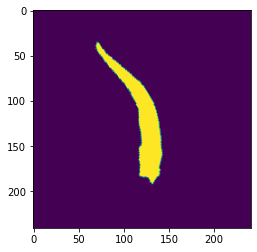

11117


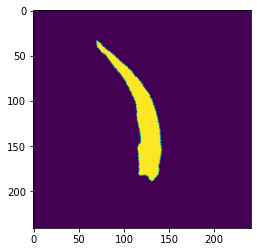

11119


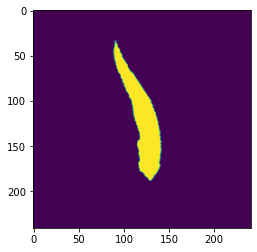

11120


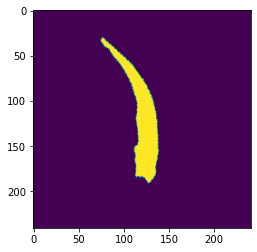

11133


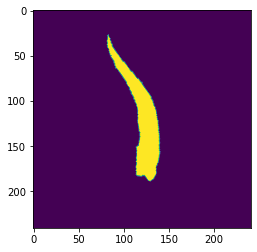

11209


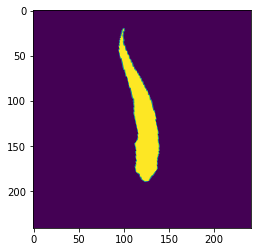

11210


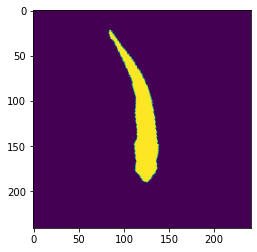

11231


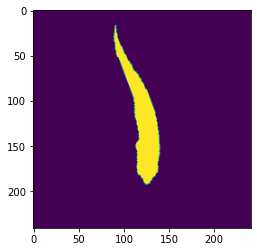

11239


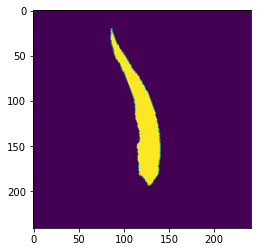

11247


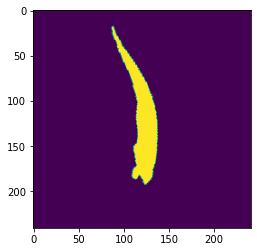

11263


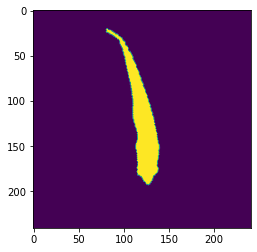

11396


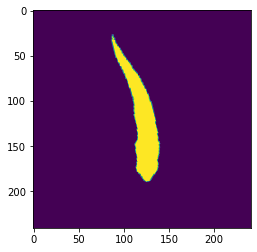

11397


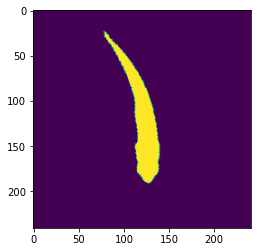

11417


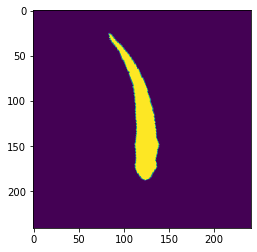

11445


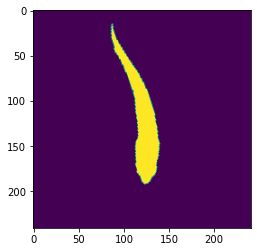

11465


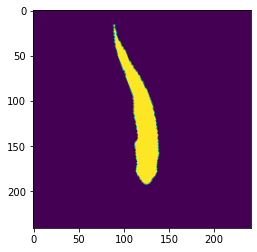

11477


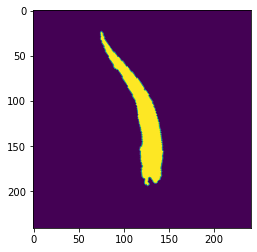

11479


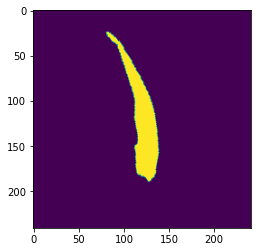

11560


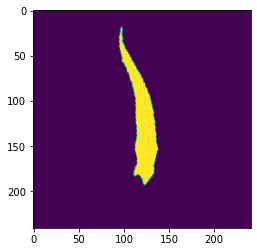

11689


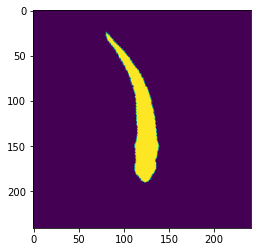

11696


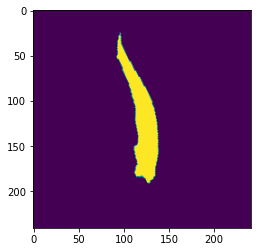

11699


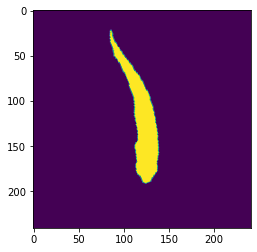

11735


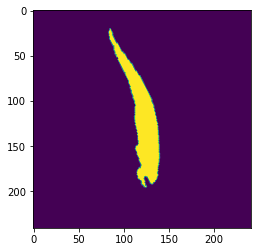

11743


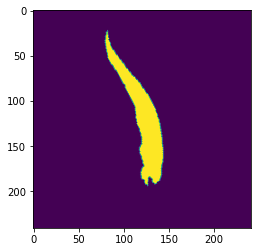

11746


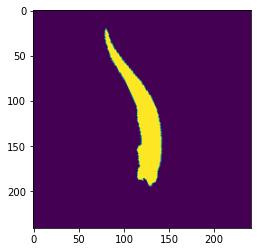

11747


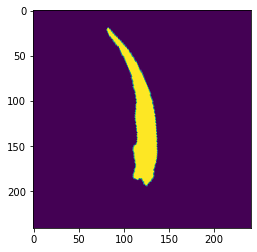

11877


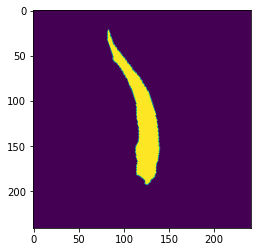

11887


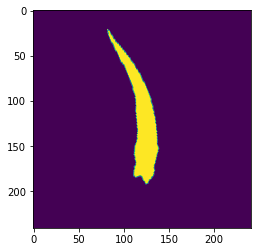

11897


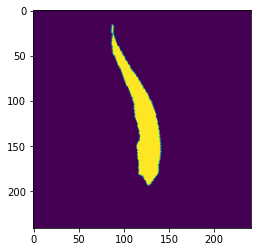

11904


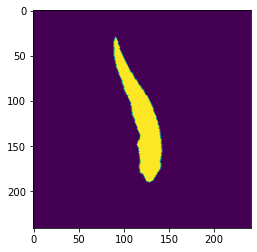

11907


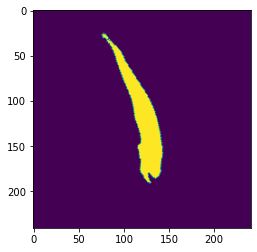

12002


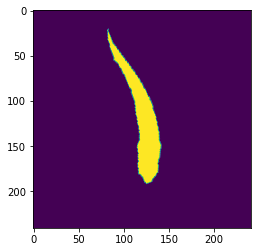

12006


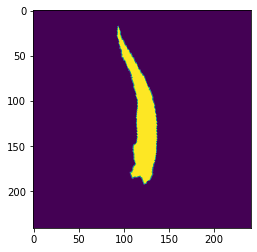

12017


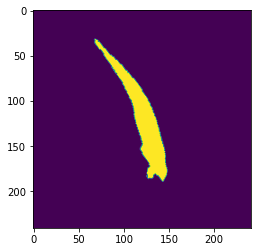

12062


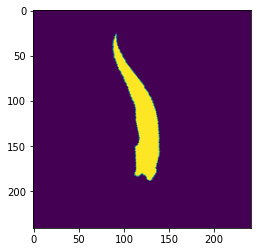

12087


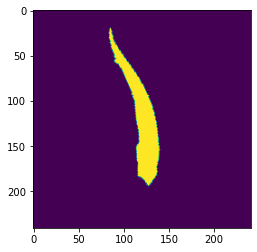

12088


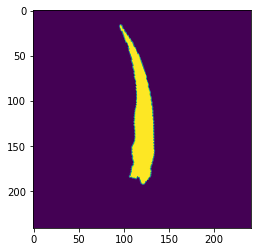

12148


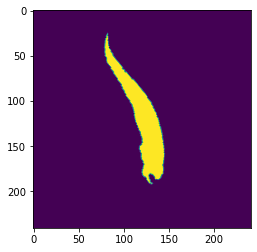

12166


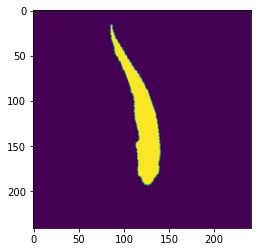

12171


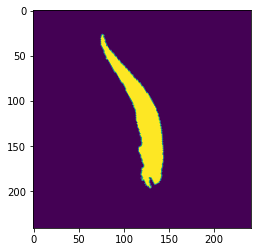

12174


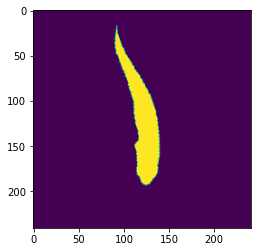

12189


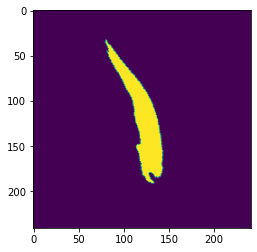

12191


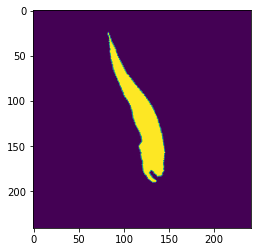

12290


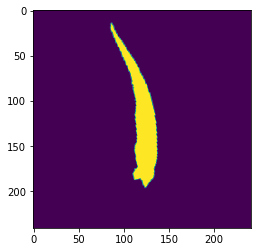

12293


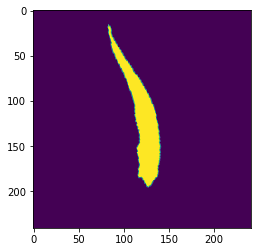

12297


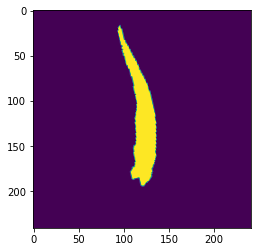

12300


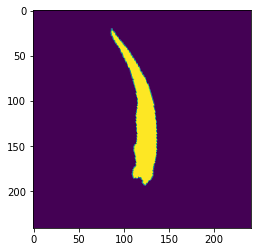

12302


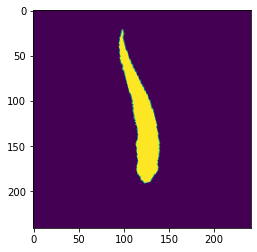

12311


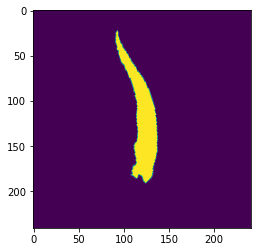

12314


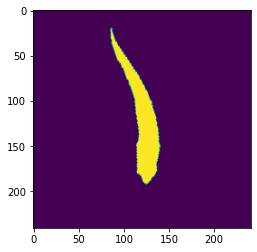

12336


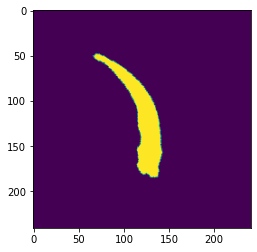

12454


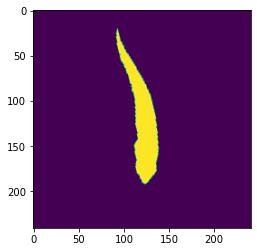

12461


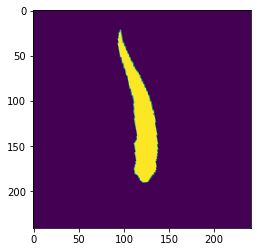

12467


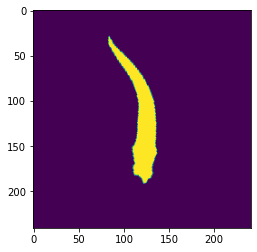

12484


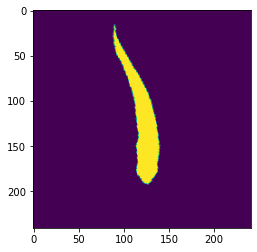

12492


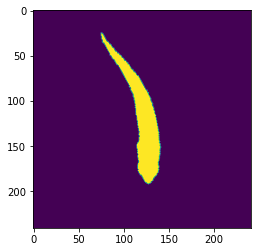

12519


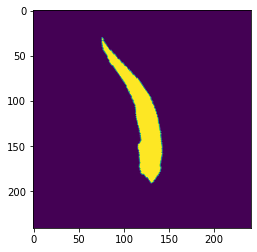

12520


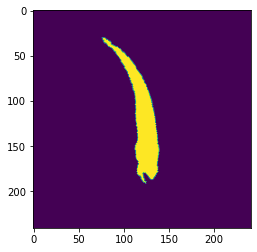

12526


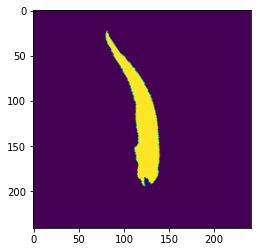

12531


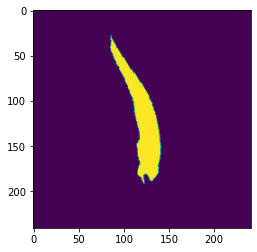

12534


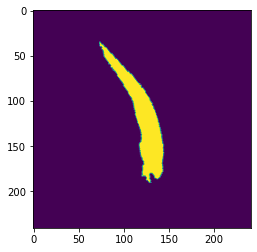

12537


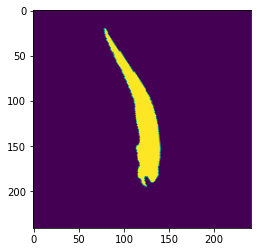

12620


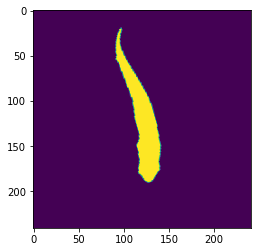

12621


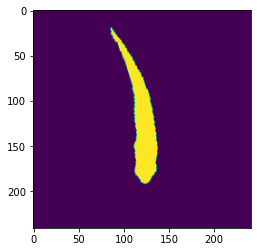

12629


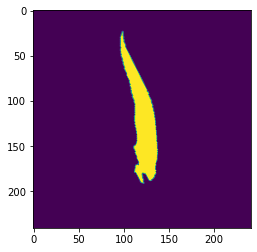

12633


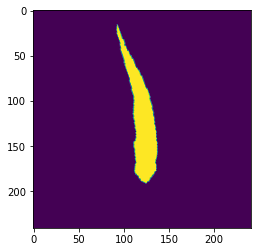

12654


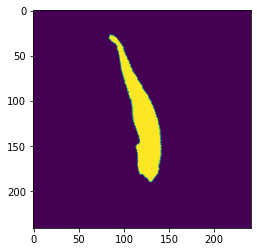

12751


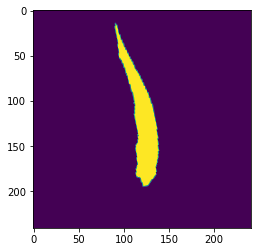

12755


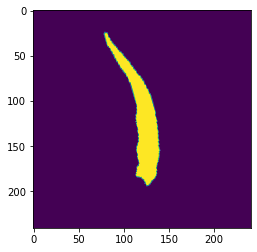

12765


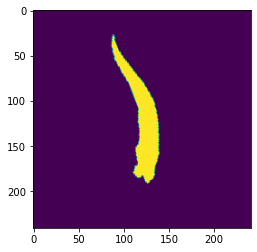

12772


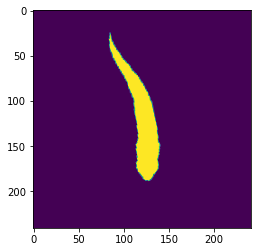

12781


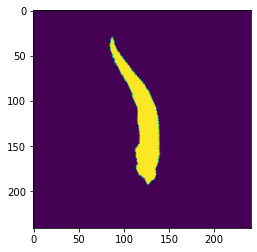

12986


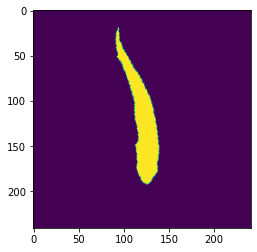

12997


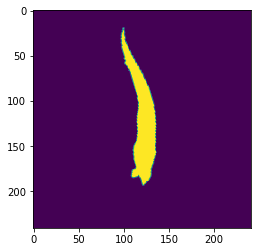

13007


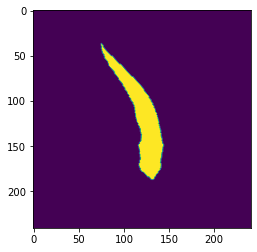

13017


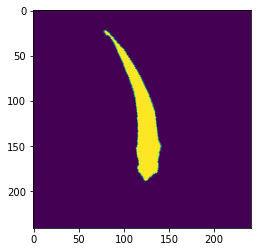

13059


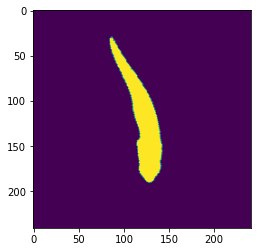

13060


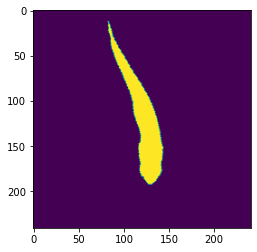

13083


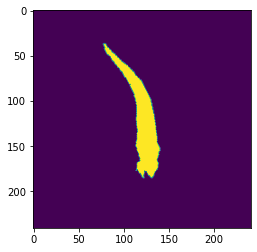

13090


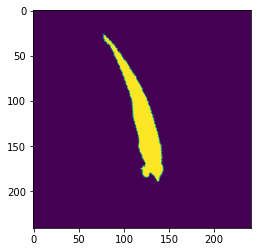

13096


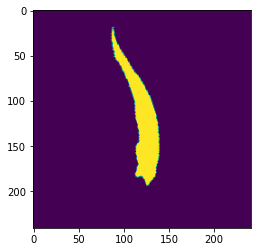

13100


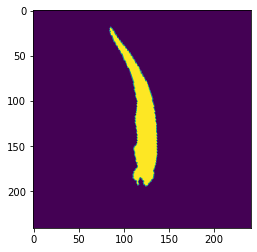

13109


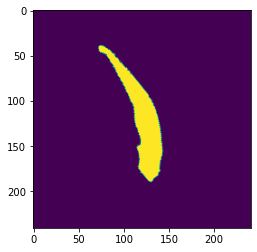

13237


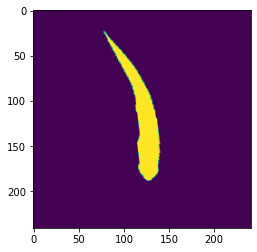

13251


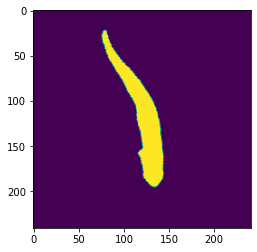

13296


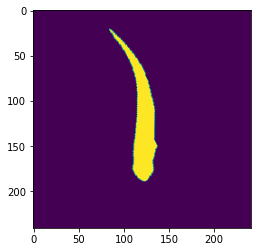

13329


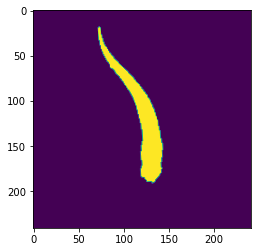

13330


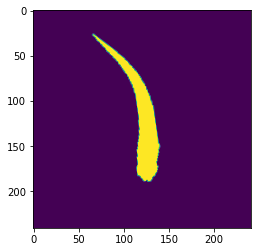

13331


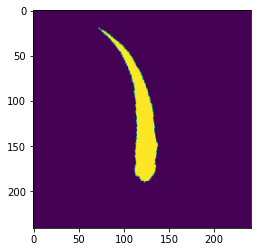

13336


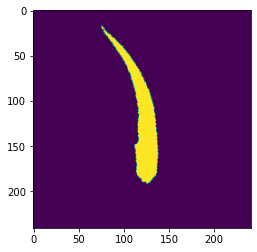

13395


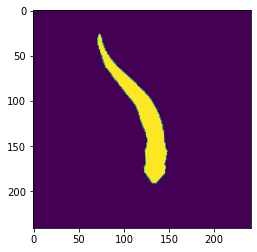

13415


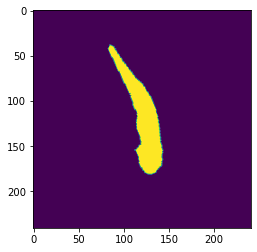

13421


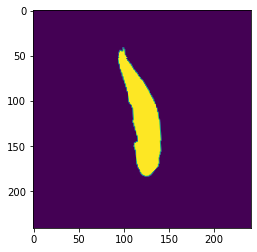

13430


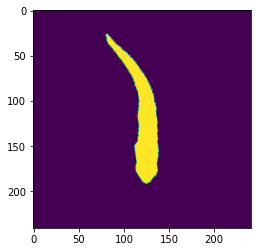

13433


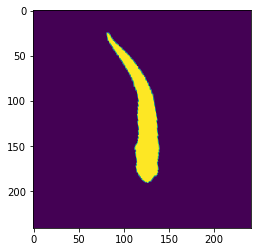

13479


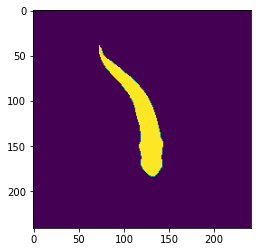

13511


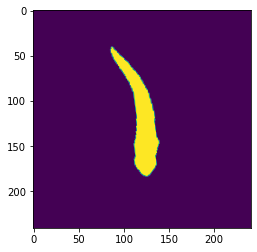

13566


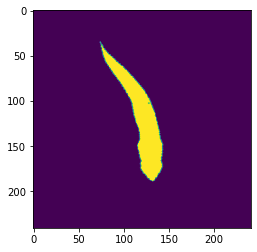

13573


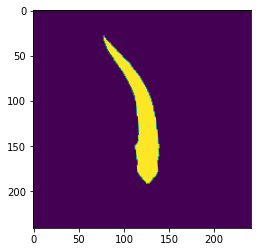

13586


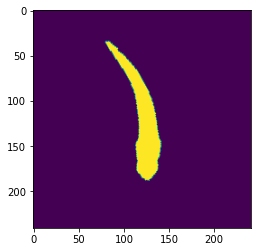

13616


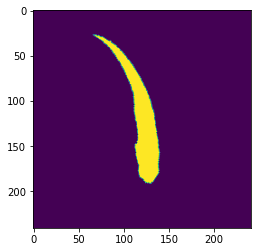

13617


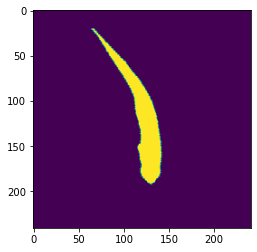

13642


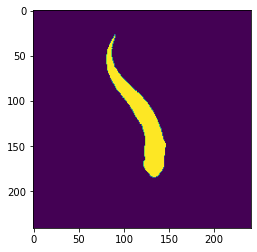

13689


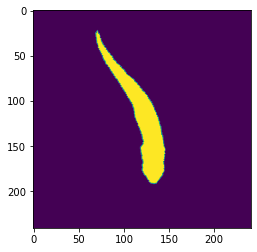

13690


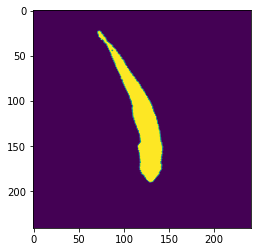

13692


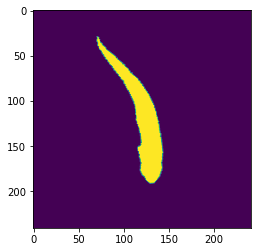

13729


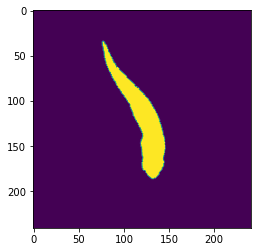

13757


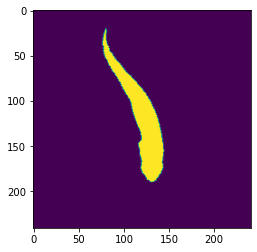

13758


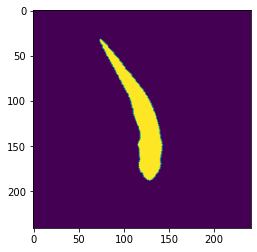

13759


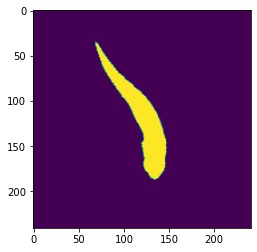

13795


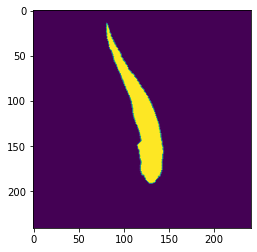

13797


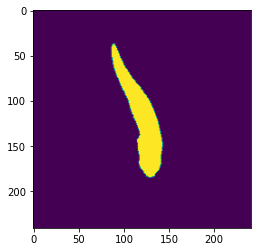

13849


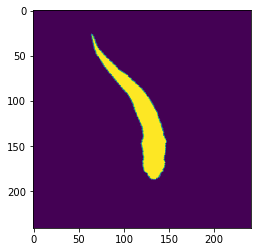

13888


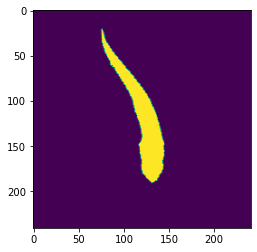

13889


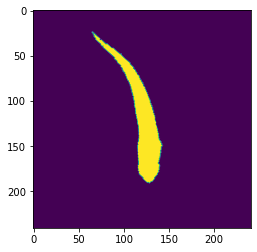

13891


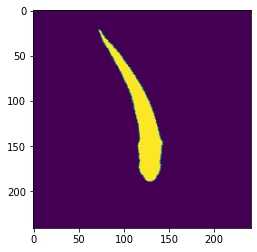

13892


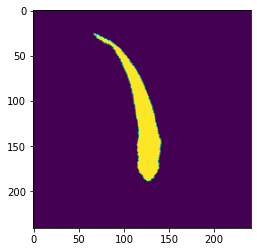

13893


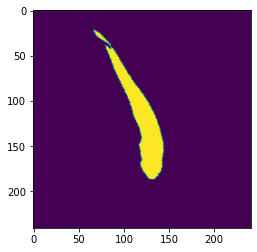

13941


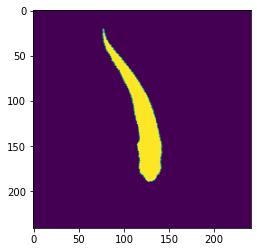

13944


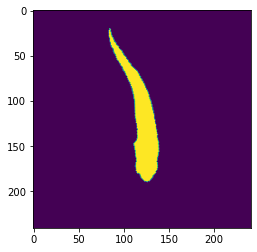

13946


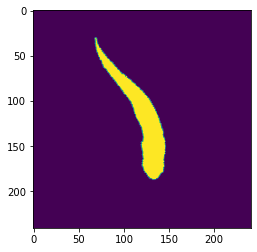

13948


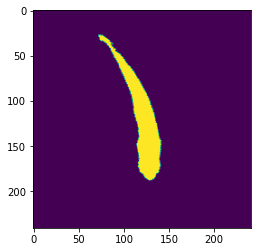

13949


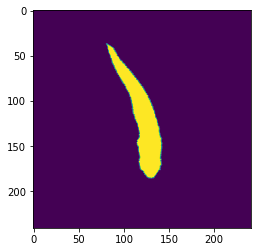

13952


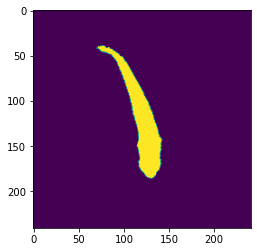

14010


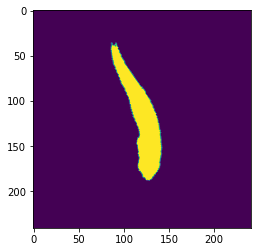

14012


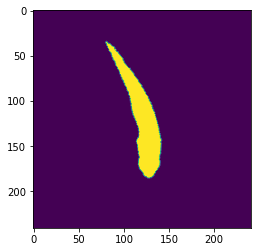

14013


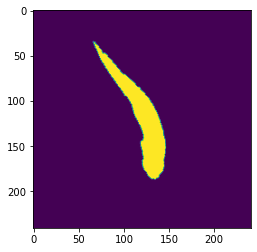

14016


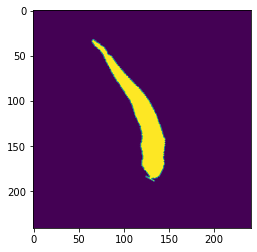

14052


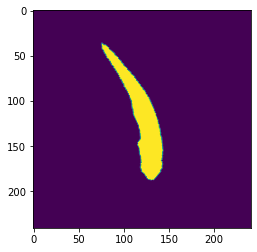

14056


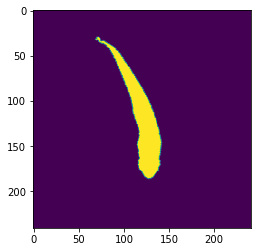

14090


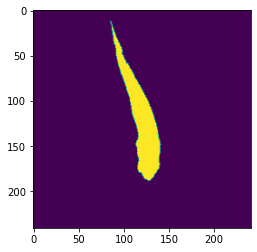

14091


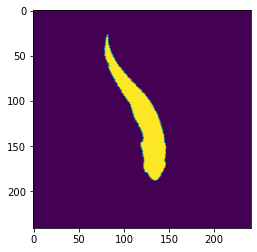

14092


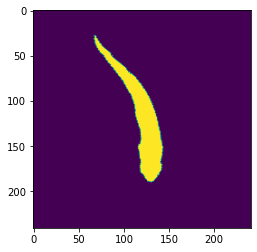

14094


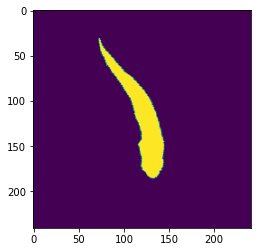

14095


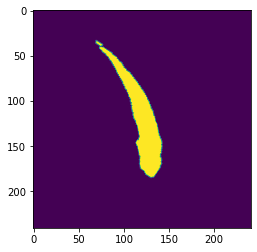

14136


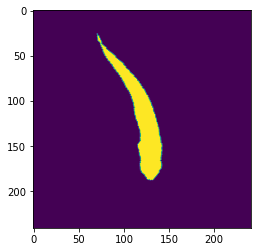

14139


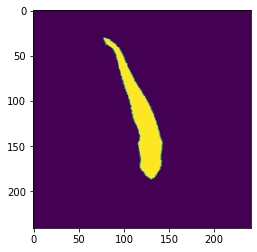

14174


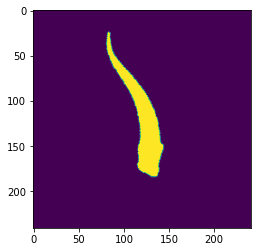

14263


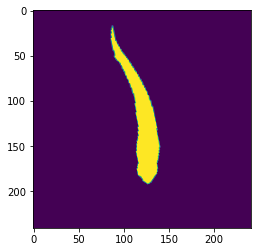

14317


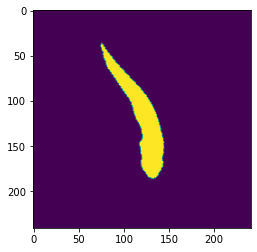

14319


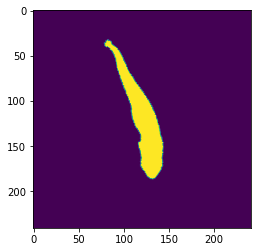

14322


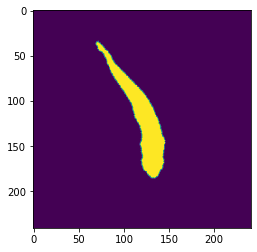

14328


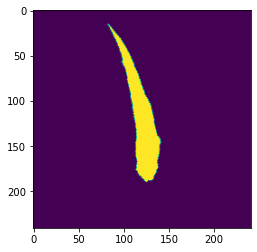

14362


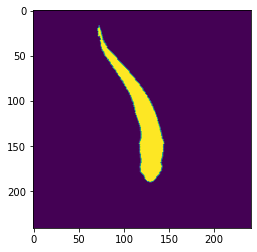

14363


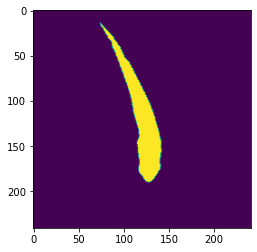

14364


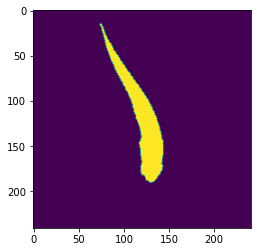

14366


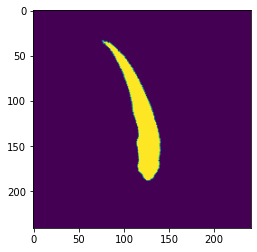

14367


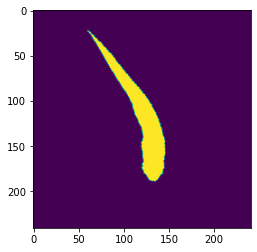

14401


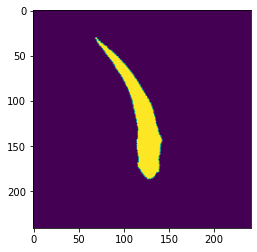

14413


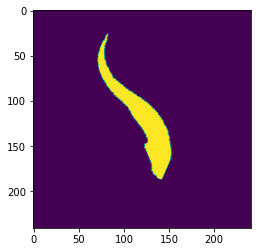

14449


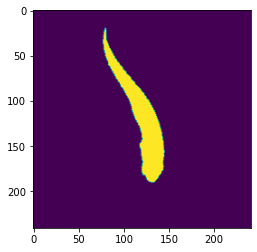

14450


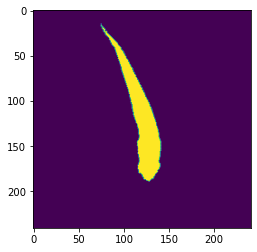

14453


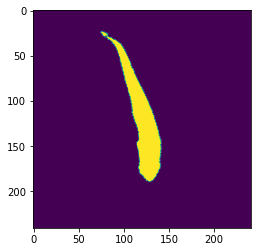

14454


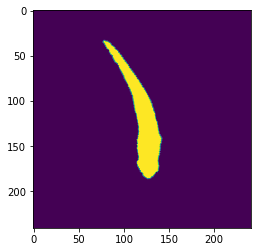

14536


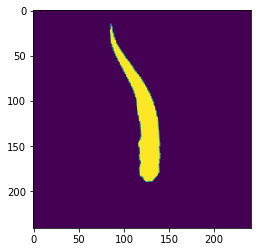

14544


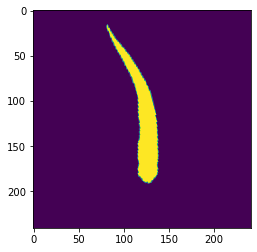

14594


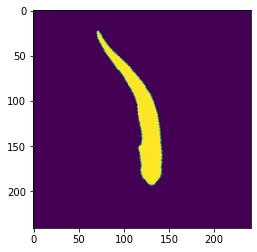

14642


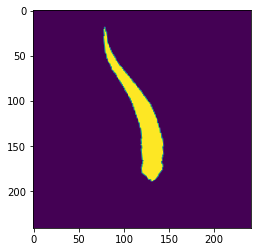

14644


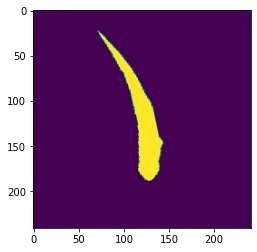

14727


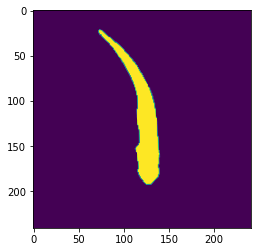

14736


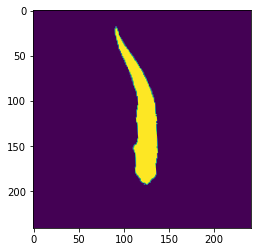

14914


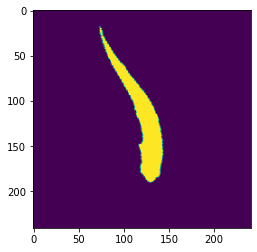

14928


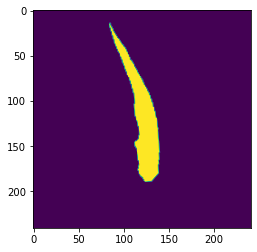

14955


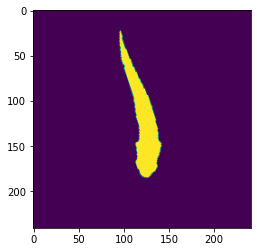

15142


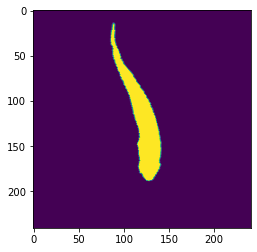

15143


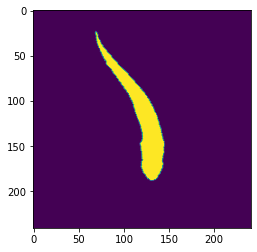

15186


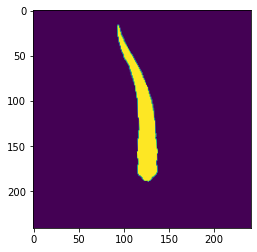

15189


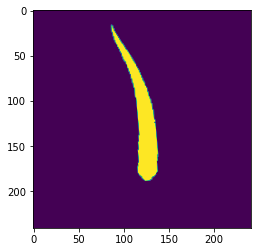

15195


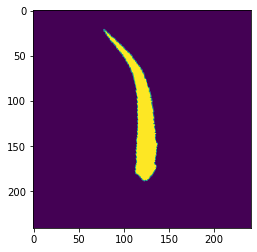

15197


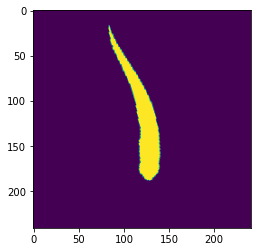

15198


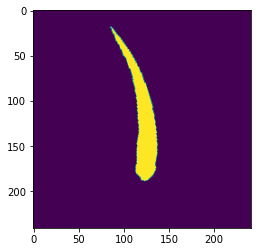

15200


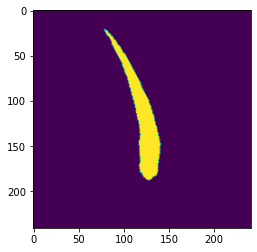

15244


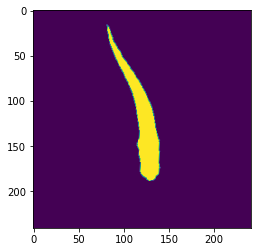

15265


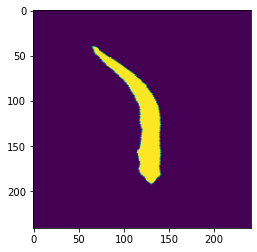

15299


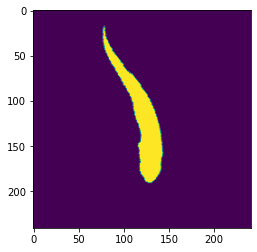

15300


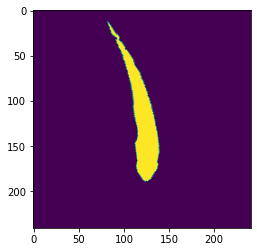

15302


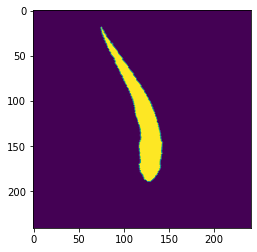

15303


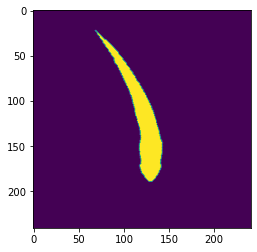

15304


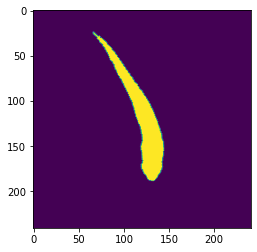

15352


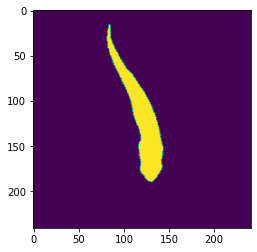

15354


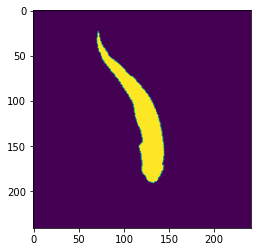

15355


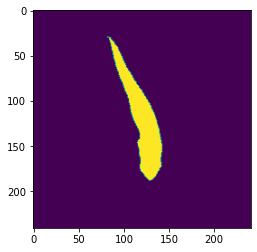

15356


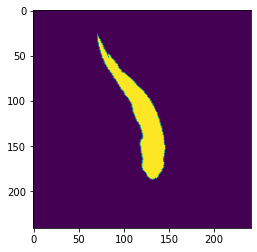

15358


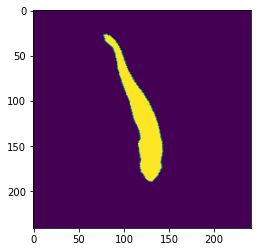

15360


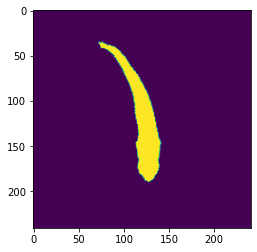

15361


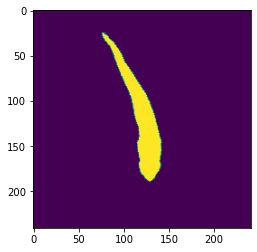

15406


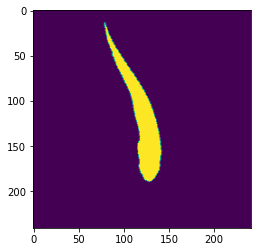

15408


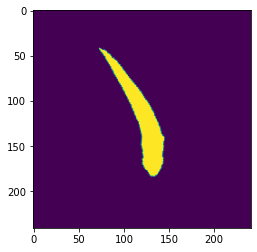

15443


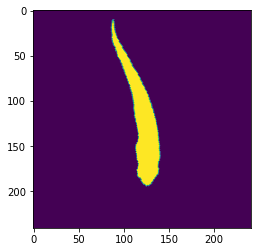

15445


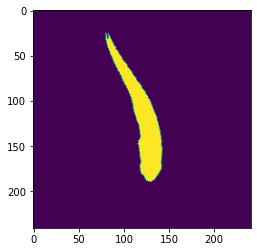

15446


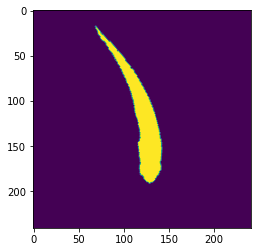

15448


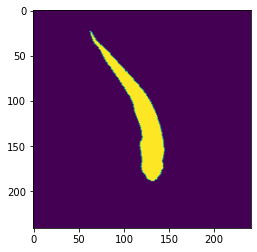

15450


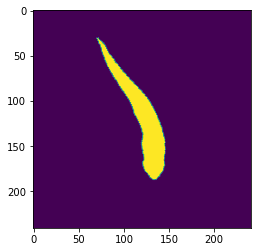

15454


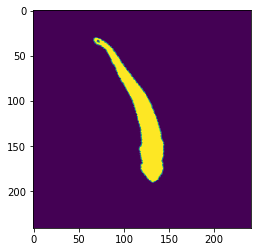

15489


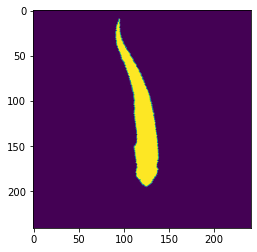

15491


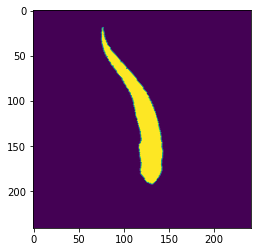

15493


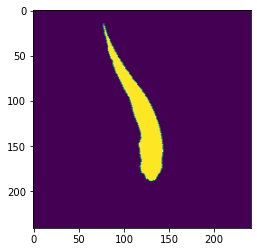

15494


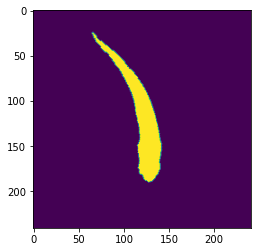

15495


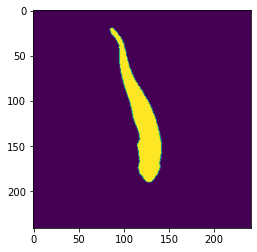

15533


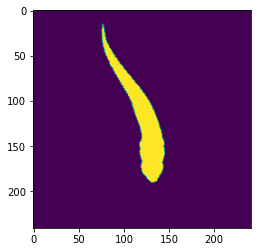

15536


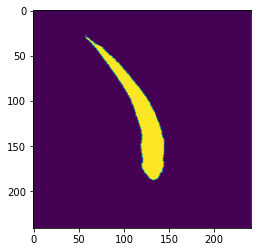

15572


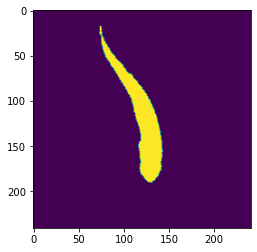

15574


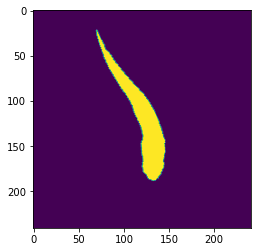

15609


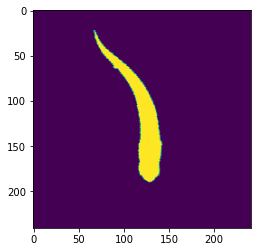

15621


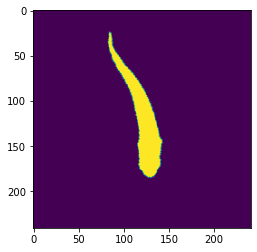

15623


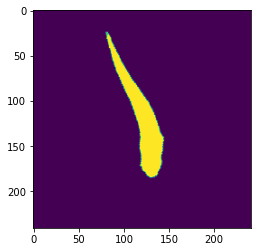

15646


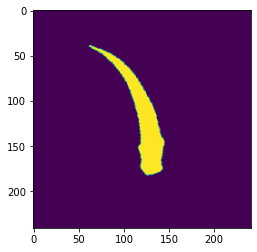

15729


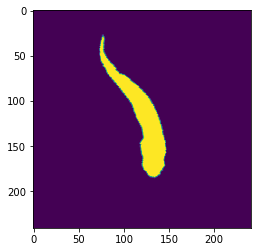

15731


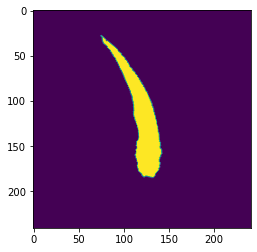

15733


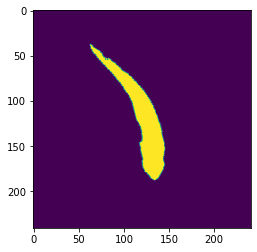

15780


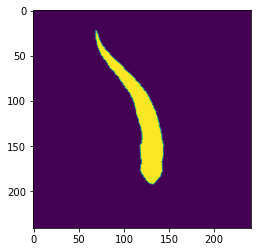

15781


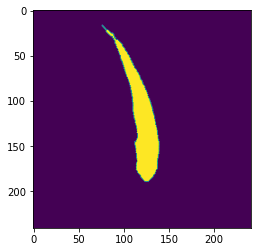

15782


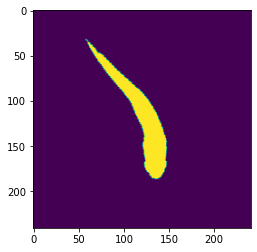

15822


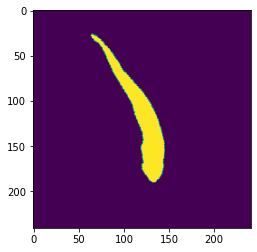

15834


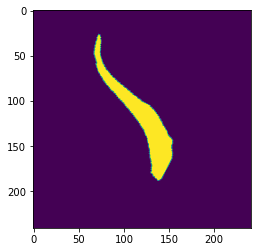

15861


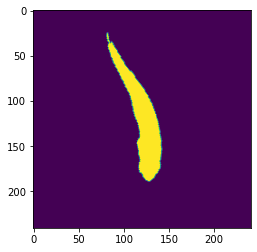

15863


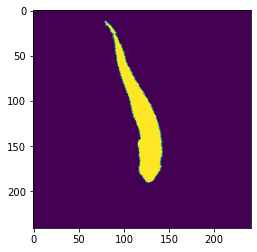

15867


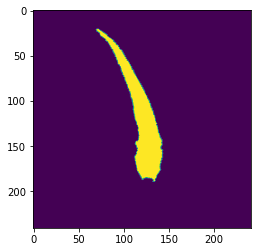

15915


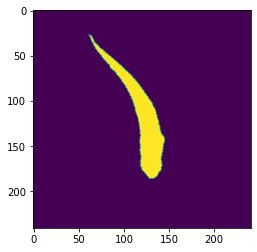

15917


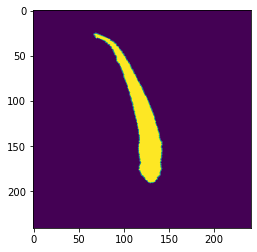

15939


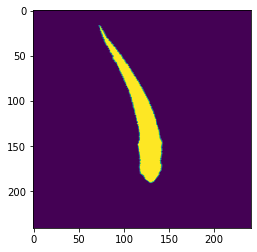

15946


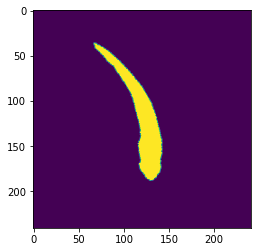

15973


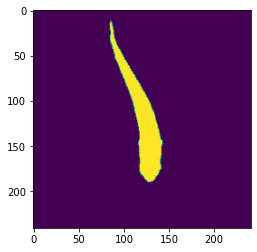

15974


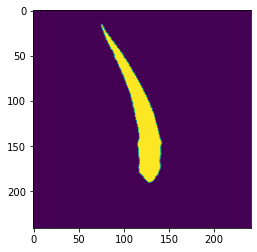

15975


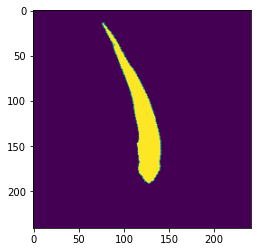

16027


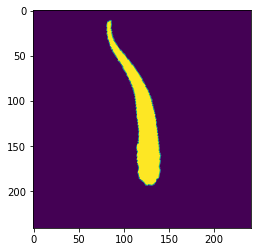

16032


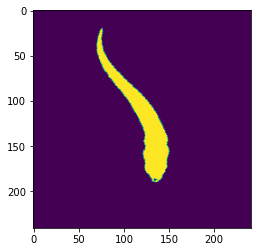

16042


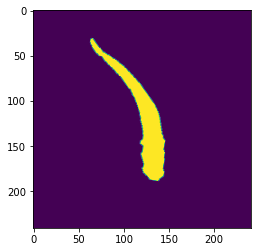

16120


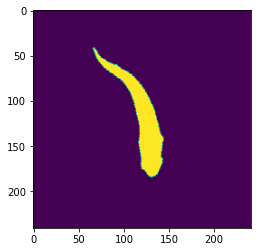

16123


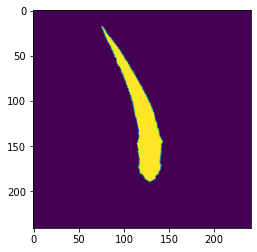

16124


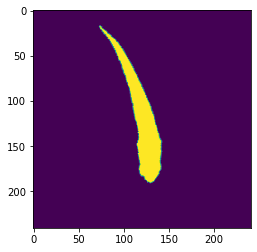

16158


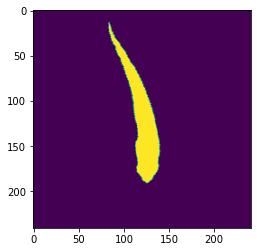

16161


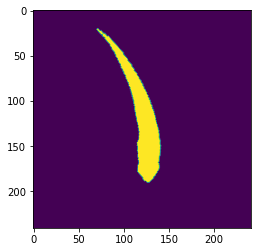

16162


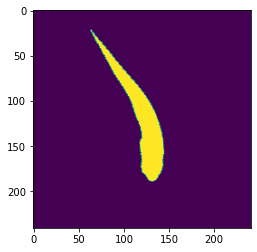

16165


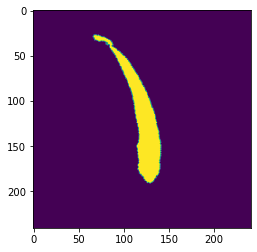

16187


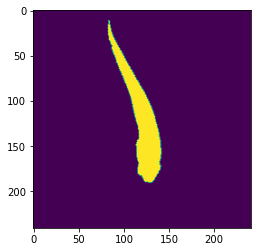

16188


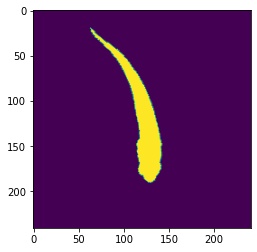

16190


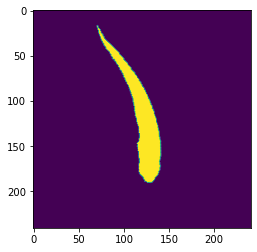

16192


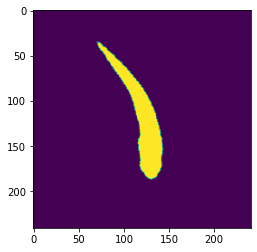

16227


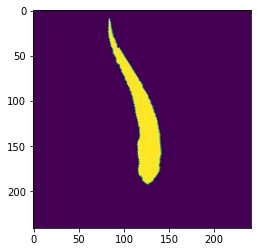

16230


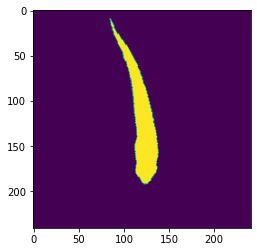

16232


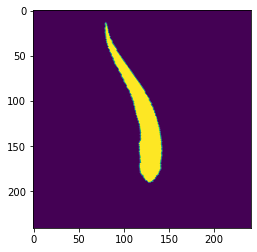

16237


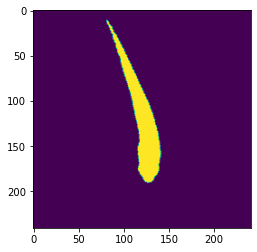

16239


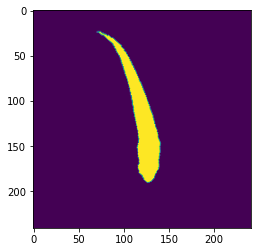

16282


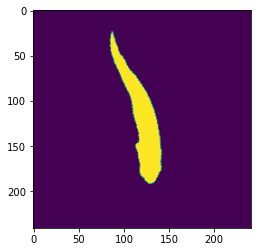

16287


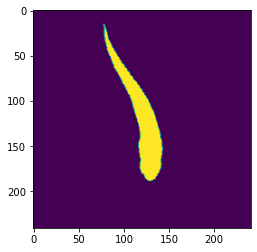

16288


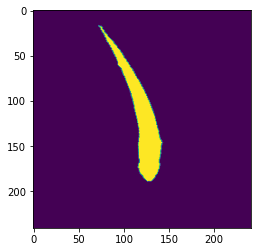

16289


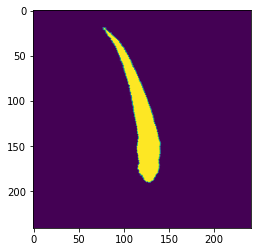

16290


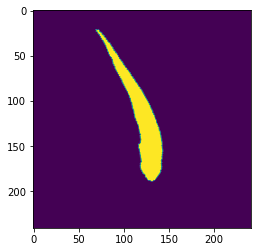

16316


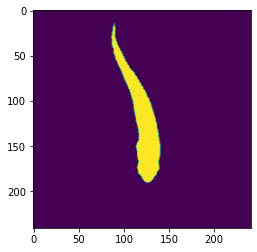

16318


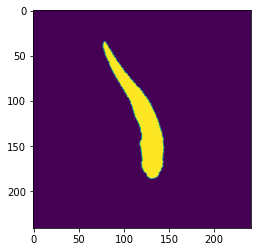

16388


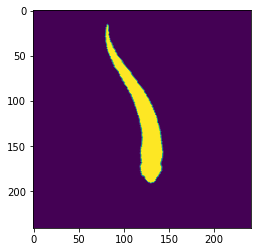

16389


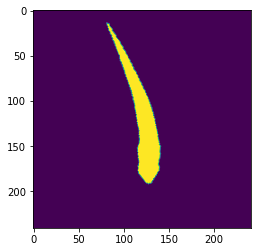

16431


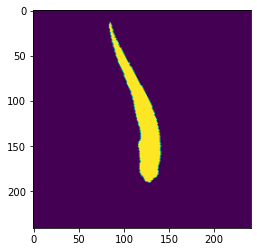

16462


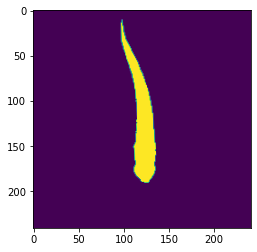

16474


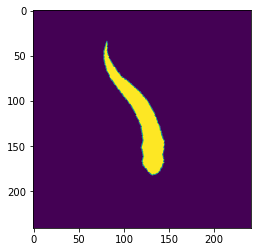

16506


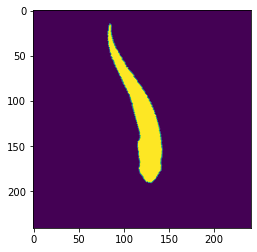

16507


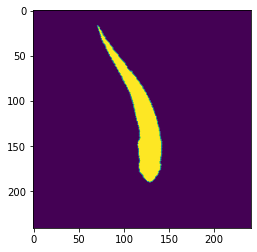

16508


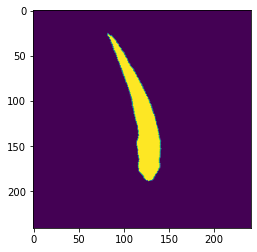

16551


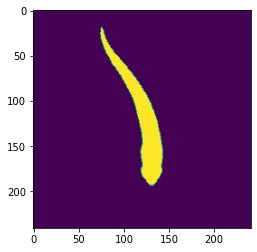

16552


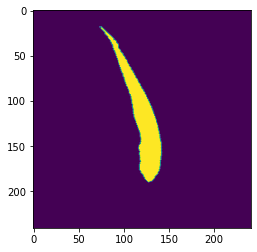

16593


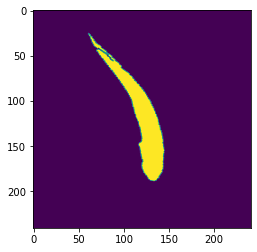

16624


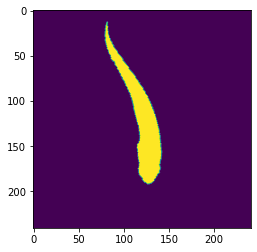

16625


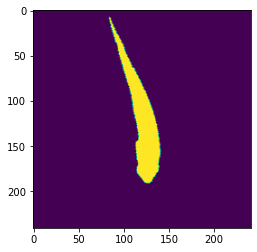

16627


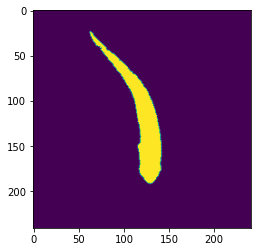

16631


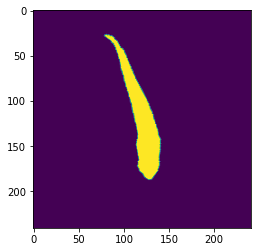

16661


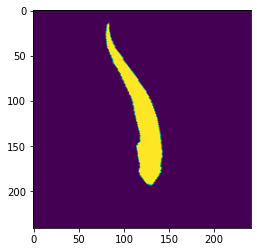

16663


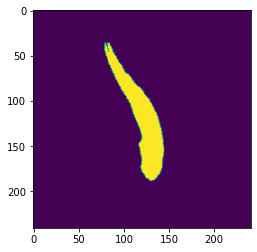

16665


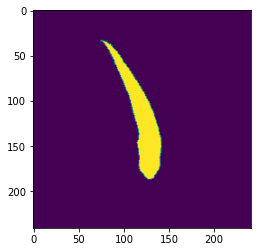

16690


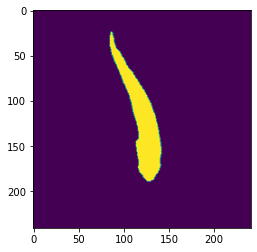

16692


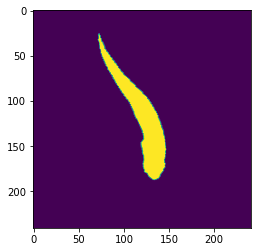

16694


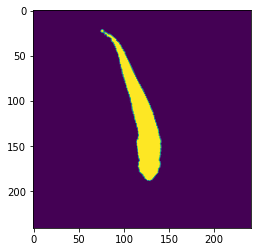

16737


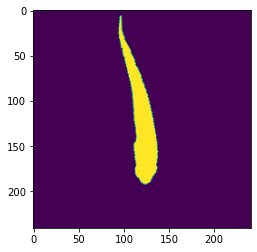

16739


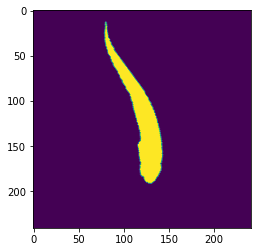

16740


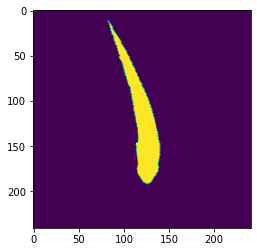

16742


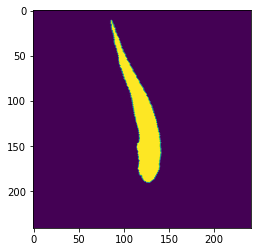

16743


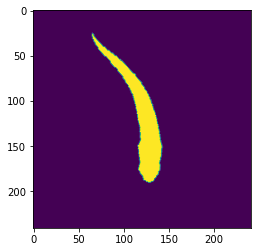

16744


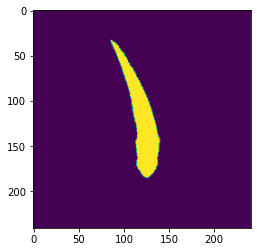

16765


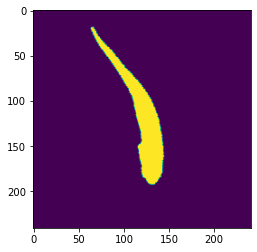

16766


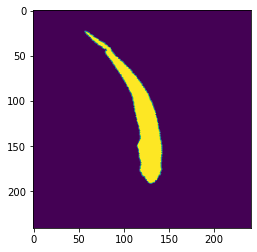

16767


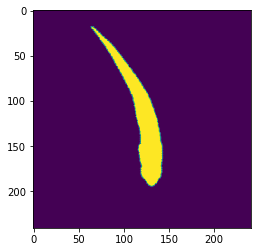

16768


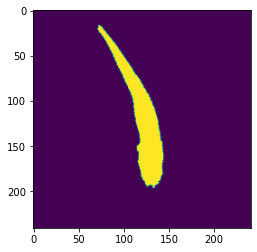

16769


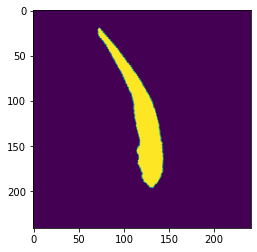

16809


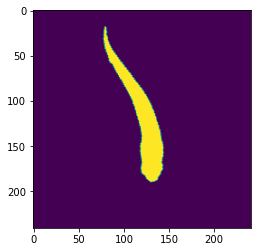

16810


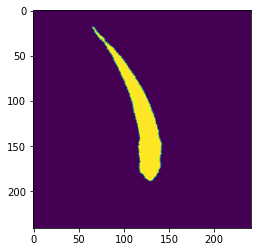

16811


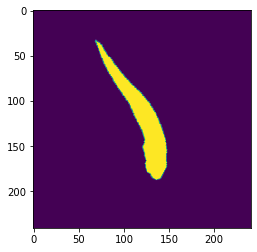

16879


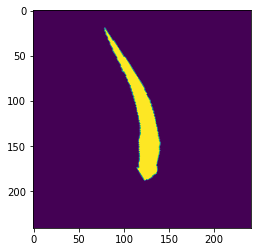

16887


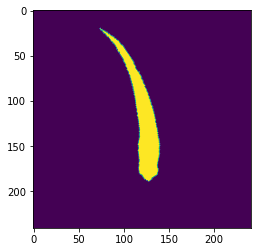

16925


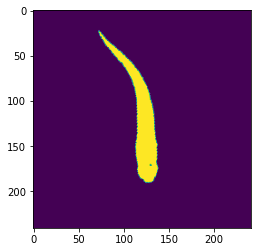

16964


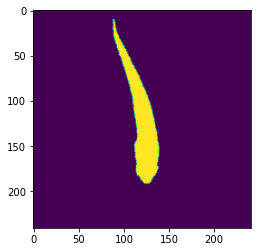

16966


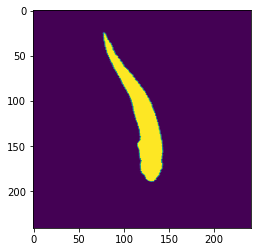

16967


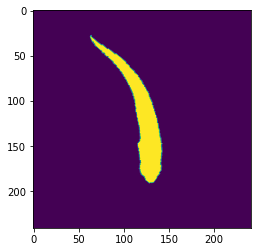

17018


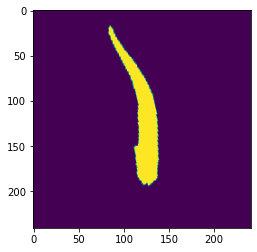

17021


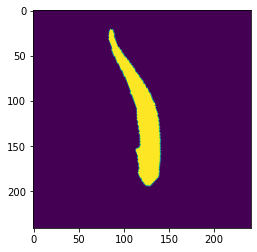

17164


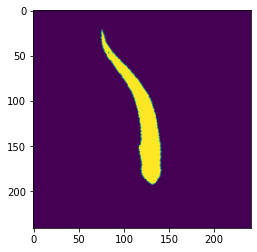

17238


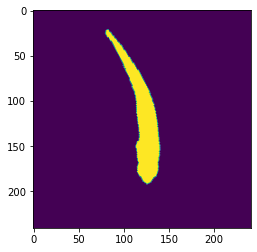

17262


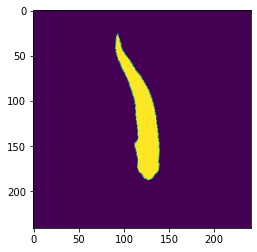

17267


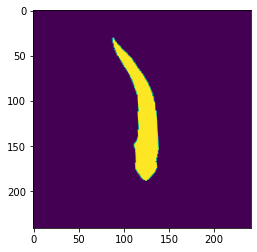

17311


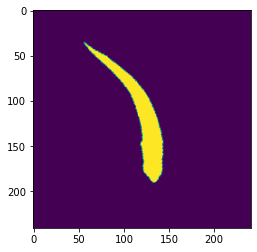

17338


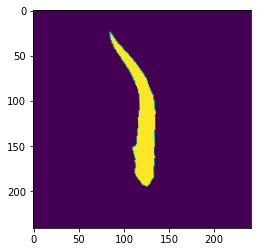

17383


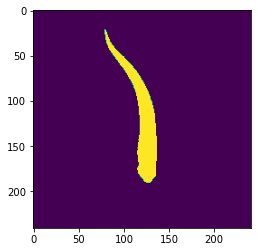

17452


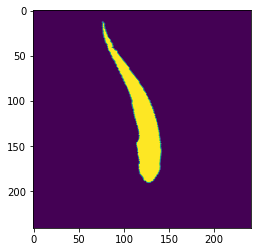

17454


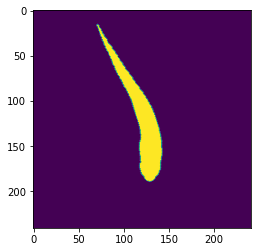

17593


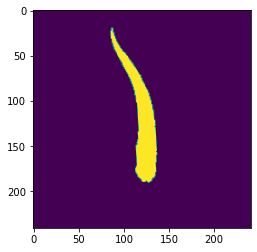

17637


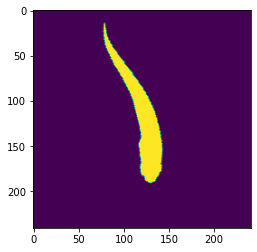

17640


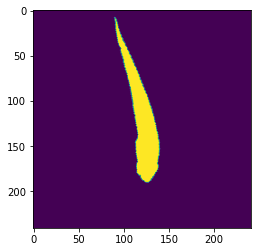

17642


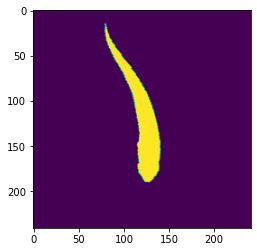

17644


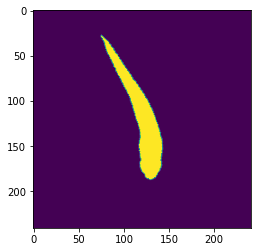

17672


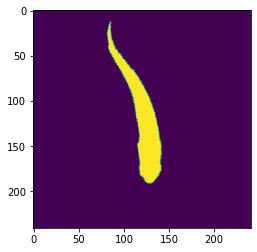

17678


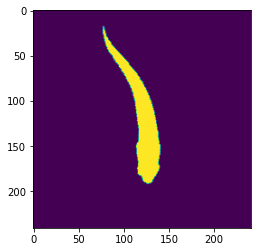

17682


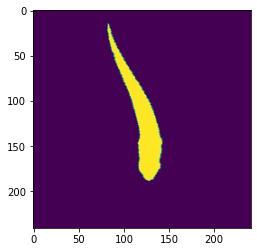

17683


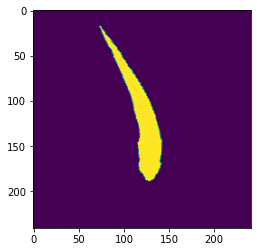

17720


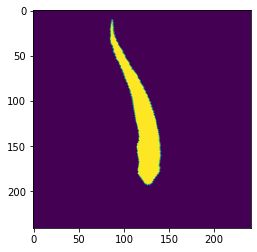

17723


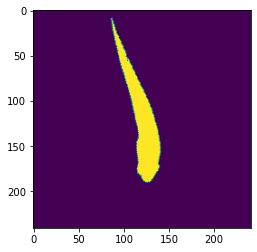

17724


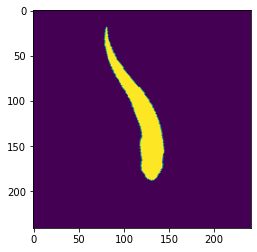

17726


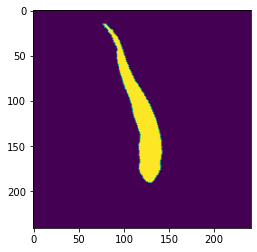

17731


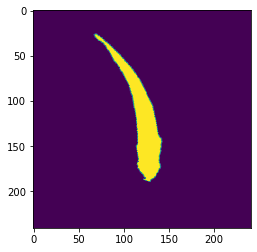

17758


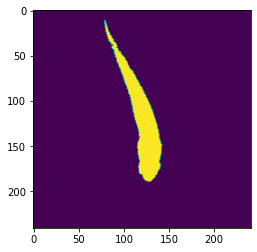

17759


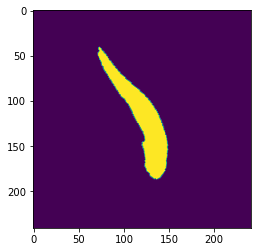

17797


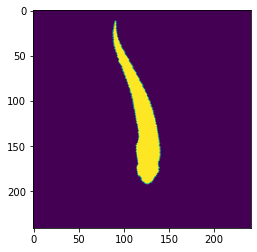

17801


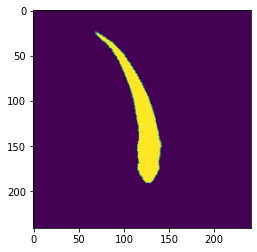

17802


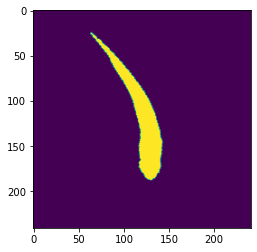

17806


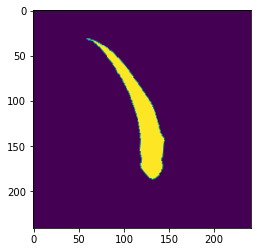

17831


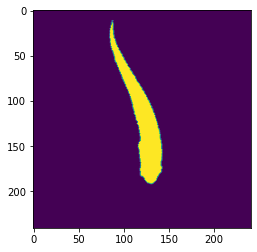

17833


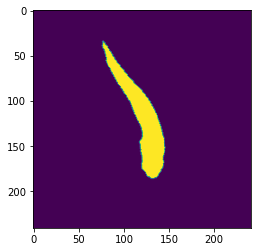

17835


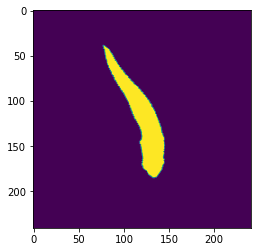

17872


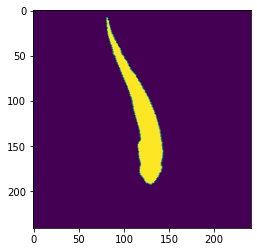

17874


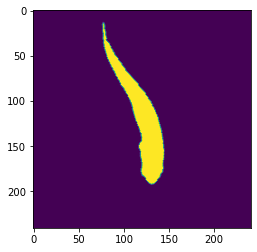

17908


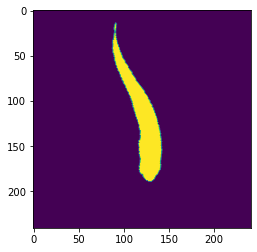

17909


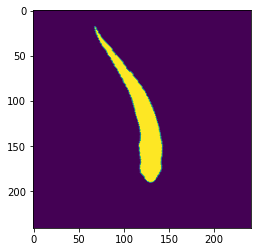

17913


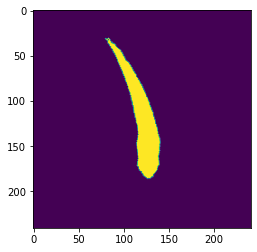

17914


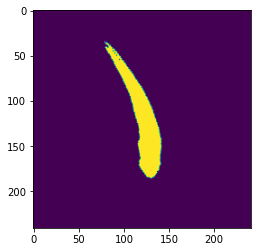

17940


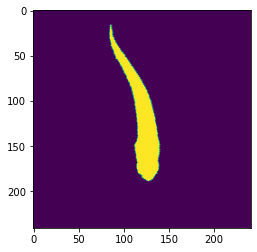

17944


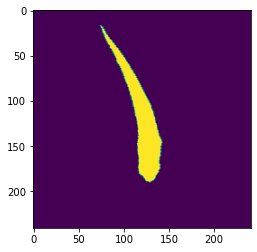

17945


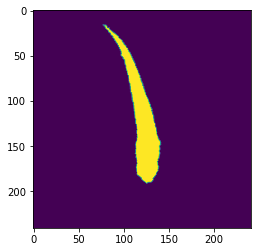

17946


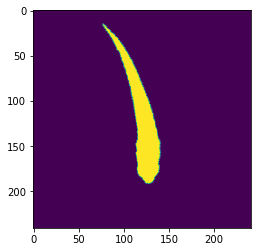

17947


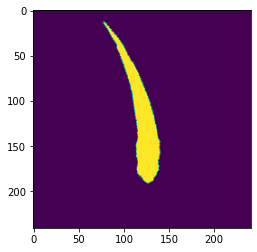

17948


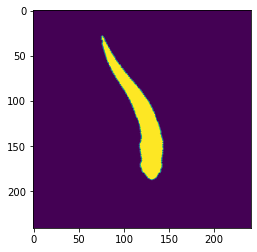

17975


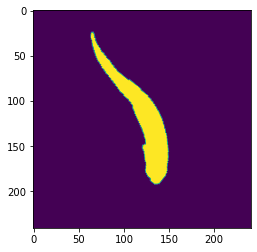

17977


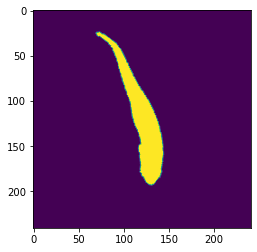

18007


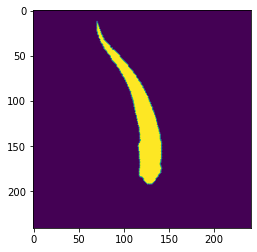

18011


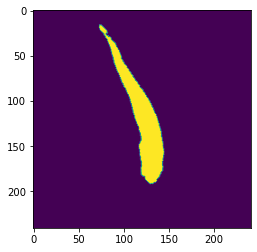

18015


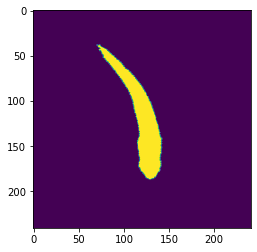

18062


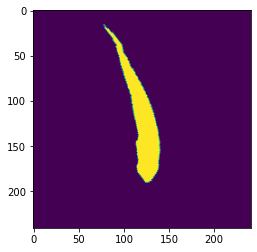

18109


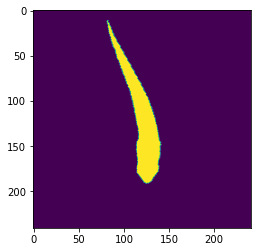

18112


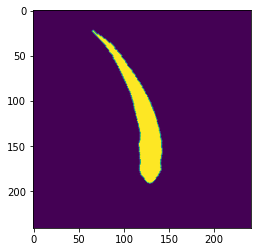

18136


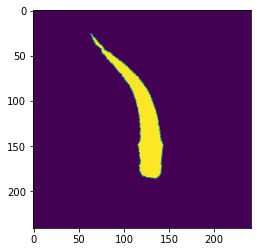

18202


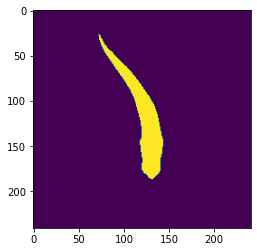

18268


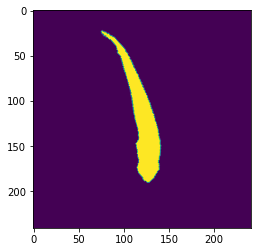

18304


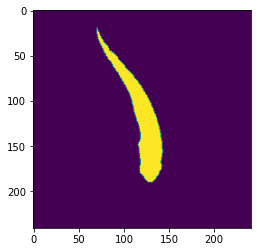

18305


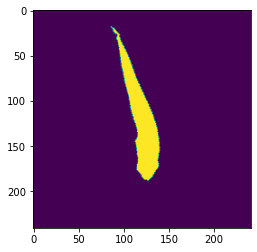

18309


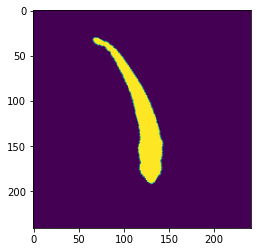

18333


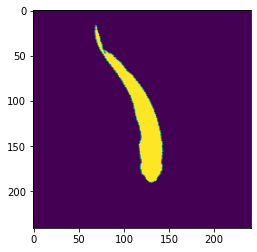

18334


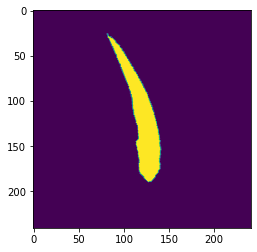

18338


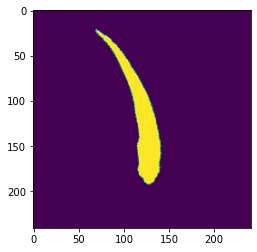

18339


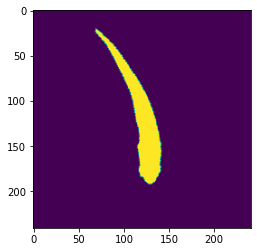

18342


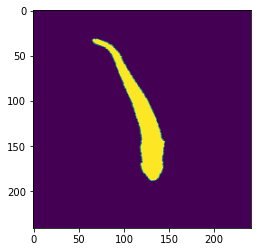

18375


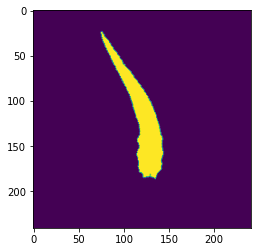

18408


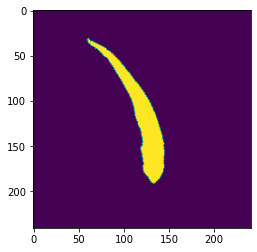

18442


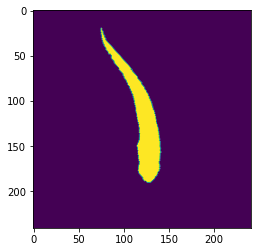

18481


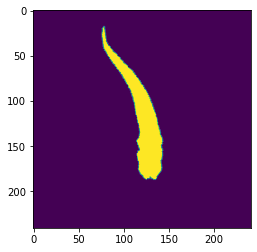

18488


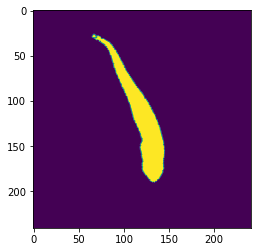

18513


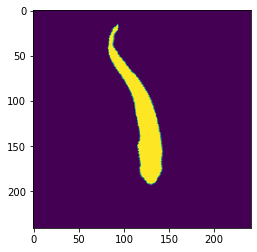

18516


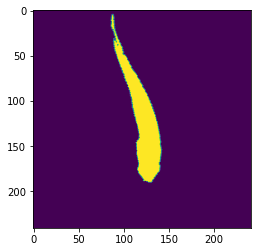

18517


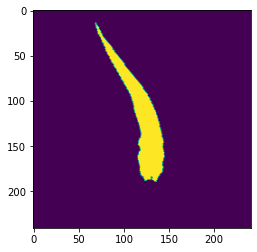

18529


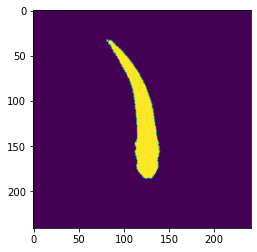

18535


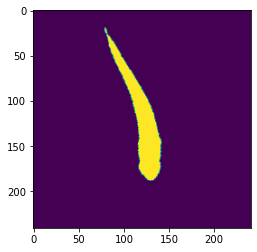

18562


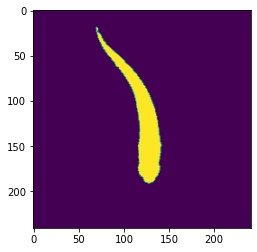

18573


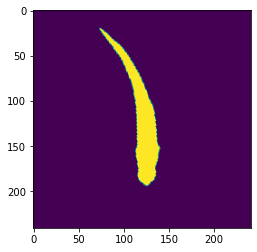

18580


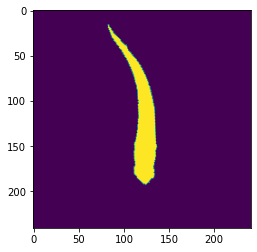

18593


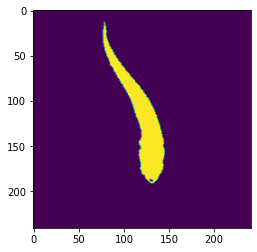

18637


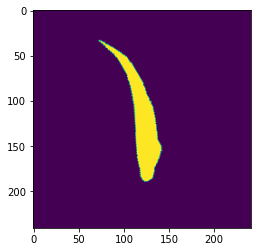

18655


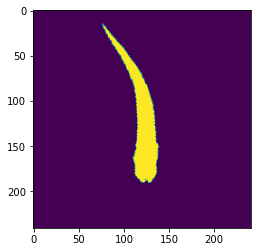

18658


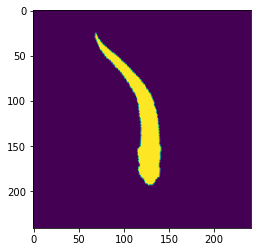

18663


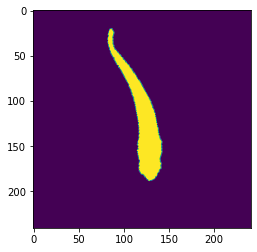

18707


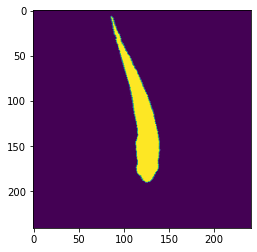

18708


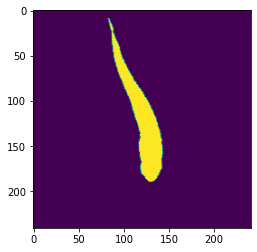

18727


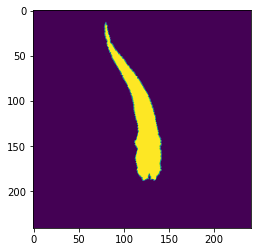

18760


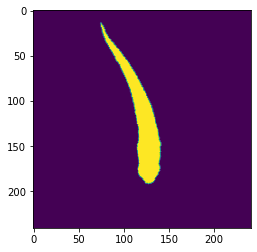

18761


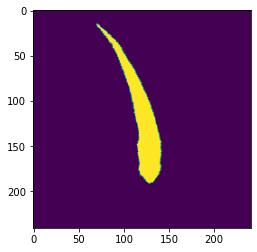

18762


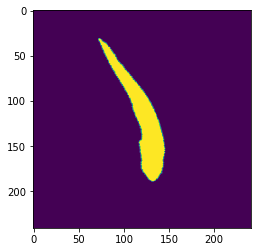

18789


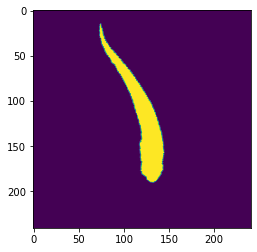

18790


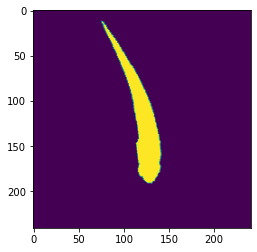

18792


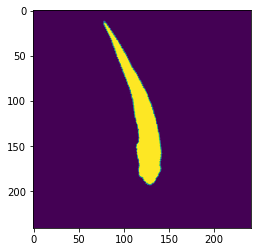

18828


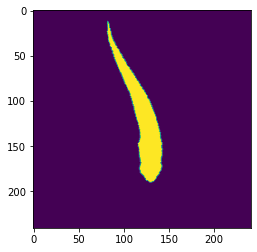

18829


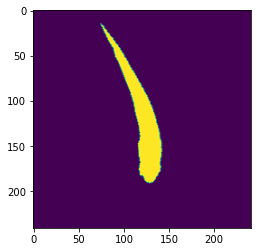

18830


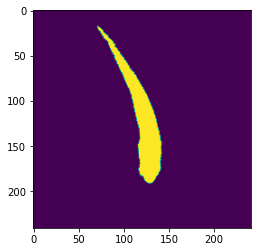

18858


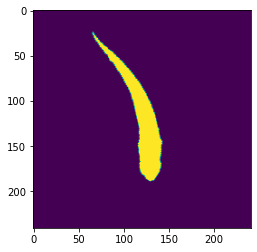

18905


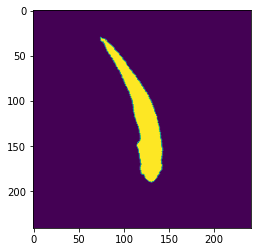

18907


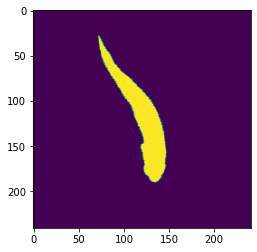

18932


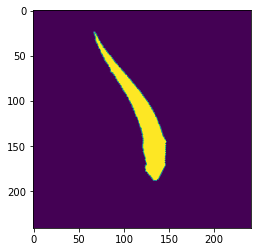

18933


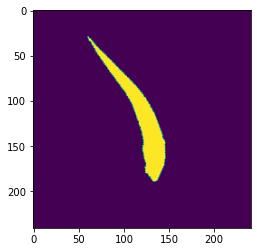

18966


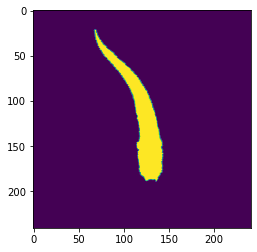

18969


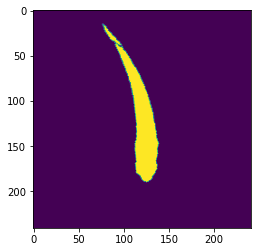

19002


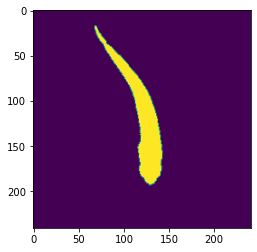

19014


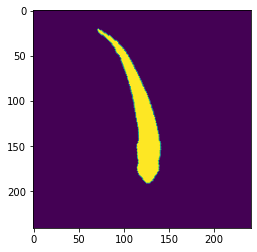

19015


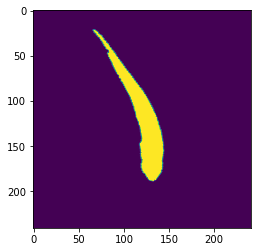

19043


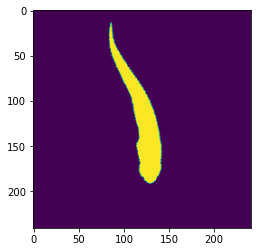

19051


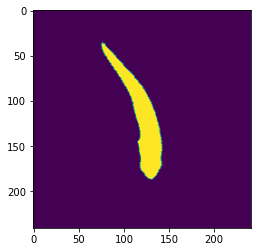

19052


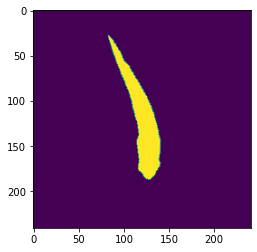

19053


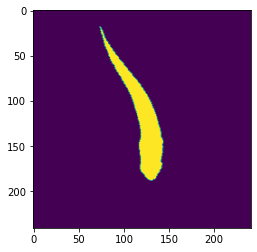

19056


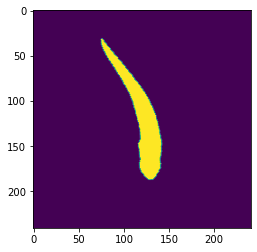

19057


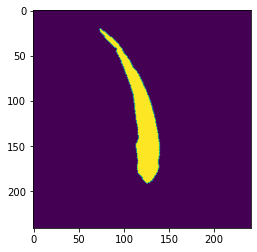

19080


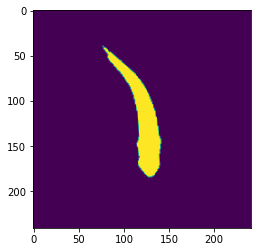

19085


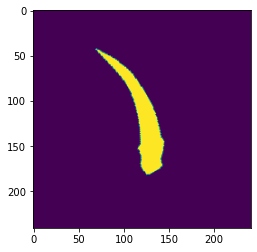

19147


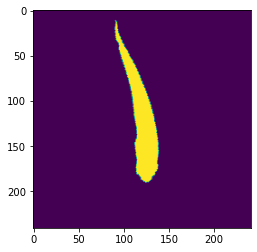

19149


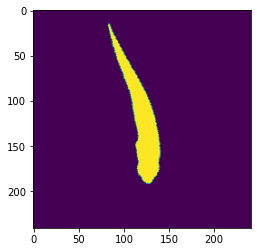

19150


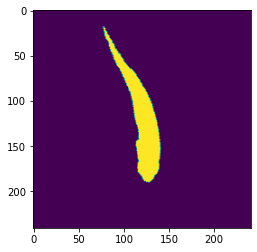

19152


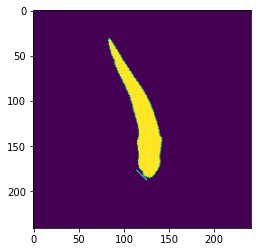

19190


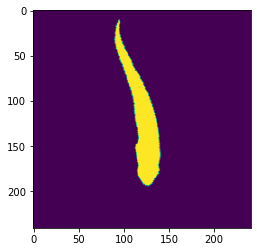

19192


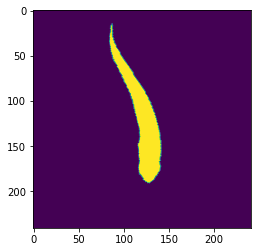

19193


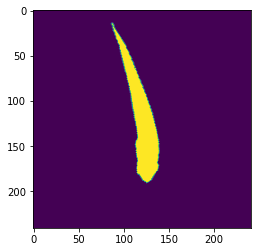

19194


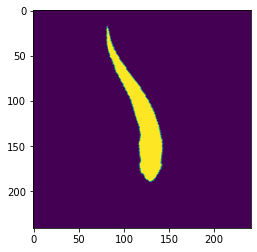

19197


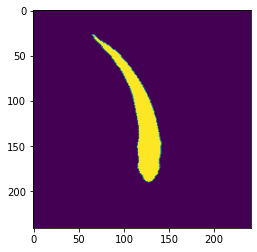

19257


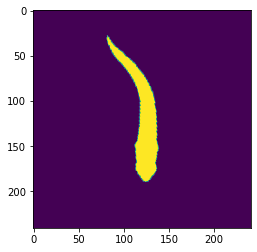

19279


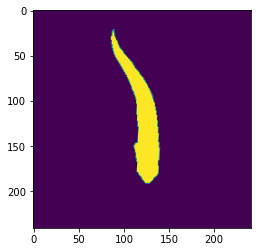

19290


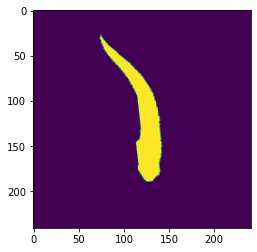

19477


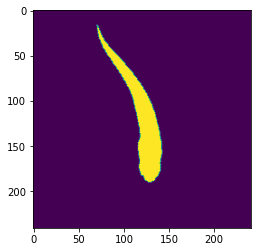

19480


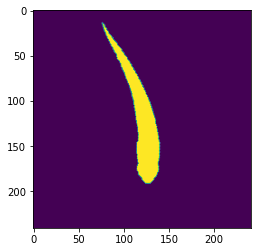

19481


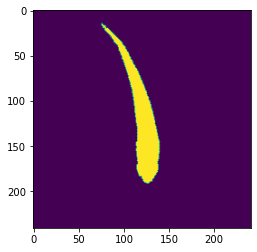

19485


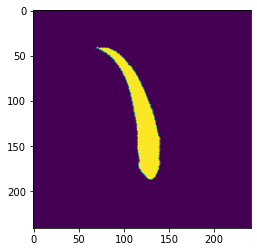

19486


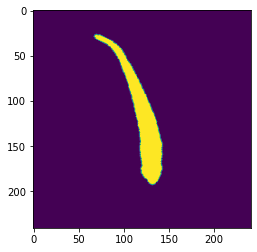

19487


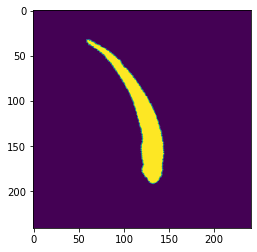

19520


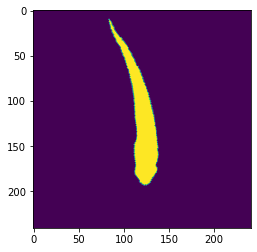

19522


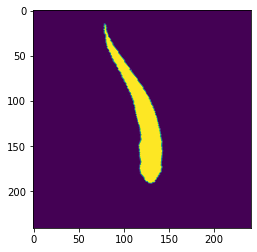

19523


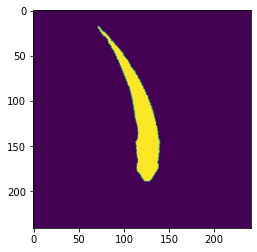

19524


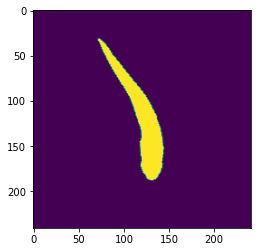

19557


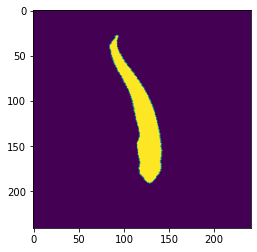

19561


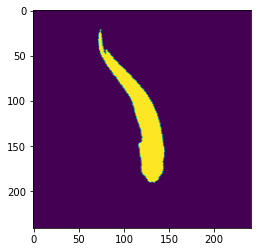

19562


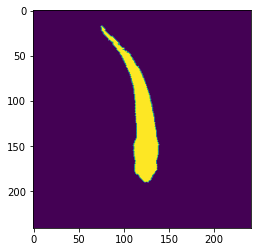

19569


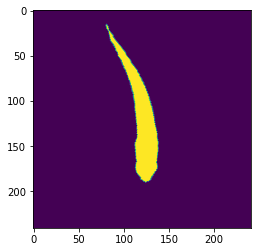

19571


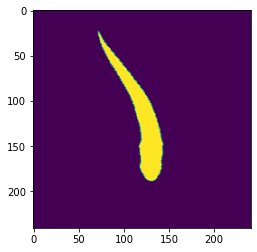

19612


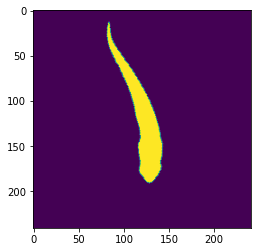

19614


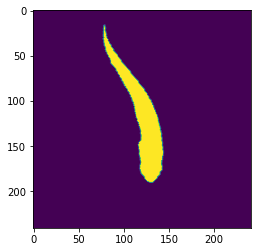

19615


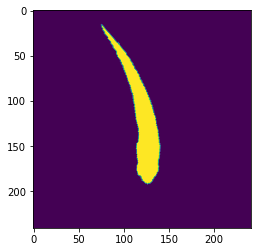

19616


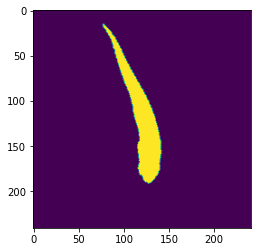

19637


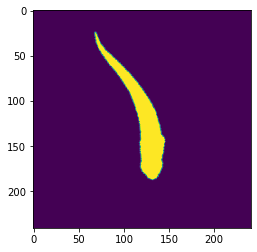

19670


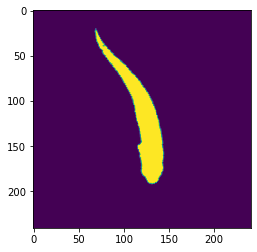

19671


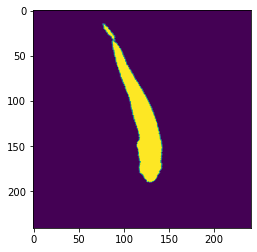

19676


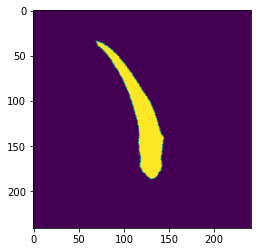

19703


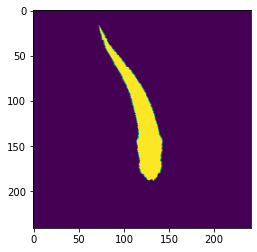

19715


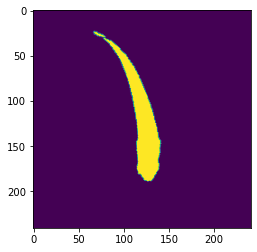

19756


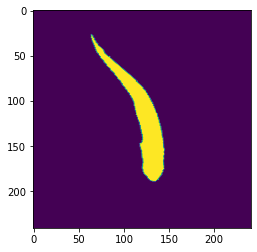

19757


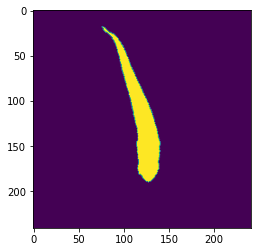

19794


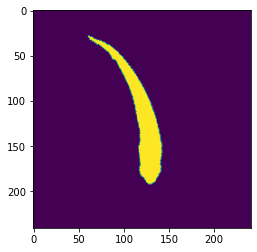

19817


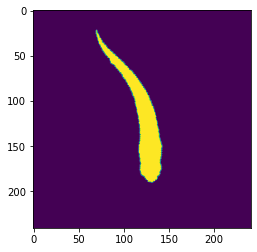

19819


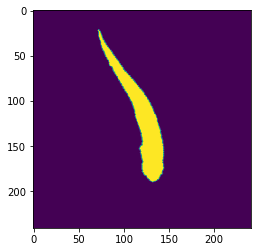

19820


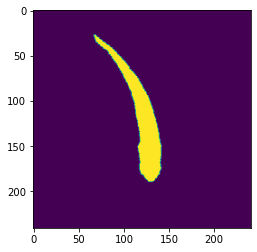

19821


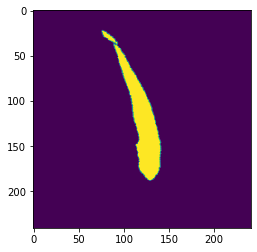

19822


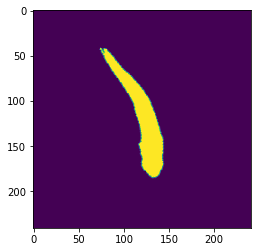

19859


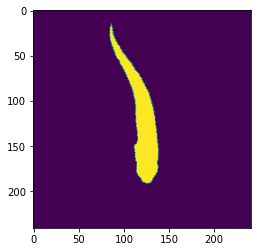

19864


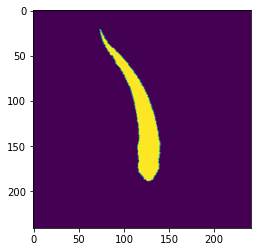

19865


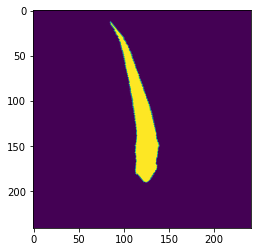

19866


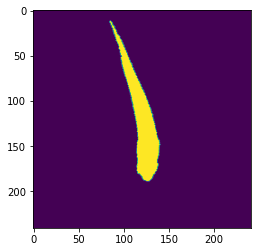

19867


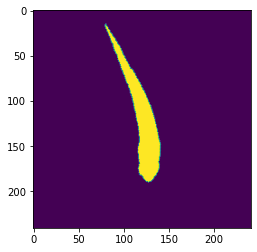

19868


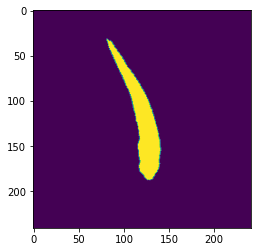

19869


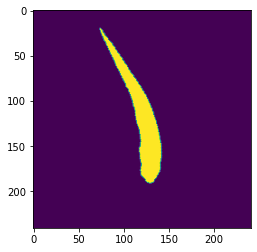

19870


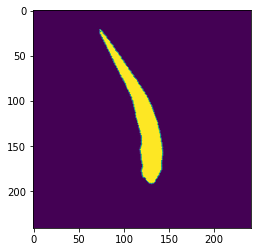

19871


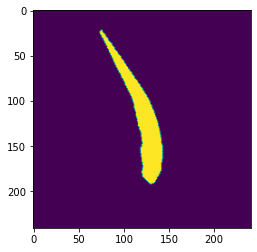

19902


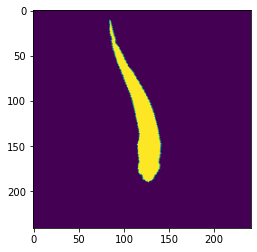

19904


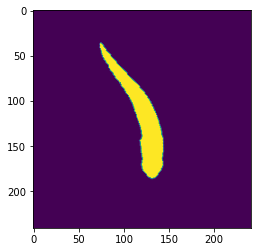

19905


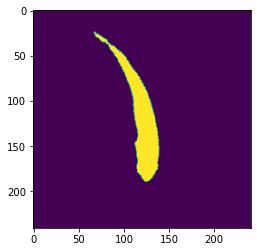

19906


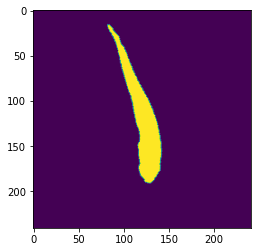

19926


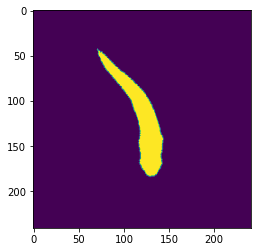

19930


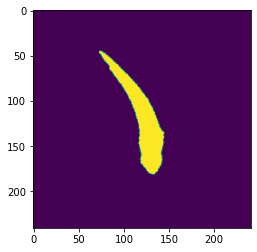

19960


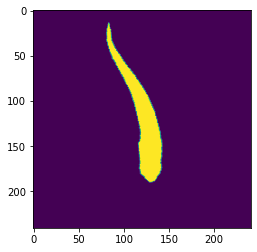

19962


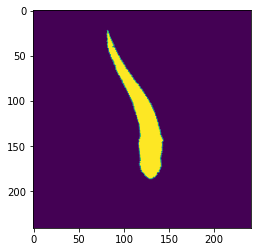

19963


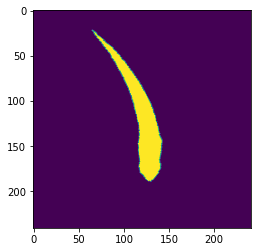

19964


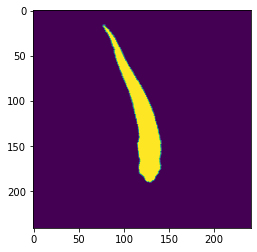

19997


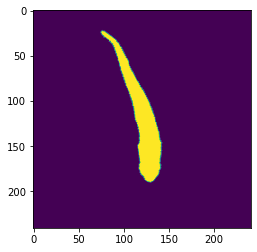

20059


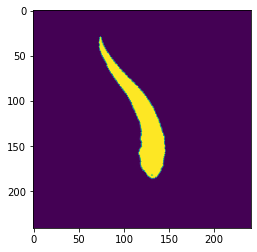

20061


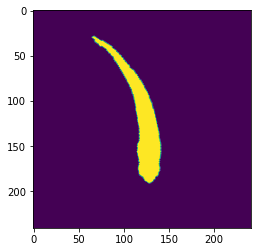

20062


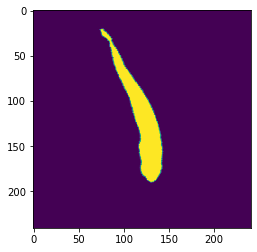

20107


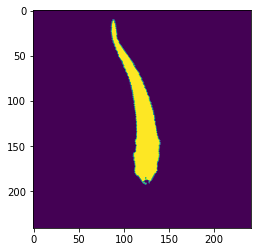

20110


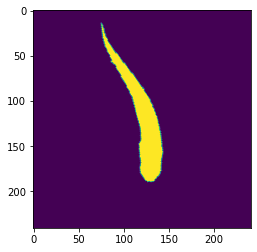

20111


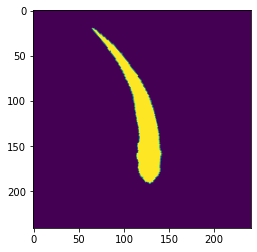

20112


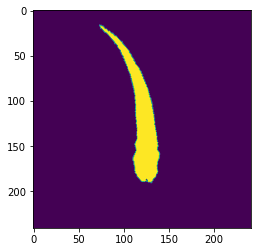

20142


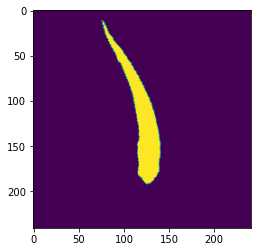

20143


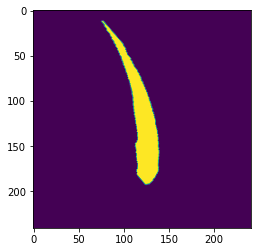

20144


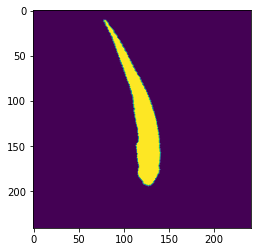

20164


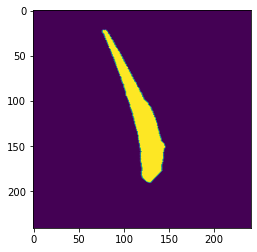

20165


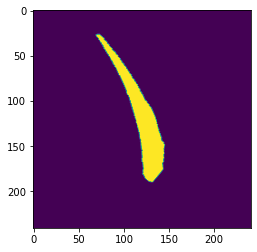

20166


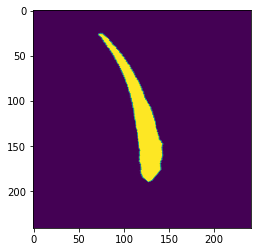

20167


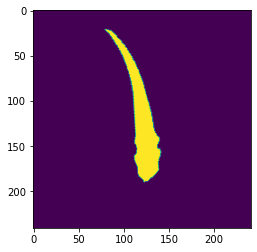

20190


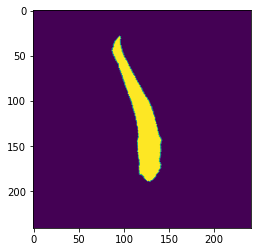

20194


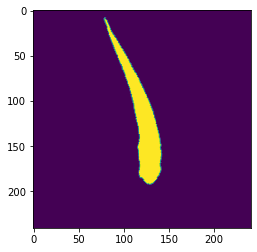

20227


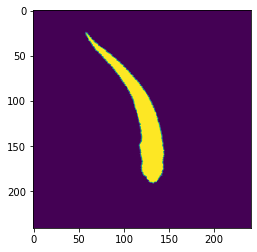

20228


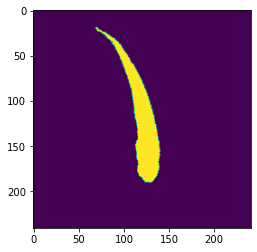

20254


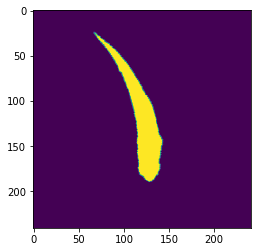

20257


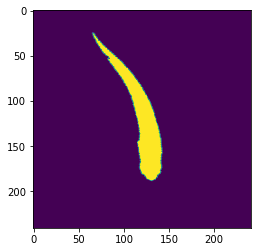

20261


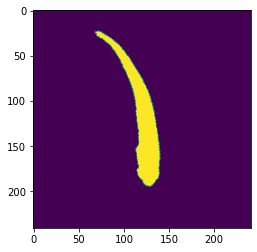

20262


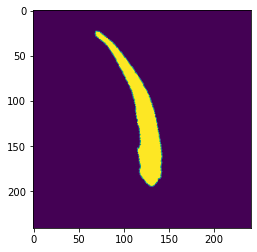

20336


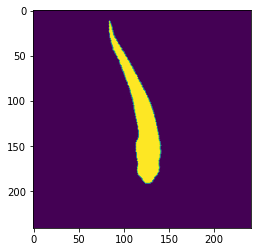

20337


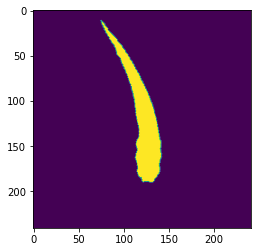

20338


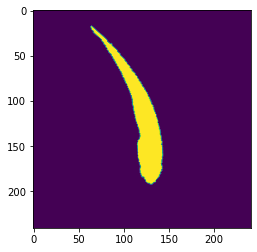

20349


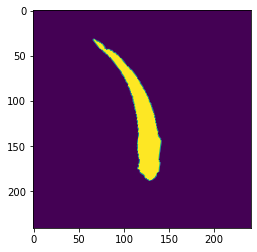

20350


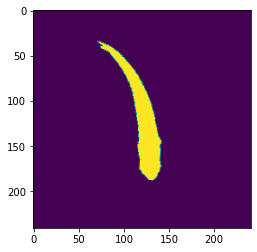

20378


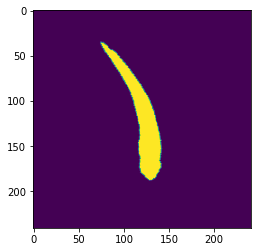

20380


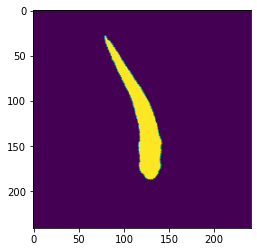

20381


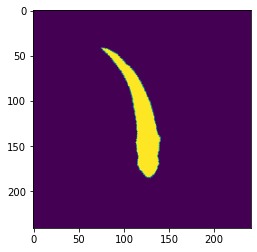

20382


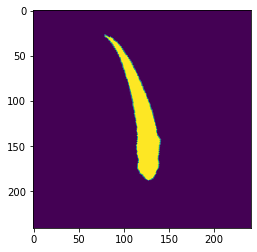

20413


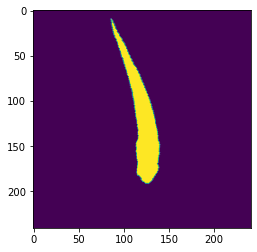

20415


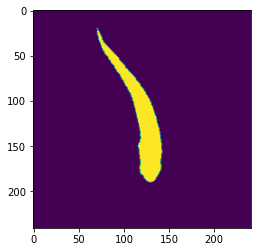

20420


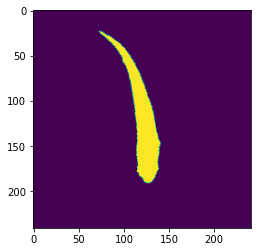

20455


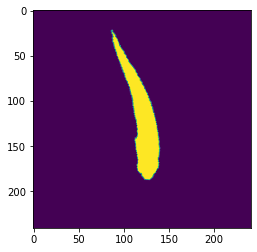

20456


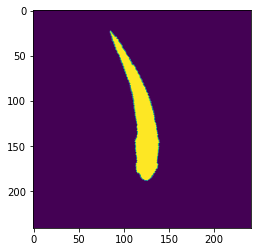

20460


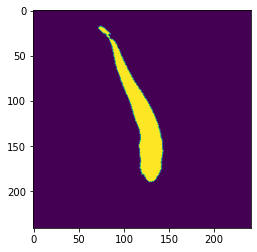

20485


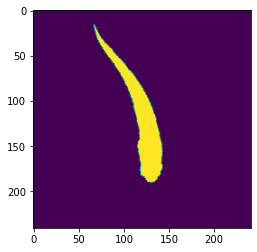

20486


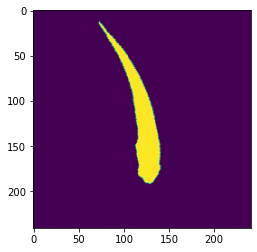

20488


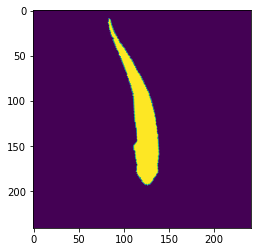

20490


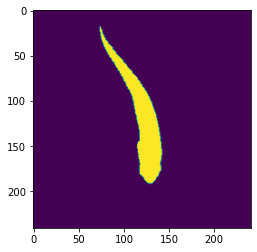

20491


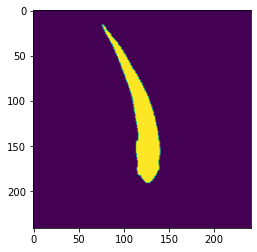

20492


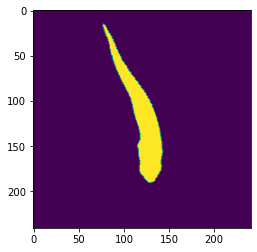

20495


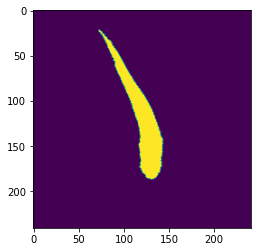

20522


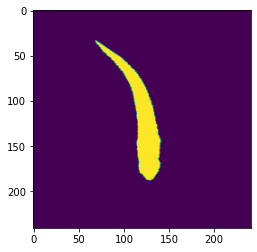

20558


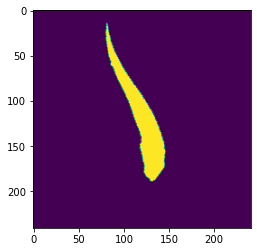

20583


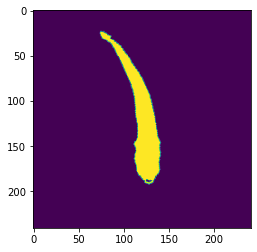

20584


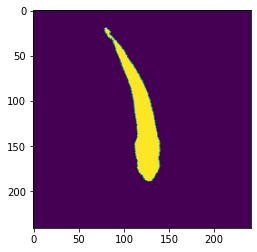

20586


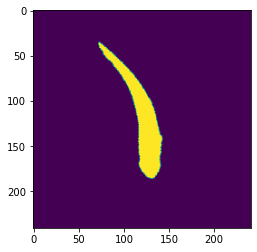

20622


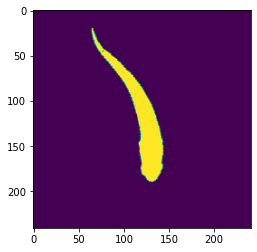

20623


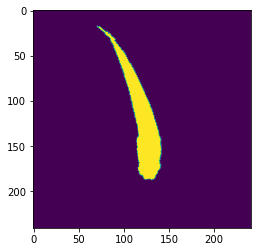

20624


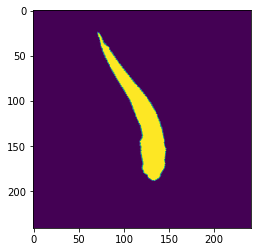

20628


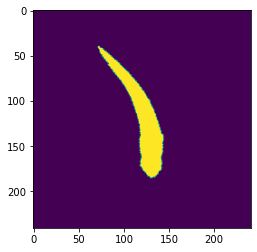

20666


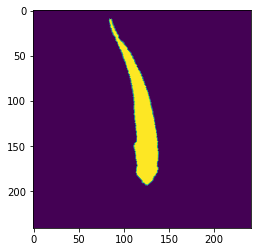

20668


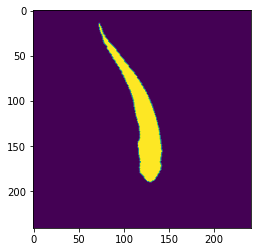

20670


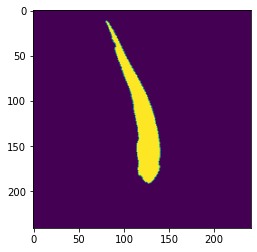

20674


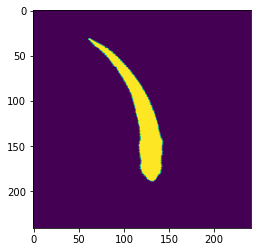

20704


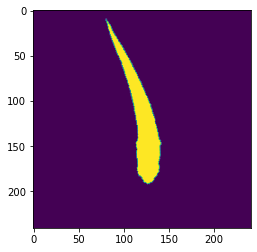

20705


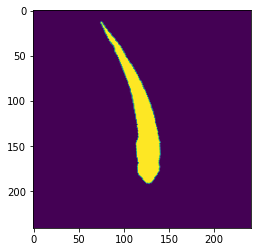

20707


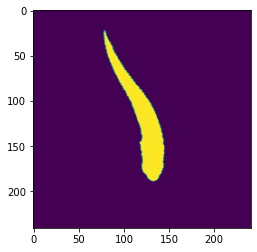

20734


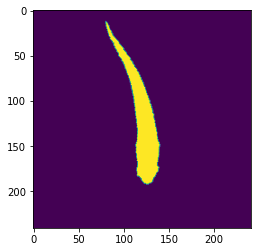

20738


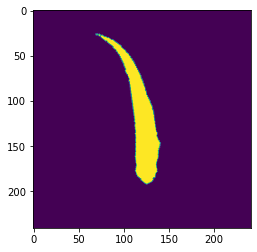

20770


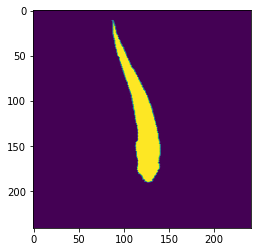

20771


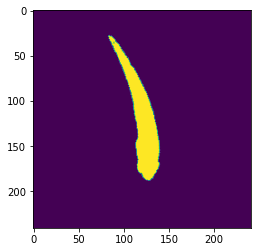

20774


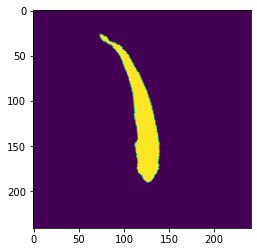

20802


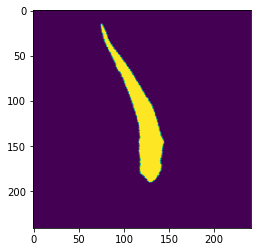

20803


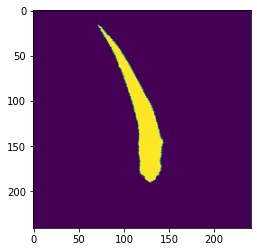

20804


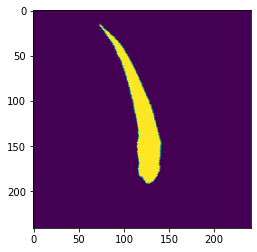

20805


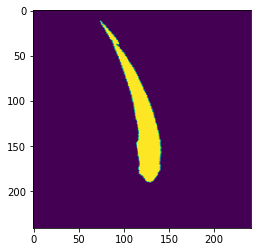

20811


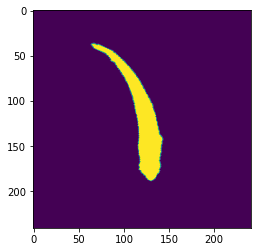

20844


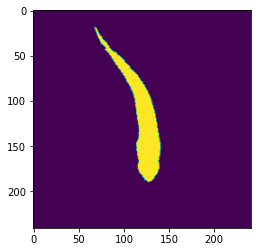

20851


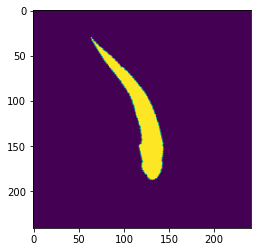

20877


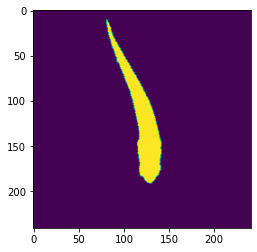

20878


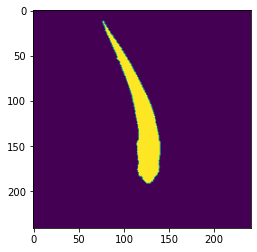

20879


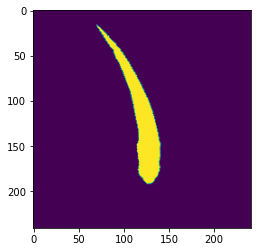

20952


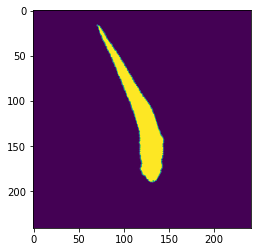

20977


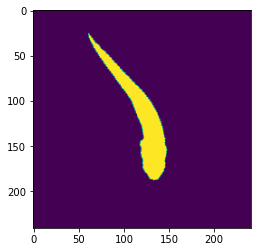

21000


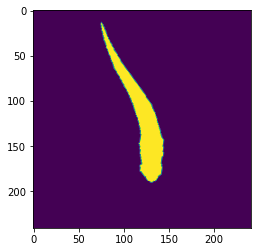

21030


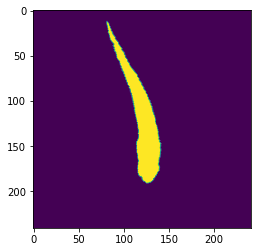

21031


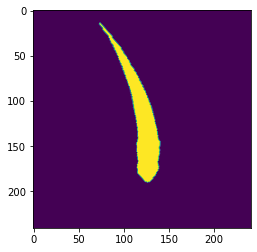

21033


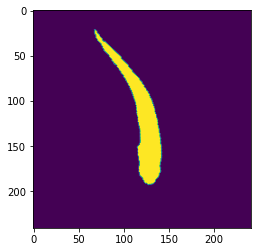

21035


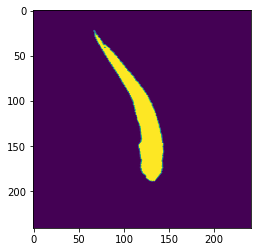

21074


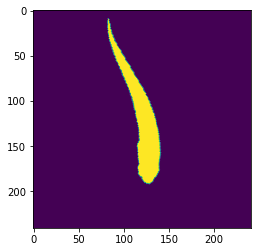

21075


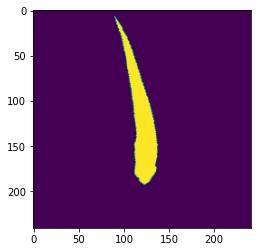

21079


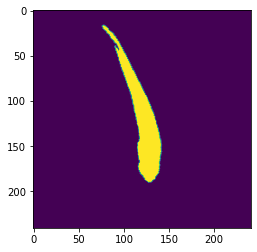

21134


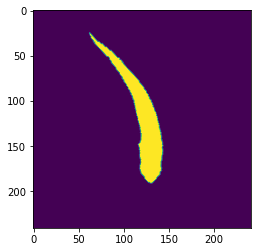

21135


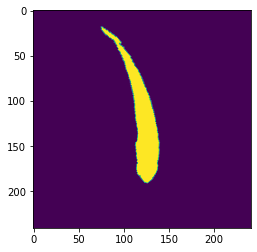

21171


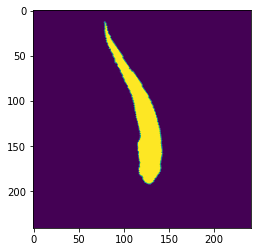

21172


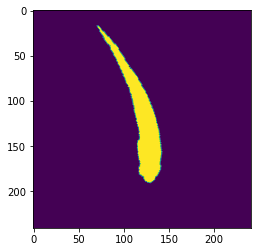

21175


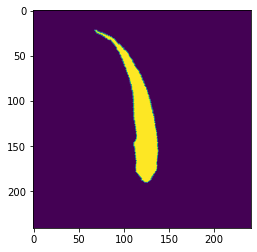

21231


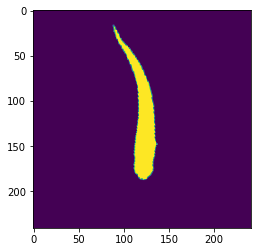

21329


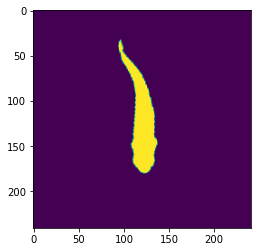

21461


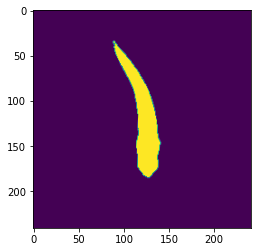

21601


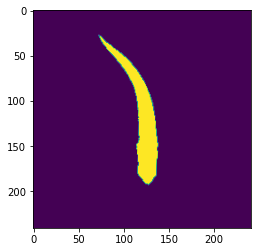

21618


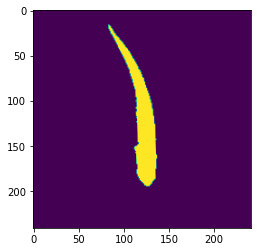

21703


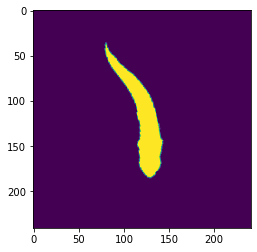

21734


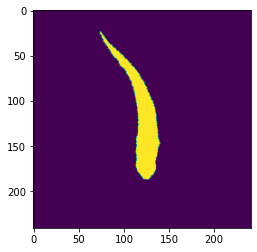

21760


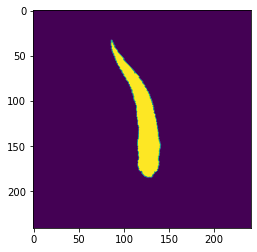

21764


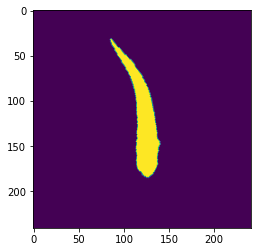

21778


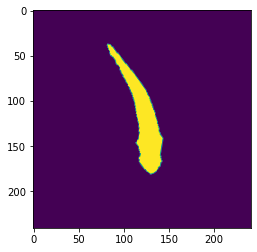

21809


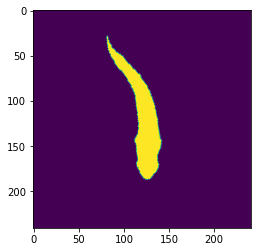

21872


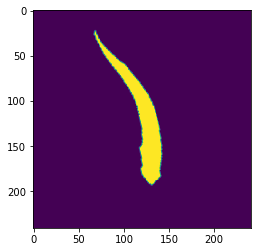

21885


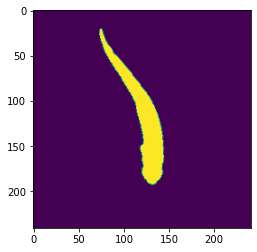

21960


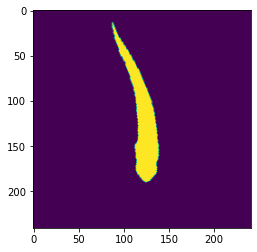

22229


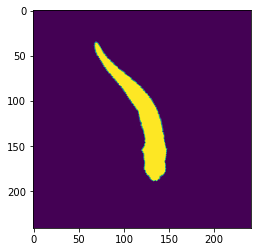

22264


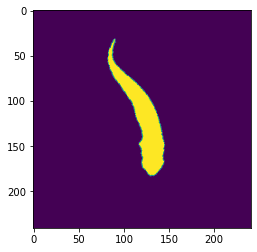

22267


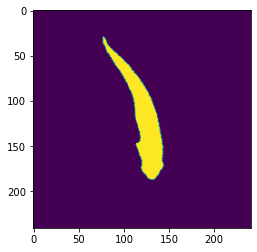

22271


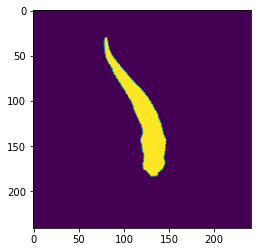

22275


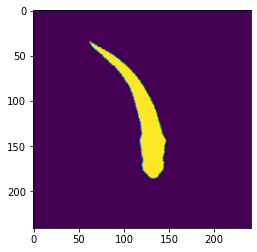

22298


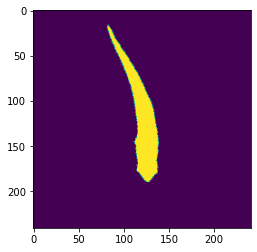

22343


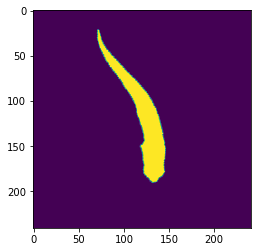

22417


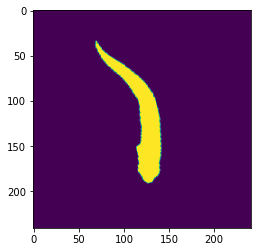

22641


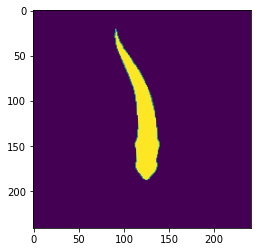

22744


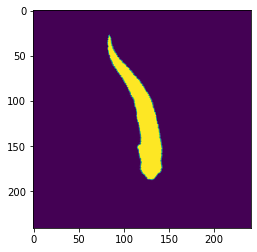

22746


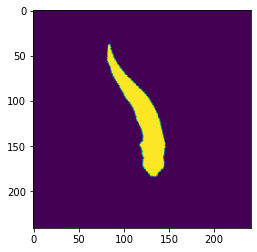

22781


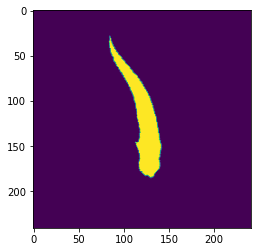

22783


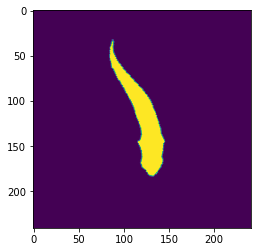

22784


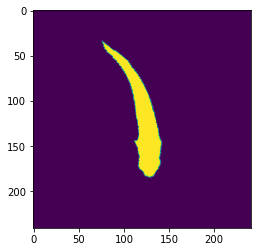

22789


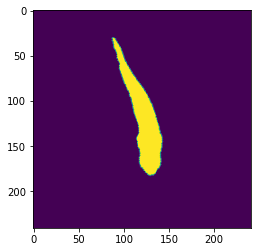

22831


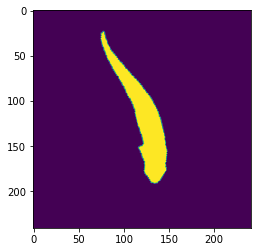

22837


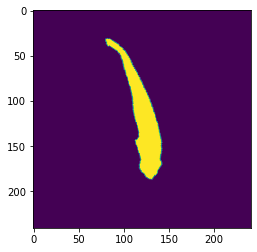

22838


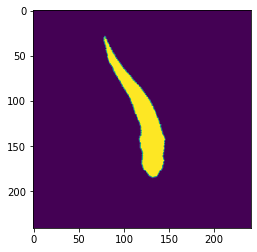

22841


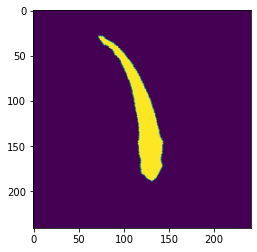

22842


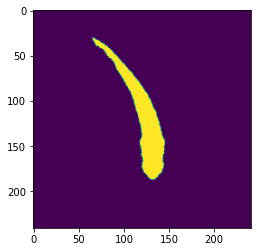

22876


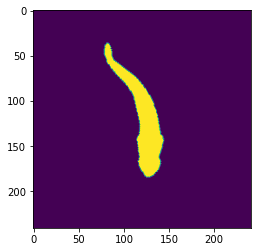

22900


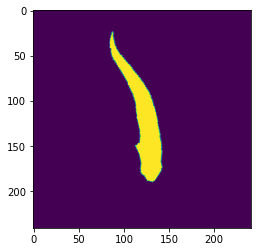

22903


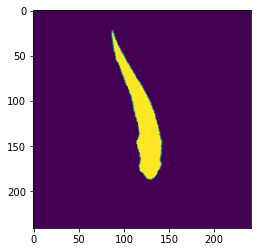

22905


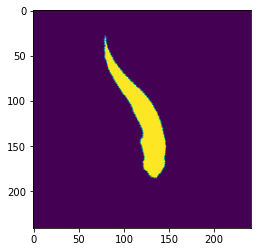

22946


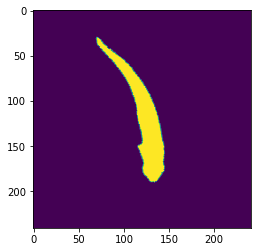

22951


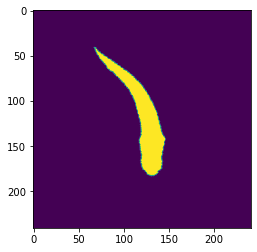

22954


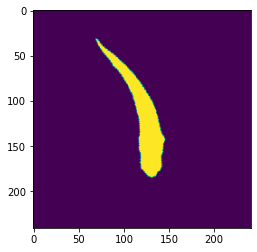

22957


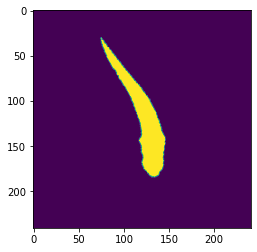

22960


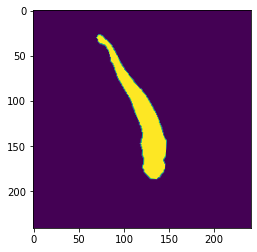

23002


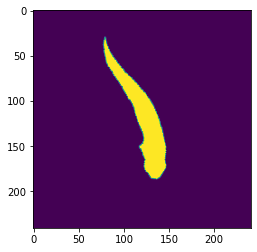

23012


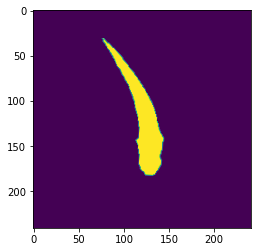

23049


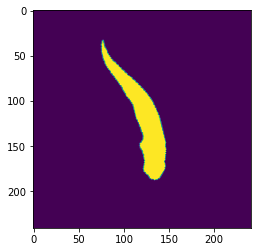

23050


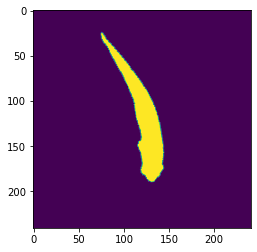

23051


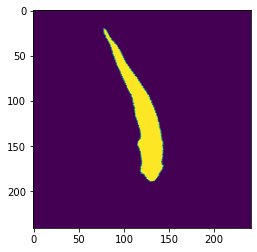

23076


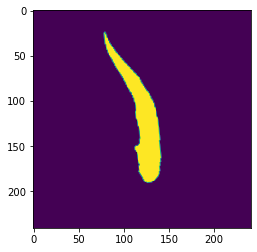

23077


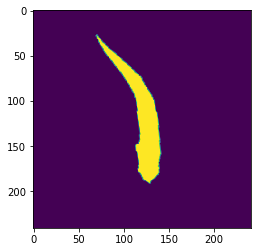

23092


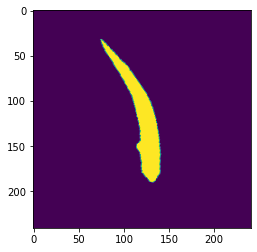

23165


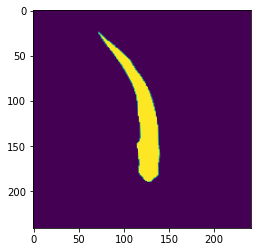

23188


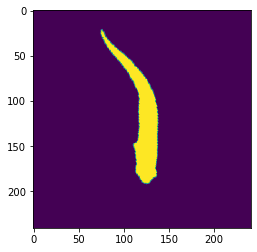

23197


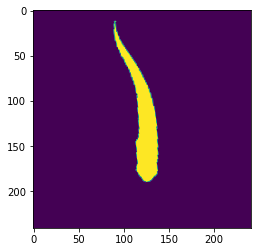

23247


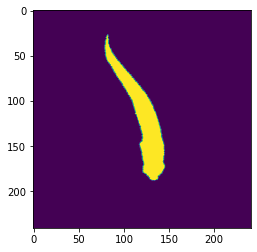

23250


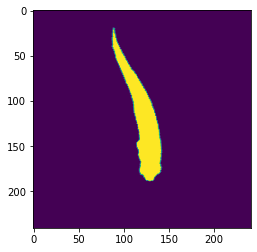

23251


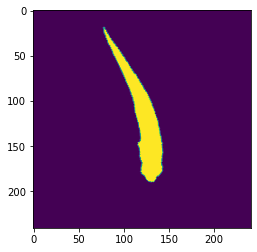

23252


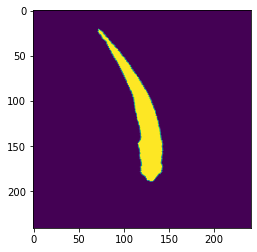

23253


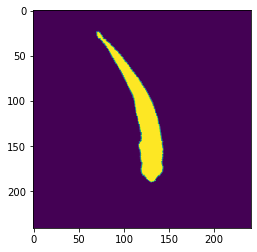

23291


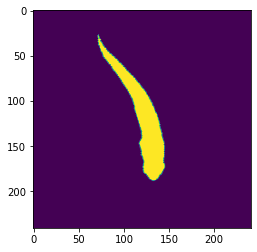

23292


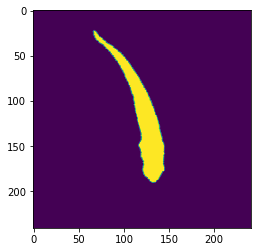

23297


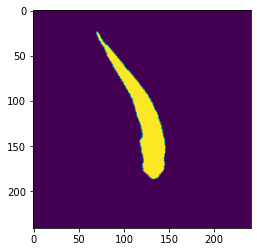

23355


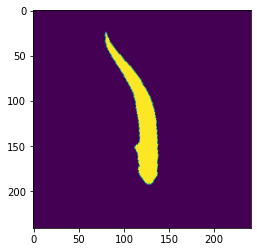

23400


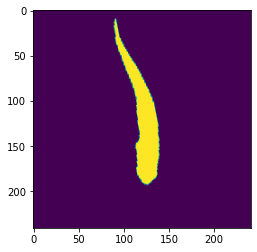

23407


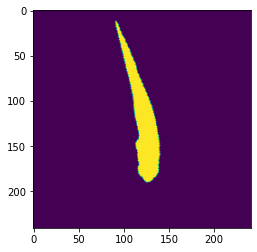

23509


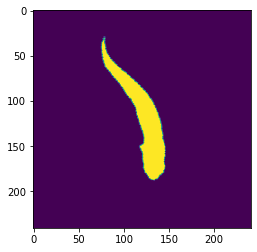

23511


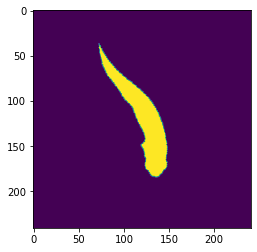

23546


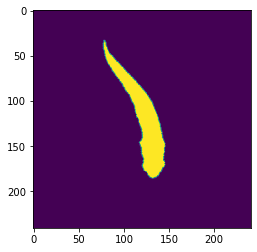

23552


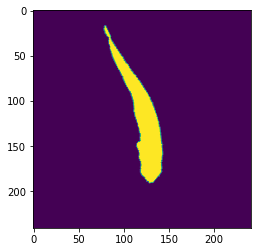

23622


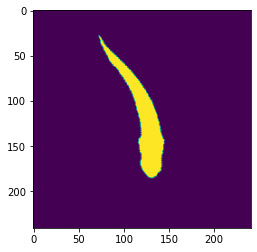

23654


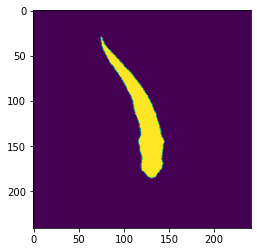

23657


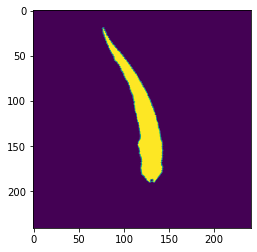

23658


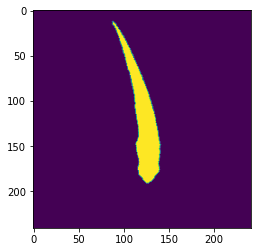

23662


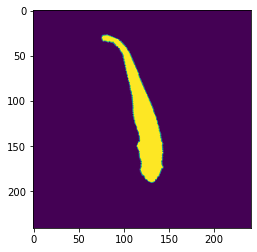

23666


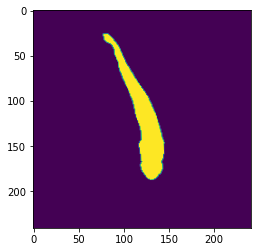

23695


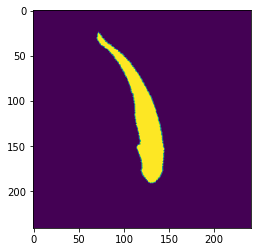

23696


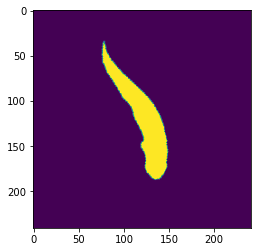

23699


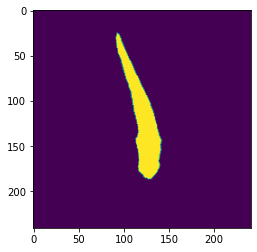

23700


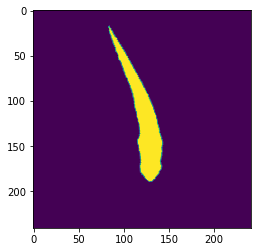

23701


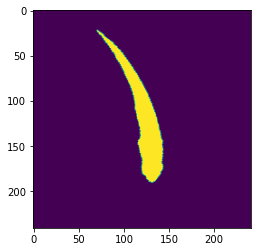

23702


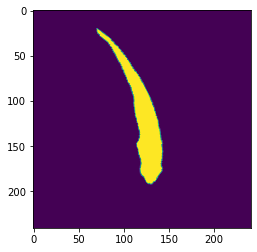

23703


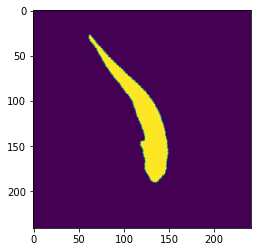

23734


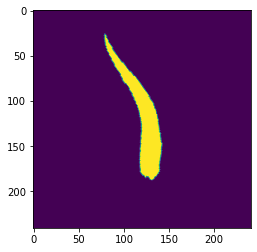

23735


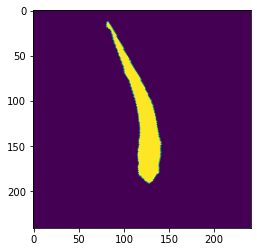

23743


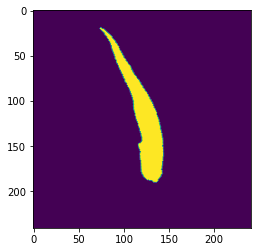

23815


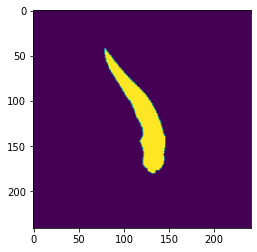

23820


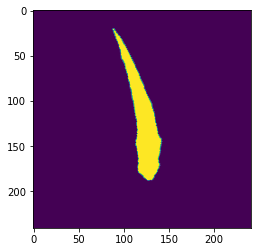

23821


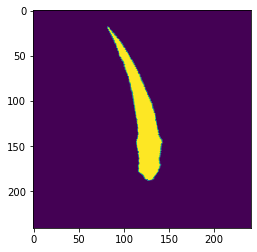

23860


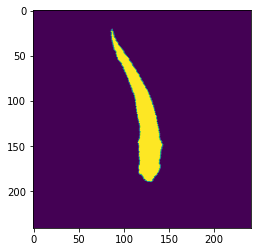

23863


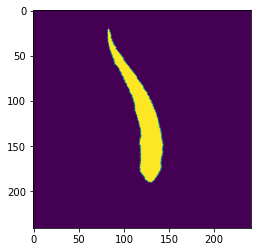

23864


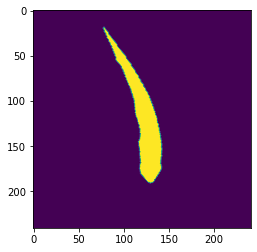

23865


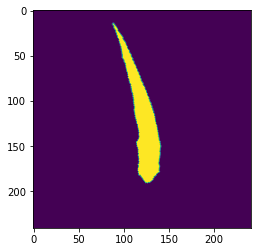

23901


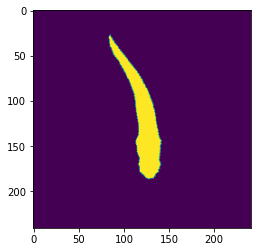

23905


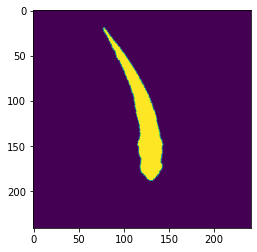

23910


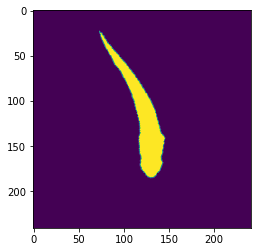

23932


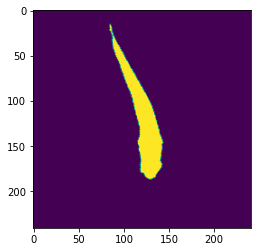

23933


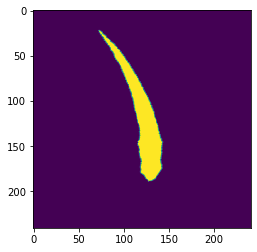

23971


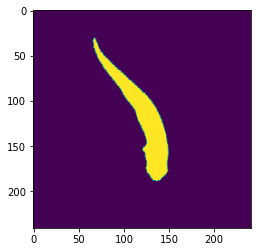

23974


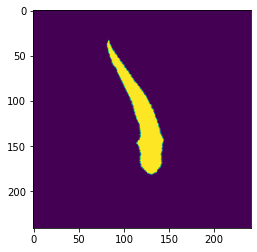

23978


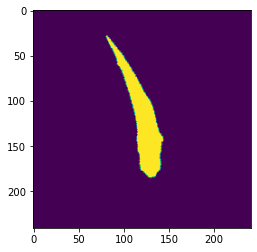

24012


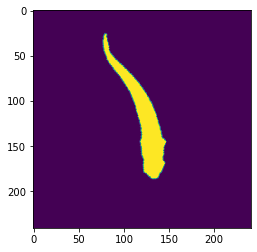

24014


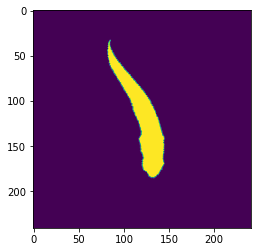

24015


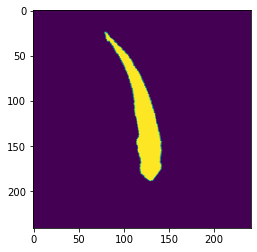

24019


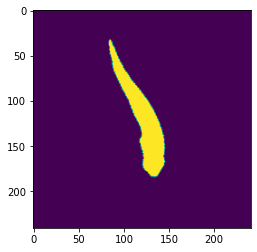

24050


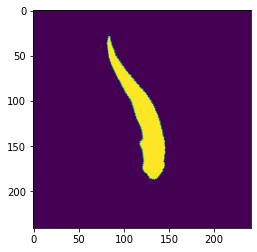

24052


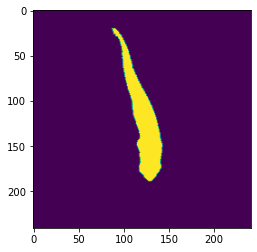

24056


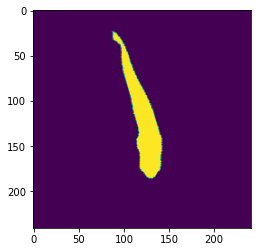

24092


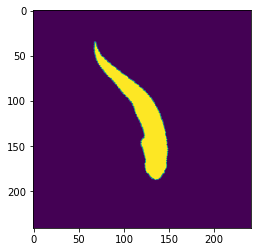

24094


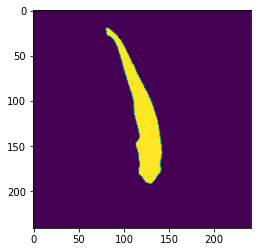

24095


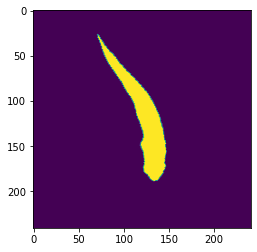

24098


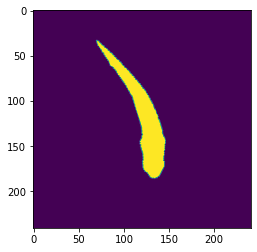

24101


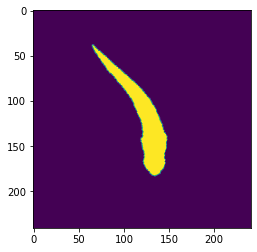

24129


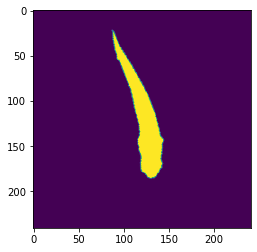

24142


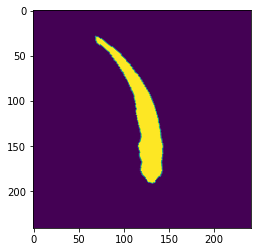

24143


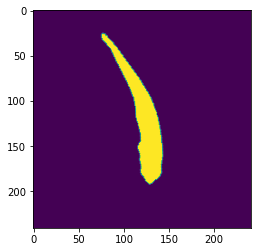

24172


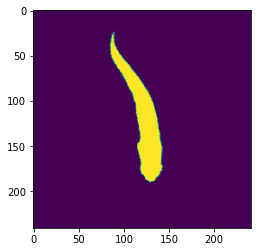

24174


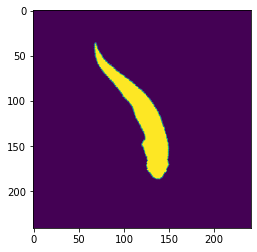

24183


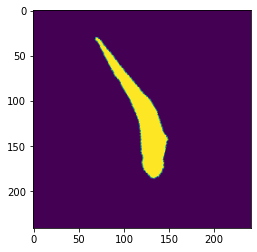

24239


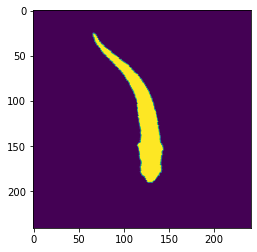

24266


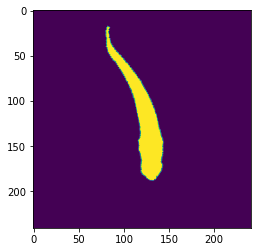

24267


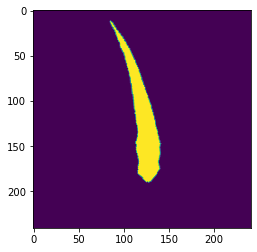

24268


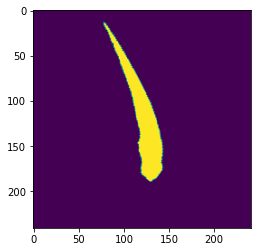

24269


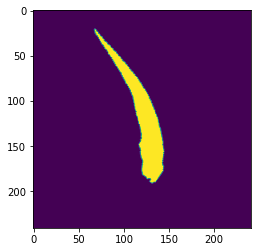

24271


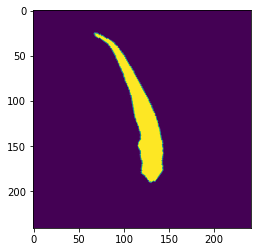

24300


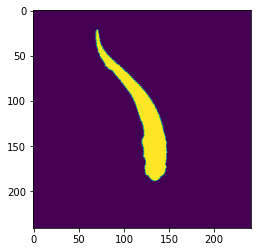

24337


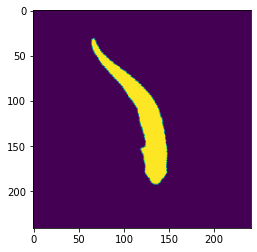

24339


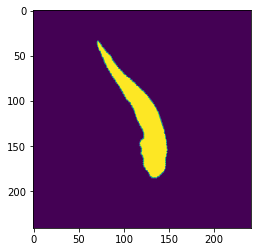

24362


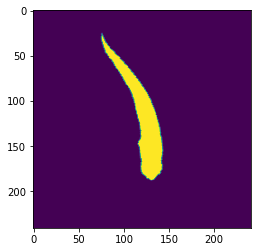

24411


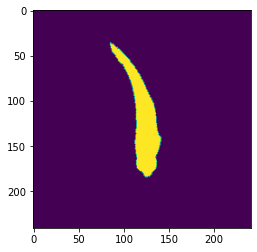

24432


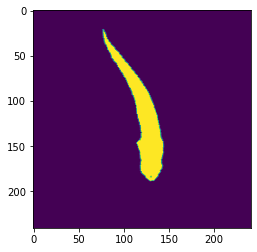

24469


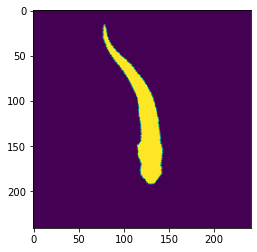

24471


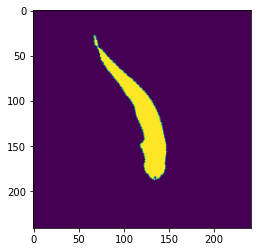

24505


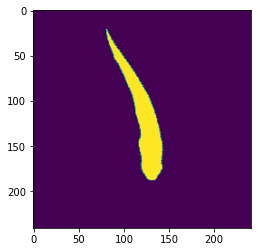

24508


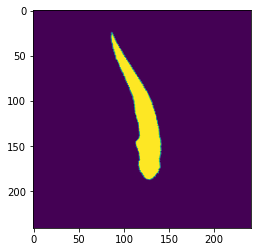

24542


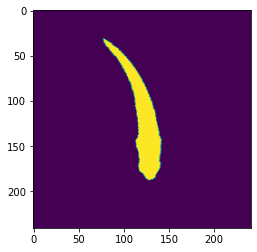

24543


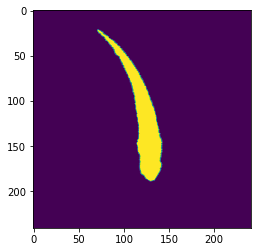

24544


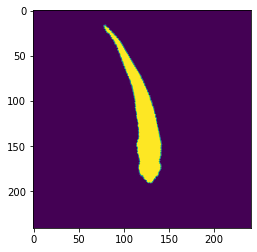

24576


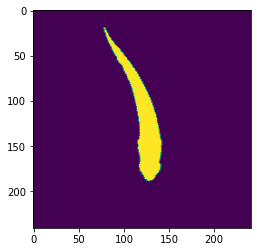

24578


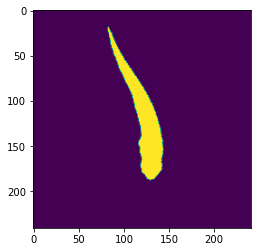

24609


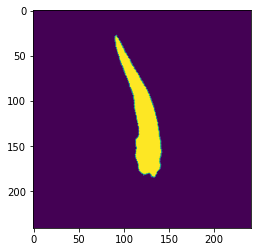

24613


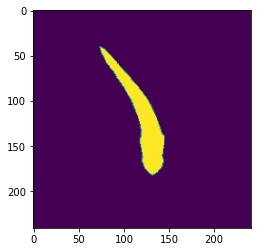

24637


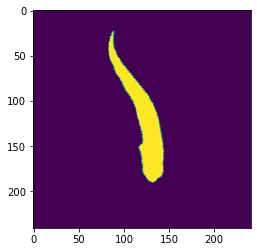

24708


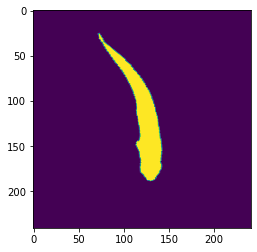

24710


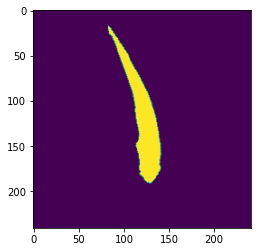

24776


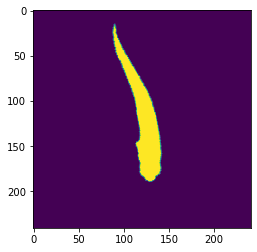

24777


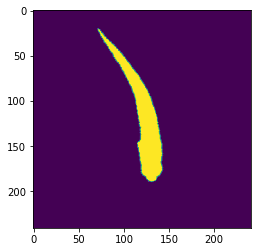

24804


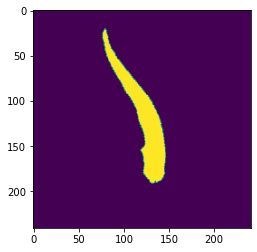

24825


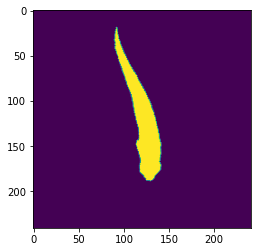

24826


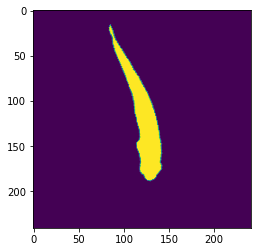

24827


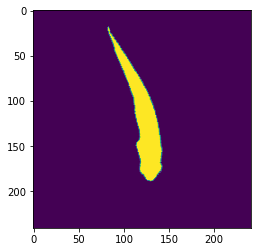

24863


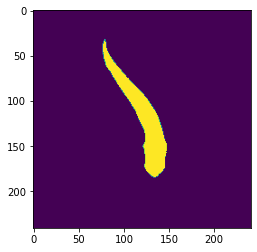

24872


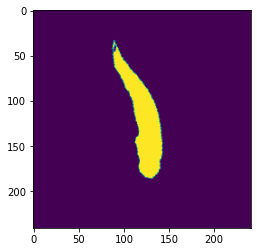

24884


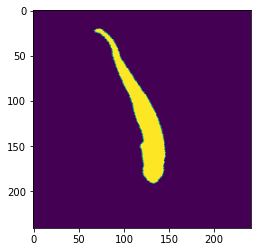

24905


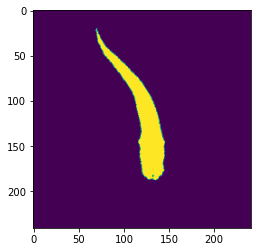

24948


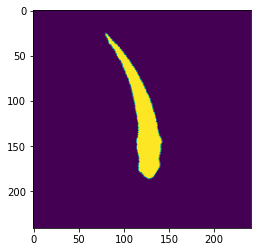

24970


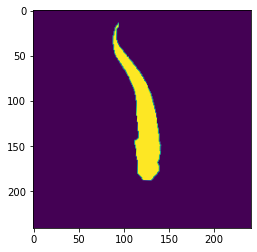

25094


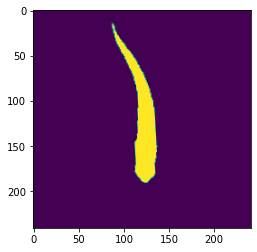

25108


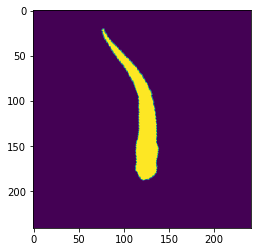

25130


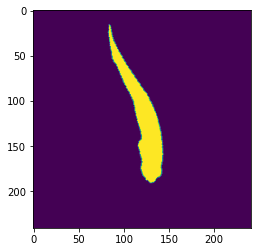

25135


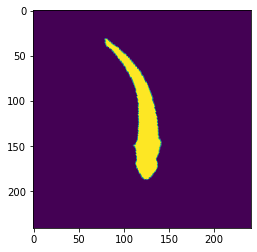

25170


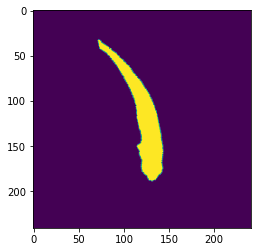

25172


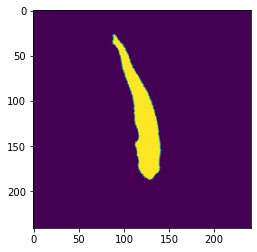

25189


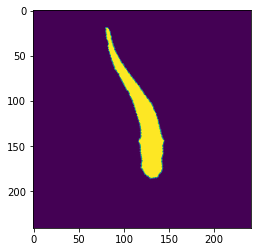

25230


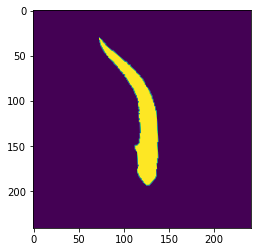

25239


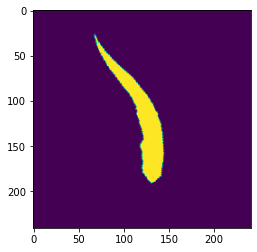

25245


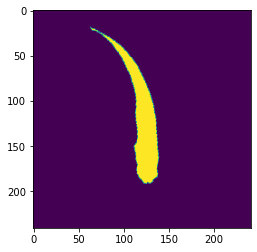

25281


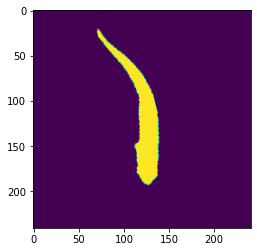

25334


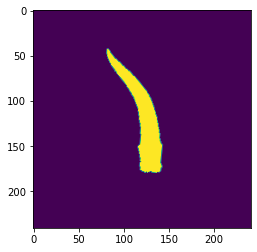

25335


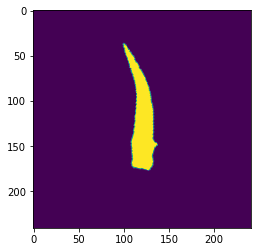

25449


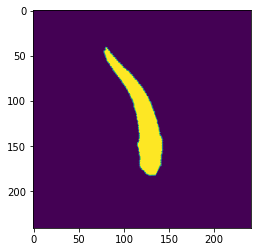

25485


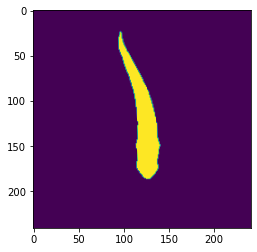

25521


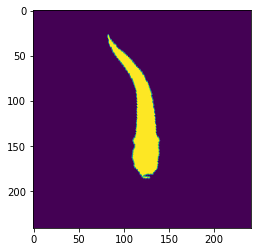

25661


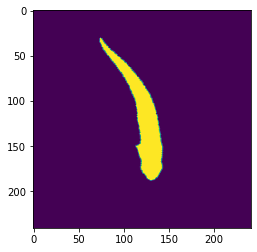

25907


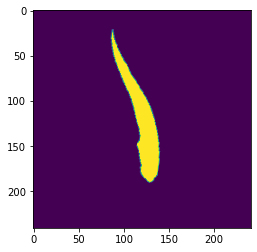

25931


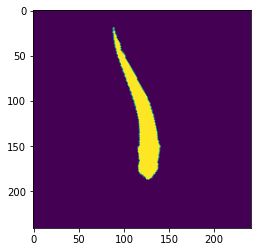

25936


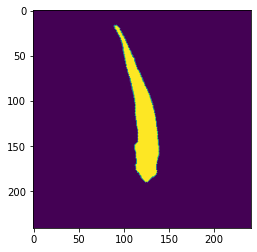

26014


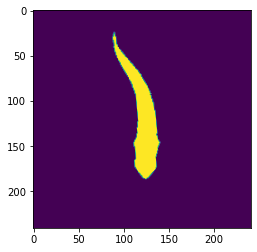

26100


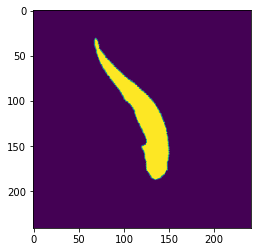

26130


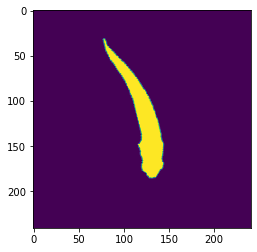

26135


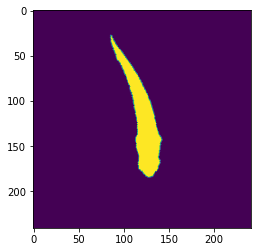

26181


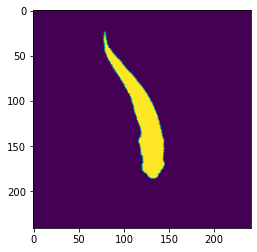

26183


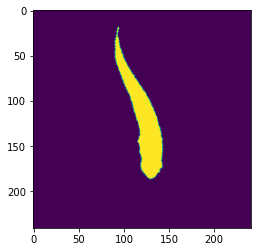

26186


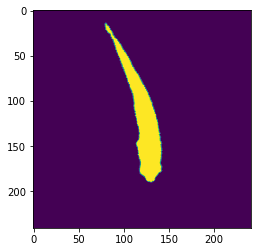

26187


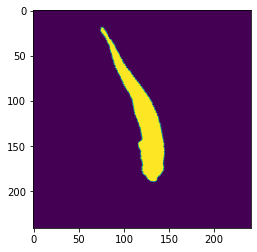

26220


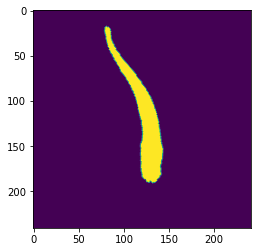

26288


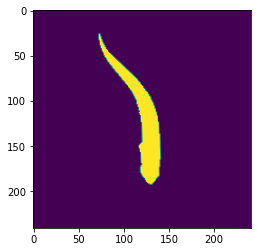

26302


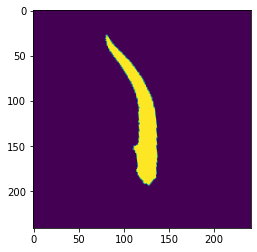

26360


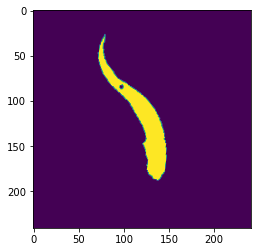

26416


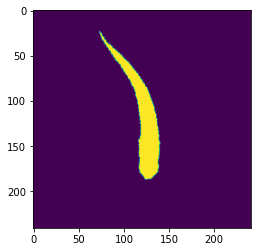

26473


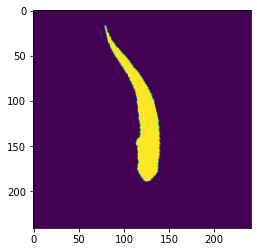

26571


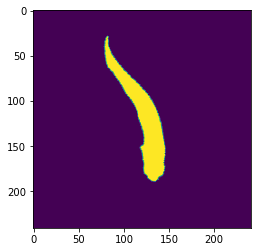

26572


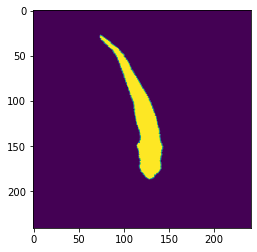

26573


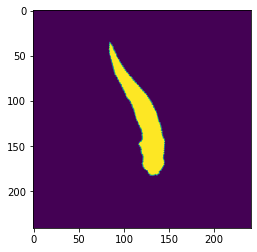

26631


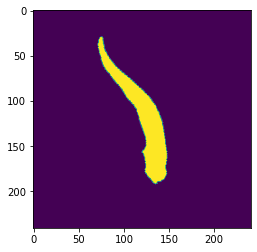

26653


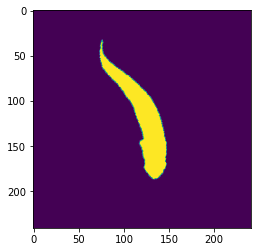

26657


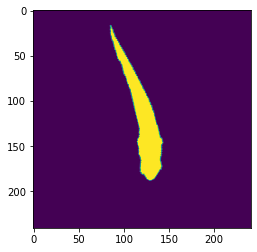

26658


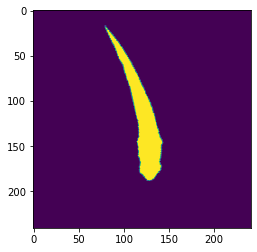

26659


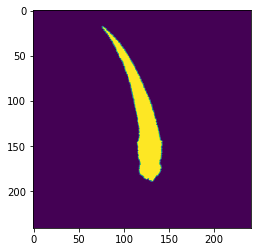

26660


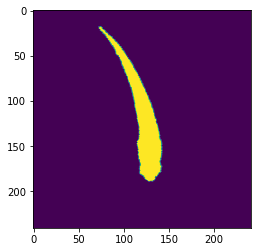

26661


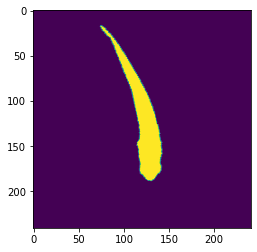

26674


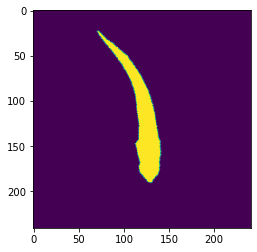

26744


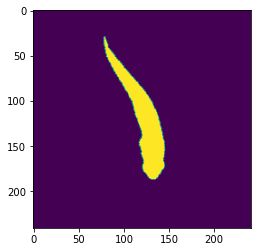

26749


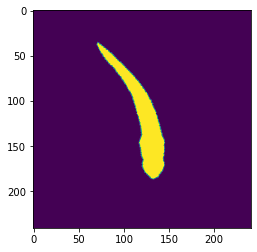

26758


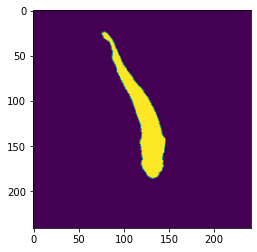

26839


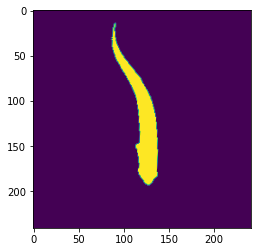

26985


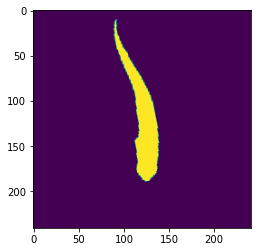

26993


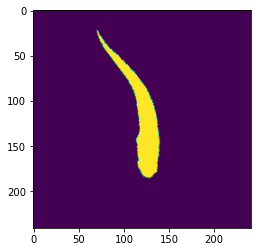

27019


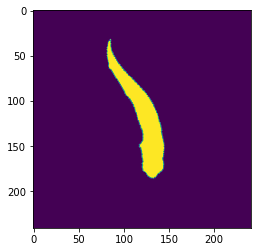

27035


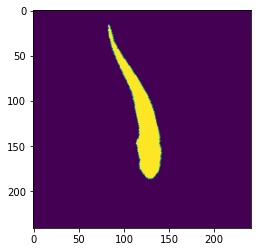

27094


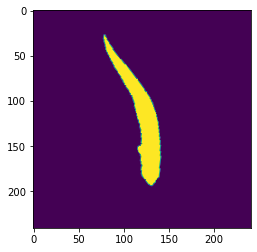

27140


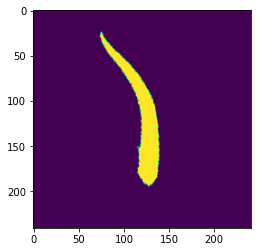

27249


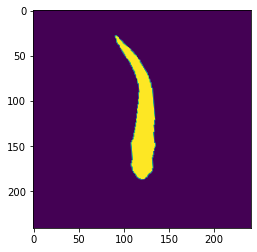

27313


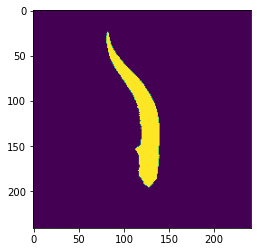

27383


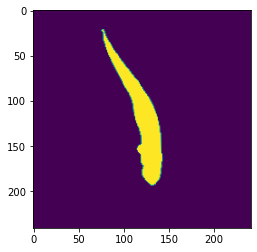

27441


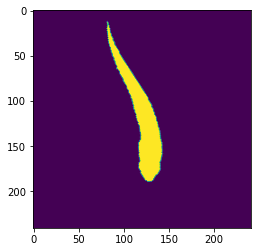

27448


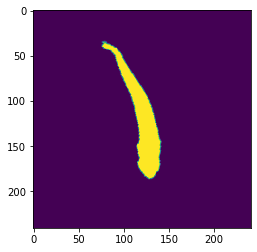

27452


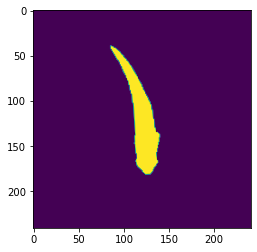

27486


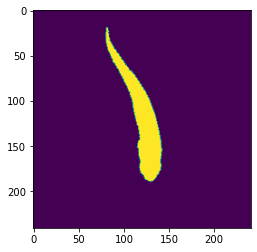

27487


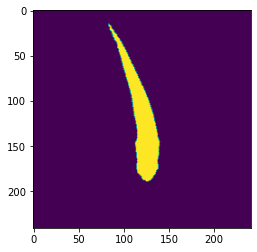

27489


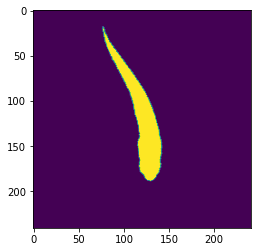

27518


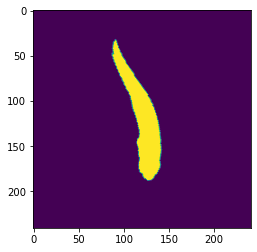

27522


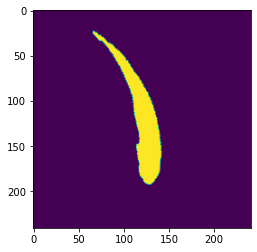

27523


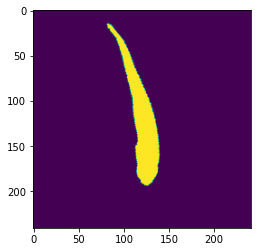

27524


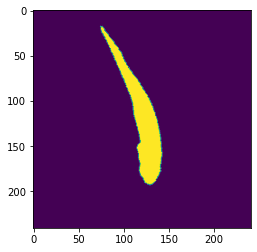

27525


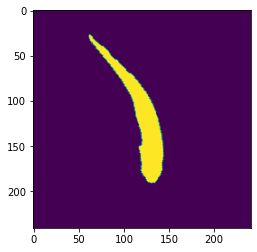

27593


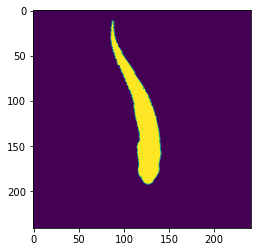

27599


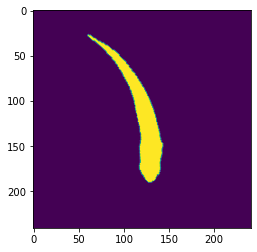

27600


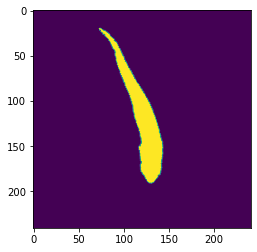

27638


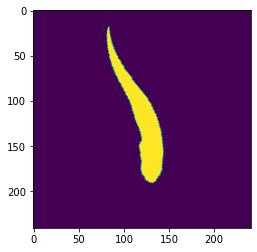

27639


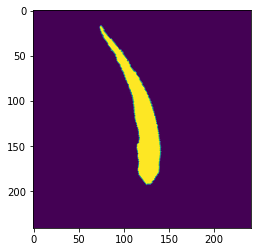

27643


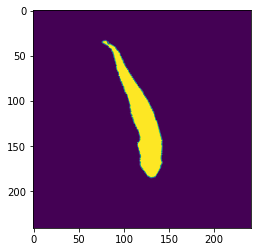

27668


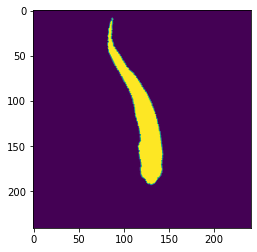

27674


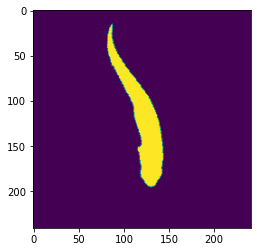

27677


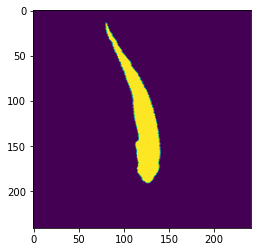

27681


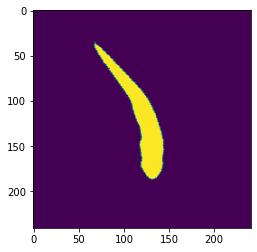

27688


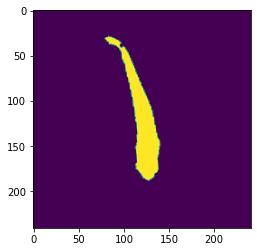

27716


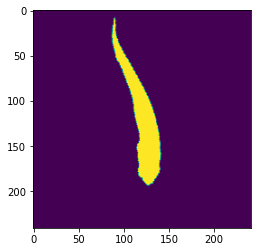

27717


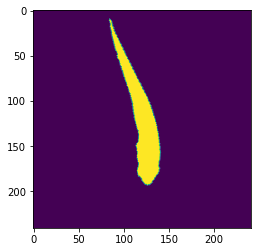

27722


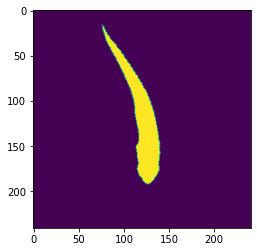

27724


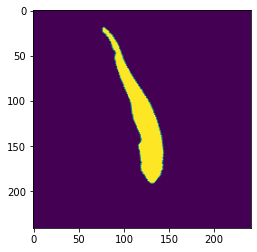

27753


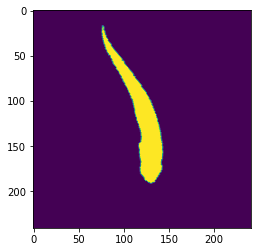

27754


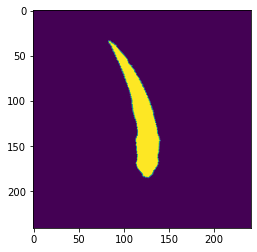

27755


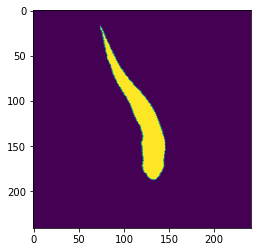

27781


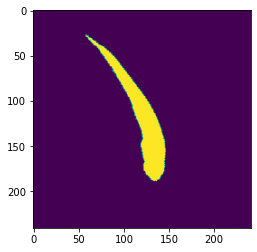

27811


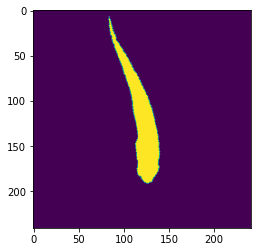

27813


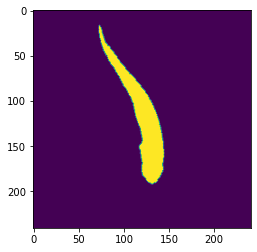

27814


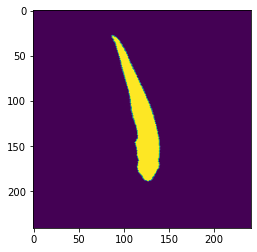

27855


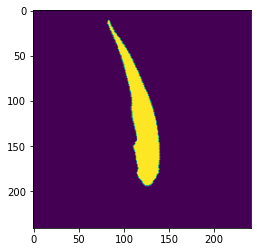

27857


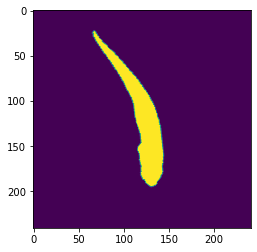

27858


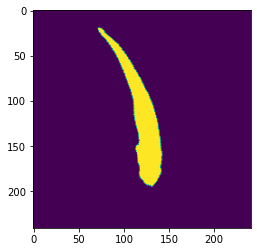

27860


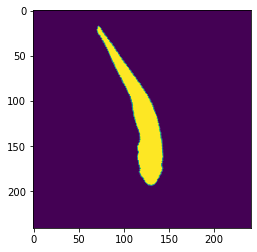

27884


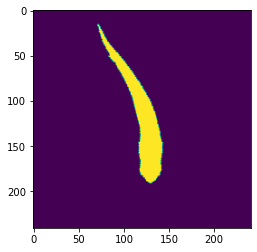

27885


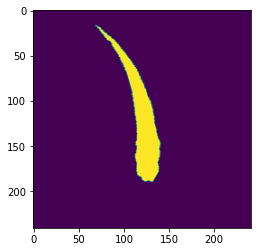

27891


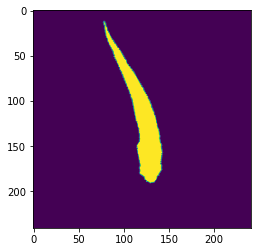

27916


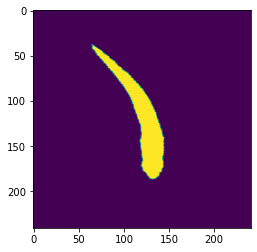

27917


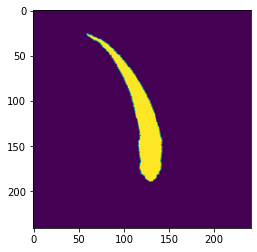

27918


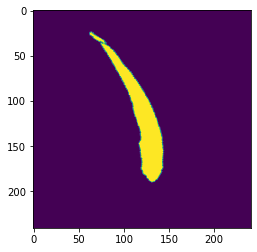

27952


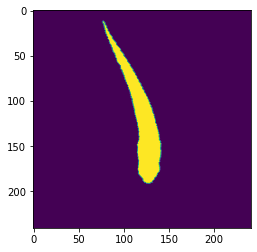

27954


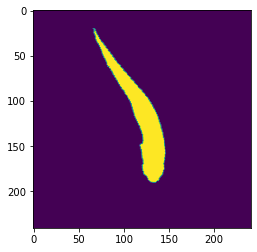

27985


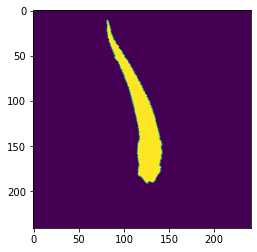

27986


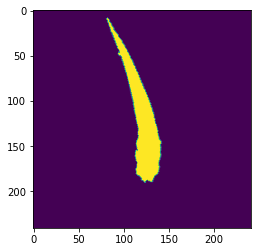

27987


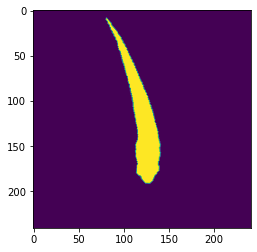

27993


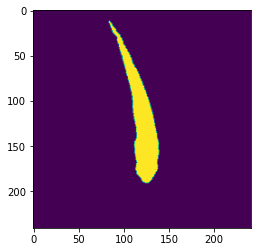

27995


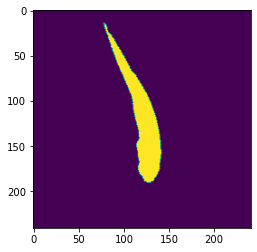

28030


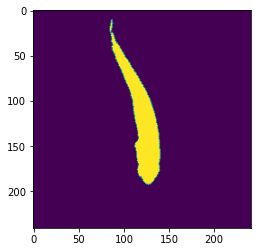

28031


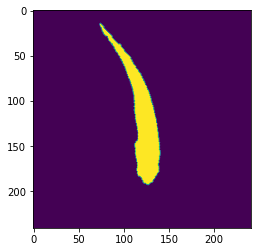

28042


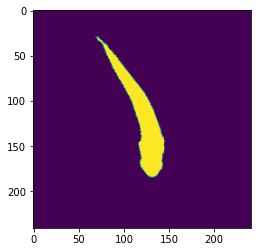

28072


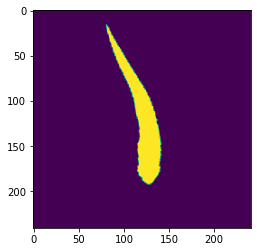

28076


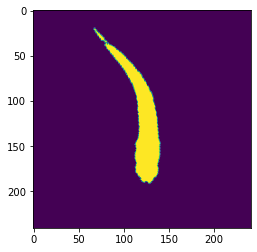

28111


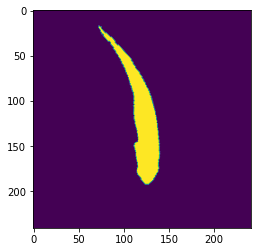

28112


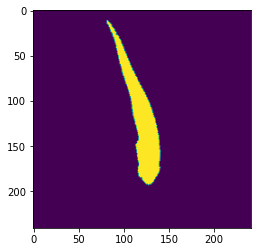

28113


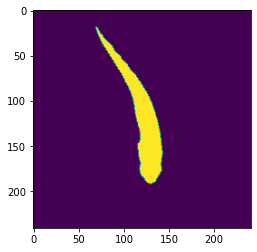

28114


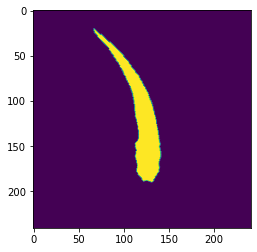

28115


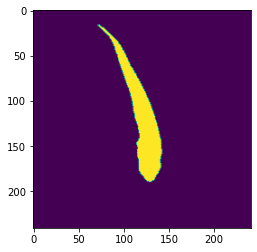

28116


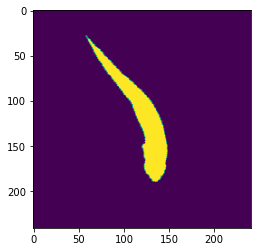

28139


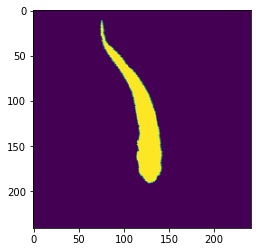

28145


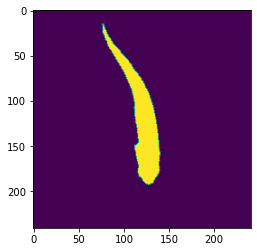

28147


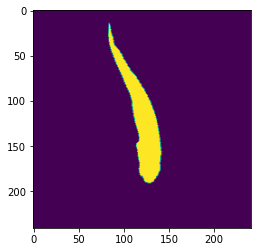

28148


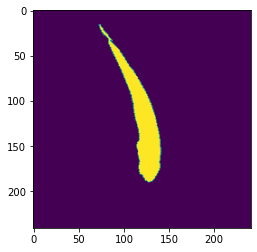

28149


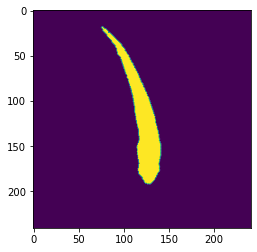

28150


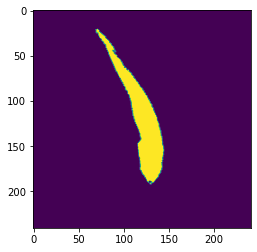

28181


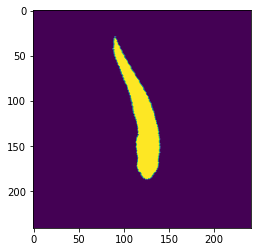

28183


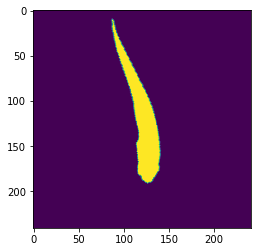

28184


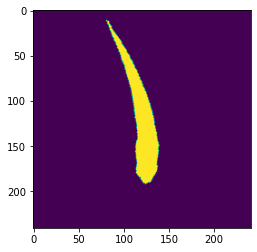

28188


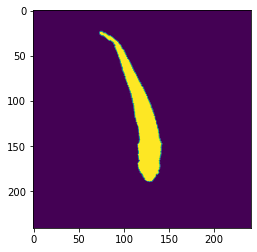

28227


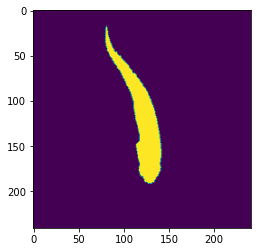

28229


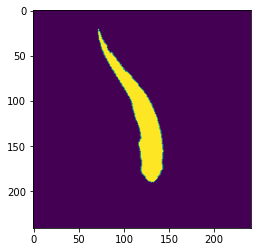

28230


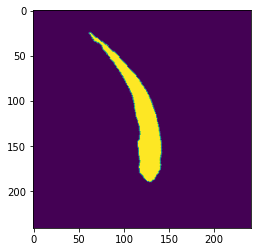

28231


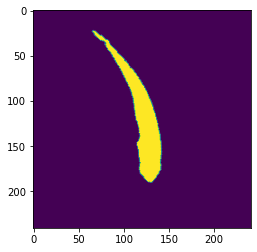

28232


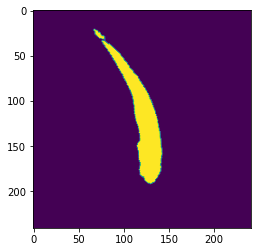

28235


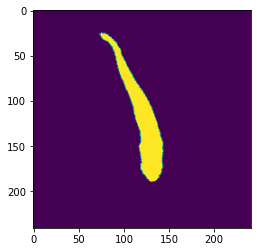

28260


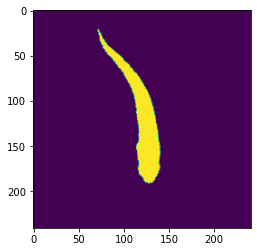

28262


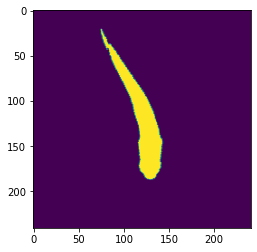

28265


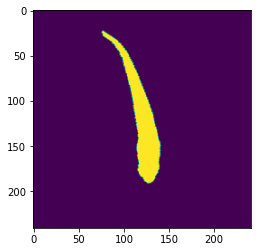

28305


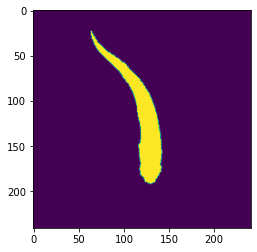

28307


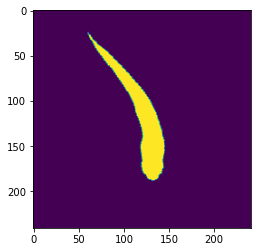

28337


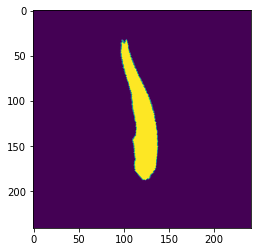

28340


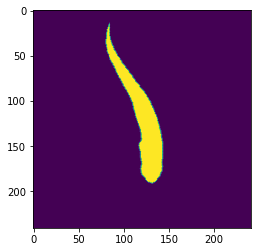

28341


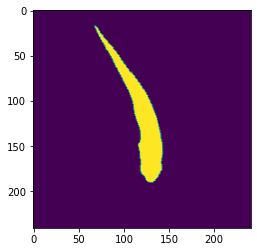

28342


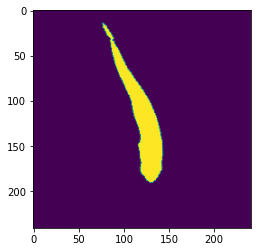

28369


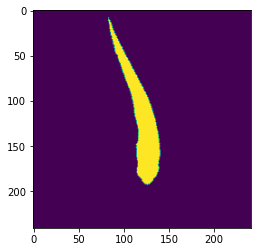

28370


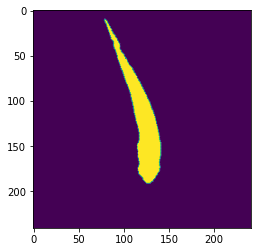

28371


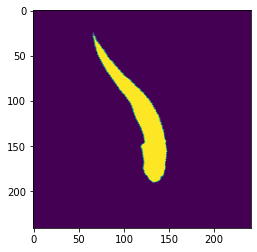

28450


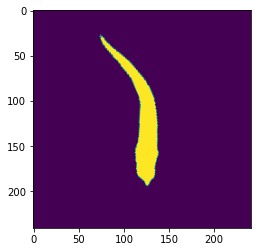

28464


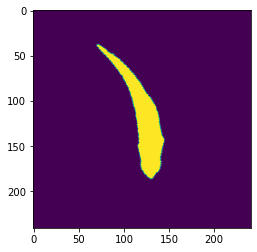

28565


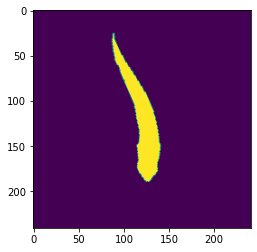

28733


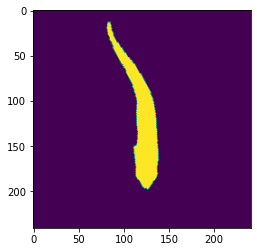

28750


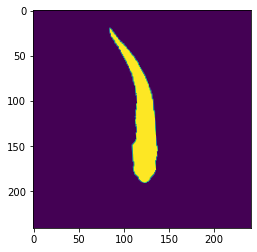

28803


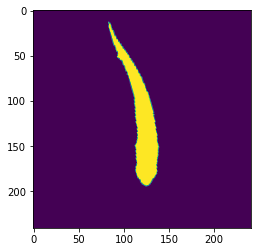

28806


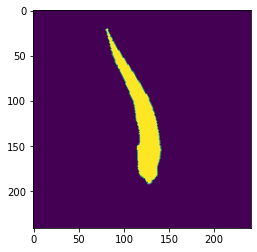

28810


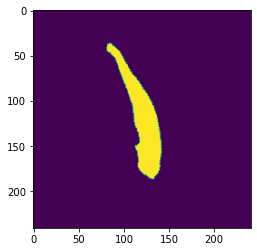

28919


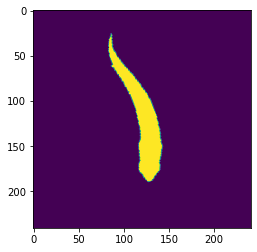

28948


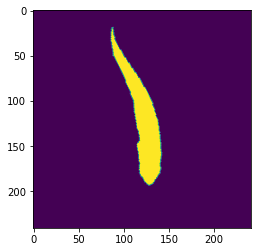

28953


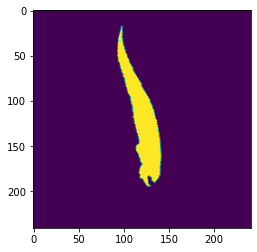

28961


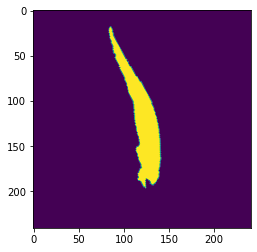

28967


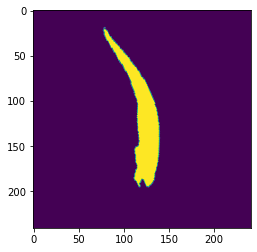

28975


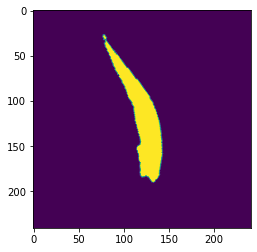

28978


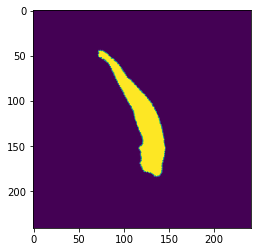

29085


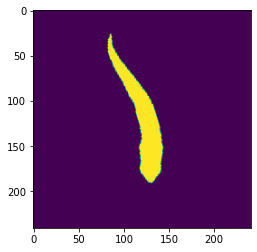

29127


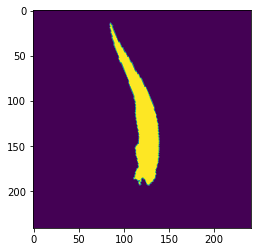

29150


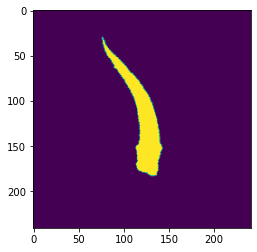

29280


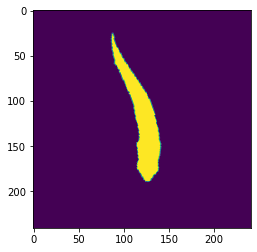

29311


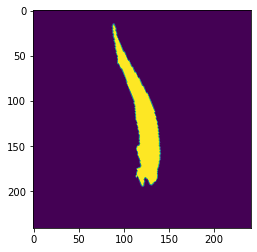

29316


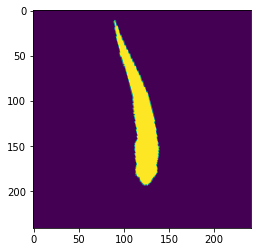

29318


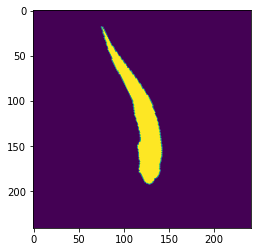

29322


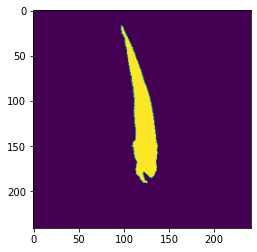

29325


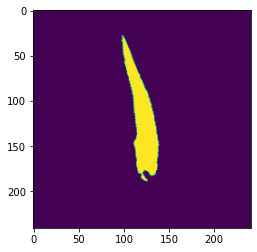

29472


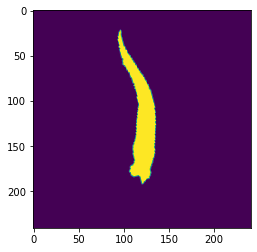

29495


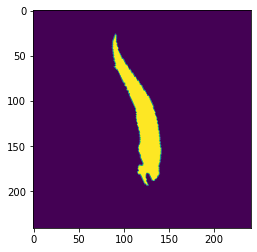

29498


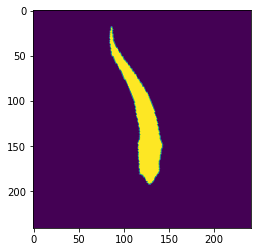

29499


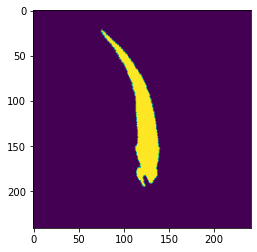

29506


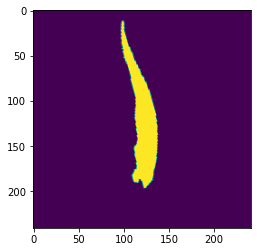

29657


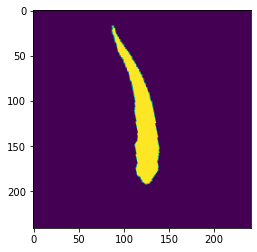

29680


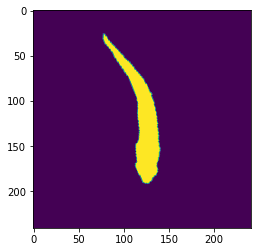

29684


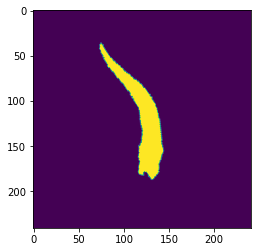

29689


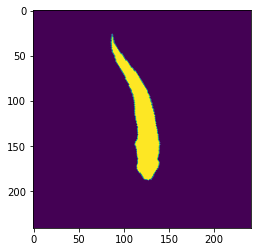

29706


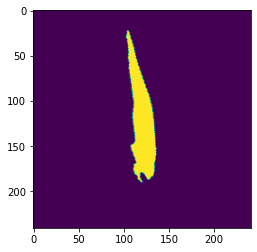

29784


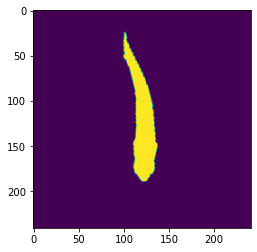

29797


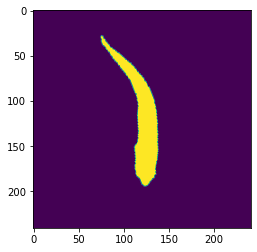

29814


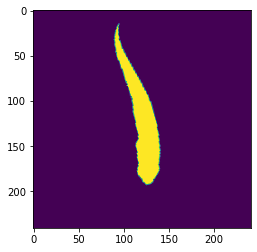

29815


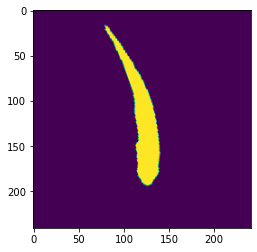

29816


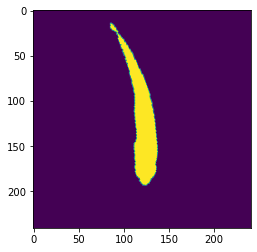

29820


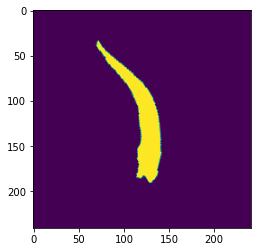

29823


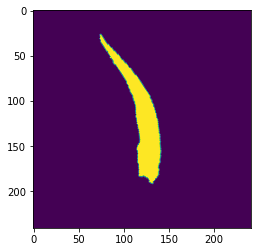

29824


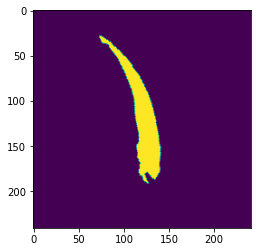

29826


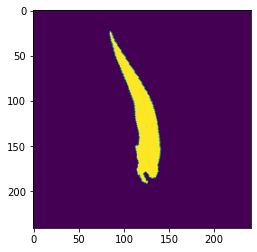

29919


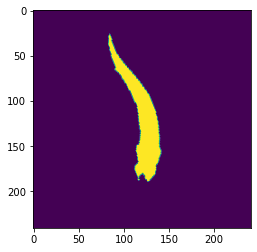

29923


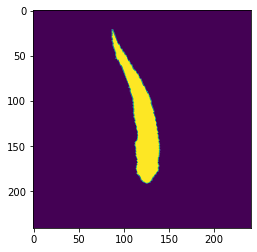

29938


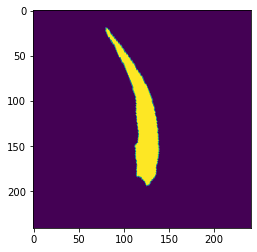

29946


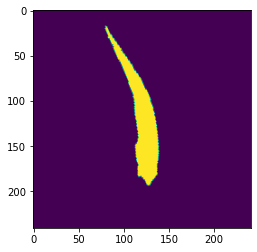

29950


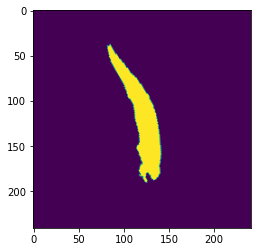

29953


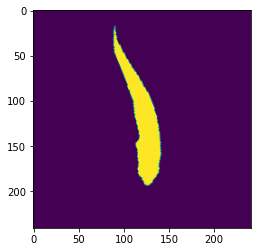

29956


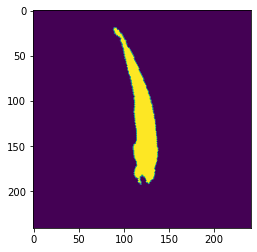

29961


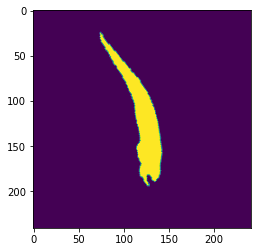

29964


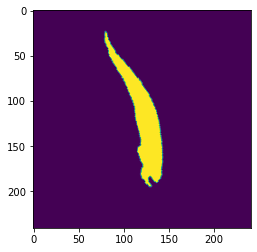

29968


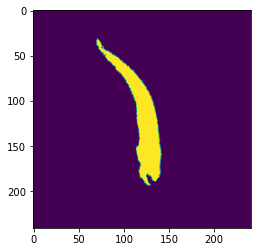

29984


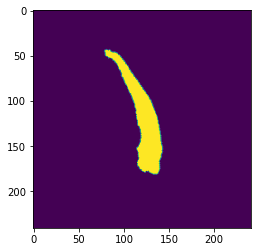

30115


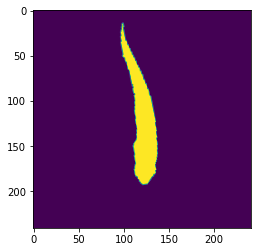

30123


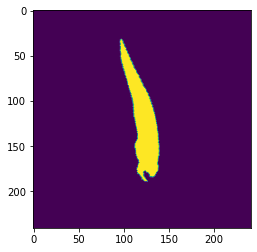

30127


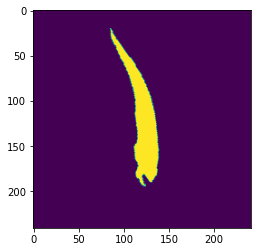

30145


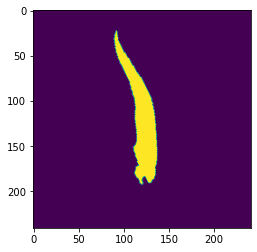

30238


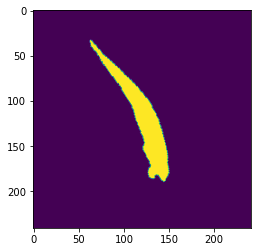

30249


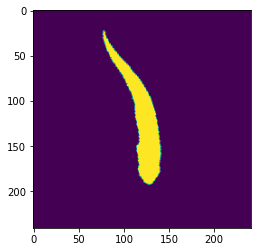

30253


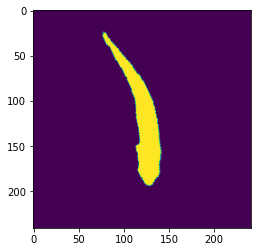

30338


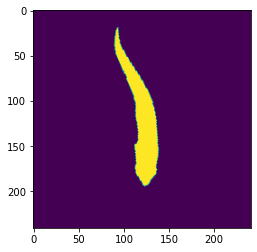

30356


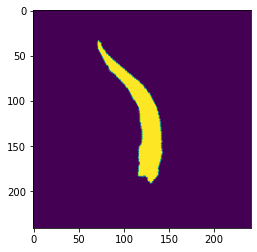

30363


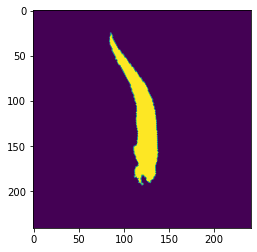

30386


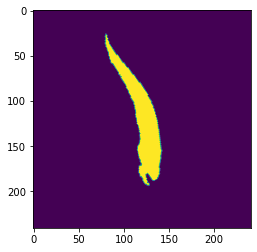

30393


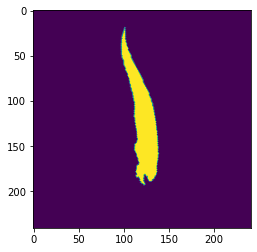

30482


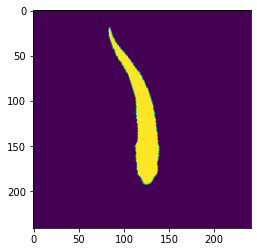

30506


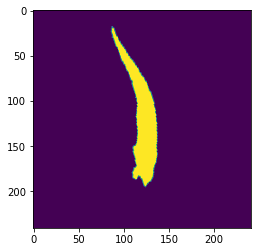

30509


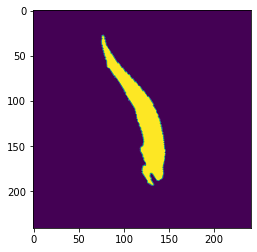

30516


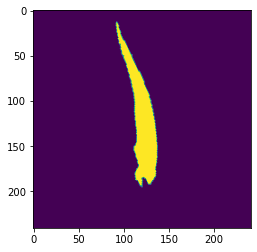

30535


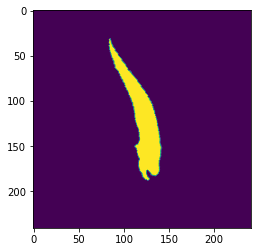

30537


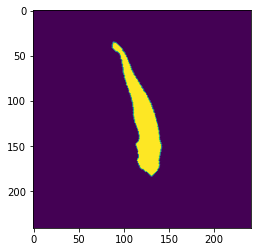

30662


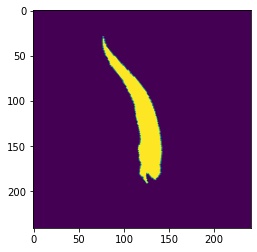

30686


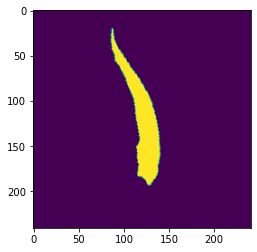

30687


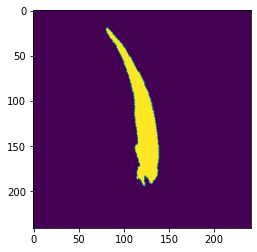

30690


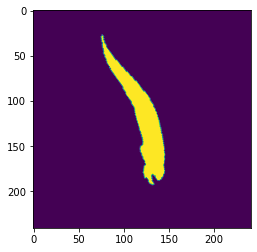

30699


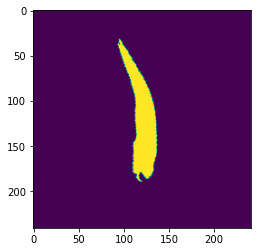

30700


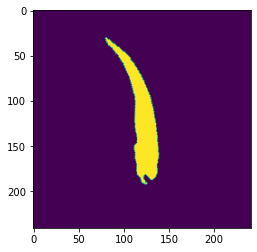

30705


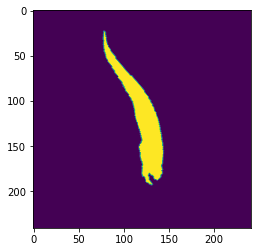

30708


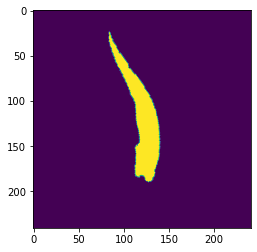

30712


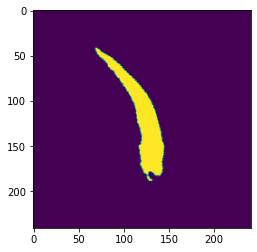

30823


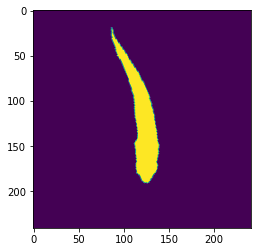

30830


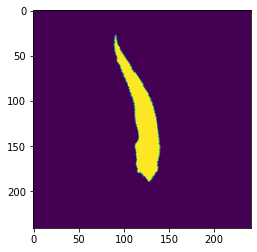

30831


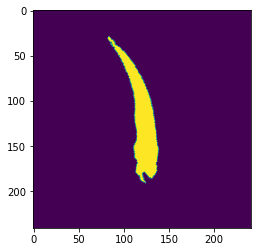

30840


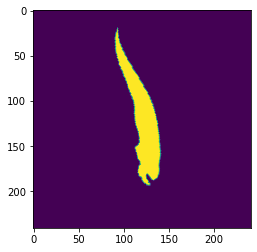

30858


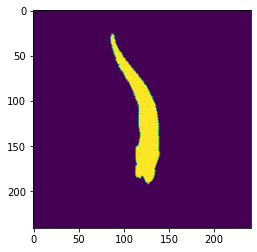

30944


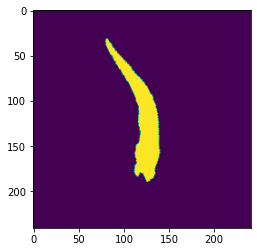

30972


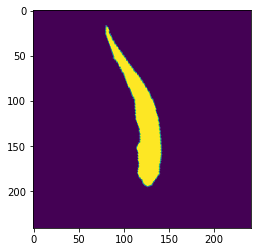

30973


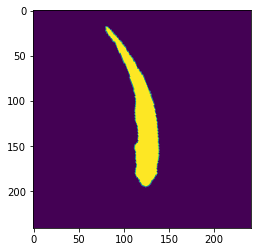

30974


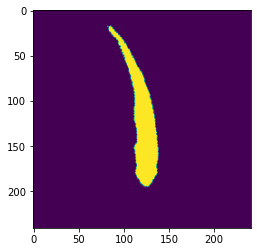

30975


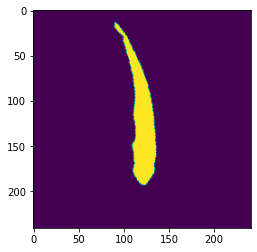

30978


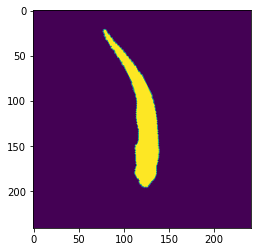

31069


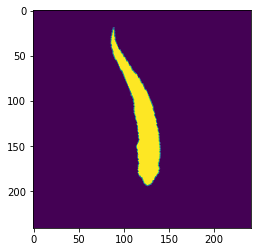

31087


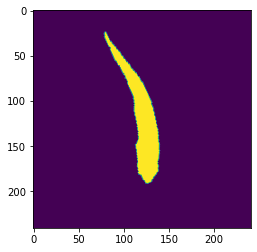

31091


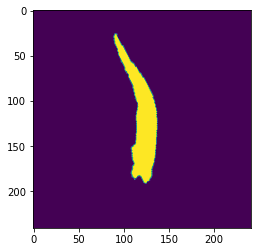

31102


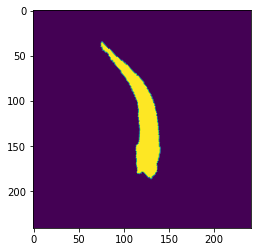

31107


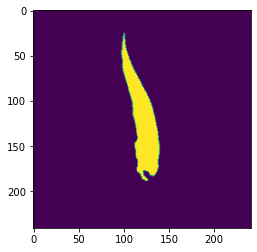

31111


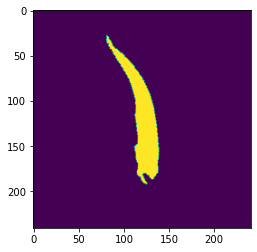

31113


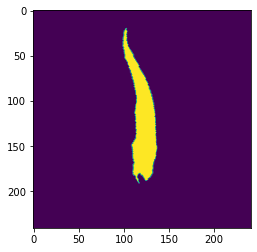

31121


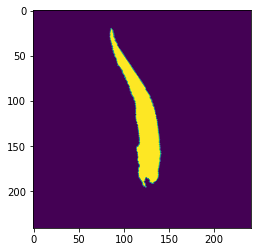

31128


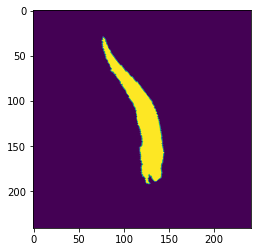

31203


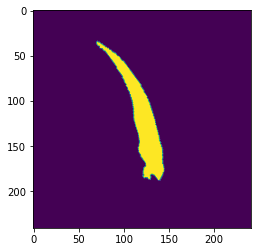

31235


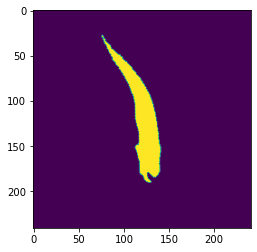

31238


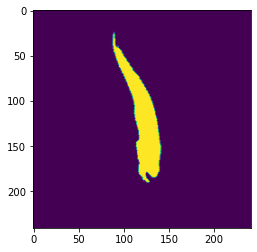

31248


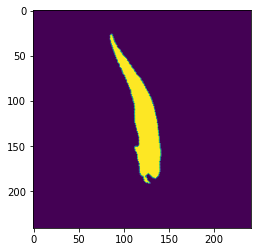

31251


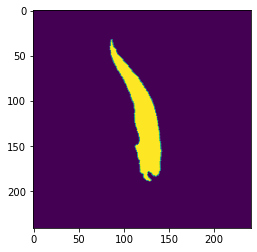

31256


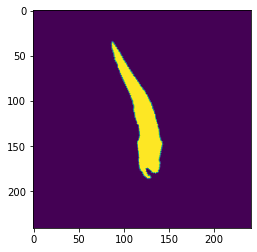

31265


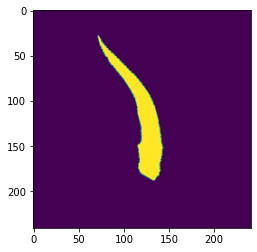

31269


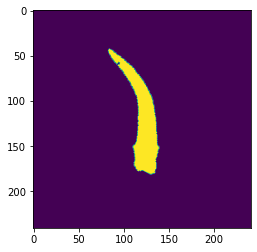

31339


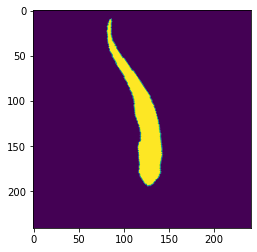

31340


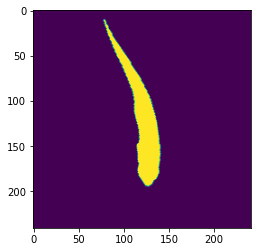

31343


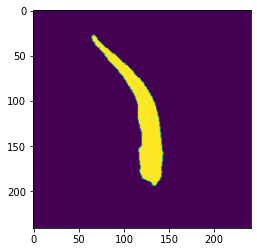

31548


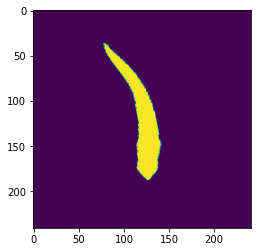

31556


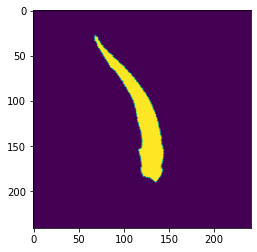

31622


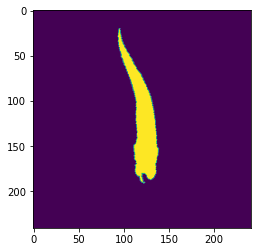

31640


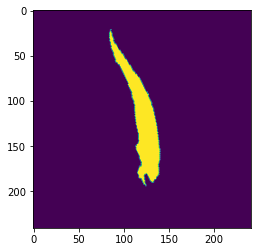

31660


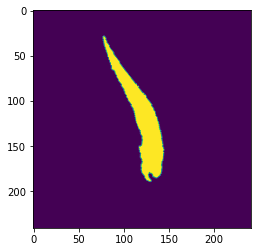

31772


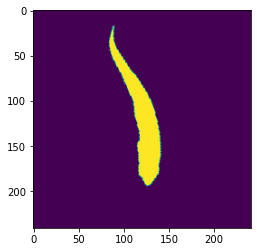

31773


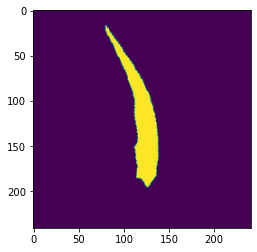

31782


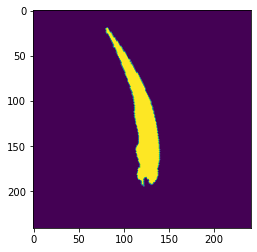

31787


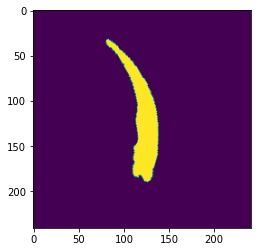

31844


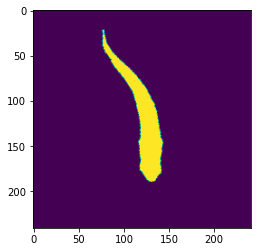

31907


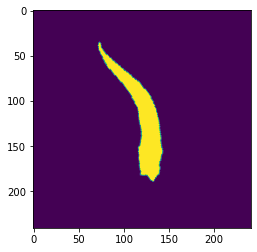

32030


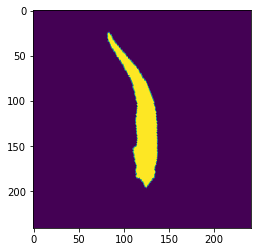

32032


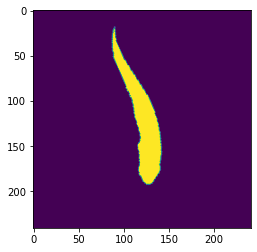

32033


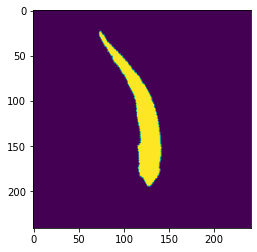

32040


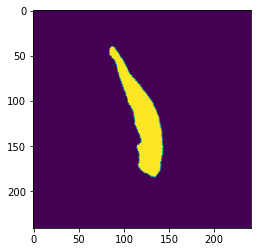

32127


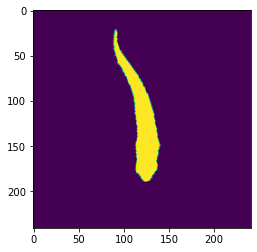

32142


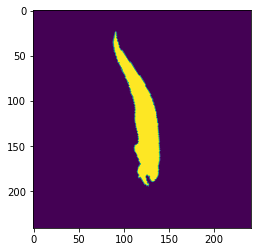

32145


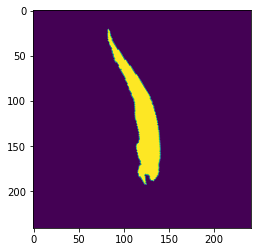

32171


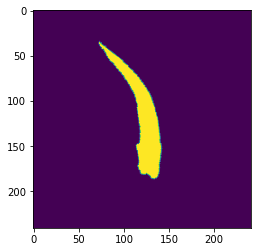

32274


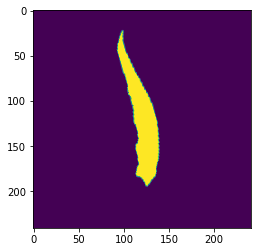

32277


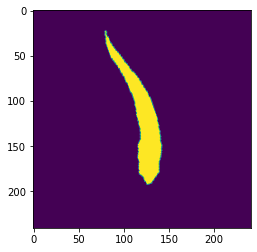

32285


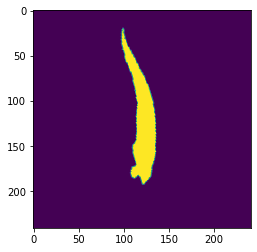

32300


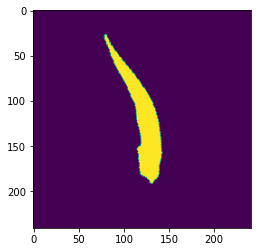

32307


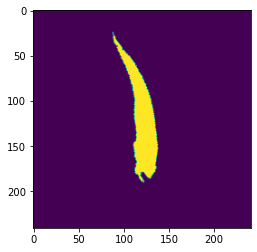

32326


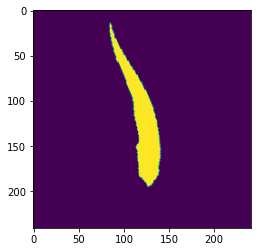

32408


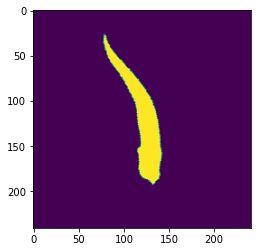

32428


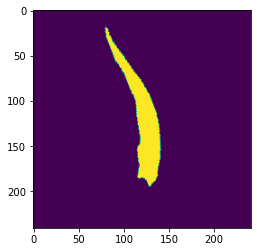

32444


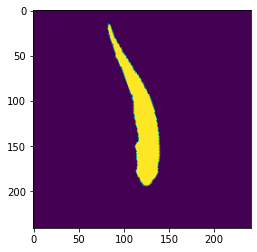

32445


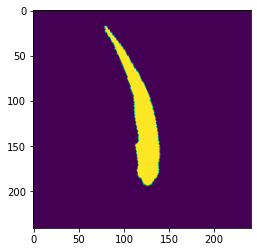

32446


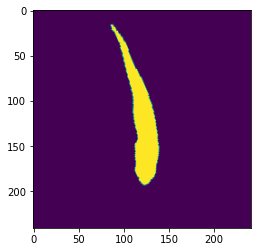

32559


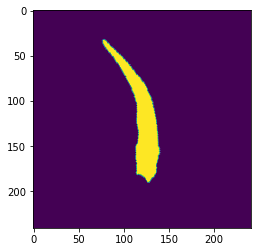

32565


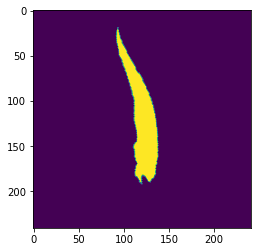

32581


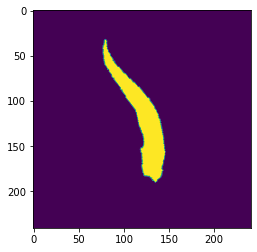

32687


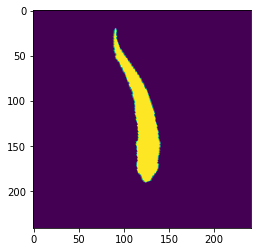

32691


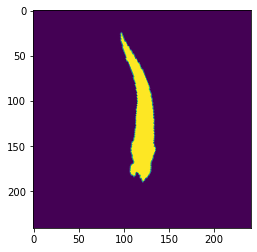

32714


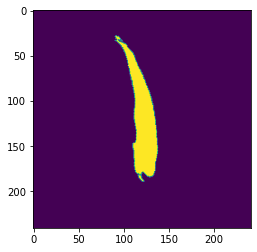

32725


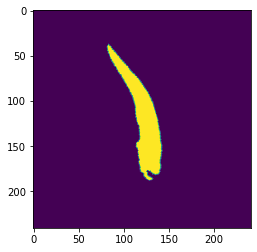

32727


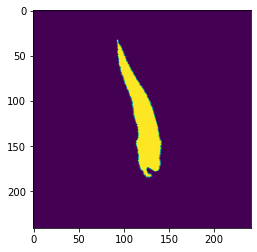

32728


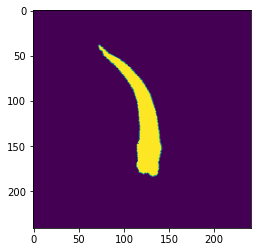

32820


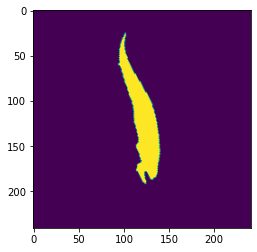

32829


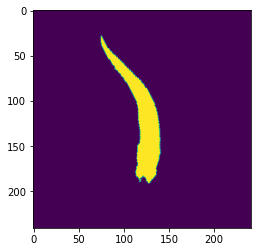

32844


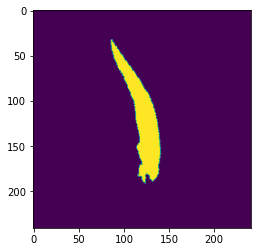

32851


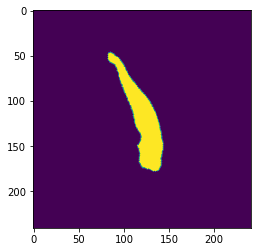

32934


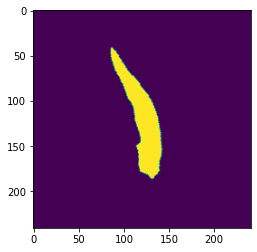

32952


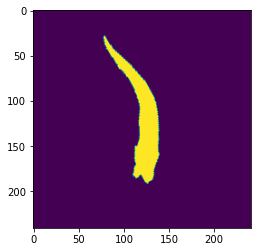

32980


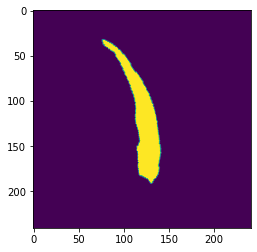

32982


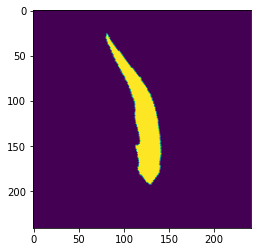

32988


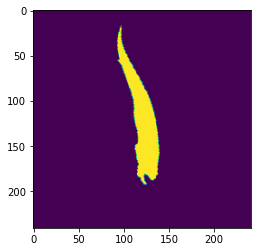

32998


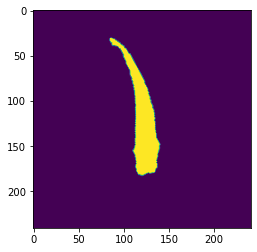

33075


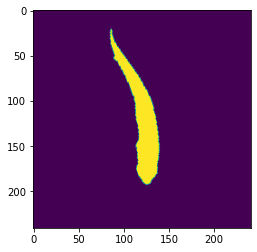

33088


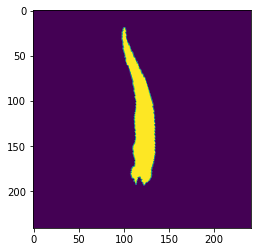

33100


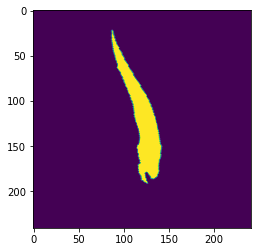

33206


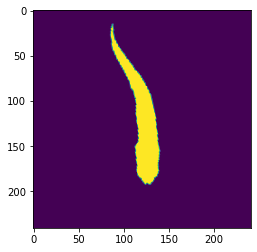

33235


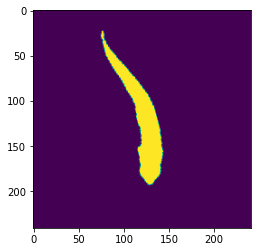

33263


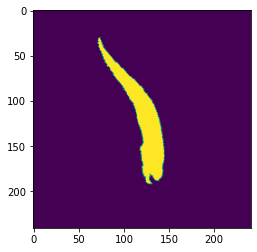

33336


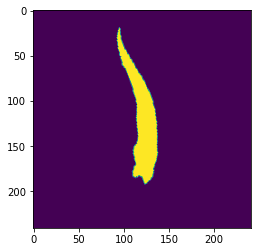

33347


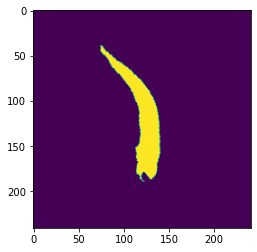

33366


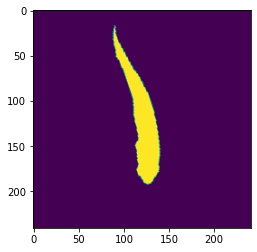

33372


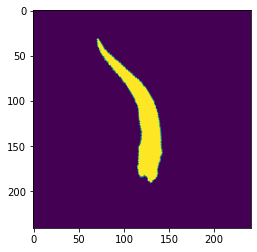

33373


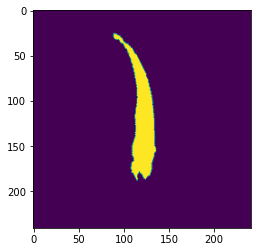

33374


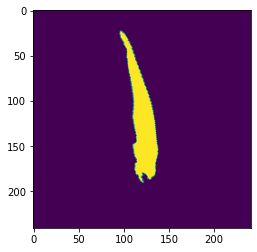

33375


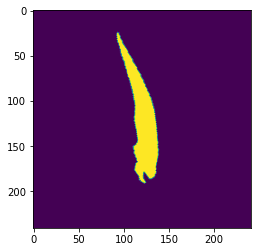

33444


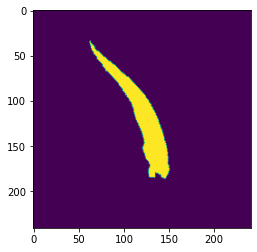

33448


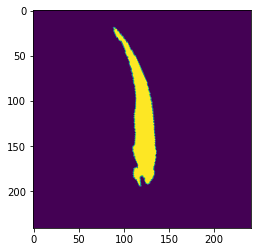

33451


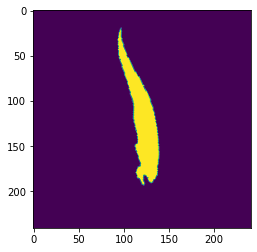

33454


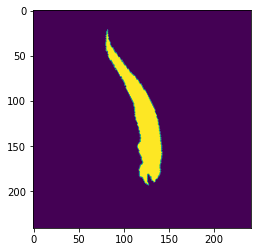

33457


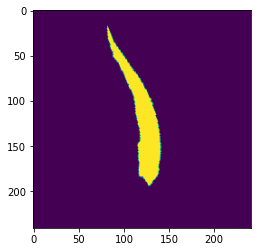

33462


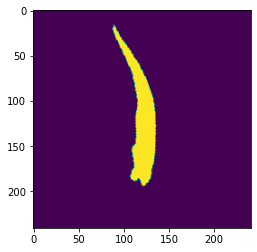

33563


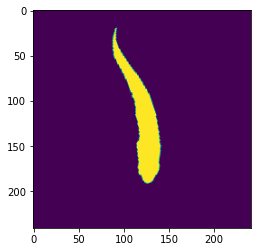

33572


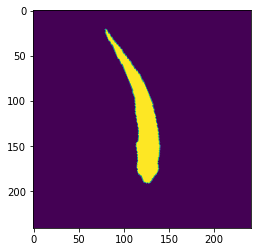

33575


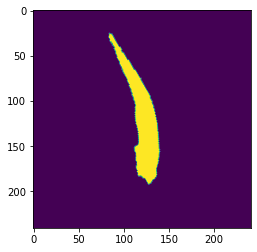

33578


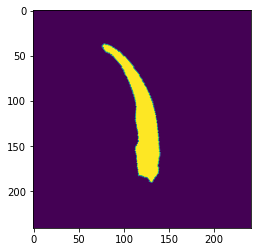

33580


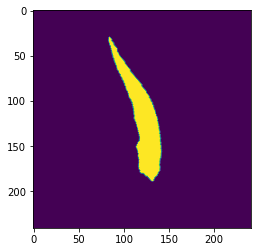

33583


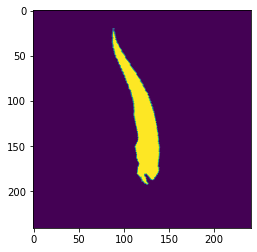

33591


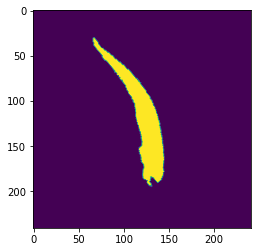

33594


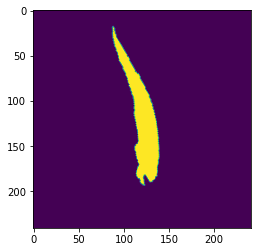

33597


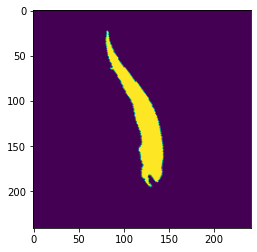

33608


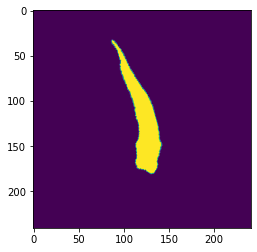

33615


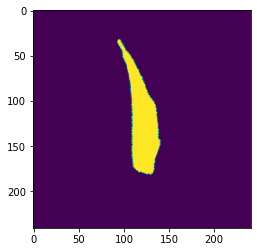

33618


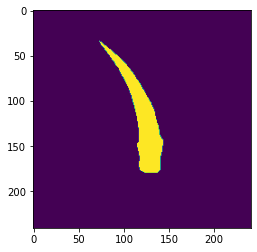

33621


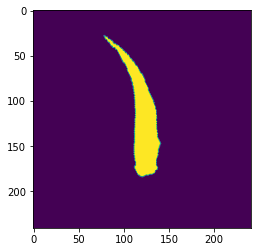

33730


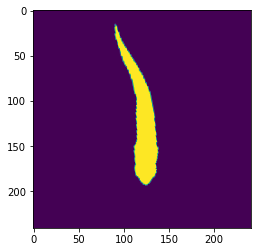

33734


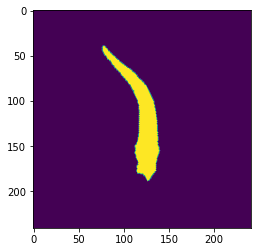

33759


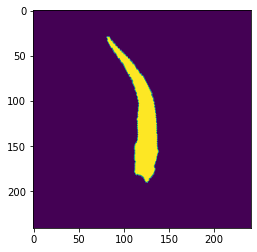

33771


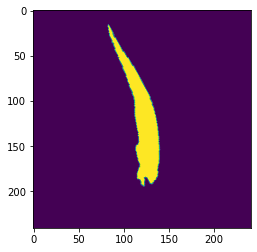

33774


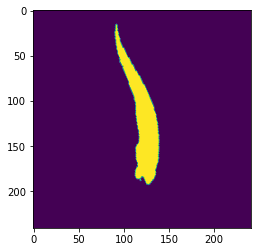

33777


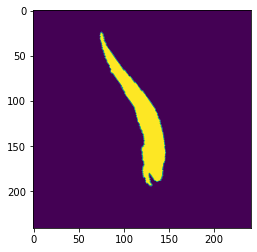

33780


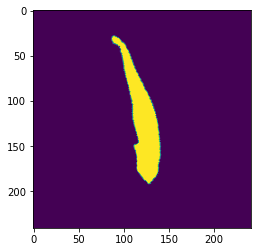

33791


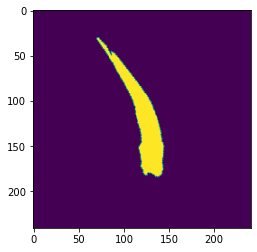

33908


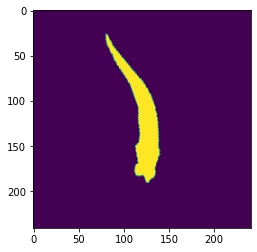

33923


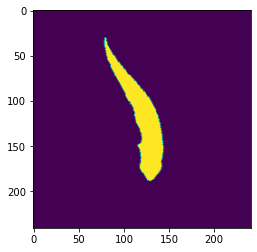

33977


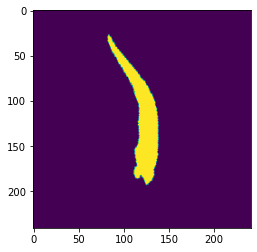

33989


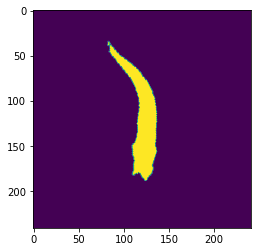

34000


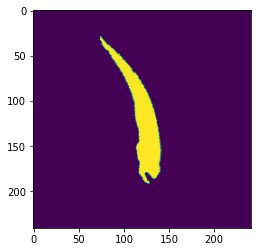

34011


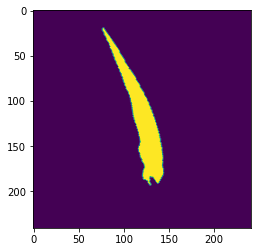

34027


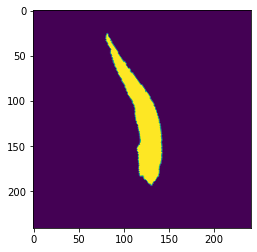

34134


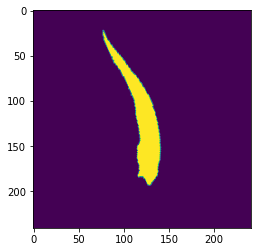

34139


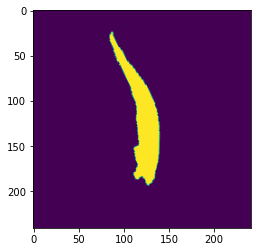

34142


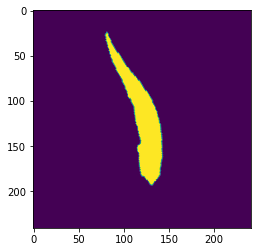

34146


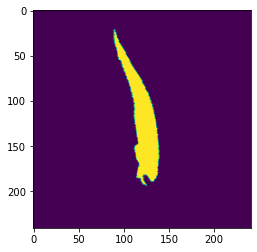

34152


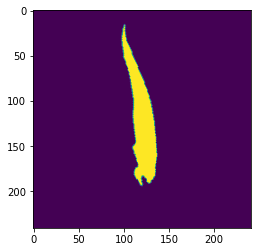

34160


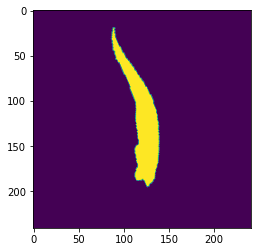

34169


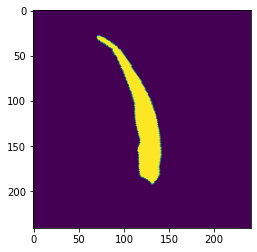

34267


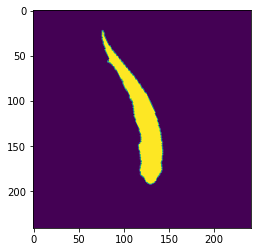

34272


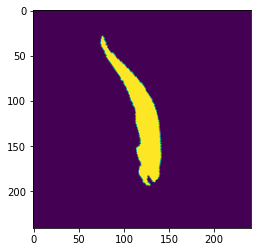

34276


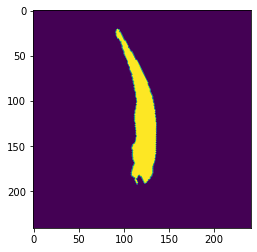

34279


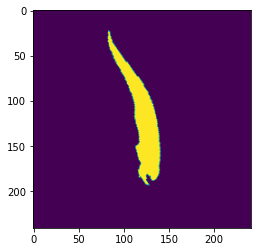

34282


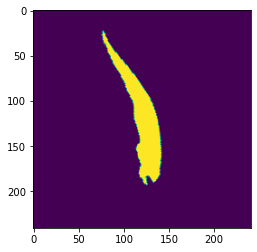

34286


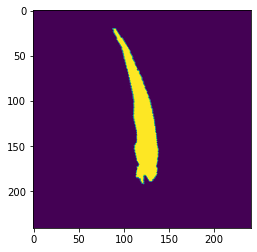

34288


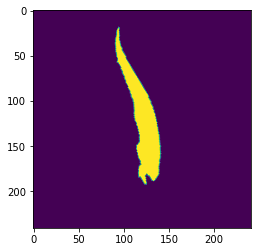

34292


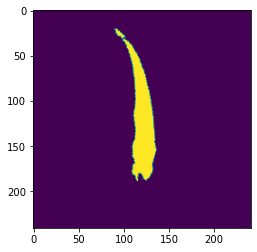

34294


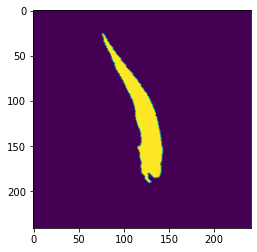

34401


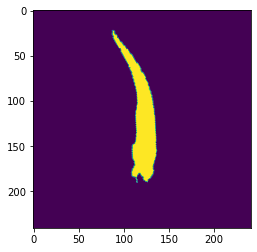

34403


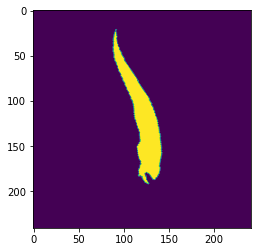

34406


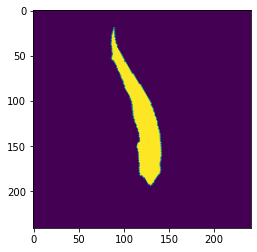

34408


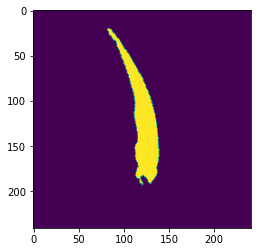

34411


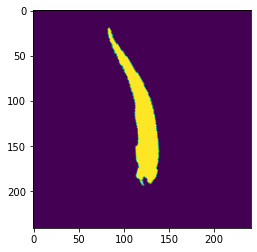

34417


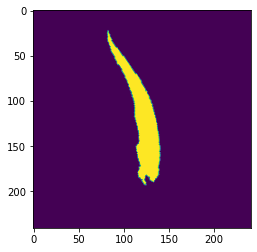

34419


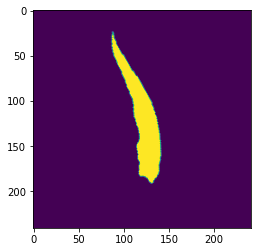

34438


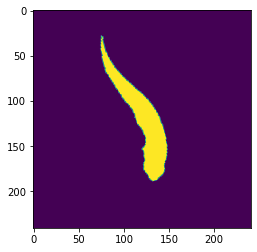

34443


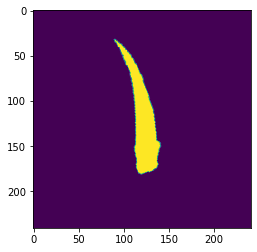

34554


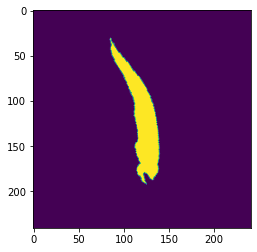

34566


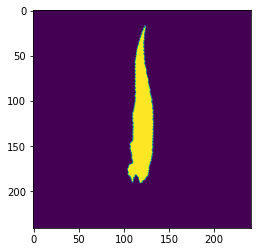

34585


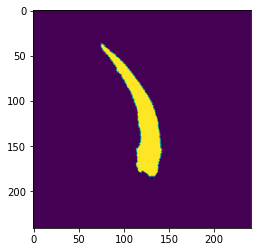

34589


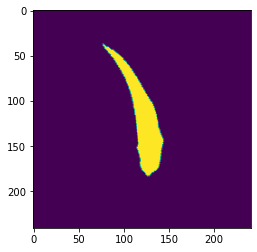

34658


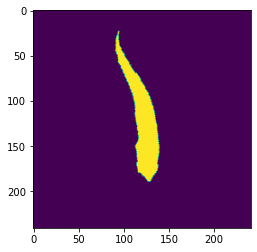

34662


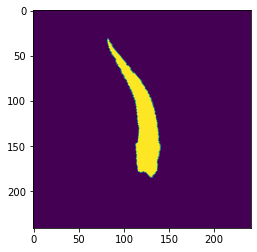

34672


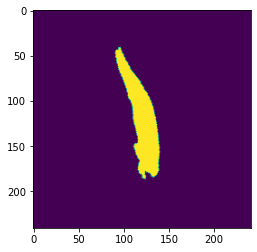

34690


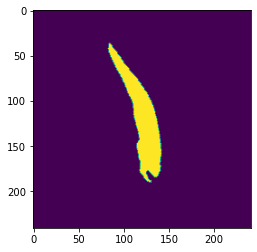

34693


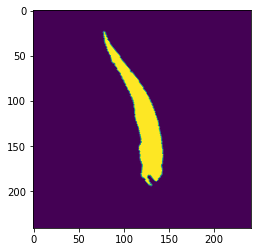

34696


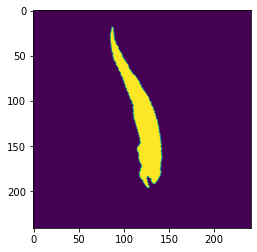

34700


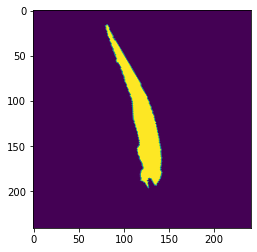

34708


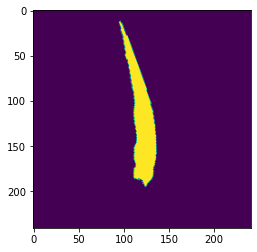

34817


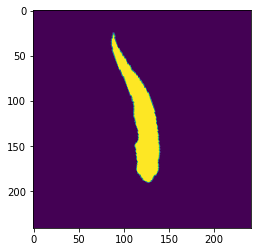

34837


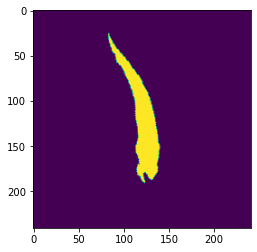

34845


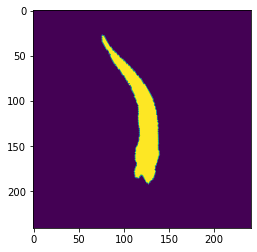

34857


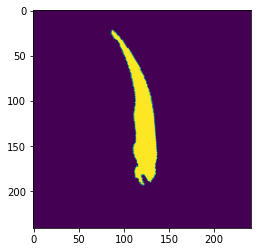

34868


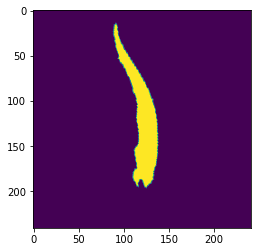

35013


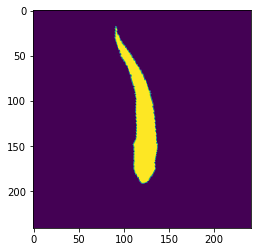

35027


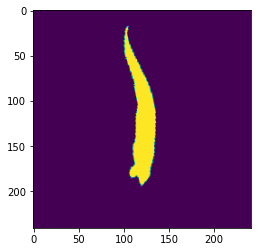

35030


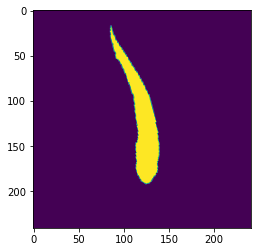

35109


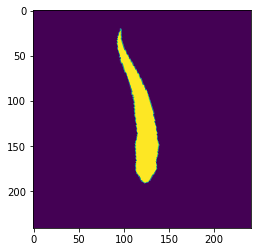

35130


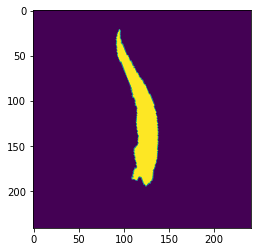

35133


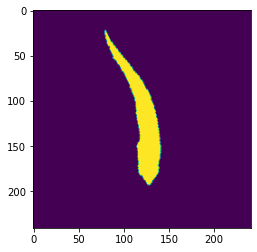

35139


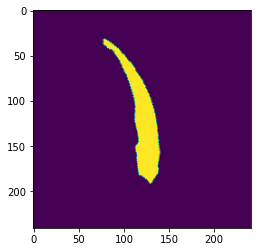

35141


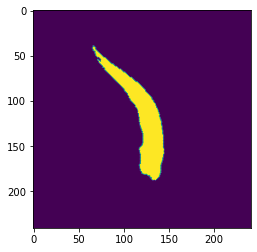

35144


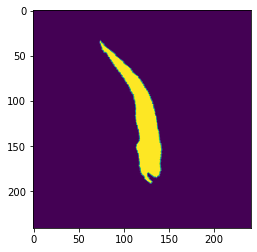

35148


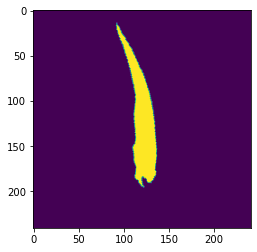

35151


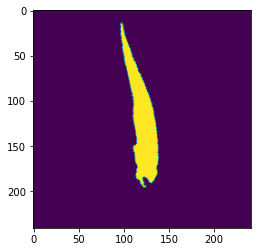

35152


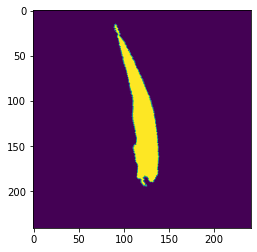

35153


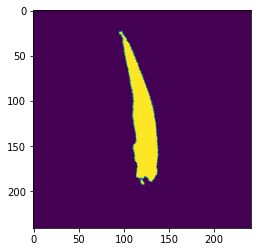

35155


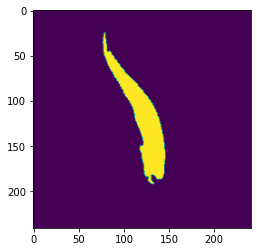

35161


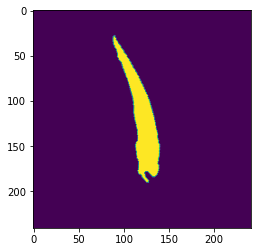

35255


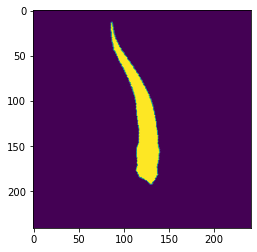

35280


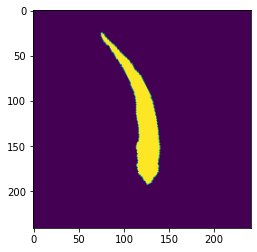

35285


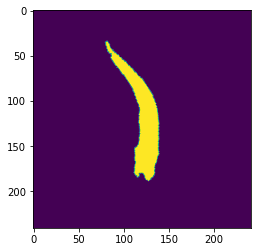

35288


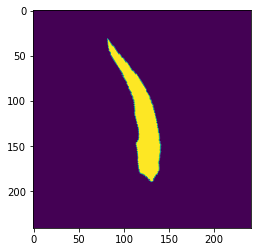

35291


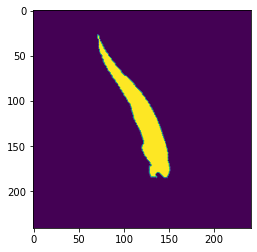

35306


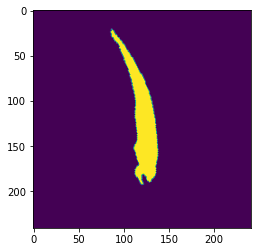

35310


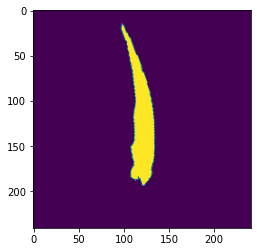

35327


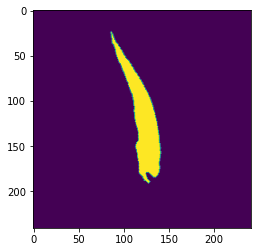

35330


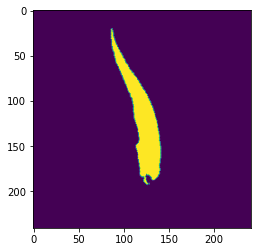

35446


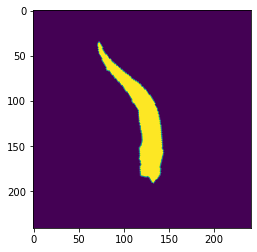

35449


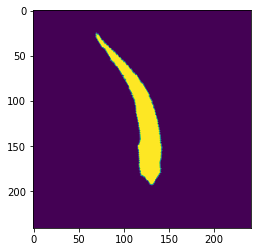

35460


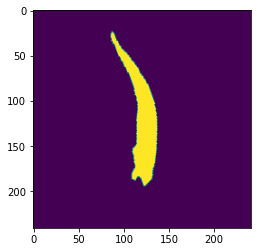

35463


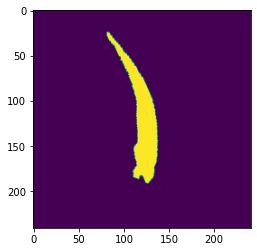

35492


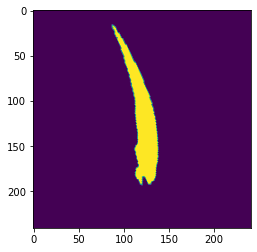

35496


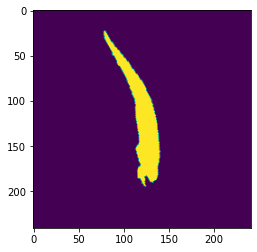

35540


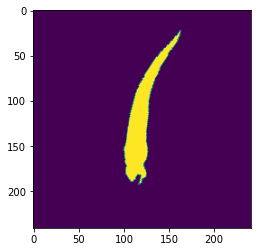

35602


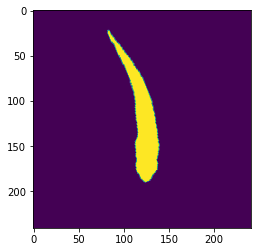

35635


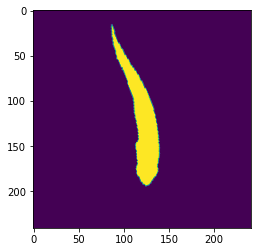

35645


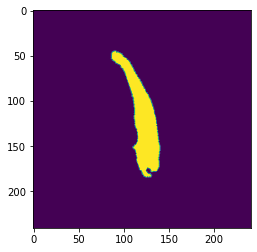

35649


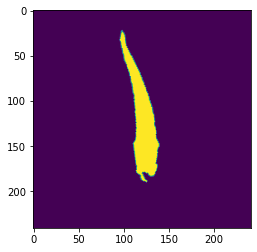

35759


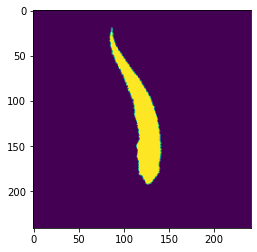

35764


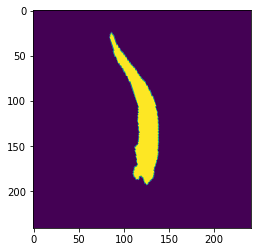

35767


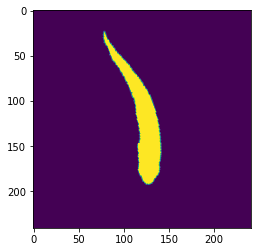

35773


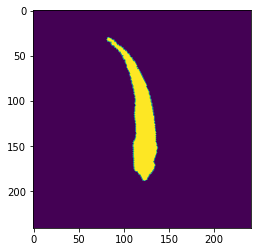

35775


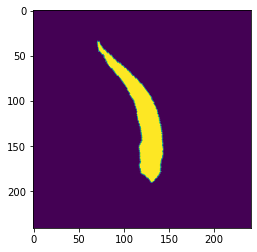

35778


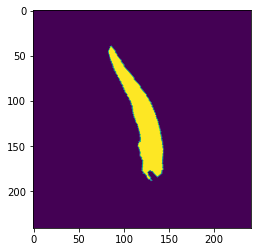

35782


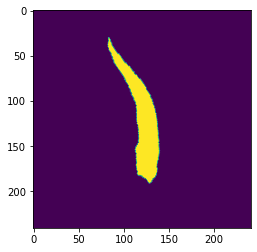

35808


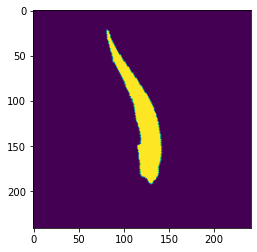

35923


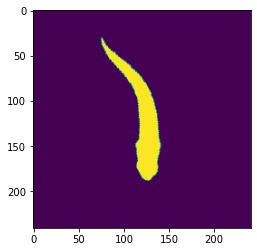

35962


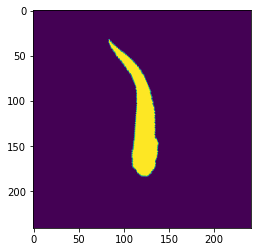

36122


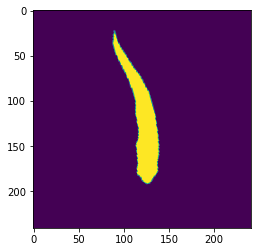

36126


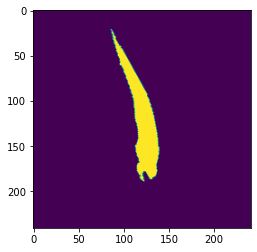

36127


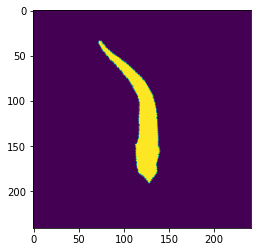

36130


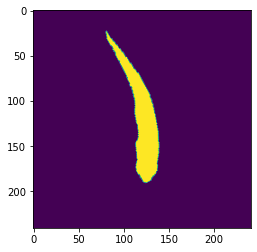

36169


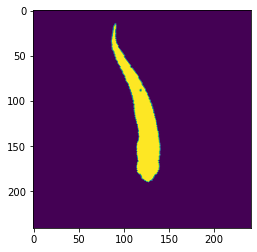

36173


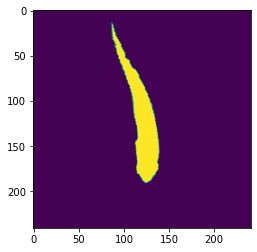

36174


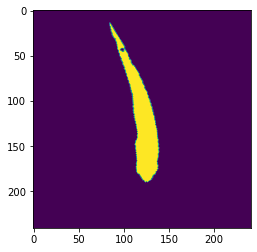

36178


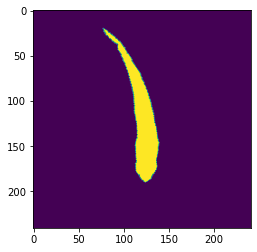

36179


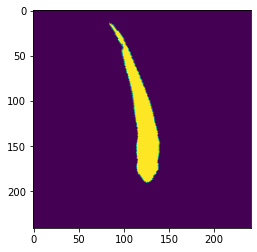

36220


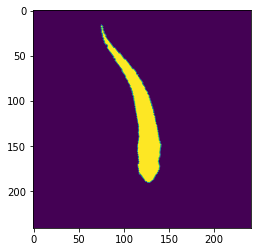

36222


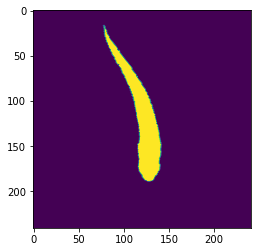

36226


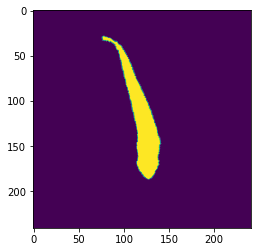

36237


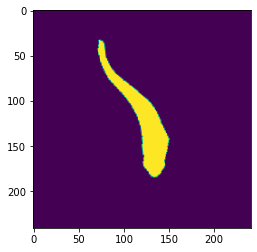

36267


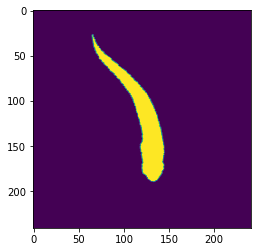

36268


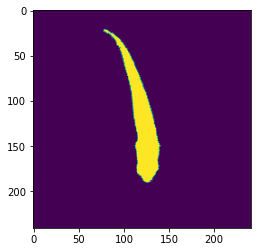

36269


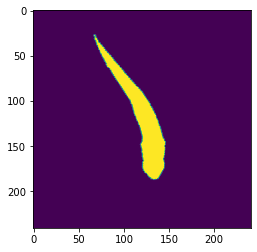

36305


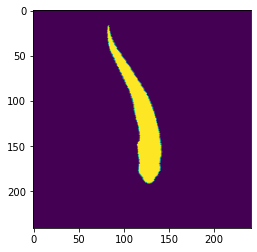

36306


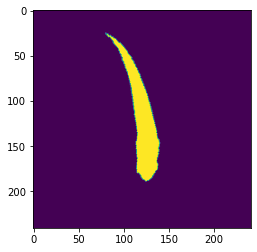

36307


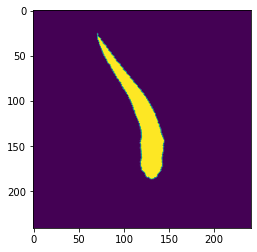

36309


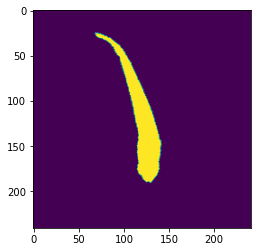

36330


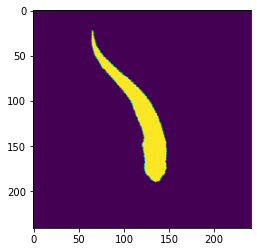

36359


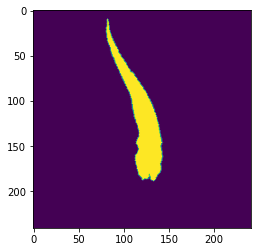

36360


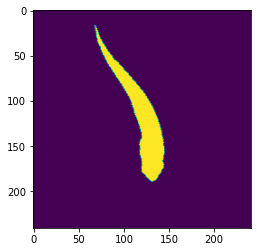

36363


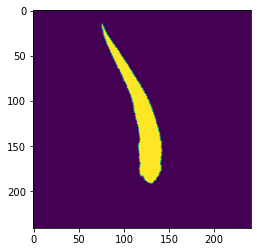

36364


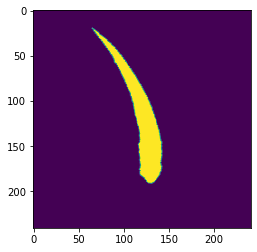

36365


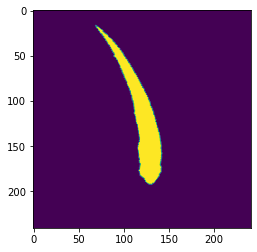

36393


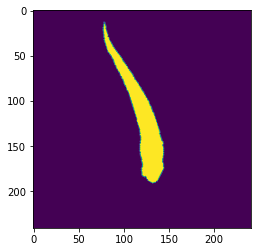

36399


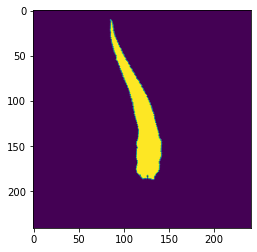

36400


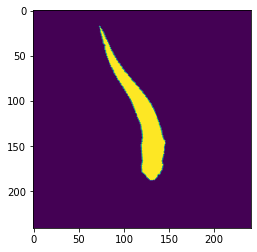

36404


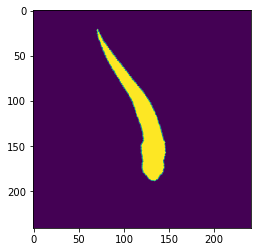

36430


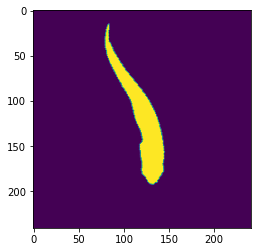

36431


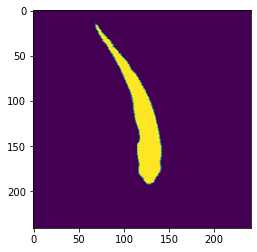

36435


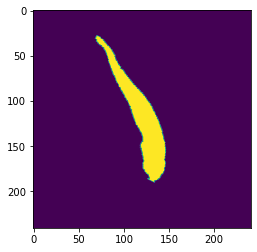

36463


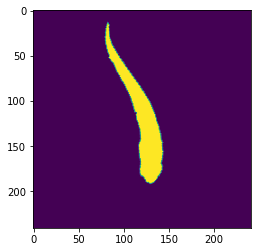

36464


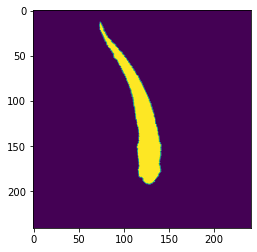

36467


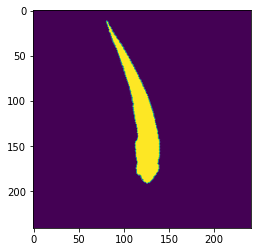

36471


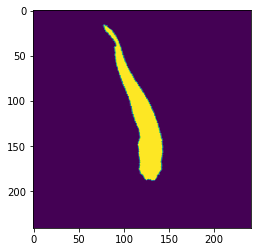

36513


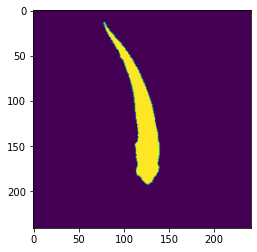

36515


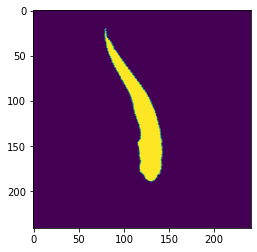

36517


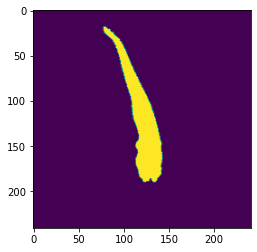

36564


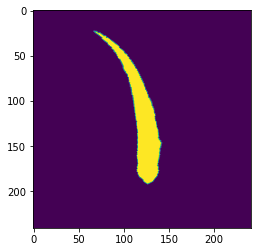

36590


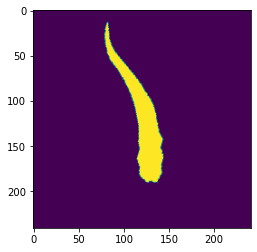

36601


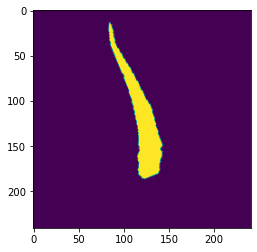

36617


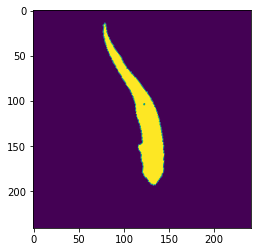

36733


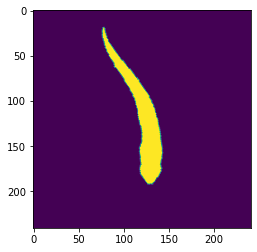

36736


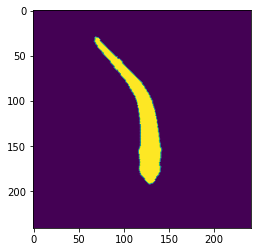

36781


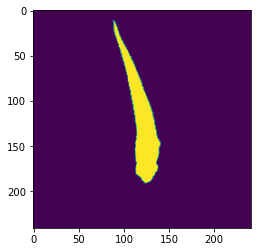

36816


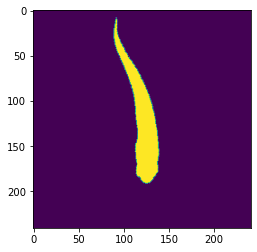

36819


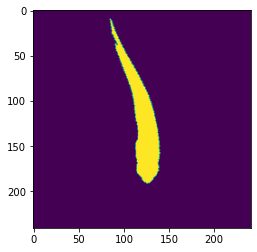

36820


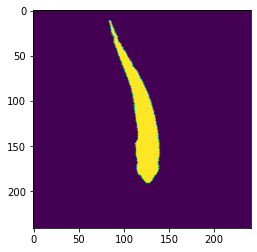

36824


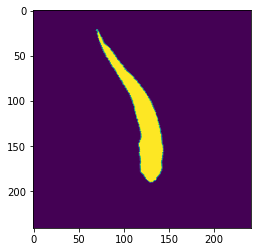

36827


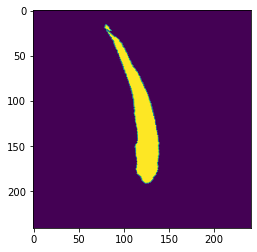

36959


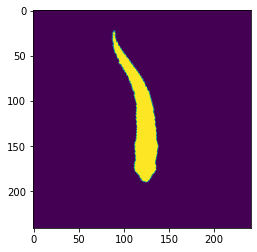

36967


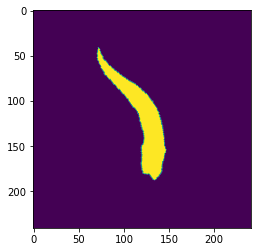

37034


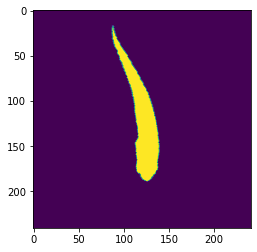

37036


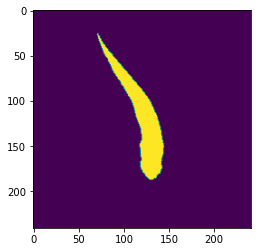

37080


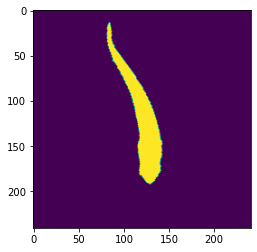

37083


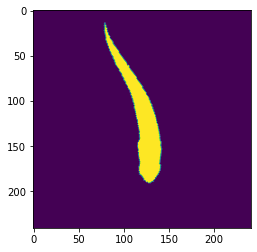

37087


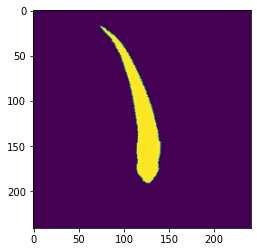

37088


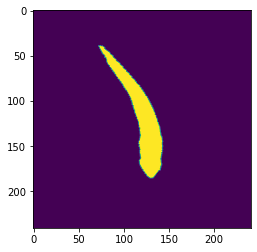

37124


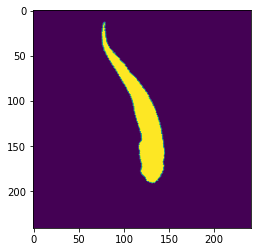

37125


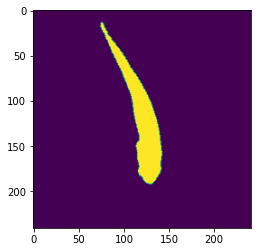

37127


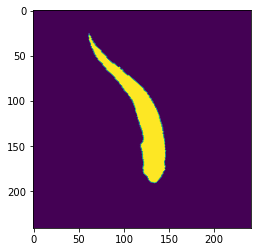

37128


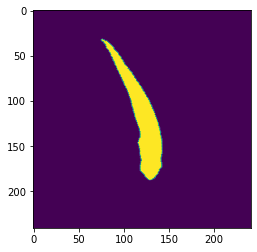

37132


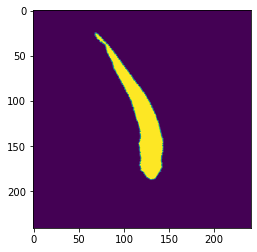

37136


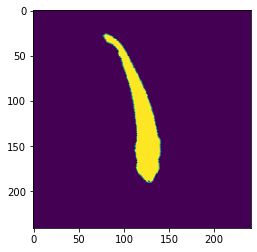

37191


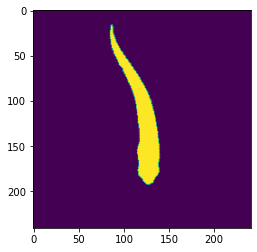

37193


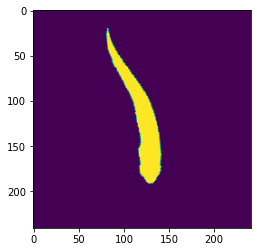

37227


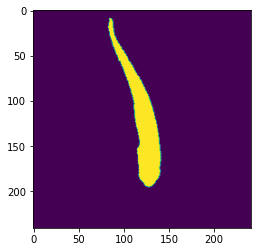

37229


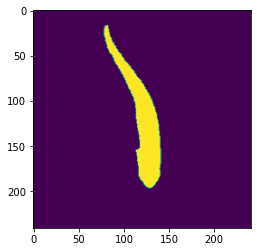

37232


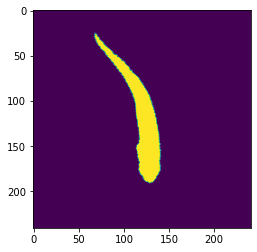

37234


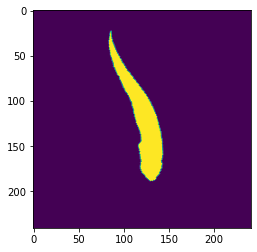

37270


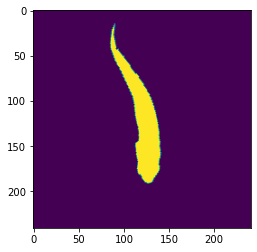

37272


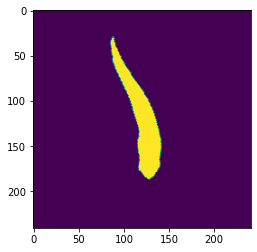

37273


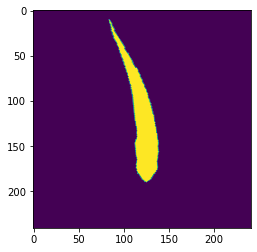

37278


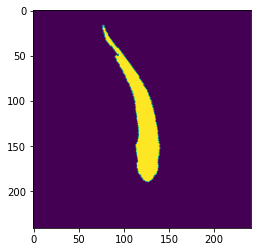

37283


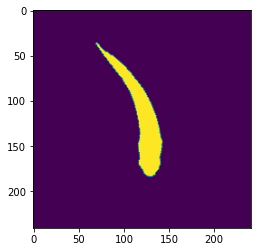

37286


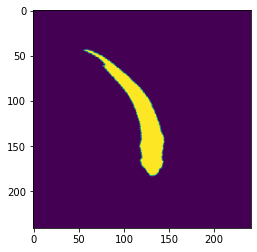

37325


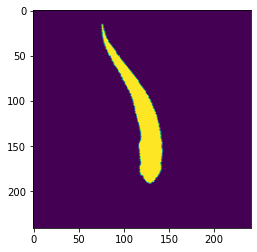

37326


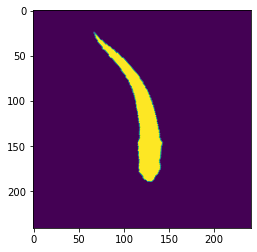

37328


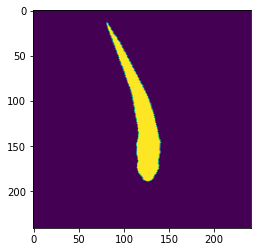

37444


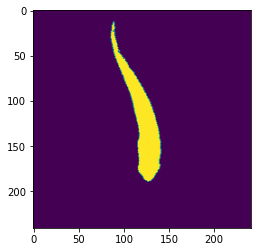

37449


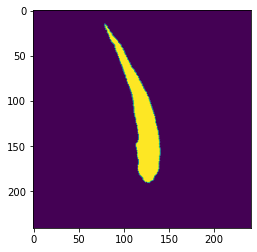

37450


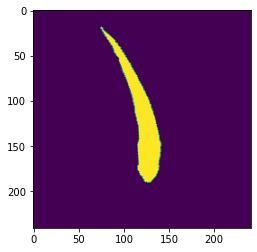

37486


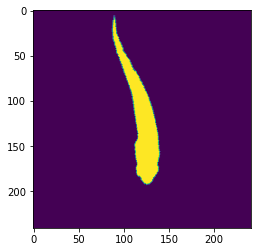

37493


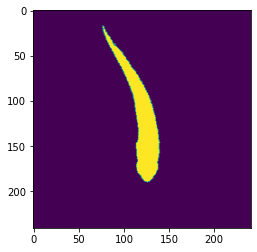

37494


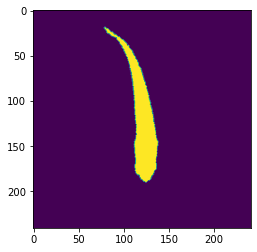

37496


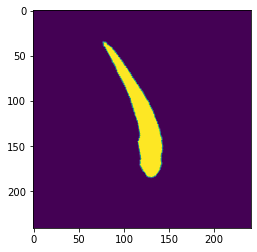

37513


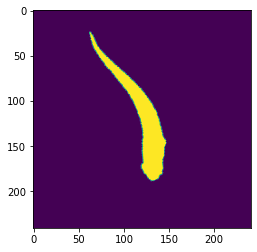

37554


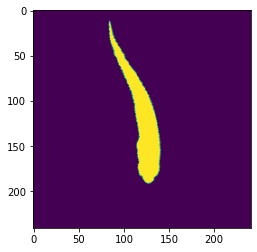

37555


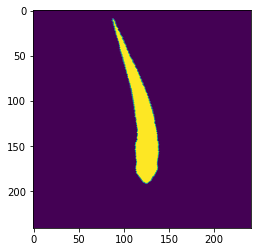

37556


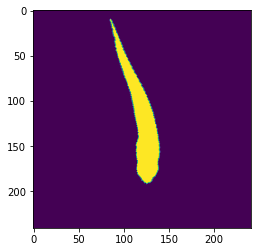

37557


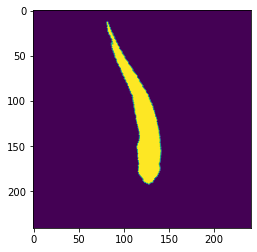

37558


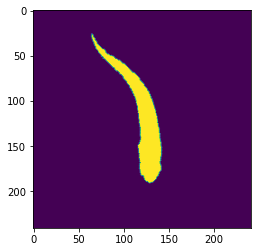

37560


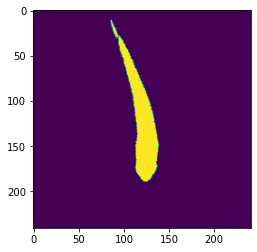

37561


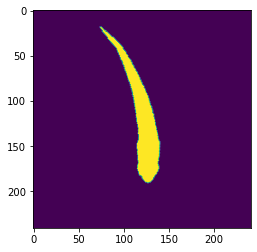

37591


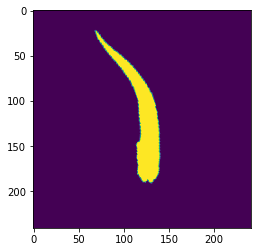

37596


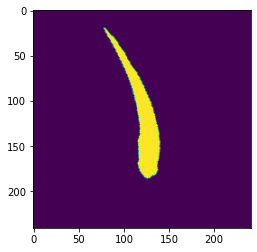

37645


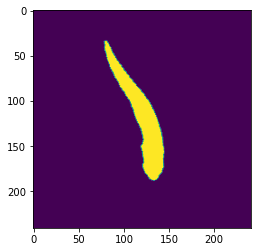

37697


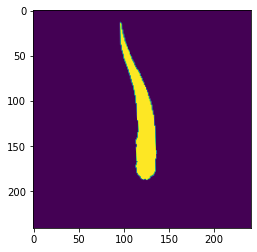

37912


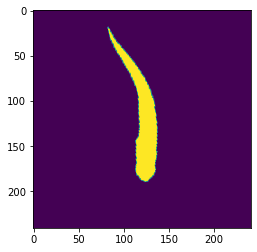

37936


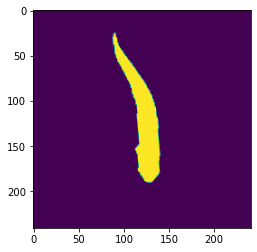

38090


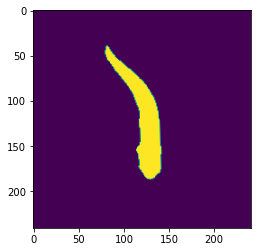

38106


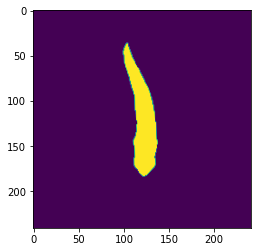

38114


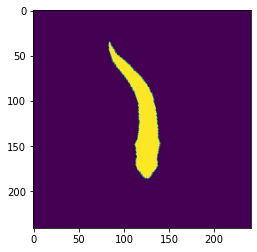

38156


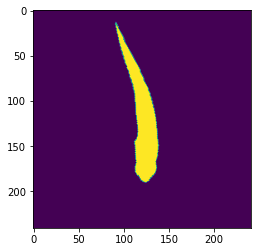

38464


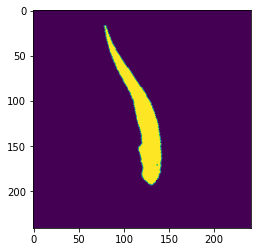

38472


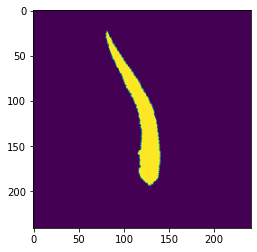

38508


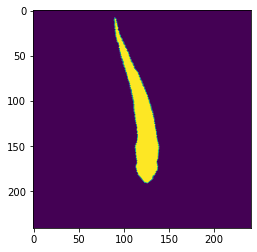

38510


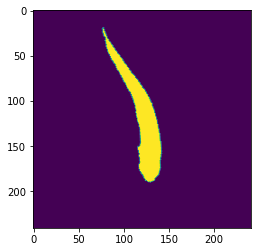

38511


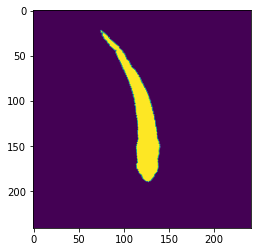

38530


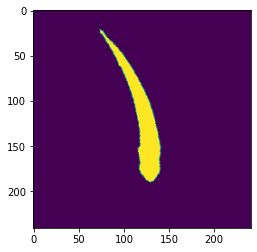

38580


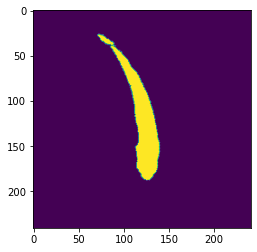

38735


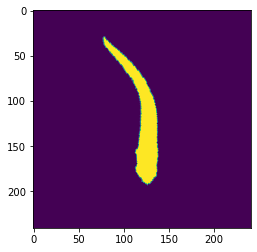

38756


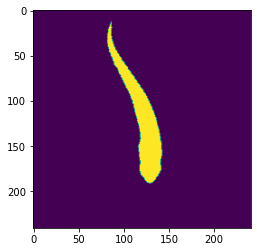

38758


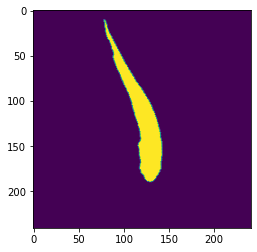

38799


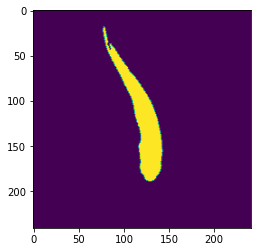

38800


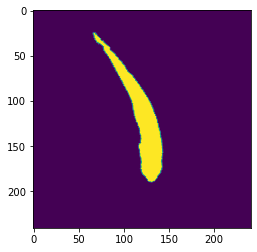

38801


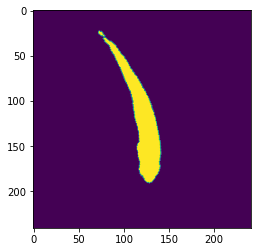

38890


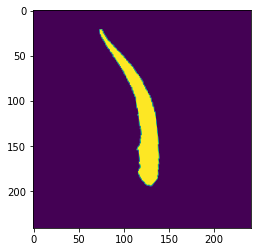

38929


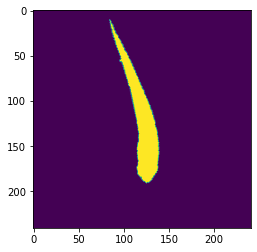

38931


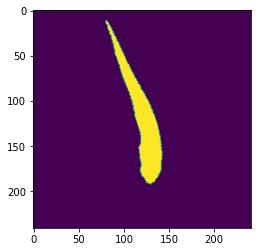

38935


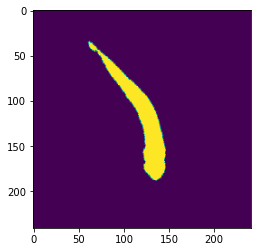

38969


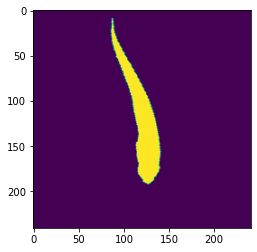

38972


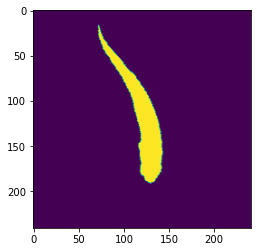

38974


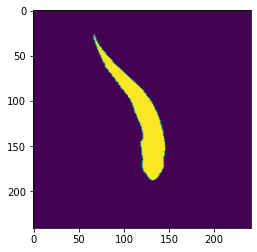

38975


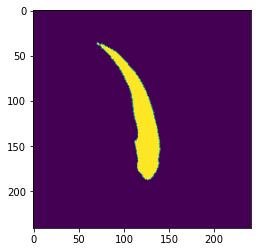

38976


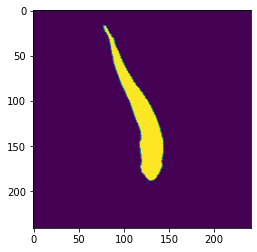

39027


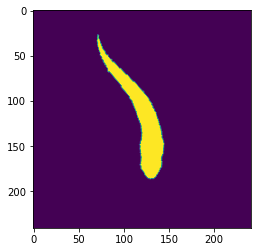

39030


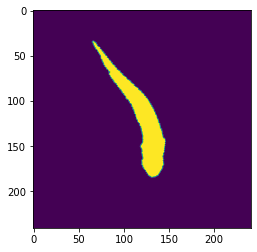

39087


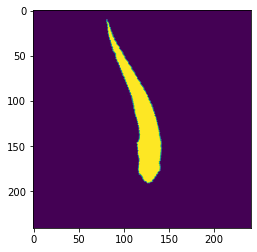

39089


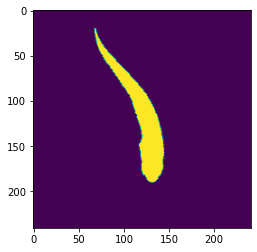

39090


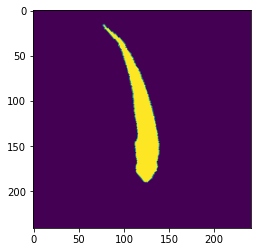

39093


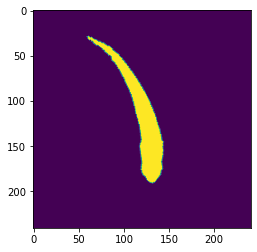

39094


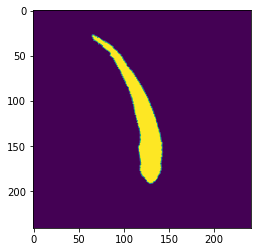

39118


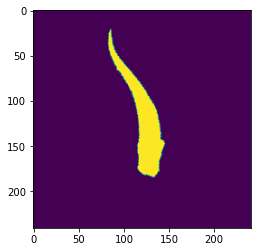

39119


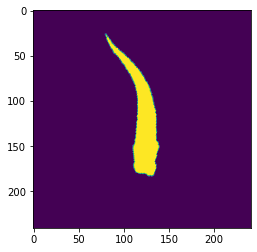

39240


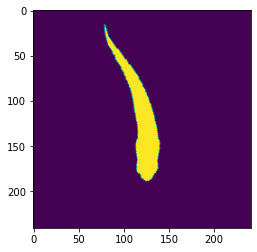

39242


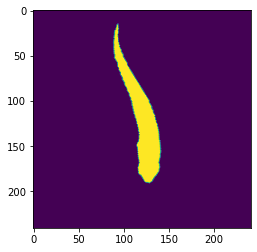

39243


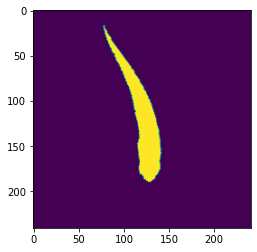

39245


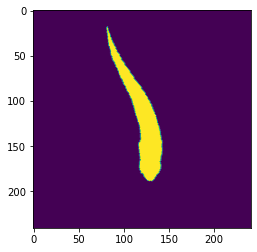

39247


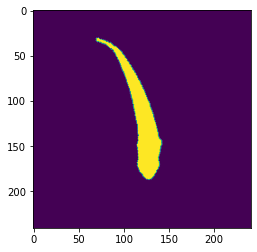

39248


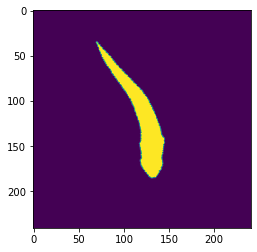

39252


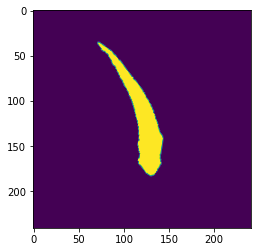

39287


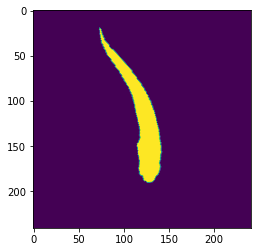

39291


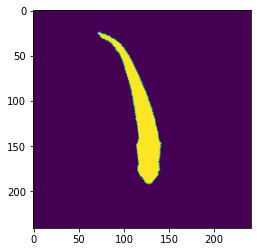

39292


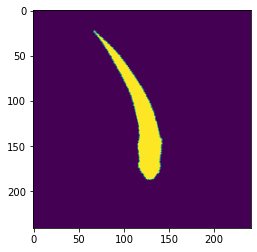

39332


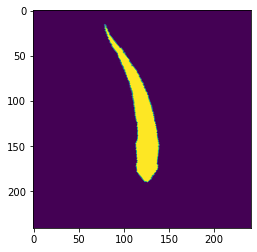

39334


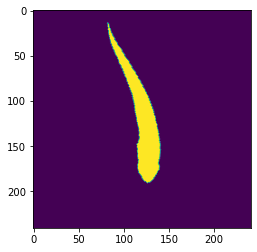

39336


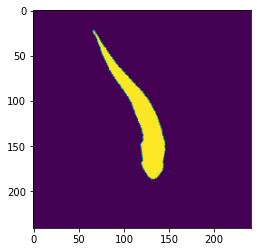

39380


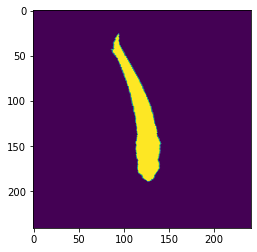

39385


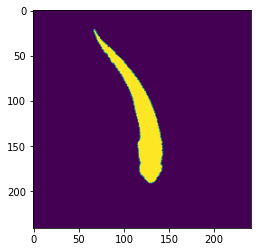

39390


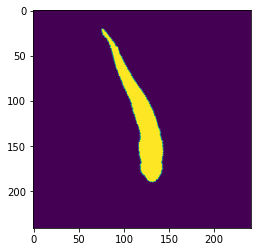

39435


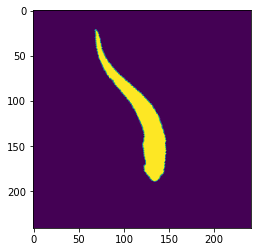

39473


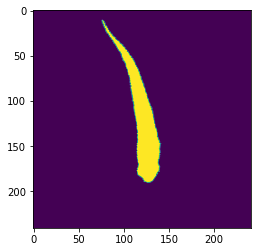

39477


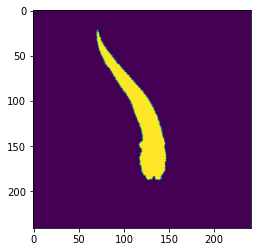

39504


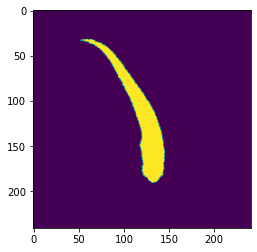

39509


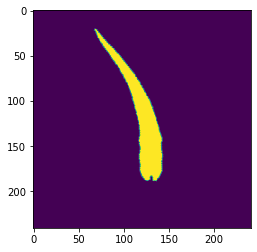

39513


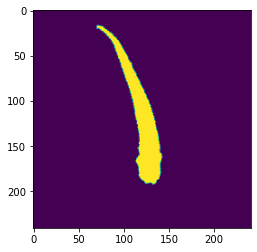

39514


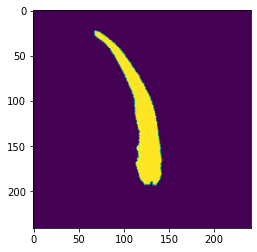

39517


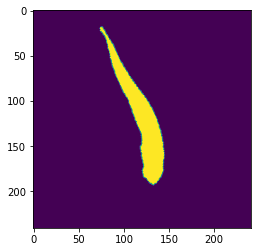

39523


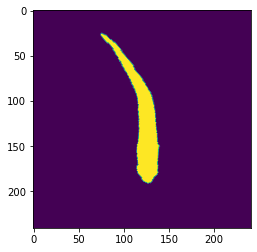

39538


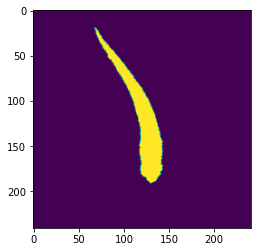

39563


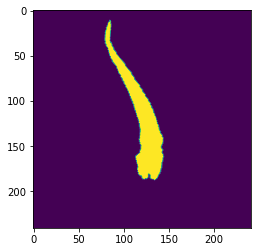

39567


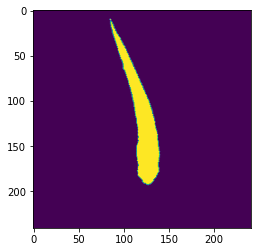

39568


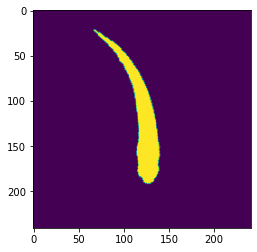

39588


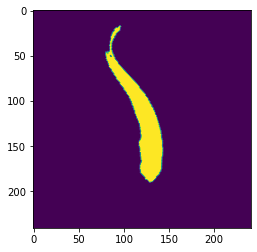

39590


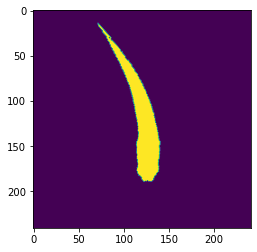

39591


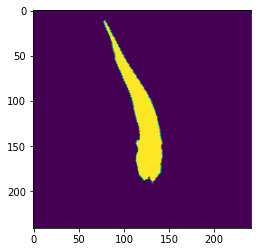

39595


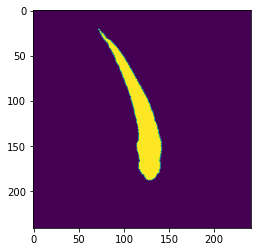

39629


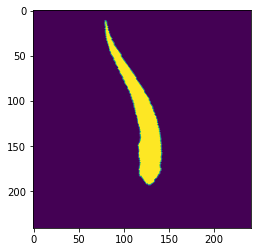

39631


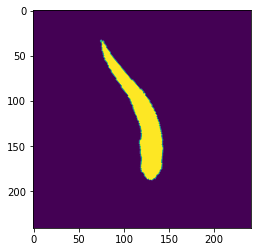

39636


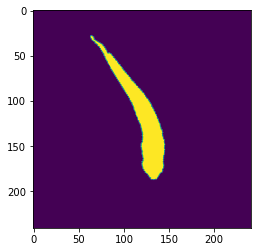

39676


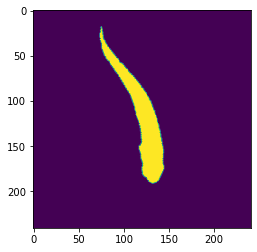

39678


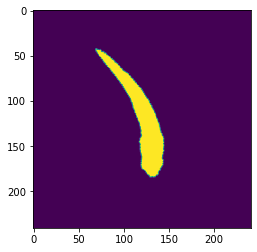

39679


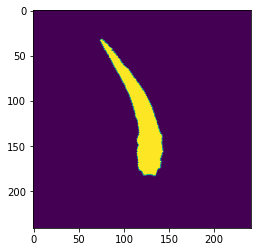

39680


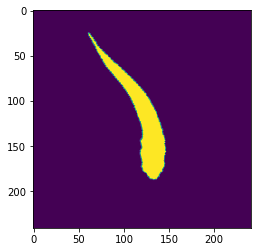

39714


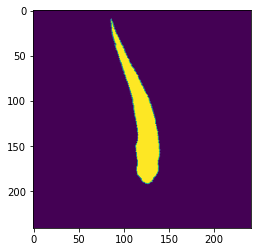

39715


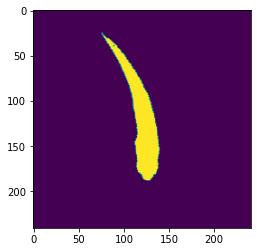

39718


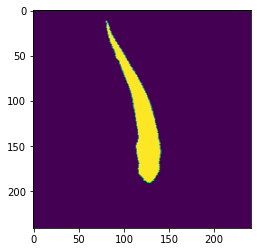

39755


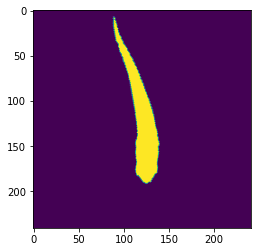

39757


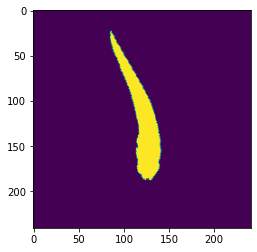

39758


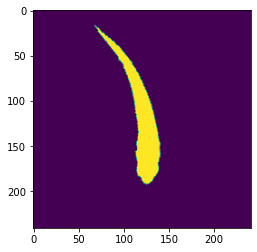

39792


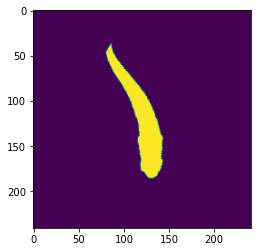

39793


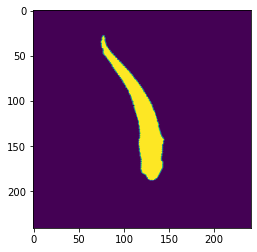

39799


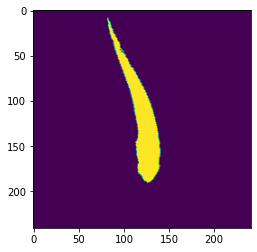

39800


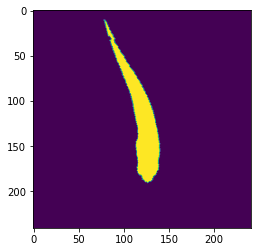

39804


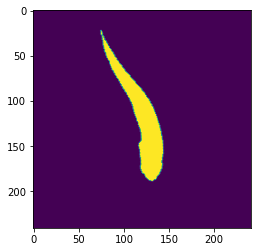

39836


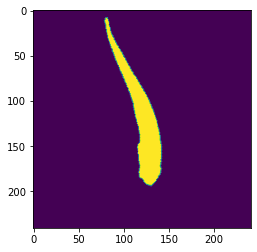

39840


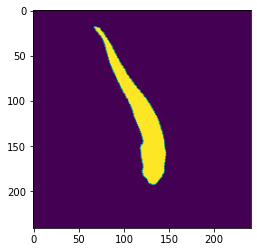

39873


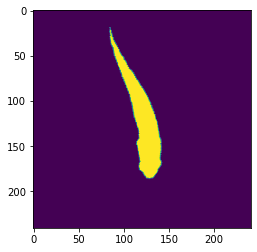

39875


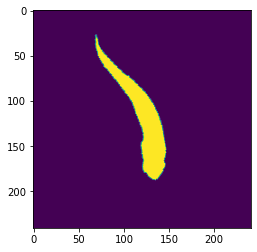

39877


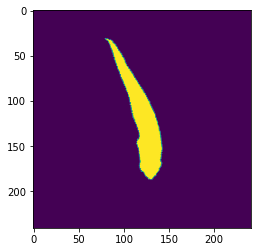

39892


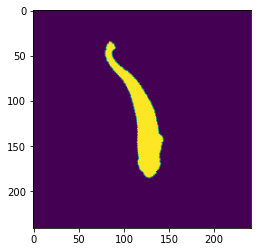

39898


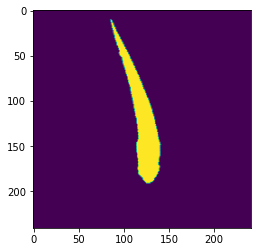

39900


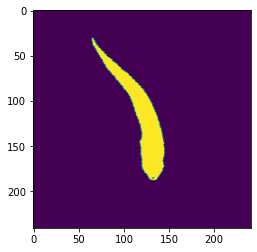

39925


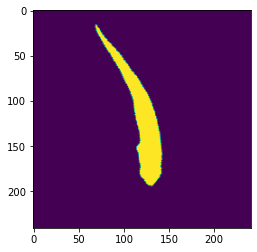

39926


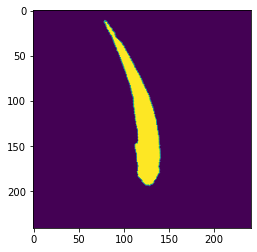

39953


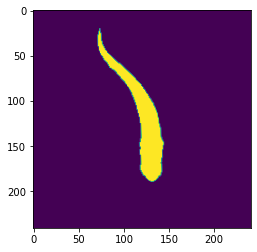

39969


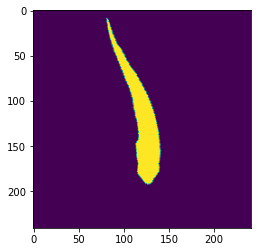

39970


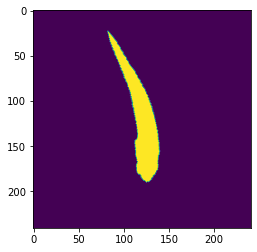

39971


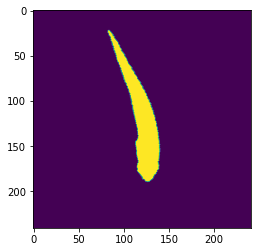

39972


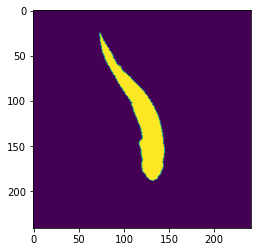

39974


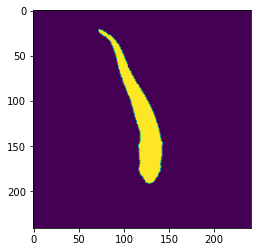

In [181]:
for s, label in enumerate(labels):
    if label == 22:
        plt.imshow(imgs[s])
        print(s)
        plt.show()

## summery the angle of each labels

In [ ]:
ans = [list() for _ in range(pos_kmeans.n_clusters)]
print(ans)
for s, label in enumerate(labels):
    ans[label].append(h_ans[s])
    
fig, axs = plt.subplots(pos_kmeans.n_clusters//2+1, 2, figsize=(10,60), dpi= 100)
bins = np.linspace(-np.pi, np.pi, num=10)
print(bins)

for s, t_ans in enumerate([ans[t] for t in ords]):
    axs[s//2, s%2].hist(x=t_ans, bins=bins)
    axs[s//2, s%2].title.set_text(f"{s}")


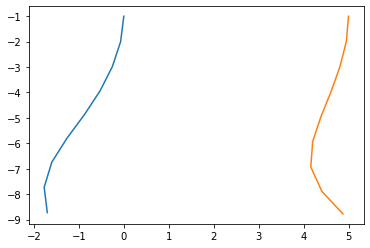

In [33]:
test = [15, 0]

for s, pcas in enumerate(centers[test]):
    sks = np.dot(pcas, pca.components_)
    sk=[np.array([0,-1])]
    for an in sks:
        M = get_rot_M(an).T
        sk.append(sk[-1]+np.dot(M,csk[0]))
    sk = np.array(sk)
    plt.plot(sk[:,0]+s*5,sk[:,1])
    n+=1

## summery the markov matrix

[0.13511224 0.00423549 0.0016942  0.158831   0.         0.01440068
 0.00211775 0.1270648  0.00042355 0.01355358 0.06649725 0.13087675
 0.00211775 0.         0.04786108 0.0008471  0.00042355 0.00296485
 0.25285896 0.         0.00042355 0.00804744 0.02498941 0.00423549
 0.00042355]
[0.13511224 0.00423549 0.0016942  0.158831   0.         0.01440068
 0.00211775 0.1270648  0.00042355 0.01355358 0.06649725 0.13087675
 0.00211775 0.         0.04786108 0.0008471  0.00042355 0.00296485
 0.25285896 0.         0.00042355 0.00804744 0.02498941 0.00423549
 0.00042355]


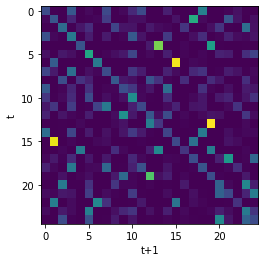

[1.47585611 0.65763246 1.10974108 1.89417153 0.20682333 2.49301633
 0.29755774 1.11207895 0.58860757 0.85551699 2.20275071 0.72762923
 0.70360357 0.31054778 1.25384184 0.38570028 0.29679592 0.63575891
 1.33958381 0.51300208 1.31174688 1.00889256 0.3469472  1.83841395
 1.43378319]


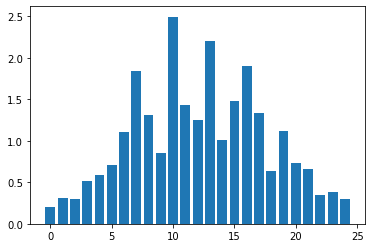

<BarContainer object of 25 artists>

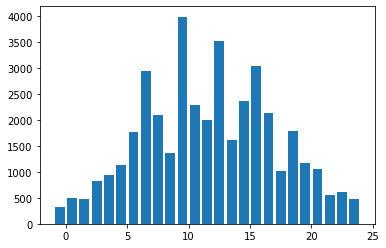

In [126]:
MK = np.zeros((pos_kmeans.n_clusters, pos_kmeans.n_clusters))
for s in range(1, len(labels)):
    label_now = labels[s]
    label_last = labels[s-1]
    
    MK[label_last, label_now] += 1
for s in range(pos_kmeans.n_clusters):
    MK[s, :] = MK[s, :]/np.sum(MK[s, :])

plt.imshow(MK[:,:])
plt.xlabel("t+1")
plt.ylabel('t')
arr = [0]*25
arr[0] = 1
print(np.dot(np.array(arr), MK))
print(MK[0,:])
plt.show()

u = [1]*25

for s in range(1000):
    u = np.dot(np.array(u), MK)

print(u)
plt.bar(np.arange(25), u[ords])
plt.show()
plt.bar(bins[:-1], nums[ords])

## 用 MK 產生序列

In [216]:
label_now = 10
new_seq = [label_now]
video = cv2.VideoWriter("MKtest.avi", cv2.VideoWriter_fourcc(*"MJPG"), 20, (cen_imgs[0].shape[0], cen_imgs[0].shape[1]), False)
for s in range(1000):
    #print(cen_imgs[label_now].shape)
    video.write(cen_imgs[label_now].astype(np.uint8))
    ran = np.random.rand()
    temp = 0
    for label_next, v in enumerate(MK[label_now, :]):
        temp += v
        if ran-0.001 < temp:
            label_now = label_next
            break
    new_seq.append(label_now)
    
video.release()

# get the speed

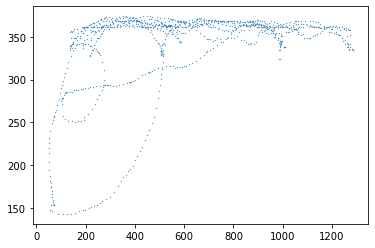

In [137]:
poses = np.array(poses)
plt.scatter(poses[9000:10000, 1], poses[9000:10000, 0], s=0.1)
velocity = (poses[1:]-poses[:-1])/2

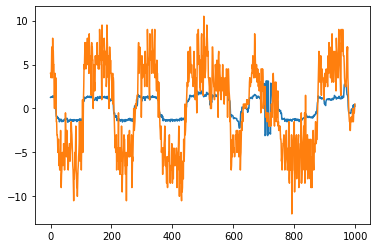

In [203]:
plt.plot(h_ans[8000:9000])
plt.plot(velocity[8000:9000, 1])

# 產生對應的side view

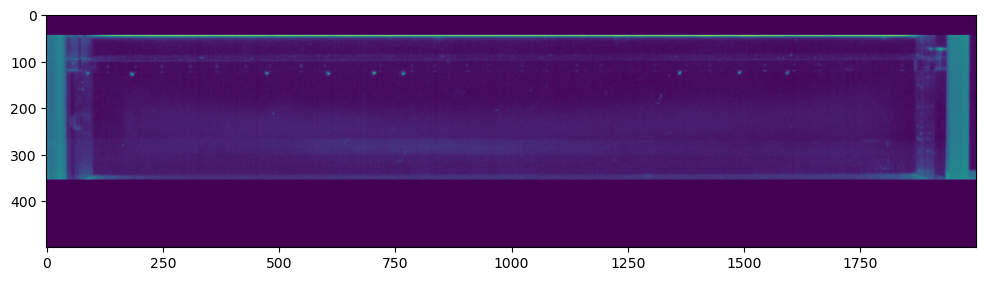

In [28]:
tnum = np.random.randint(data_len,size = int(data_len*0.1))
a = np.load(os.path.join(imgspath, flist[10]))
side_back = np.zeros(a.shape)
for s in tnum:
    a = np.load(os.path.join(imgspath, flist[s]))
    a = cv2.blur(a, ksize=(3, 3))
    side_back += a
side_back = side_back/len(tnum)
side_back = side_back.astype('uint8')
plt.figure(figsize=(12,8), dpi= 100)
plt.imshow(side_back)

aq_mask = np.full(a.shape, False)
aq_mask[45:355, ...] = True
plt.imshow(side_back*aq_mask)
aq_mask = np.where(aq_mask, 255, 0).astype('uint8')


-0.6


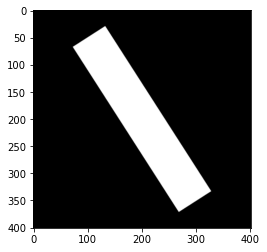

In [29]:

stand = np.zeros((401, 401, 3), dtype=np.uint8)
cv2.rectangle(stand, (20, 165), (380, 235), (255,255,255), -1)
M = cv2.getRotationMatrix2D((200, 200), (1)/(np.pi)*180, 1)
rotated = cv2.warpAffine(stand, M, (401,401))
stands = []
rot_an = []
level_lim = 50
for s in range(level_lim):
    an = (-1+(2*s/level_lim))
    M = cv2.getRotationMatrix2D((200, 200), an/(np.pi)*180, 1)
    stands.append(cv2.warpAffine(stand, M, (401,401)))
    rot_an.append(an)
plt.imshow(stands[10])
print(rot_an[10])

M = cv2.getRotationMatrix2D((200, 200), -rot_an[0]/(np.pi)*180, 1)
plt.imshow(cv2.warpAffine(stands[0], M, (401,401)))
plt.imshow(stands[0])

## multi ver

In [31]:
%%time
from multiprocessing import Pool
from numba import jit, njit

@jit(nogil=True)
def muti_img(filepath, mask=aq_mask, stands=stands, kernel=np.ones((3,3), np.uint8), rot_an=rot_an):
    
    raw = np.load(filepath)
    a = cv2.cvtColor(raw, cv2.COLOR_BAYER_BG2GRAY)
    diff = ((cv2.absdiff(a, side_back)>25)*255).astype('uint8')
    diff = cv2.bitwise_and(diff, diff, mask = aq_mask) #apply mask
    diff = cv2.erode(diff, kernel, iterations = 1)
    diff = cv2.dilate(diff, kernel, iterations = 7)
    diff = cv2.bitwise_and(diff, diff, mask = aq_mask) #apply mask
    
    a = cv2.cvtColor(raw, cv2.COLOR_BAYER_BG2RGB)
    side = cv2.bitwise_and(a, a, mask = diff)#apply mask
    img = cutting_img(side, get_pos(diff), size = 200)
    
    bacis = [0]*len(stands)
    for num, stand in enumerate(stands):
        bacis[num] = np.sum(np.logical_and(img ,stand))
    bigarg = np.argmax(bacis)
    an = -rot_an[bigarg]
    M = cv2.getRotationMatrix2D((200, 200), an/(np.pi)*180, 1)
    if bacis[bigarg] > 20000:
        img = cv2.warpAffine(img, M, (401,401))
    
#     bacis = [0]*len(stands)
#     for num, stand in enumerate(stands):
#         bacis[num] = np.sum(np.logical_and(img ,stand))
#     bigarg = np.argmax(bacis)
#     an = -rot_an[bigarg]
#     M = cv2.getRotationMatrix2D((200, 200), an/(np.pi)*180, 1)
#     img = cv2.warpAffine(img, M, (401,401))
    
    return img, an

with Pool() as pool:
    map_arr = []
    for s in range(data_len):
        path = os.path.join(imgspath, flist[s])
        map_arr.append(path)
    print("pool start")
    result = pool.map(muti_img, map_arr, chunksize=20)

sideviews = []
for re in result:
    sideviews.append(re[0])

<timed exec>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "muti_img" failed type inference due to: Untyped global name 'cutting_img': Cannot determine Numba type of <class 'function'>

File "<timed exec>", line 17:
<source missing, REPL/exec in use?>

<timed exec>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "muti_img" failed type inference due to: Untyped global name 'cutting_img': Cannot determine Numba type of <class 'function'>

File "<timed exec>", line 17:
<source missing, REPL/exec in use?>



pool start


<timed exec>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "muti_img" failed type inference due to: Untyped global name 'cutting_img': Cannot determine Numba type of <class 'function'>

File "<timed exec>", line 17:
<source missing, REPL/exec in use?>

<timed exec>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "muti_img" failed type inference due to: Untyped global name 'cutting_img': Cannot determine Numba type of <class 'function'>

File "<timed exec>", line 17:
<source missing, REPL/exec in use?>

<timed exec>:4: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "muti_img" failed type inference due to: Untyped global name 'cutting_img': Cannot determine Numba type of <class 'function'>

File "<timed exec>", line 17:
<source missing, REPL/exec in use?>

<timed exec>:4: NumbaWarning: 
Compilation is falling back to object m

<timed exec>:4: NumbaWarning: Code running in object mode won't allow parallel execution despite nogil=True.
/home/isis0517/anaconda3/envs/zebra/lib/python3.8/site-packages/numba/core/object_mode_passes.py:151: NumbaWarning: Function "muti_img" was compiled in object mode without forceobj=True.

File "<timed exec>", line 4:
<source missing, REPL/exec in use?>

  warnings.warn(errors.NumbaWarning(warn_msg,
/home/isis0517/anaconda3/envs/zebra/lib/python3.8/site-packages/numba/core/object_mode_passes.py:161: NumbaDeprecationWarning: 
Fall-back from the nopython compilation path to the object mode compilation path has been detected, this is deprecated behaviour.

For more information visit https://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit

File "<timed exec>", line 4:
<source missing, REPL/exec in use?>

  warnings.warn(errors.NumbaDeprecationWarning(msg,
<timed exec>:4: NumbaWarning: Code running in object mo

CPU times: user 1min 23s, sys: 39.6 s, total: 2min 3s
Wall time: 5min 15s


40000


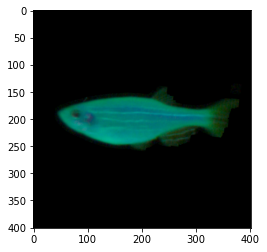

In [32]:

print(len(result))
img = result[5555]

plt.imshow(img)
plt.show()

np.savez("0421-sideviews.npz", sideviews)

# load the other vidoe

this data is hard to get the posture 

['frame_0.npy', 'frame_1.npy', 'frame_2.npy', 'frame_3.npy', 'frame_4.npy', 'frame_5.npy', 'frame_6.npy', 'frame_7.npy', 'frame_8.npy', 'frame_9.npy', 'frame_10.npy', 'frame_11.npy', 'frame_12.npy', 'frame_13.npy', 'frame_14.npy', 'frame_15.npy', 'frame_16.npy', 'frame_17.npy', 'frame_18.npy', 'frame_19.npy']


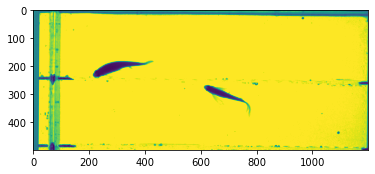

In [44]:
path2 = r"/media/isis0517/QVO2/0419/FaMb1/npy"
flist2 = os.listdir(path2)
temlist = []
for filename in flist2:
    if filename.split(".")[-1] == "npy":
        temlist.append(filename)

temlist.sort(key=lambda x: (x[0:2], len(x), x))
print(temlist[:20])
flist2 = temlist
a = np.load(os.path.join(path2,flist2[0]))
plt.imshow(a)

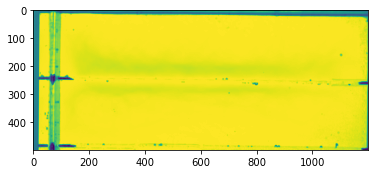

In [45]:

new_background = np.zeros(a.shape)
tnum = np.random.randint(len(flist2), size=int(len(flist2)*0.1))
for s in tnum:
    a = np.load(os.path.join(path2, flist2[s]))
    a = cv2.blur(a, ksize=(3, 3))
    new_background += a
    
new_background = new_background/len(tnum)
new_background = new_background.astype(np.uint8)
plt.imshow(new_background)

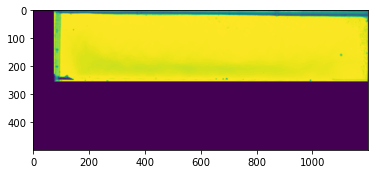

In [46]:
new_mask = np.full(new_background.shape, False)
new_mask[:255, 75:] = True
plt.imshow(new_background*new_mask)

In [ ]:
def an2vec(an, r):
    x = np.cos(an)
    y = np.sin(an)
    return r*np.array([x,y])

def get_rot_M(angle):
    a = np.cos(angle)
    b = np.sin(angle)
    return np.array([[a,-b],[b,a]])

def an2ori(an_sk, vec=np.array([0,1]), intens=1):
    test_sk = [vec]
    for i in range(len(an_sk)):
        vec = np.dot(vec,get_rot_M(an_sk[i]*intens))
        test_sk.append(test_sk[-1]+vec)

    return np.array(test_sk)

new_imgs = []
new_h_ans = []
new_poses = []
new_han_sks = []
for filename in tqdm(flist2[:]):
    img = np.load(os.path.join(path2, filename))
    img = cv2.absdiff(new_background, img)
    img = np.where(img>80, 255, 0).astype('uint8')
    pos = get_pos(img)
    new_poses.append(pos)
    img = cutting_img(img, pos, 150)
    
    try:
        sk = NT_skeleton(img)
    except Exception as e:
        print(s, e)
        continue
    
    v1 = sk[0]-sk[1]
    a = v1/np.linalg.norm(v1, ord=2)
    b = np.array([1, 0]) # this is the baseline vector
    c = a-b
    angle = 2*np.arcsin(np.linalg.norm(c/2))
    if a[1]>0:
        angle = -angle
    if angle != angle:
        print("算錯啦")
        print(sk)
    h_an = angle
    M = cv2.getRotationMatrix2D((150, 150), 180+angle/(np.pi)*180, 1)
    rotated = cv2.warpAffine(img, M, (301,301))
    
    try:
        sk = NT_skeleton(rotated)
    except Exception as e:
        print(s, e)
        continue
    
    vec_sk = []
    for i in range(len(sk)-1):
        vec_sk.append(sk[i+1]-sk[i])
    
    heading = vec_sk[0]
    han_sk=[]
    
    heading = heading/np.linalg.norm(heading)
    for vec in vec_sk[1:]:
        vec = vec/np.linalg.norm(vec)
        a = heading
        b = vec

        #根據和角公式 = sin(a-b) = sina cosb - cosa sinb
        #sin(angle) = a[1]b[0]-a[0]b[1]
        c = a-b
        angle = 2*np.arcsin(np.linalg.norm(c/2))
        if angle != angle:
            print("算錯啦")
            print(filename, vec_sk)
            draw = img.copy()
            cv2.circle(draw, (sk[0, 1], sk[0, 0]), 2, (0), -1)
            for n in range(len(sk)-1):
                cv2.line(draw, (sk[n, 1], sk[n, 0]), (sk[n+1, 1], sk[n+1, 0]), (0), 1)
            plt.imshow(draw)
            plt.show()
            continue
        err = a-np.dot(b, get_rot_M(angle))
        if np.linalg.norm(err) > 0.1:
            #print("turning", a, np.dot(b, get_rot_M(-angle)))
            angle=-angle
        han_sk.append(angle)   
    new_h_ans.append(h_an)
    new_imgs.append(rotated)
    new_han_sks.append(han_sk)
    
    
plt.imshow(imgs[120])

In [ ]:
_ = plt.hist(np.array(new_h_ans)/np.pi*180)

In [ ]:
s = 11603
img = np.load(os.path.join(path2, flist2[s]))
img = cv2.absdiff(new_background, img)
img = np.where(img>60, 255, 0).astype('uint8')
pos = get_pos(img)
new_poses.append(pos)
img = cutting_img(img, pos, 150)
sk = NT_skeleton(img, er_num=5, di_num=4)

draw = img.copy()
for n in range(len(sk)-1):
    cv2.line(draw, (sk[n, 1], sk[n, 0]), (sk[n+1, 1], sk[n+1, 0]), (0), 1)
    
vec_sk = []
for i in range(len(sk)-1):
    vec_sk.append(sk[i+1]-sk[i])

heading = vec_sk[0]
han_sk=[]

heading = heading/np.linalg.norm(heading)
for vec in vec_sk[1:]:
    vec = vec/np.linalg.norm(vec)
    a = heading
    b = vec

    #根據和角公式 = sin(a-b) = sina cosb - cosa sinb
    #sin(angle) = a[1]b[0]-a[0]b[1]
    c = a-b
    angle = 2*np.arcsin(np.linalg.norm(c/2))
    if angle != angle:
        print("算錯啦")
        print(filename, vec_sk)
        draw = imgs.copy()
        for n in range(len(sk)-1):
            cv2.line(draw, (sk[n, 1], sk[n, 0]), (sk[n+1, 1], sk[n+1, 0]), (0), 1)
        plt.imshow(draw)
        continue
    err = a-np.dot(b, get_rot_M(angle))
    if np.linalg.norm(err) > 0.1:
        #print("turning", a, np.dot(b, get_rot_M(-angle)))
        angle=-angle
    han_sk.append(angle)
plt.imshow(draw)
#plt.plot(*np.flip(sk, axis=1).T, lw=1.3, color='r')
#plt.axis('off')
#plt.imshow(np.load(os.path.join(imgspath, flist[s+data_len])))


In [ ]:
from sklearn.decomposition import PCA
new_pca = PCA(n_components=3)
new_pca.fit(new_han_sks)
pc1 = new_pca.components_[0]
u = np.array([0,-1])
n=0
for pcs in new_pca.components_:
    sk = [u]
    pcs = pcs*1
    for an in pcs:
        M = get_rot_M(an).T
        sk.append(sk[-1]+np.dot(M,u))
    sk = np.array(sk)
    plt.plot(sk[:,0]+n*5,sk[:,1])
    n+=1
print(new_pca.explained_variance_ratio_, np.sum(pca.explained_variance_ratio_))

pca_sks = new_pca.transform(new_han_sks)

In [ ]:
s = 2981
img = np.load(os.path.join(path2, flist2[s]))
plt.imshow(img*new_mask)

## generate the origin(database, no interact) path

In [58]:
#%%time
back = np.zeros((side_back.shape[0]*5, side_back.shape[1], 3), dtype='uint8')
geter = ImgGetor(cen_set, B=6000)

video = cv2.VideoWriter("output_new.avi", cv2.CAP_FFMPEG, cv2.VideoWriter_fourcc(*"MJPG"), 20, (back.shape[1], back.shape[0]))

for s in range(30):
    img = np.full(back.shape, 0, dtype='uint8')
    #print(img.shape)
    video.write(img)

video_poses = []
back[400:,:,:]=255
    
rand_ints = np.random.rand(100000)
for s, label in enumerate(tqdm(labels[0:10000])):
    ind = geter.label2img(label)
    img = sideviews[ind].copy()
    pos = (200,poses[s][1])
    img = glue_img(img, pos, back)
    img = cv2.putText(img, f"{ind}", (20,20), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (200,200,200), 1)
    video.write(img)
    video_poses.append(pos)
    
    
for s in range(30):
    img = np.full(back.shape, 0, dtype='uint8')
    #print(img.shape)
    video.write(img)
video.release()
np.save("video_poses", video_poses)
print(len(set(labels)))

  0%|          | 0/10000 [00:00<?, ?it/s]

180


## Adding the start singal with larger size

In [ ]:
#%%time
new_pca_sks = pca.transform(new_han_sks)
new_merge_arr = np.concatenate((np.expand_dims(new_h_ans, axis=1), new_pca_sks), axis=1)
new_labels = kmeans.predict(new_merge_arr)
back = np.zeros((side_back.shape[0]*5, side_back.shape[1], 3), dtype='uint8')
geter = ImgGetor(cen_set, B=6000)

video = cv2.VideoWriter("output_new.avi", cv2.CAP_FFMPEG, cv2.VideoWriter_fourcc(*"MJPG"), 30, (back.shape[1], back.shape[0]))

for s in range(30):
    img = np.full(back.shape, 0, dtype='uint8')
    #print(img.shape)
    video.write(img)

video_poses = []

back[400:,:,:]=255
rand_ints = np.random.rand(len(new_labels))
for s, label in enumerate(tqdm(new_labels)):
    ind = geter.label2img(label, rat=rand_ints[s])
    img = sideviews[ind].copy()
    pos = (200, int((new_poses[s][1]/new_background.shape[1])*side_back.shape[1]//10*8 + 100 ))
    img = glue_img(img, pos, back)
    img = cv2.putText(img, f"{ind}", (20,20), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (200,200,200), 1)
    video.write(img)
    video_poses.append(pos)
    
    
for s in range(30):
    img = np.full(back.shape, 0, dtype='uint8')
    #print(img.shape)
    video.write(img)
    
video.release()

np.save("video_poses", video_poses)
print(len(set(new_labels)))

# t-sne

In [ ]:

%%time
loadding = np.load("0419-sideviews.npz")

sideviews = loadding["arr_0"]

from sklearn import manifold

X = [cv2.cvtColor(x, cv2.COLOR_RGB2GRAY).flatten() for x in sideviews]
Tsne = manifold.TSNE(n_components=2, init='random', verbose=2)
t_lables = Tsne.fit_transform(X)

In [ ]:
#plt.scatter(*t_lables.T, s=0.1)

arr = []

for s, label in enumerate(t_lables):
    if label[0]<72 and label[0]>71 and label[1]<-37 and label[1]>-38:
        arr.append(s)
        print(s)
        plt.imshow(sideviews[s])
        plt.show()
print(t_lables[8759])